In [1]:
import urllib
import re
import numpy as np
import pandas as pd
from astropy.io import ascii
from astropy.table import Table, QTable, Column
from astroquery.sdss import SDSS

import seaborn as sns
import pandas as pd
import time

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def makeSDSS_post_request(sSQL_query,DR_num):
    ''' function based on work by Aaron Deich '''
    values = {'cmd': sSQL_query, 'format': 'csv'}
    data = urllib.parse.urlencode(values)
    if DR_num <= 7 :
        sURL = 'http://cas.sdss.org/dr7/en/tools/search/x_sql.asp'
        first_character = 0
    else : 
        sURL = 'http://skyserver.sdss3.org/public/en/tools/search/x_sql.aspx'
        first_character = 8 # to eliminate the line that says #Table1
    response = urllib.request.urlopen(sURL+'?%s' % data)
    return str(response.read()[first_character:])

In [3]:
atlas3d_earlytype = pd.read_csv("atlas3d_260_earlytype_galaxies.csv") # 260 galaxies
atlas3d_spiral = pd.read_csv("atlas3d_611_spiral_galaxies.csv") # 611 galaxies

columnsNamesArr = atlas3d_earlytype.columns.values
column_names = list(columnsNamesArr)
print(column_names[0:])

['galaxy', 'RA', 'DEC', 'SBF', 'ned-d', 'virgo', 'vhel', 'distance', 'm_k', 'a_b', 't-type', 'log(re)']


In [4]:
df_dr7 = pd.read_csv('confirmed_compact_galaxies_all_info_dr7.csv')
objid_known_dr7 = df_dr7['objid']

In [5]:
# add both sets of galaxies from astlas3D into one
host = np.concatenate((np.array(atlas3d_earlytype['galaxy']),np.array(atlas3d_spiral['galaxy'])))
ra_host = np.concatenate((np.array(atlas3d_earlytype['RA']),np.array(atlas3d_spiral['RA'])))
dec_host = np.concatenate((np.array(atlas3d_earlytype['DEC']),np.array(atlas3d_spiral['DEC'])))
host_dist = np.concatenate((np.array(atlas3d_earlytype['distance']),np.array(atlas3d_spiral['distance'])))

In [6]:
querylist = []
radial_dist = 150
max_size = 500
arcmin_total = []
for i in range(len(host)):
    ra = ra_host[i]
    dec = dec_host[i]
    arcmin =  radial_dist/(host_dist[i]*1000)  *360/(2*np.pi)*3600/60 # arcmin
    arcsec_to_pc = host_dist[i] * 1e6 / 3600 * 2 * np.pi / 360
    mag_calc = 5*np.log10((host_dist[i]*1e6/10))
    arcmin_total.append(arcmin)   
    query_temp = f"select p.objID, p.ra, p.dec, p.g, p.i, p.r, p.u, p.z, p.type, p.petroR50_r, p.petroR90_r, p.fracDeV_r, p.deVRad_r, p.expRad_r, z1.z as photo_z, p.expAB_r\
        from photoObj as p JOIN Photoz as z1 on p.objID = z1.objID, dbo.fGetNearbyObjEq({ra},{dec},{arcmin}) as n \
        where p.objID = n.objID and p.type = 3 and p.g - p.r BETWEEN 0.35 and 1 and p.g - p.i BETWEEN 0.65 and 1.5 and p.u - p.z BETWEEN 2.2 and 4 and p.g - p.z BETWEEN 1 and 1.85 and p.u - p.g BETWEEN 1 and 2.4 and p.r - {mag_calc} > -18.5 and p.r - {mag_calc} < -12 and (p.fracDeV_r *  p.deVRad_r + (1 - p.fracDev_r) * p.expRad_r) * {arcsec_to_pc} < {max_size} and p.fracDev_r > 0.5 and z1.z < 0.15 and z1.z > -0.1 "
    querylist.append(query_temp)
print(querylist[292])

select p.objID, p.ra, p.dec, p.g, p.i, p.r, p.u, p.z, p.type, p.petroR50_r, p.petroR90_r, p.fracDeV_r, p.deVRad_r, p.expRad_r, z1.z as photo_z, p.expAB_r        from photoObj as p JOIN Photoz as z1 on p.objID = z1.objID, dbo.fGetNearbyObjEq(4.43969,11.450358,28.333077781194557) as n         where p.objID = n.objID and p.type = 3 and p.g - p.r BETWEEN 0.35 and 1 and p.g - p.i BETWEEN 0.65 and 1.5 and p.u - p.z BETWEEN 2.2 and 4 and p.g - p.z BETWEEN 1 and 1.85 and p.u - p.g BETWEEN 1 and 2.4 and p.r - 31.300356939925376 > -18.5 and p.r - 31.300356939925376 < -12 and (p.fracDeV_r *  p.deVRad_r + (1 - p.fracDev_r) * p.expRad_r) * 88.23608996193555 < 500 and p.fracDev_r > 0.5 and z1.z < 0.15 and z1.z > -0.1 


In [9]:
ind = np.argmax(arcmin_total)
print(ind)
print(querylist[293])

293
select p.objID, p.ra, p.dec, p.g, p.i, p.r, p.u, p.z, p.type, p.petroR50_r, p.petroR90_r, p.fracDeV_r, p.deVRad_r, p.expRad_r, z1.z as photo_z, p.expAB_r        from photoObj as p JOIN Photoz as z1 on p.objID = z1.objID, dbo.fGetNearbyObjEq(10.68471,41.268749,736.6600223110584) as n         where p.objID = n.objID and p.type = 3 and p.g - p.r BETWEEN 0.35 and 1 and p.g - p.i BETWEEN 0.65 and 1.5 and p.u - p.z BETWEEN 2.2 and 4 and p.g - p.z BETWEEN 1 and 1.85 and p.u - p.g BETWEEN 1 and 2.4 and p.r - 24.225490200071285 > -18.5 and p.r - 24.225490200071285 < -12 and (p.fracDeV_r *  p.deVRad_r + (1 - p.fracDev_r) * p.expRad_r) * 3.393695767766752 < 500 and p.fracDev_r > 0.5 and z1.z < 0.15 and z1.z > -0.1 


In [8]:
objid_list_dr7 = [] 
ra_list_dr7 = [] 
dec_list_dr7 = []
obj_per_search_dr7 = []
petro_r50_list_dr7 = []
petro_r90_list_dr7 = []
fracdev_list_dr7 = []
fracexp_list_dr7 = []
devrad_list_dr7 = []
exprad_list_dr7 = []
r_mag_list_dr7 = []
g_mag_list_dr7 = []
i_mag_list_dr7 = []
u_mag_list_dr7 = []
z_mag_list_dr7 = []
z_list_dr7 = []
axis_ratio_list_dr7 = []
start = time.time()


for i in range(len(host)):
    if i == 293:
        continue 
    sdss_data_string = makeSDSS_post_request(querylist[i],7)
    print(i)
    print(sdss_data_string)
    print((re.split(r'[,\\n]',sdss_data_string)))
    N_col = 16
    # note the N_Col+1 instances below are because of extra whitespaces :
    sdss_data = np.array(re.split(r'[,\\n]',sdss_data_string)[N_col+1:-1]).reshape(-1,N_col+1)[:,:N_col]
    print(sdss_data)
        
    objid_list_dr7.extend(sdss_data[:,0].astype(np.int64))  
    ra_list_dr7.extend(sdss_data[:,1].astype('float'))
    dec_list_dr7.extend(sdss_data[:,2].astype('float')) 
    petro_r50_list_dr7.extend(sdss_data[:,9].astype('float'))
    petro_r90_list_dr7.extend(sdss_data[:,10].astype('float'))
    fracdev_list_dr7.extend(sdss_data[:,11].astype('float'))
    fracexp_list_dr7.extend(1 - sdss_data[:,11].astype('float'))
    devrad_list_dr7.extend(sdss_data[:,12].astype('float'))
    exprad_list_dr7.extend(sdss_data[:,13].astype('float'))
    r_mag_list_dr7.extend(sdss_data[:,5].astype('float'))
    g_mag_list_dr7.extend(sdss_data[:,3].astype('float'))
    i_mag_list_dr7.extend(sdss_data[:,4].astype('float'))
    u_mag_list_dr7.extend(sdss_data[:,6].astype('float'))
    z_mag_list_dr7.extend(sdss_data[:,7].astype('float'))
    z_list_dr7.extend(sdss_data[:,14].astype('float'))
    axis_ratio_list_dr7.extend(sdss_data[:,15].astype('float'))
    obj_per_search_dr7.append((len(sdss_data[:,0].astype(np.int64))))
    

objid_dr7 = np.array(objid_list_dr7)
ra_dr7 = np.array(ra_list_dr7)
dec_dr7 = np.array(dec_list_dr7)
petro_r50_dr7 = np.array(petro_r50_list_dr7)
petro_r90_dr7 = np.array(petro_r90_list_dr7)
fracdev_dr7 = np.array(fracdev_list_dr7) 
fracexp_dr7 = np.array(fracexp_list_dr7) 
devrad_dr7 = np.array(devrad_list_dr7) 
exprad_dr7 = np.array(exprad_list_dr7) 
r_mag_dr7 = np.array(r_mag_list_dr7) 
g_mag_dr7 = np.array(g_mag_list_dr7)
i_mag_dr7 = np.array(i_mag_list_dr7)
u_mag_dr7 = np.array(u_mag_list_dr7)
z_mag_dr7 = np.array(z_mag_list_dr7)
g_i_mag_dr7 = g_mag_dr7 - i_mag_dr7
z_dr7 = np.array(z_list_dr7)
axis_ratio_dr7 = np.array(axis_ratio_list_dr7)
end = time.time()
print(f"Runtime of the program is {end - start}")

0
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725074458280306,146.26868136,-0.22855896,20.517128,19.373007,19.751259,22.302031,19.267576,3,1.558236,3.979265,0.765894,2.489319,1.547899,0.043683,0.30537\n587725074458345695,146.4905517,-0.3693299,17.669218,16.26722,16.748014,19.195881,15.930221,3,2.503357,8.006309,1,2.551543,1.508991,0.136035,0.837592\n587725074458345622,146.35600456,-0.33571667,19.386694,18.48436,18.821987,20.948723,18.339367,3,1.158642,3.110625,1,0.909506,0.767505,0.046808,0.712102\n587725074458345628,146.36542047,-0.3435447,17.603046,16.193396,16.71048,19.40572,15.836063,3,2.184624,5.798981,0.591905,4.171904,2.584714,0.076093,0.338863\n587725074458476735,146.68785924,-0.289289,18.24239,17.013451,17.432522,20.408764,16.803146,3,0.713674,1.624138,1,0.213469,0.282321,0.055041,0.300472\n587725074458476974,146.67655013,-0.29879397,20.595695,19.350887,19.77405,22.055712,19.105997,3,1.119006,3.035487,0.66498,0.810463,0.6

1
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588297864722776091,153.14321361,43.22269187,19.125418,17.801786,18.209606,20.811161,17.44495,3,1.086696,2.967218,1,0.642523,0.556335,0.110476,0.87663\n588297864722776212,153.24834154,43.27438449,19.043854,17.782732,18.200363,20.694321,17.54896,3,1.43786,3.246421,0.520637,1.717137,1.228303,0.104244,0.692125\n588297864722776463,153.14403788,43.26191252,20.840137,19.533556,19.932596,22.440361,19.062771,3,1.195772,2.536104,0.642998,1.370975,1.075649,0.088172,0.439135\n587734622714658951,153.39782406,42.98567418,19.710258,19.025564,19.222795,21.070541,18.54423,3,1.550556,4.270234,1,1.492887,0.990678,0.050932,0.424952\n588297864722841749,153.36147178,43.17192111,19.438744,18.095514,18.513939,20.916813,17.747541,3,1.498936,3.591791,0.620101,1.562696,1.068979,0.142201,0.921035\n588297864722841759,153.30278725,43.28778206,19.014866,17.952219,18.396362,20.133291,17.74246,3,1.752375,4.275299,0.58716

3
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732770515451937,175.10913088,9.08370092,17.502457,16.071863,16.526283,19.454058,15.736958,3,2.043773,6.195407,0.979837,2.412477,1.501722,0.092023,0.882037\n587732770515452287,175.09000603,9.10315898,21.110117,19.963095,20.339754,22.976547,19.619013,3,0.770068,1.647292,0.848748,0.373372,0.433315,0.046642,0.421103\n587734891677220992,175.08872962,8.88535985,17.448111,16.052574,16.497536,19.454506,15.723416,3,2.100799,6.265943,1,2.823066,1.891751,0.075995,0.508085\n587734891677221000,174.95960001,8.98874176,19.445093,17.983889,18.474289,21.118546,17.649923,3,1.607826,3.867096,0.765626,1.570188,1.053651,0.136433,0.930876\n587734891677286489,175.18622099,8.96964568,17.936985,16.581089,17.01626,19.779718,16.25329,3,1.622916,4.093513,0.811855,1.668666,1.214259,0.079535,0.836276\n587732770515321063,174.84673505,9.09062122,20.606205,19.346991,19.683002,22.310734,19.051895,3,0.979779,2.552593,0.

4
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742955471175760,185.34110758,5.72150816,19.133217,18.021591,18.400225,20.364017,17.728586,3,1.573942,4.002006,0.655266,1.612971,1.072687,0.12788,0.928298\n587742955471175767,185.36098355,5.80857604,19.389151,18.037865,18.469584,21.091434,17.747408,3,1.713749,5.163509,1,1.314886,0.842204,0.115717,0.885572\n587742955471175773,185.36504469,5.81450416,19.645817,18.319736,18.709249,21.205395,18.00573,3,1.16219,2.707979,0.538124,0.934576,0.935982,0.127589,0.402232\n587742955471175816,185.3572998,5.80964652,19.817005,18.390963,18.821011,21.599033,18.053923,3,1.214243,2.755999,0.794253,0.943717,0.835047,0.121938,0.675459\n587742955471175835,185.44780669,5.72155169,20.565899,19.189894,19.580294,22.143972,18.914625,3,1.032395,2.450351,0.976311,0.452517,0.497074,0.149393,0.877681\n587742955471176031,185.34848035,5.81287054,21.209185,19.779648,20.225641,23.103313,19.708321,3,1.118753,2.638602,0.92

5
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726033875697685,217.78797155,3.01794434,20.181643,19.204082,19.346838,21.483988,18.989441,3,2.683162,6.75079,0.523695,5.691044,2.364255,0.09067,0.614964\n587726033875763357,217.91777739,3.03167431,18.512306,17.390591,17.732111,20.271648,17.169916,3,1.051523,2.727724,1,0.752805,0.766248,0.081171,0.412562\n587729157902893312,218.03013997,3.27069771,18.082483,17.000738,17.418385,19.362484,16.807695,3,1.687531,4.294793,0.647691,2.387245,1.854413,0.110249,0.340565\n587726016159154423,217.64178589,2.75617914,20.488344,19.161896,19.554581,22.185585,18.884748,3,0.99675,2.389655,0.909562,0.720945,0.678436,0.115231,0.513981\n587726016159154473,217.74388983,2.78355534,19.665794,18.249796,18.694477,21.553101,17.922676,3,1.346623,3.1355,0.713771,1.392097,0.987402,0.101527,0.838063\n587726016159219868,217.81101318,2.87000526,20.122671,19.022139,19.342531,22.268833,18.819424,3,0.755536,2.030695,1,0.1

6
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017571384721950,189.97596566,12.99522287,21.42528,20.635832,20.919758,22.812569,20.359554,3,0.951145,2.23233,0.920201,0.733195,0.65325,0.048298,0.544349\n588017571384656080,189.89379628,12.97550905,19.976006,18.782755,19.176952,21.411676,18.525719,3,1.017699,2.498522,0.788303,0.807864,0.691088,0.120998,0.662842\n588017571384656113,189.84368026,12.95300426,21.008688,20.01149,20.291027,22.244217,19.783598,3,0.764309,1.762722,1,0.245821,0.286207,0.097689,0.996603\n588017571384656297,189.77347442,12.93220015,21.596523,20.445572,20.749838,22.886988,20.032854,3,0.992834,2.281863,0.783305,0.968949,0.757921,0.140085,0.520342\n588017704008483165,189.87330369,12.81980216,20.883968,19.733141,20.016617,22.172411,19.447552,3,1.141212,2.699353,0.582866,1.103399,0.785125,0.124656,0.822964\n588017571384656335,189.78190675,12.97582585,21.798931,20.421982,20.860985,23.311037,20.020416,3,0.849536,1.92205

19
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
20
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587747981131579630,42.69565242,-1.76843225,19.631771,18.868649,19.085974,20.861883,18.611006,3,0.860828,1.846693,1,0.33874,0.398505,0.031635,0.894749\n587747981131579416,42.67216565,-1.81548828,20.434225,19.629351,19.788767,21.724901,19.149343,3,0.992822,2.410442,1,0.54168,0.534488,0.071285,0.993871\n587747981131579856,42.68800799,-1.80265578,21.367731,19.972816,20.396311,22.918324,19.5389,3,1.290403,3.361445,0.505257,2.066886,1.215564,0.130895,0.526971\n587747981131645030,42.72953601,-1.65138332,18.732924,17.464935,17.872044,20.679869,17.117935,3,1.843275,5.529454,1,1.887043,1.197838,0.045552,0.864244\n587747981131645036,42.73660457,-1.65035208,18.656698,17.415815,17.820089,20.349499,17.040442,3,1.46236,3.994462,0.799187,1.501316,1.211167,0.071004,0.688828\n587747981131514064,42.65103809,-1.87300086,19.680872,18

21
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
22
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
23
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
24
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
25
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758887368099430779,72.04648132,-5.44367724,18.579058,17.248541,17.645678,20.511984,16.906664,3,1.825999,4.799102,0.866694,2.068367,1.344213,0.083173,0.729782\n758887368099430641,72.04621537,-5.37806479,21.181597,20.080248,20.515745,22.700895,20.074749,3,0.862319,2.281033,1,0.211233,0.262445,0.099312,0.085019\n758887368099430837,72.08116856,-5.3918361,18.778753,17.447477,17.867588,20.661795,17.147785,3,1.373266,3.548038,0.924121,1.270885,1.031384,0.076923,0.58631\n758887368099431115,72.03990662,-5.42493054,21.070911,20.086721,20.273285,22.235836,19.71619,3,0.961815,2.157262,0.929225,0.38579

26
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734622162911335,119.29590876,23.78970835,20.177811,19.014191,19.345646,21.489445,18.855404,3,1.837578,5.541538,1,1.646753,0.972384,0.12198,0.770014\n587734622162780857,119.20330646,23.54992236,21.298674,20.381975,20.506308,23.165051,19.971321,3,1.983701,3.983873,0.576652,3.054912,1.695745,0.076164,0.602749\n587734622162977165,119.44706426,23.99031941,17.710941,16.27599,16.742222,19.779266,15.893176,3,1.826086,5.125977,0.859486,2.456637,1.77858,0.079864,0.463178\n587734840669176123,119.39592524,23.63782493,19.466698,18.423803,18.834158,20.538967,18.164955,3,1.244694,3.108534,1,0.895328,0.66556,0.119721,0.971162\n587734622162780880,119.12027859,23.65561156,20.848789,19.746401,20.11912,21.978685,19.701883,3,0.985959,2.445894,0.799069,0.5803,0.532922,0.123245,0.762727\n587734840669176126,119.42080851,23.61509853,17.649807,16.287447,16.75474,19.107351,15.919924,3,2.42053,6.24517,0.699677,3

28
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738371135307888,125.86278458,22.52034014,19.093979,18.008039,18.412161,20.324301,17.747,3,1.870158,5.118315,0.55467,3.723509,2.120102,0.110216,0.209671\n587738371672047953,125.49942345,22.5693079,18.640409,17.476175,17.790401,20.687119,17.252216,3,0.748477,1.721996,1,0.271354,0.354811,0.105562,0.323309\n587738946660728962,125.59068799,22.42348981,18.646158,17.369862,17.851694,20.335474,17.112593,3,2.224773,6.04713,0.716373,3.388874,1.968816,0.098237,0.472257\n587738946660794547,125.66752612,22.44412397,17.392565,16.019327,16.446562,19.261589,15.671296,3,2.311581,5.490266,0.729069,2.7554,1.92419,0.08717,0.890814\n587738946660794548,125.67719627,22.43021893,20.167061,19.251148,19.632614,21.312143,19.003111,3,1.031925,2.590074,0.914868,0.39546,0.458124,0.076439,0.843375\n587738946660860195,125.83625832,22.64399354,19.845943,18.604357,19.095942,21.21838,18.309742,3,1.162834,2.746513,0.943

29
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588016879364342338,126.73675919,26.02546594,20.034815,18.979654,19.270741,21.223284,18.939543,3,2.173211,5.737148,0.580119,4.268129,2.168151,0.089805,0.302247\n588016840709439806,126.98633099,26.0493219,17.707676,16.392782,16.85117,19.408367,16.063364,3,2.08212,6.159649,0.828142,2.853702,1.784008,0.078536,0.773101\n588016840709308745,126.74033739,25.76645556,19.186689,17.700573,18.193491,21.234232,17.364803,3,0.974904,2.809918,1,0.768706,0.648058,0.08451,0.521223\n588016840709505031,126.95854872,26.10409034,18.463995,17.035849,17.695135,20.488523,16.690102,3,1.686805,4.580327,0.619751,2.5636,1.450358,0.084689,0.710724\n588016840709505252,126.97015801,26.08401899,18.01333,16.994438,17.333639,19.690342,16.688005,3,1.352871,4.202791,1,1.155062,0.819414,0.055239,0.84312\n588016878827536625,126.95078575,25.84338948,20.693417,19.550436,19.979473,21.982941,19.33077,3,0.950189,2.20459,0.683663,0

30
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588016840709373993,126.81658497,25.80859041,20.587847,19.195358,19.758707,21.708492,18.955902,3,0.913417,2.204132,0.984451,0.792245,0.700929,0.135964,0.357477\n588016840709374438,126.75863874,25.92561273,21.069111,20.085716,20.335968,22.197481,19.771132,3,0.930144,2.184408,0.589999,0.811799,0.700663,0.095469,0.432734\n588016840709308745,126.74033739,25.76645556,19.186689,17.700573,18.193491,21.234232,17.364803,3,0.974904,2.809918,1,0.768706,0.648058,0.08451,0.521223\n588016840709505252,126.97015801,26.08401899,18.01333,16.994438,17.333639,19.690342,16.688005,3,1.352871,4.202791,1,1.155062,0.819414,0.055239,0.84312\n588016878827536420,127.06594332,25.78188172,20.304449,19.044046,19.386803,21.433163,18.961027,3,1.56501,3.936385,1,1.472246,1.006379,0.093578,0.626449\n588016840709308796,126.63167218,25.85970444,20.652105,19.377182,19.700962,22.067078,18.998768,3,0.956443,2.060179,0.663596,0.

31
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735240101528179,132.83300174,30.87712803,21.202925,19.895781,20.388161,22.433336,19.500278,3,1.411,3.518651,1,1.262488,1.015844,0.111971,0.439967\n587735240101527828,132.91770316,30.81691658,18.85915,17.770452,18.187424,20.361227,17.656487,3,2.512501,8.351087,0.84555,3.558138,1.677557,0.104991,0.691356\n587735042540175505,132.86952754,30.6929576,20.650497,19.459311,19.803236,22.203022,19.114935,3,1.194072,3.041348,0.701385,0.82774,0.747168,0.092759,0.778862\n587735240101593708,132.95361946,30.90495569,21.200113,20.124447,20.368326,22.22797,19.949209,3,1.097904,2.717285,1,0.660688,0.635283,0.126699,0.592489\n587735043077046527,132.73808579,31.01370522,20.375769,18.909121,19.393164,22.070992,18.555264,3,0.86408,1.858167,0.694202,0.350171,0.434629,0.128576,0.61884\n587735043077046635,132.68471892,30.96476238,21.046202,20.008467,20.405592,22.173298,19.684011,3,0.880793,1.9842,0.912655,0.3

33
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
34
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
35
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
36
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741490359107721,137.01648705,21.27357788,18.335135,16.868092,17.360907,20.278282,16.489882,3,1.402267,4.240693,0.920764,2.03884,1.308723,0.082647,0.467151\n587741533308715232,137.12789571,21.54064488,20.717768,19.61511,19.995346,21.888956,19.41363,3,0.895939,2.565075,0.885239,0.737702,0.526954,0.146831,0.761829\n587741490359107769,137.10033601,21.28733179,19.466894,18.173662,18.576715,21.309134,17.883427,3,0.843808,2.209224,0.903854,0.789133,0.741585,0.080215,0.394468\n587741490359108002,137.01773399,21.24386102,21.5422,20.817003,20.935366,22.627682,20.368425,3,0.786716,2.197746,0.591021,0.568501,0.467203,0.07238,0.86598\n587741490359108037,137.04216884,21.2318

38
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735241714696405,137.97105551,35.04294075,16.573229,15.66373,15.99754,17.844852,15.427423,3,3.148493,8.575305,0.510105,5.155784,2.985565,0.063793,0.833976\n587735044153475297,138.38982248,35.00232917,19.954897,18.941893,19.270386,21.471188,18.730772,3,1.037416,2.455863,0.989147,0.522057,0.542537,0.041644,0.67085\n587735044690346204,138.05203093,35.38165445,19.527254,18.451117,18.855787,20.910524,18.236889,3,1.926604,4.503491,0.531734,4.107408,2.322108,0.088048,0.351415\n587735241714893015,138.35105381,35.28636864,18.867069,17.406887,17.882982,20.881887,17.031513,3,1.437565,3.808733,0.80431,1.868521,1.493824,0.089911,0.298024\n587735241177825502,138.15909986,34.67328044,18.613686,17.309116,17.711712,20.485796,16.96748,3,1.088825,2.870103,1,1.00281,0.969782,0.082625,0.34057\n587735241177956557,138.4870449,34.80920398,17.293386,16.142126,16.525785,18.968914,15.83978,3,1.824207,4.628826,0.

39
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739407301738530,139.82968843,26.28933001,18.473217,17.030218,17.494627,20.40995,16.68961,3,1.258031,3.51098,1,1.157936,0.879144,0.095033,0.664382\n587739376700555415,139.69252605,26.17421983,20.536243,19.510923,19.838625,21.831928,19.246094,3,0.848741,1.892749,0.725445,0.730807,0.670551,0.09643,0.417827\n587739376700555418,139.7294325,26.11695662,18.68014,17.499081,17.909008,20.165619,17.248842,3,1.646331,4.138558,0.545261,2.124814,1.263778,0.096055,0.947372\n587739376700555878,139.83528691,26.19147066,21.37224,20.191513,20.501776,22.76425,19.798372,3,0.806795,1.804838,0.783249,0.587366,0.562629,0.115978,0.491613\n587739376700621121,139.89583877,26.11800215,20.491617,19.23678,19.645895,22.125887,18.976099,3,1.339114,3.125297,0.722203,2.683486,1.699603,0.097441,0.181294\n587739376700686682,139.97431905,26.31048116,21.170444,19.898664,20.324467,22.800133,19.749405,3,0.933876,2.017098,0.

41
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735239568130147,141.06149829,34.61737261,19.252657,17.948936,18.367434,20.945927,17.684248,3,1.131207,2.762019,0.91532,0.611297,0.646838,0.103239,0.774458\n587735663156396201,140.73047186,34.42794438,19.486135,18.16432,18.549471,21.474264,17.831417,3,1.533647,4.561931,1,1.35947,0.950657,0.10012,0.826894\n587735042543583491,140.80746165,34.68734333,20.335693,19.23069,19.661879,21.476444,19.041576,3,1.109264,2.414322,0.519537,0.768105,0.747298,0.134564,0.572798\n588016892780806284,141.22923842,34.25997348,17.821522,16.694885,17.234261,18.917553,16.520235,3,1.365816,3.54327,0.853799,1.282889,1.169258,0.098247,0.576072\n588016892780806359,141.15217207,34.39982429,19.283773,18.011114,18.442291,20.733765,17.674992,3,1.288021,2.856395,0.679894,1.107589,0.954846,0.118795,0.772058\n587735042543583421,140.83333006,34.74415948,20.014009,18.65151,19.036165,22.353027,18.369287,3,1.184954,2.55803,0

43
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588007004705587361,145.83151683,58.87678287,17.887653,16.471163,16.92865,19.566303,16.160753,3,2.498876,6.144652,0.577804,4.304348,2.666986,0.135408,0.487138\n588007004705718387,146.35129118,59.13602604,17.862778,16.467915,16.883276,19.687801,16.107159,3,1.937668,5.583994,0.933494,2.560433,1.906304,0.112392,0.620782\n587725469600972985,146.19563291,58.79747741,16.966064,15.870917,16.250158,18.350969,15.542052,3,2.678218,6.8452,0.643182,5.070409,2.964719,0.073522,0.446911\n587725470137516160,144.65519216,58.65110169,19.152334,17.713112,18.201122,20.967438,17.399496,3,2.754686,6.895996,0.912861,5.303447,2.988244,0.112147,0.213513\n587725470674714810,145.26188322,59.38361179,18.663052,17.266613,17.689358,20.375233,16.926729,3,1.578061,4.680278,1,1.590553,1.037862,0.121951,0.830138\n587725469600710854,145.42334438,58.33799331,17.407713,16.068827,16.455013,19.203312,15.760584,3,1.697481,4.965

44
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732577229603046,145.22927466,5.1423602,19.595644,18.17466,18.669794,21.367546,17.858091,3,2.236268,5.87604,1,2.881769,1.621118,0.101155,0.642389\n587732701785555158,145.18622288,5.18739859,18.866726,17.465467,17.913393,20.483816,17.162106,3,1.815296,4.857159,0.805588,2.468677,1.590208,0.138847,0.510083\n587732577229537573,145.183222,5.13460669,20.100487,18.665201,19.223333,21.46734,18.316879,3,1.213393,3.200322,0.779615,0.789807,0.806347,0.126756,0.415691\n587732701785489643,144.97973446,5.22878718,19.922564,18.582054,18.935547,21.431747,18.247999,3,1.488524,3.536303,0.939629,1.107521,0.943962,0.114209,0.903418\n587732701785555198,145.18828895,5.22561992,19.24444,18.003601,18.380428,21.338646,17.743551,3,2.035833,5.57679,0.66247,2.608066,1.520694,0.072557,0.797487\n587732701785555448,145.14534517,5.19457522,21.255241,20.121243,20.44091,22.52566,19.963486,3,0.940872,2.12507,0.943599,0.

45
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
46
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739407305146489,147.94616915,29.22325662,20.453169,19.126116,19.506765,22.584846,18.849346,3,0.785728,1.890376,1,0.336024,0.392639,0.102704,0.736281\n587739376703897795,147.7733466,29.08021506,18.641443,17.245564,17.667215,20.610456,16.897076,3,1.385257,3.989115,1,1.318874,0.969755,0.102753,0.732769\n587739406768210109,147.92337685,28.94419801,20.471106,19.119156,19.530727,22.17411,18.799561,3,0.889983,2.401961,1,0.46806,0.475434,0.114809,0.514026\n587739406768275561,147.9734671,28.95598215,19.512131,18.511192,18.85251,20.557726,18.234756,3,1.324879,3.386806,0.621448,1.529646,0.977656,0.13844,0.838922\n587739406768341170,148.23745418,29.0388491,17.68734,16.54735,16.933037,19.27578,16.273788,3,2.603651,6.017664,0.516963,4.571075,2.483695,0.069113,0.800589\n587739376703963270,147.97279181,29.0157877,18.990763,17

47
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732583125287020,150.19220742,55.68685201,18.701571,17.39139,17.772991,20.478369,17.092869,3,1.499287,4.459479,1,1.460433,1.036125,0.108009,0.686976\n587729388218548486,149.89505138,55.79324413,20.250324,19.057602,19.467083,21.562567,18.903751,3,1.278102,2.911715,0.693318,1.616173,1.172926,0.149669,0.479948\n587729387681743377,150.42800792,55.62848145,21.062914,20.139534,20.440945,22.107346,19.734776,3,1.122643,2.612959,0.654861,0.69205,0.631368,0.10661,0.999925\n587729387681677550,150.33989184,55.47003106,19.602339,18.262012,18.63665,21.222265,17.954172,3,0.934124,2.040774,0.762313,0.442252,0.5388,0.129315,0.528591\n587732583125221521,149.91161245,55.71883663,18.691801,17.304214,17.714388,20.575953,16.958281,3,1.629001,4.158052,0.808864,1.705867,1.24939,0.11046,0.8591\n587732583125287021,150.11721142,55.76270414,19.981443,18.67798,19.058069,22.039917,18.380005,3,1.108444,3.14451,1,0.8

49
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726033847386287,153.12440272,3.13320387,18.435892,17.033737,17.45056,20.312538,16.659546,3,1.576269,5.177137,1,1.431938,0.968751,0.107724,0.833467\n587726033847320712,152.86744816,3.16004489,19.055843,18.042826,18.373589,20.806988,17.820728,3,0.887212,1.955878,1,0.314148,0.376369,0.06025,0.955004\n587726033847582904,153.45126524,3.0037227,20.385677,18.963749,19.568947,21.425621,18.691418,3,1.005463,2.658466,0.965152,0.901815,0.754903,0.125197,0.475411\n587728879266234451,153.40267052,3.42425853,19.866179,18.842669,19.139145,21.330086,18.678627,3,3.125541,6.166286,1,3.417491,1.8877,0.064878,0.809639\n588010358000648386,152.95925129,3.26195925,18.448097,17.329325,17.689049,20.228519,17.070568,3,1.768996,5.195232,0.75104,2.29737,1.500618,0.055104,0.595234\n587728309632369007,152.83508105,2.94806609,20.006334,18.509718,19.02825,21.876984,18.265568,3,1.679883,3.972226,0.823377,1.70559,1.18

50
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009370684555377,154.78132332,58.21626236,19.001863,17.786968,18.200121,20.291737,17.507885,3,1.522193,3.466909,0.656214,1.510945,1.215378,0.145067,0.682878\n588009366404006016,155.00880388,58.30342643,18.228994,16.830902,17.246689,20.228584,16.470348,3,1.714899,4.528868,0.920002,1.840992,1.267856,0.106782,0.813205\n588009370684620894,155.11122347,58.16788576,19.707968,18.435072,18.936119,21.191103,18.227165,3,1.408486,3.323735,0.599537,1.157113,1.00624,0.113295,0.735866\n588009370684620901,155.05181266,58.26091756,18.44519,17.101915,17.532049,20.069286,16.811415,3,2.03699,5.860577,1,2.010818,1.312431,0.139926,0.754963\n588009370684621259,155.11394939,58.23140698,21.30978,20.291464,20.645998,22.35568,19.834028,3,1.362248,3.352938,1,0.745804,0.760276,0.134285,0.928661\n588009366403940533,154.63531177,58.31091748,21.327261,20.110388,20.509405,23.2687,19.800659,3,1.076904,2.591988,0.99437

52
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742061597950089,155.92648331,19.95746693,17.786011,16.700291,17.084345,19.059816,16.433701,3,2.381761,6.07698,0.556748,3.455285,1.935919,0.113035,0.909628\n587742061597884619,155.79183475,19.96755018,19.254923,17.923954,18.350229,21.045237,17.683605,3,1.115355,2.931258,1,0.687277,0.624196,0.106785,0.917397\n587742013808771256,155.51181424,19.79486176,19.87504,18.616528,19.036129,21.26602,18.327757,3,1.541865,3.723252,0.513221,3.118034,1.734777,0.142416,0.373716\n587742061061013656,155.82368726,19.55328424,19.948147,18.574947,19.036255,21.384071,18.157019,3,1.788865,4.886887,0.607397,2.657305,1.475623,0.121661,0.59255\n587742061061013711,155.84082653,19.55878185,20.602165,19.377657,19.707985,22.552402,19.020817,3,0.907872,2.299556,0.928891,0.497681,0.520348,0.090355,0.550023\n587742013808836716,155.66955811,19.76849884,19.539547,18.545334,18.829865,21.348566,18.305908,3,1.713173,4.5215

53
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735347489013981,155.90175951,12.51886648,20.280251,18.815336,19.346972,22.38751,18.472469,3,1.186199,2.963544,0.74756,1.223856,0.856512,0.100639,0.670581\n587738409790931486,155.86938759,12.54711521,21.77545,20.484785,20.92943,23.082611,20.440174,3,1.242511,2.774944,1,1.325853,0.997206,0.139099,0.274325\n587735347488948461,155.7669211,12.47463812,20.836712,19.884193,20.349968,21.974972,19.754616,3,1.261806,3.5245,1,1.142325,0.665571,0.08959,0.696443\n587735347489013892,155.8263975,12.52331227,18.658302,17.37137,17.745644,20.573557,17.060371,3,1.483845,3.913668,0.727403,1.914649,1.266624,0.095128,0.623608\n587738409790866062,155.75651751,12.59239826,21.093632,19.797403,20.187408,22.381794,19.277956,3,0.986195,2.527324,0.759154,0.547978,0.534756,0.137293,0.762943\n587738409790931089,155.8146765,12.6911272,20.226936,19.150795,19.598276,21.245565,18.883284,3,0.879036,1.912079,0.821864,0.3

54
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739646203986072,156.655681,28.26731715,18.538473,17.63698,17.996727,19.688358,17.438581,3,1.776604,4.705166,0.948562,2.828909,1.792003,0.08661,0.409149\n587739646204117125,156.98791138,28.37062356,17.395437,16.034462,16.516949,18.97884,15.682996,3,1.900911,5.410802,0.795557,3.567556,2.027784,0.104425,0.483688\n587739646741053535,157.02303085,28.84903431,19.676434,18.591154,18.985844,20.998531,18.391277,3,0.999448,2.29271,0.770966,0.879688,0.795148,0.109343,0.503942\n587739646204051587,156.78785102,28.28319836,20.131056,19.193102,19.480785,21.260956,18.880995,3,0.846974,2.141147,0.96841,0.390954,0.329432,0.0865,0.812292\n587739646740856918,156.59512371,28.7410392,18.331553,17.204369,17.636602,19.650234,16.899784,3,1.873414,5.339247,0.566862,3.017008,1.76758,0.088374,0.513241\n587741534390779934,156.84476282,28.09351229,18.727758,17.296055,17.736374,20.716927,16.972694,3,1.46982,4.10166

56
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741815712383083,158.96793215,21.96858741,18.376209,16.976517,17.443693,19.922871,16.639526,3,1.50385,4.286373,0.782623,2.195397,1.435601,0.142624,0.574283\n587741828044030088,158.95570059,21.83662103,18.454651,17.101553,17.574224,20.144318,16.796551,3,1.9865,6.206233,0.859163,2.774335,1.488088,0.108917,0.575304\n587741815175446754,158.97604999,21.5929661,17.113323,15.685619,16.124449,19.157686,15.329708,3,1.979462,6.889216,1,2.490232,1.802268,0.1047,0.585817\n587741815712579770,159.50148079,21.97816883,20.483845,19.142231,19.501732,22.75293,18.803535,3,0.861185,2.21432,0.930368,0.619861,0.525478,0.104386,0.774205\n587741828581097480,159.35791632,22.20626754,18.444212,17.043211,17.544983,20.37233,16.62706,3,1.850635,4.951382,0.554057,3.729464,2.444122,0.066643,0.225644\n587741815175577760,159.23958134,21.66929462,18.391403,16.98947,17.420237,20.14159,16.658882,3,1.637318,4.548703,0.782

57
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735348565377080,161.91350083,13.96619251,18.094955,16.643429,17.222124,20.123009,16.347269,3,13.452753,26.174883,0.978099,3.430226,12.871295,0.100347,0.607399\n587735348565442682,161.97709291,13.96188523,18.636869,17.569683,17.969963,19.87007,17.340284,3,1.500043,4.274216,1,1.255725,0.943665,0.109526,0.943837\n587735348565377044,161.83301896,14.02501376,16.749311,15.612112,16.051155,18.120899,15.389025,3,1.826681,5.176736,0.748728,2.13884,1.5356,0.097986,0.923996\n587735348565377143,161.8412334,14.02041271,18.874414,17.498165,17.923372,20.629328,17.214048,3,1.441542,3.717349,0.936178,1.335094,0.973891,0.120782,0.958572\n587735348565377159,161.86209446,13.95715564,17.384842,16.034336,16.483469,19.301004,15.703591,3,2.654425,8.054559,1,4.082354,2.68842,0.068231,0.527373\n587735348565442717,162.00101796,14.04755161,18.534021,17.266575,17.664583,20.2665,17.006294,3,1.069892,2.680735,0.836

58
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734950206701677,162.06947567,12.53790894,17.471638,16.141335,16.566465,19.354156,15.804049,3,1.758439,4.974569,1,2.207011,1.666314,0.075779,0.412476\n587735346954633351,161.66861342,12.66997924,17.548824,16.244026,16.660654,19.243389,15.917253,3,2.804474,5.715186,0.627552,4.637954,2.54301,0.098254,0.839298\n587734950206505071,161.60613782,12.45393818,18.823727,17.390343,17.880043,20.484436,16.988794,3,2.060096,4.597547,1,2.991749,1.886909,0.103882,0.519109\n588017704533360807,161.90950769,12.23057477,17.040371,15.738561,16.174646,19.028967,15.42433,3,1.913097,5.014464,0.862559,2.397211,1.985666,0.058466,0.461103\n588017704533426216,161.97602013,12.29273302,16.902834,15.832666,16.218933,18.477768,15.644099,3,4.195951,13.470171,0.757074,8.058247,3.49189,0.079367,0.662793\n587734950206767318,162.28761351,12.40076477,18.172264,17.036505,17.417336,19.765797,16.740936,3,1.634084,4.519201,0.

59
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734950206701677,162.06947567,12.53790894,17.471638,16.141335,16.566465,19.354156,15.804049,3,1.758439,4.974569,1,2.207011,1.666314,0.075779,0.412476\n587734949669634221,161.72340654,11.95243058,18.008253,16.710014,17.08161,19.950493,16.378006,3,2.505254,5.542018,0.792026,4.121245,2.293933,0.093748,0.657956\n587735346955092065,162.74457967,12.82091918,17.818066,16.732265,17.086138,19.098846,16.392372,3,1.98164,5.109865,0.835068,3.214173,2.017781,0.109483,0.431662\n587735347491897465,162.52336503,13.16033164,17.425642,16.246803,16.691719,18.778404,16.004513,3,1.979556,5.349925,1,2.78678,1.94721,0.10686,0.557461\n588017703996555391,162.06328649,11.87022264,17.418802,16.20615,16.636644,19.014112,15.916472,3,2.276648,6.19831,0.563131,3.97955,2.346362,0.081097,0.563962\n587734950206636152,161.92078103,12.37100572,16.115797,14.889824,15.310852,17.979097,14.578372,3,2.935057,8.903241,1,3.4161

60
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741533319266428,162.6927774,28.43730056,19.103878,17.970425,18.330101,20.346067,17.655949,3,1.469123,3.758226,0.568965,1.903514,1.239822,0.143314,0.686764\n587741533319266461,162.74537823,28.53173055,16.807442,15.484297,15.964169,18.680433,15.177503,3,2.232625,6.878486,1,2.709743,1.679391,0.083347,0.784342\n587741490369659041,162.60524967,28.2444558,18.683764,17.360264,17.766378,20.395603,16.973024,3,2.44855,8.267897,1,1.942137,0.990533,0.104512,0.77551\n587741490906660982,162.80207394,28.68704675,17.641439,16.626074,16.993746,18.936678,16.381369,3,2.111687,5.407011,0.587088,3.357975,1.870226,0.084572,0.77603\n587741533319135311,162.34827666,28.4236445,19.912905,18.782063,19.195454,21.074009,18.546127,3,0.853477,2.033658,0.713373,0.326368,0.394259,0.145159,0.999732\n587741490369659016,162.5614008,28.22887408,19.000978,18.02346,18.396973,20.430662,17.66757,3,1.765208,5.291832,0.923046,

61
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738409793814703,162.64177541,13.42814708,18.256601,16.897226,17.338428,20.003538,16.552959,3,1.358242,3.592169,0.727563,1.521188,1.163611,0.10245,0.625422\n587735347491700772,162.05848565,13.21701492,15.32185,14.505597,14.760937,16.567423,14.265307,3,2.657905,8.436845,0.992069,3.408037,2.496857,0.032799,0.73625\n587735348029161498,163.37363438,13.70832169,17.376911,16.315485,16.727692,18.78723,16.023966,3,2.330596,7.387481,0.949587,3.689936,1.913906,0.072015,0.626959\n587738409257205843,163.26590932,12.98198292,16.859253,15.655753,16.05282,18.533697,15.346224,3,2.883932,9.334796,1,2.866263,1.852108,0.070166,0.763378\n587738409794142408,163.41449672,13.46359092,18.564968,17.462326,17.813154,20.242886,17.245459,3,1.760679,4.746015,1,2.238714,1.45526,0.063883,0.642096\n587735347491897465,162.52336503,13.16033164,17.425642,16.246803,16.691719,18.778404,16.004513,3,1.979556,5.349925,1,2.78

62
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741489832853670,162.83883626,27.75587178,19.614292,18.272461,18.687086,21.710705,18.031586,3,1.295703,3.014633,0.835983,1.453733,0.994159,0.096115,0.762477\n587741489832984730,163.16831475,27.82844444,19.926786,18.817869,19.208282,21.172016,18.610256,3,0.985691,2.636013,0.750448,0.88164,0.6673,0.137,0.722937\n587741532245459113,162.79421246,27.63188621,19.491274,18.268429,18.65206,21.135801,18.032631,3,1.290419,3.037973,0.721724,1.657152,1.203031,0.094594,0.482425\n587741532782330008,162.68740564,28.05503046,18.683838,17.399765,17.808784,20.220467,17.093906,3,1.688996,4.543351,0.790319,2.103486,1.255908,0.12302,0.841547\n587741489832788015,162.64115063,27.77218727,17.494093,16.05097,16.512739,19.363472,15.74163,3,3.321722,7.632557,1,3.73363,2.813281,0.116241,0.683718\n587741489832788224,162.64697513,27.74046608,20.389208,19.112955,19.459173,22.06164,18.837446,3,1.134113,3.320469,0.766

63
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742571072061592,163.7419504,17.61034846,17.813299,16.411615,16.828714,19.786364,16.066509,3,1.79918,5.518509,1,2.688379,1.803996,0.103485,0.43817\n587742566788366389,163.33905648,17.71368132,15.978012,14.714177,15.119546,17.856201,14.391171,3,1.957748,6.526952,1,2.852532,2.017481,0.055847,0.574735\n587742566788366449,163.33003848,17.6809237,18.431162,17.019951,17.438938,20.085009,16.707611,3,2.723565,15.612741,1,2.184627,1.196843,0.135594,0.760989\n587742571608866904,163.54644826,17.87522764,18.214155,17.396967,17.695515,19.477322,17.138731,3,1.539143,3.920471,0.740594,1.982798,1.216793,0.049114,0.840644\n587742775625711681,163.93171346,17.42808238,18.169559,16.997116,17.364622,20.070511,16.734848,3,1.129092,2.610703,0.752454,0.807304,0.788703,0.065404,0.872016\n587742566788366454,163.334588,17.69678177,17.573853,16.307383,16.741941,19.080404,16.026232,3,2.263355,6.45003,0.71284,4.179

64
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729385537536037,163.99957578,57.12714581,21.035763,19.907015,20.178444,22.869642,19.824024,3,1.758346,4.990739,0.923405,3.049514,1.589583,0.138303,0.37867\n587729385537601914,164.40029937,57.11559703,20.745884,19.541466,19.944384,22.448133,19.398102,3,1.122105,2.980147,1,0.654626,0.609118,0.091919,0.756362\n587732580981080155,163.75348004,57.27923638,19.574619,18.170683,18.624586,21.457586,18.04303,3,1.479588,4.266283,1,1.375608,0.953368,0.113956,0.731434\n587732580981080184,163.92361361,57.20521481,18.980001,17.724657,18.132626,20.389648,17.446301,3,1.315346,3.197035,0.711483,1.254128,1.011161,0.143227,0.838819\n587732580981080419,163.85222422,57.16987065,20.936939,19.926973,20.233698,22.264961,19.897999,3,0.986328,2.030694,0.699348,1.138716,0.947889,0.087112,0.424454\n587729385537470585,163.76700536,56.93895548,18.712429,17.405407,17.80711,20.78196,17.123451,3,1.207322,3.175612,1,0.

65
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735348029882528,165.11913725,13.88880898,17.568697,16.203695,16.655258,19.494549,15.816551,3,1.524448,4.876295,1,2.35901,1.606839,0.067961,0.340246\n587735347492945971,165.01608543,13.36382251,17.779779,16.788595,17.199986,19.289532,16.559574,3,1.119563,3.308574,0.991157,1.278976,1.000744,0.078353,0.405844\n587735348030013540,165.41035884,13.85312793,17.781878,16.51103,16.894888,19.302961,16.170017,3,2.308019,6.509068,0.80663,3.134571,1.627979,0.130062,0.982005\n587735348030079153,165.63740846,13.90864322,17.952995,16.704308,17.111025,19.792877,16.369307,3,1.637004,5.591621,1,1.446039,0.944237,0.054826,0.864907\n587735348566556828,164.69118275,14.2823042,17.96862,16.745384,17.182848,19.411036,16.432024,3,1.619335,4.614893,0.77698,2.146233,1.498338,0.102932,0.565239\n587735347492814999,164.68412679,13.38999365,16.203568,15.003191,15.393623,17.959841,14.692006,3,2.94042,7.618805,0.80720

66
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731500262424652,165.8498306,56.13480408,18.829296,17.476622,17.914209,20.306339,17.128185,3,1.690972,5.155562,1,1.813969,1.195883,0.140107,0.626121\n587731500262490291,166.09489693,56.1740366,18.363424,16.919405,17.386599,20.30966,16.612551,3,1.762008,5.154027,0.992878,1.944577,1.217319,0.111196,0.838241\n587731500262490293,166.0981421,56.1679172,19.396912,18.279366,18.689676,20.8244,18.008966,3,0.973504,2.458816,0.826409,0.672417,0.614686,0.082011,0.780982\n587731891111657610,165.85198805,56.35775956,19.891891,18.903954,19.255291,21.059422,18.748993,3,1.117707,3.184003,0.930006,0.728408,0.630386,0.123538,0.816453\n587731500262424664,165.70988496,56.00579208,18.429379,17.222733,17.585775,20.102829,16.92424,3,1.241058,3.828048,1,0.79727,0.640388,0.087245,0.932938\n587731500262490121,165.99632903,56.05742618,16.116224,14.77527,15.153578,18.410181,14.598608,3,0.706343,1.579309,0.767272,0

67
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742573757661339,166.59806742,20.06985244,18.846455,17.496332,17.906721,20.567196,17.189186,3,1.333225,3.85483,1,1.034473,0.805297,0.110543,0.981195\n587742569474162831,166.56646098,20.10651064,17.257965,15.853635,16.286467,19.249405,15.515806,3,2.623022,8.976311,1,2.869721,1.638191,0.096769,0.718417\n587742569474228311,166.75131185,20.17025975,19.077679,17.711372,18.128841,20.756521,17.357504,3,1.317642,3.670857,1,1.17914,0.842408,0.118641,0.825024\n587742573757726833,166.70116839,20.02550838,17.87792,16.628342,17.060114,19.265184,16.304256,3,2.064614,5.222456,0.833757,2.791755,1.793482,0.126572,0.726595\n587742059991793840,166.82036024,20.35201099,20.436394,19.081203,19.516325,21.967525,18.755875,3,1.092625,2.376107,0.683306,1.080956,0.786597,0.137669,0.825077\n587742573757595702,166.43534105,19.96391695,17.154413,16.097132,16.60276,18.21554,15.925248,3,2.636608,7.712933,1,3.40405,2.

68
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731501336625293,167.23152548,57.22675583,19.025818,17.808504,18.19828,20.52136,17.554056,3,1.188092,3.402759,1,0.821677,0.749021,0.119516,0.615087\n587731501336494231,166.8257997,57.11519262,18.803473,17.414759,17.811722,20.800531,17.14255,3,2.509557,7.905627,1,2.260023,1.227551,0.141544,0.905933\n587731501336559696,166.83544081,57.11013654,18.322664,17.339138,17.713419,19.586851,17.110006,3,1.260675,3.305207,0.969441,1.032037,0.824777,0.082872,0.837445\n587731501336559746,167.01033544,57.162319,19.344631,18.070086,18.475815,21.089293,17.778238,3,0.977455,2.424306,0.992868,0.53256,0.546291,0.082437,0.779171\n587731501336559756,167.01481472,57.19794445,17.693668,16.408245,16.809259,19.445536,16.105545,3,1.796101,5.364244,1,1.785087,1.227703,0.088461,0.833034\n587731501336559736,166.93431464,57.21410643,19.136986,17.889965,18.33202,20.579723,17.637438,3,1.485427,3.295506,0.529203,1.7057

69
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588297865801629869,168.86401796,47.4244667,18.815023,17.86636,18.326626,20.173798,17.732157,3,3.4395,13.239528,0.610395,3.036697,1.514604,0.077803,0.454786\n588017112365203616,168.93113194,47.43057145,19.487509,18.074463,18.506411,21.753056,17.774761,3,1.12251,2.545695,0.763109,0.870403,0.848653,0.113474,0.482508\n588017112365204069,168.95965161,47.36416138,21.538799,20.287682,20.685684,23.038612,20.172447,3,1.327547,3.122602,0.558347,1.189836,0.865646,0.140087,0.949864\n588297865801629821,168.75810557,47.42864374,17.902798,16.537306,16.982763,19.756075,16.21559,3,1.453057,3.965021,1,1.182322,0.967042,0.083216,0.927685\n588297865801629834,168.77283233,47.45253304,18.598732,17.314701,17.699482,20.26449,17.045773,3,1.460108,3.960741,1,1.390628,1.030216,0.110333,0.708315\n588017112365138081,168.68824285,47.34604374,20.09704,18.785549,19.154556,22.383715,18.482466,3,1.051157,2.299159,0.85094

70
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742571074158666,168.76821893,18.1123595,18.977787,17.776772,18.129839,20.656927,17.520153,3,1.407912,4.266579,1,1.549954,1.157383,0.100024,0.622264\n587742571074027636,168.55510221,18.12831793,18.984079,17.870064,18.137775,20.211973,17.536503,3,2.179745,4.469449,1,3.209231,1.930649,0.135054,0.590084\n587742571074289805,169.14814636,18.20377115,18.126085,17.169334,17.545038,19.599575,16.9004,3,1.611601,4.274525,0.71499,2.786092,1.61826,0.060876,0.508381\n588023668091715855,168.92394011,18.39068351,18.5401,17.355289,17.729584,20.310558,17.087833,3,0.949066,2.404503,0.685364,0.817986,0.711114,0.061364,0.769319\n587742571074224227,169.03345122,18.09578618,17.799761,16.800222,17.185413,19.313078,16.593897,3,2.29554,6.584347,0.527698,5.116396,2.421227,0.075557,0.498023\n587742571074355389,169.29762917,18.19609338,17.074148,15.750188,16.168106,19.014601,15.427294,3,1.991304,6.042389,1,2.2970

72
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742775628005508,169.47777036,17.79953697,19.627464,18.626566,18.887394,21.035879,18.411434,3,0.879372,2.138749,1,0.370924,0.402986,0.082608,0.995992\n587742571074289805,169.14814636,18.20377115,18.126085,17.169334,17.545038,19.599575,16.9004,3,1.611601,4.274525,0.71499,2.786092,1.61826,0.060876,0.508381\n587742571074355389,169.29762917,18.19609338,17.074148,15.750188,16.168106,19.014601,15.427294,3,1.991304,6.042389,1,2.297071,1.534588,0.074068,0.833063\n587742571074420905,169.49351783,18.23618515,18.935205,17.610226,18.033649,20.549953,17.299431,3,1.265054,3.964151,1,0.953554,0.648604,0.120285,0.890403\n588023668091846811,169.20300611,18.39428122,17.571199,16.305847,16.713644,19.330109,15.997787,3,2.16969,6.363708,0.689603,3.449753,1.875461,0.079988,0.770674\n587742571074224227,169.03345122,18.09578618,17.799761,16.800222,17.185413,19.313078,16.593897,3,2.29554,6.584347,0.527698,5.11

74
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729386612719715,169.49592837,58.74690839,18.16334,16.868401,17.323389,19.613171,16.553564,3,1.373286,3.230561,0.770992,1.539436,1.298645,0.122634,0.485523\n587729386612654158,169.14386816,58.77564561,16.765301,15.733617,16.087126,18.232012,15.465325,3,1.832174,4.807618,0.606323,2.346102,1.858299,0.053881,0.633666\n587729386075848863,169.84639001,58.39710092,19.987629,18.657127,19.168688,21.73068,18.450457,3,1.271124,3.350418,0.909833,0.950777,0.835633,0.090954,0.636073\n587729386075848866,169.82778737,58.44505612,19.581652,18.290585,18.674599,21.261347,18.001543,3,1.46301,3.593914,0.801878,1.527154,1.104598,0.114456,0.725585\n587729386612588674,168.89856979,58.76875776,18.828426,17.81641,18.161489,20.491262,17.601875,3,1.634632,4.472016,0.748601,2.564686,1.727556,0.055347,0.33558\n587729386612588680,168.93584639,58.77393475,17.646509,16.446547,16.828287,19.419813,16.172152,3,1.089207,

75
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729385538977888,169.76462287,58.01962531,19.801428,18.480991,19.006516,21.469421,17.996815,3,2.572411,7.452646,0.873055,3.432551,1.886906,0.070756,0.268512\n587729386075783365,169.49303351,58.25855023,20.199774,18.988268,19.436428,22.429485,18.727938,3,1.125646,2.631274,0.766872,0.693892,0.670989,0.085795,0.780207\n587732580982521898,169.78179042,58.05398356,14.897446,13.945448,14.271209,16.507824,13.727771,3,2.321882,7.2293,1,2.99564,2.408934,0.056134,0.831277\n587729385538978089,169.91328507,57.90984981,20.71574,19.382696,19.776806,22.461199,19.052185,3,1.090165,2.404716,0.806713,0.529994,0.602598,0.109104,0.938649\n587729386075718231,169.23891679,58.19653894,20.575739,19.128225,19.582792,22.768463,18.813847,3,1.473434,4.839438,0.94287,1.132513,0.841033,0.117361,0.645777\n587729386075848730,169.7092956,58.29258149,19.714296,18.416111,18.783783,21.111839,18.144709,3,1.031517,2.484976

77
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742571074682999,170.07739005,18.30769586,17.361845,16.073116,16.488207,19.231052,15.752591,3,3.445395,8.206353,1,4.028617,2.441967,0.066363,0.862264\n588023668092174494,169.95144912,18.43290718,17.686012,16.710947,17.043653,18.999058,16.401436,3,1.704667,4.83869,0.849309,2.137501,1.431405,0.063594,0.781814\n587742571074683035,169.97863507,18.26287803,19.73111,18.437513,18.836176,21.708376,18.165073,3,1.351796,2.936175,0.800698,1.636643,1.028112,0.082265,0.828511\n587742571611422845,169.69603692,18.56712489,18.782427,17.473764,17.905693,20.388063,17.152861,3,1.954108,6.899987,1,2.341574,1.279055,0.11282,0.283641\n587742865819041981,169.94058589,18.08640025,19.570292,18.540508,18.92325,20.673222,18.342258,3,1.033505,2.445261,0.622338,0.741672,0.686173,0.131824,0.781742\n588023668092174518,169.98520585,18.5172773,19.124151,18.085802,18.419018,20.783417,17.799515,3,1.136426,3.264419,0.987

78
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726033317920958,170.06075952,2.92990416,17.891499,16.479279,16.918659,19.702263,16.116362,3,2.361769,7.180319,0.933125,3.09588,1.647257,0.108075,0.771683\n587726033317921001,170.05167443,2.92955517,20.351065,18.932983,19.3759,22.156439,18.620129,3,1.152893,2.900389,0.894349,0.875718,0.744885,0.115386,0.814404\n587726033317920836,170.01024294,2.90253313,20.384068,19.599451,19.873098,21.491802,19.119019,3,2.015378,6.621814,0.595229,5.117115,2.020448,0.074134,0.403642\n587726033317920911,169.98623701,3.01920787,18.367872,17.110086,17.533152,20.095943,16.809177,3,1.442657,3.67898,0.694378,1.806103,1.401293,0.067398,0.43483\n587726033318051873,170.29113398,2.91956092,20.043819,18.59955,19.11467,22.11615,18.370338,3,1.10046,2.787543,1,0.911227,0.817824,0.103603,0.422777\n587726033318052027,170.34845349,2.86381446,17.541464,16.232809,16.665617,19.424612,15.919855,3,1.698028,4.875368,0.92099,

79
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728309639970863,170.30608204,3.21678499,18.409462,17.027205,17.50939,19.972296,16.751419,3,1.914113,4.895979,1,2.72641,1.817525,0.136649,0.480147\n587728309639970958,170.23161873,3.2086227,19.831841,18.503716,18.866196,21.613398,18.228725,3,1.005862,2.463997,0.856904,0.98547,0.812447,0.146578,0.491631\n587726033854922859,170.23600729,3.2967832,19.614279,18.23078,18.685898,21.688623,18.025406,3,1.003064,2.297162,0.858187,0.490299,0.543161,0.107245,0.78469\n587728309639970961,170.23337989,3.19952953,19.903032,18.754908,19.12149,21.618351,18.502798,3,0.961178,2.298579,0.916494,0.60758,0.613257,0.049676,0.752805\n587728309639970967,170.24600156,3.19404845,17.519087,16.2145,16.63983,19.309254,15.87564,3,2.237366,6.45116,0.996302,3.385849,2.507669,0.069449,0.480815\n587728309639971378,170.25469198,3.17247698,20.69696,19.536777,19.985035,22.197641,19.263191,3,0.962892,2.257961,0.550062,1.039

80
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728309639970863,170.30608204,3.21678499,18.409462,17.027205,17.50939,19.972296,16.751419,3,1.914113,4.895979,1,2.72641,1.817525,0.136649,0.480147\n587728309639970967,170.24600156,3.19404845,17.519087,16.2145,16.63983,19.309254,15.87564,3,2.237366,6.45116,0.996302,3.385849,2.507669,0.069449,0.480815\n587728309639970958,170.23161873,3.2086227,19.831841,18.503716,18.866196,21.613398,18.228725,3,1.005862,2.463997,0.856904,0.98547,0.812447,0.146578,0.491631\n587728309639970961,170.23337989,3.19952953,19.903032,18.754908,19.12149,21.618351,18.502798,3,0.961178,2.298579,0.916494,0.60758,0.613257,0.049676,0.752805\n587728309639971378,170.25469198,3.17247698,20.69696,19.536777,19.985035,22.197641,19.263191,3,0.962892,2.257961,0.550062,1.039364,0.852368,0.079437,0.380503\n587726033317986366,170.19083672,2.92550729,17.441256,16.079145,16.501476,19.356085,15.759219,3,1.918879,4.892536,0.772968,2.

81
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738948289626260,170.63740716,39.84732093,20.032513,18.749758,19.105726,21.921371,18.486477,3,1.134438,2.633006,0.618748,1.203099,0.966827,0.131527,0.592074\n587738948289626232,170.53259651,39.91044388,19.652124,18.220842,18.659985,21.582315,17.873983,3,1.126712,3.276712,0.958279,1.144581,0.920283,0.108434,0.474531\n587738948289626294,170.71508123,39.88161526,19.538183,18.526239,18.750519,20.631577,18.373825,3,1.011971,2.803815,0.987942,0.841538,0.665481,0.113849,0.671077\n587738948289626730,170.72265165,39.89964176,20.927101,19.933294,20.292276,22.462311,19.751007,3,0.852743,2.038241,0.749805,0.417801,0.429188,0.063965,0.956061\n587738948289560779,170.39759445,39.92074601,20.854755,19.543013,19.959312,22.474592,19.223003,3,0.991898,2.652,1,0.597605,0.505242,0.113116,0.736893\n587738948289691709,170.87408963,39.87514039,18.800392,17.694292,17.863529,20.427431,17.145117,3,1.941027,5.874

82
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017977814548537,171.00261981,38.49411472,18.903826,17.614378,17.995983,20.48098,17.300531,3,1.395501,3.644429,0.982512,1.01317,0.954451,0.117541,0.592378\n587738946679013543,170.89244746,38.63242862,18.140205,16.749527,17.159206,20.11515,16.402193,3,1.402058,4.274755,1,1.734138,1.24787,0.1083,0.474886\n588017978351485013,171.10765598,38.78426877,19.137255,17.871374,18.221859,21.159916,17.602785,3,1.278758,3.123017,1,0.632304,0.654359,0.111309,0.747882\n587738946679013563,170.92291366,38.6637102,19.270866,17.863577,18.29578,20.885103,17.556471,3,1.733382,3.789539,0.613664,2.532881,1.56243,0.14163,0.727049\n587738946679079063,171.00957555,38.67746269,19.844797,18.556534,18.93569,21.82556,18.195925,3,1.134156,3.030154,0.818131,1.237763,0.978835,0.089034,0.420705\n587738946679079094,171.08026137,38.66368467,21.05201,19.957129,20.285601,22.342909,19.628935,3,0.756417,1.642412,0.860816,0.22

83
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017978351485028,171.22806979,38.77902608,19.227118,17.986622,18.389324,21.039183,17.682417,3,1.050741,2.32273,0.732797,0.365935,0.458413,0.055148,0.939718\n588017978351485013,171.10765598,38.78426877,19.137255,17.871374,18.221859,21.159916,17.602785,3,1.278758,3.123017,1,0.632304,0.654359,0.111309,0.747882\n587738946679079094,171.08026137,38.66368467,21.05201,19.957129,20.285601,22.342909,19.628935,3,0.756417,1.642412,0.860816,0.22779,0.298876,0.104465,0.988083\n588017978351353950,170.86365514,38.80357979,18.612474,17.544529,17.864559,20.272339,17.247755,3,1.050436,2.30778,0.826016,0.449491,0.566656,0.064575,0.592103\n588017978351485020,171.16886623,38.8878751,17.848379,16.662489,17.027952,19.659678,16.371479,3,1.497196,3.950228,0.948355,1.401394,1.240967,0.055128,0.412692\n588017978351485021,171.18371903,38.86075862,19.770849,18.413061,18.8606,21.792942,18.0998,3,1.283146,2.894324,0.

84
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731891113034207,171.60427384,57.02079621,21.407562,20.308388,20.597805,22.59663,20.353733,3,1.140591,2.407759,0.527336,1.269086,1.125131,0.10141,0.173619\n587731891113033898,171.6232077,57.08345404,17.292337,16.087215,16.491585,19.09725,15.794961,3,2.003358,5.306201,0.849345,2.792608,2.118681,0.047414,0.393375\n587731891112968379,171.40210577,57.0558143,17.311188,16.067917,16.454561,19.136965,15.727016,3,2.669986,7.475361,1,2.851239,1.585345,0.065637,0.838468\n587731891113033840,171.43968611,57.10305187,18.094189,16.901976,17.283485,19.885269,16.62882,3,1.950702,4.761775,0.780193,2.707311,1.818421,0.055296,0.639299\n587731891113033863,171.52809188,57.13119158,17.243111,16.017159,16.400379,19.1341,15.697563,3,1.867261,5.646623,1,2.390273,2.124635,0.05437,0.410972\n587731891113099327,171.72875912,57.04735734,18.514559,17.181002,17.56353,20.247377,16.849178,3,1.33462,3.214303,0.922942,0.

85
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739305286238242,172.23917143,35.41456614,21.408716,20.482153,20.618204,23.477526,20.251562,3,0.922599,2.180183,0.981412,0.495729,0.486542,0.076975,0.845657\n587739408388259954,172.26953129,35.38863526,20.132797,19.219524,19.549467,21.307863,19.00592,3,1.103758,2.546526,0.656778,0.841997,0.689355,0.089042,0.935934\n587738615415832626,172.18068363,35.65000348,19.963026,19.198236,19.401323,21.388348,18.873007,3,1.035714,2.576928,1,0.496204,0.44265,0.062187,0.761045\n587739305286238299,172.15331451,35.48354577,19.179157,17.82324,18.237143,20.802998,17.455355,3,1.310732,3.496839,0.771467,1.792269,1.360097,0.120285,0.361715\n587739305286238306,172.16204827,35.49335432,19.418417,18.395166,18.764128,21.04315,18.146515,3,1.246781,2.919374,0.552297,1.154685,0.871251,0.062198,0.958567\n587739305286238318,172.21382776,35.49420539,20.308918,19.186296,19.526415,21.85523,18.944092,3,0.869457,2.09795

86
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729385540026578,174.44448756,58.44866781,20.219223,18.902042,19.384617,22.016756,18.622768,3,1.029942,2.393631,0.841131,0.464513,0.53362,0.088332,0.567844\n587729386076831946,174.07506724,58.76740789,20.074724,18.796764,19.143127,22.113544,18.448782,3,1.019246,2.184063,0.706622,0.373302,0.483418,0.100034,0.965657\n587731892187627667,174.81486164,58.19552674,18.277031,16.864141,17.376362,19.777691,16.554033,3,1.599882,3.862451,0.700926,1.514537,1.275947,0.130621,0.63164\n587732580983505131,174.095114,58.6763495,20.355391,19.057753,19.485657,22.233616,18.800642,3,1.261562,3.424167,0.87941,1.197925,0.817427,0.082131,0.859457\n587729385539829864,173.58505604,58.30006638,19.817648,18.420454,18.849625,21.467249,18.103716,3,1.080067,2.506872,0.937626,0.484097,0.556141,0.137858,0.635752\n587729385539829866,173.57834993,58.32660773,18.729536,17.412615,17.82864,20.511929,17.153015,3,1.669459,3.

87
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729387687837987,175.4201622,60.21341095,19.621223,18.205715,18.713623,21.216501,17.881475,3,1.633345,4.612781,1,1.704672,1.054942,0.124576,0.7573\n587729387687838190,175.28755711,60.22449642,20.61573,19.348003,19.773005,22.01528,19.179996,3,1.233775,3.154907,1,0.841244,0.657417,0.141971,0.976514\n587729387687903257,175.55906669,60.13650963,16.269138,14.93717,15.344613,18.146616,14.622615,3,2.483293,8.123642,1,3.03269,2.293308,0.094137,0.754793\n587742981247860841,175.28956405,60.32316395,18.798777,17.507322,17.993402,20.272789,17.285099,3,1.611835,4.405904,0.743182,1.820415,1.202843,0.117592,0.811785\n587729387687706660,174.88592637,60.12383382,18.741007,17.305544,17.803984,20.239424,16.942356,3,1.744015,4.408622,0.692946,2.816089,1.746233,0.140383,0.481893\n587742980710858902,174.99074828,60.03723177,19.048252,17.656689,18.059607,21.146177,17.252508,3,1.183344,2.86355,0.752303,1.1504

88
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731891651018908,176.15961484,57.95995933,17.588308,16.374521,16.770084,19.3207,16.109226,3,1.29886,3.401,1,1.069614,1.177327,0.069128,0.271712\n587731891650953750,175.92331826,57.91546919,20.081064,19.171425,19.408632,21.469244,19.031408,3,2.092191,5.400596,0.577507,4.534418,2.185081,0.069746,0.548714\n587731891651018870,175.9542003,58.0204588,18.745481,17.35211,17.791992,20.569708,17.067234,3,1.542155,3.878071,0.858957,1.255815,1.015479,0.111311,0.863664\n587731891651018881,176.06642844,57.85793515,19.974159,18.70093,19.125433,21.585749,18.456175,3,1.412497,3.227356,0.590766,1.541834,1.247631,0.112613,0.406893\n587731891651084369,176.25118573,57.93019837,20.345226,18.936243,19.407969,22.08955,18.554676,3,1.277441,3.40869,1,0.986692,0.838207,0.097344,0.432149\n587731891651018887,176.09401543,57.82251431,19.343519,18.334957,18.644815,20.796885,18.126602,3,1.397778,3.10468,0.803917,1.08

89
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738616491737161,178.16603421,36.96262711,19.347084,17.921637,18.374296,20.949804,17.591307,3,1.321382,3.298908,0.901308,1.52566,1.210683,0.147437,0.423132\n587738616491737219,178.3237396,36.92179673,17.769062,16.38887,16.804935,19.627487,16.050997,3,2.416717,6.004385,0.764644,3.38616,2.259049,0.104882,0.745932\n587739096450400320,178.58017414,36.43515399,16.662264,15.265713,15.710622,18.601896,14.895707,3,4.006734,12.127919,0.791487,8.631122,3.98034,0.088833,0.458266\n587739097524011292,178.19802763,37.16235451,18.80106,17.561672,17.980301,20.237255,17.365253,3,1.566999,4.404707,1,1.307266,0.952764,0.148334,0.935517\n587739097524011366,178.12494823,37.23518886,18.737261,17.469931,17.877871,20.136293,17.154297,3,2.512434,5.318482,0.581256,5.644074,2.550195,0.140062,0.517211\n587738615954604176,177.61493139,36.49233002,19.066076,17.77186,18.166332,21.021784,17.526653,3,1.077794,2.395712

90
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732591714762902,178.36007265,60.59271127,18.939041,17.503313,17.944561,20.709425,17.143011,3,1.256417,3.980664,1,0.967919,0.652654,0.119341,0.961907\n587729388225429599,178.51509546,60.68623541,19.283197,17.917793,18.329363,21.018286,17.649876,3,1.392279,3.896362,1,1.232805,0.963901,0.140328,0.724911\n587729387688493176,178.31913775,60.40786123,18.262318,16.884405,17.339785,20.173382,16.539495,3,1.269239,3.659829,1,1.191958,0.871933,0.076029,0.720335\n587729387688493178,178.31385196,60.40201502,18.533005,17.170742,17.588484,20.272438,16.839128,3,1.828302,5.908262,1,1.675519,1.14993,0.11009,0.866464\n587729387688493191,178.32620638,60.40231192,19.520004,18.138149,18.58193,21.564777,17.7658,3,0.934392,2.197982,0.863458,0.575989,0.621805,0.081205,0.462685\n587732591714763005,178.36347758,60.59002318,20.468058,19.254591,19.598272,22.410681,18.957809,3,1.056853,2.275913,0.651414,1.135647,0

91
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731870170873923,179.40673652,55.50725911,18.03458,16.746988,17.130045,19.952097,16.416119,3,1.667449,5.094885,1,1.569248,1.058748,0.085679,0.723501\n587733081348636742,179.57453024,55.39778979,19.079466,18.056025,18.361942,20.462788,17.872709,3,1.632133,4.475544,0.803089,1.992803,1.23263,0.086252,0.789349\n587733080811634755,179.1419202,55.03141858,18.645603,17.296984,17.728426,20.453621,16.937191,3,1.292106,3.308661,0.862536,1.457584,1.212379,0.091155,0.396585\n587733081348571246,179.29575913,55.44376903,17.318115,15.962878,16.379047,19.07284,15.62509,3,2.202219,6.216984,0.83898,2.691728,1.647727,0.107349,0.927121\n587733081885442192,179.45897453,55.91853911,16.646275,15.419918,15.808067,18.400894,15.122778,3,3.303512,9.501199,0.82141,5.765783,3.202963,0.068758,0.569777\n587731869634199638,180.28175552,55.2265776,18.27459,16.902363,17.335844,20.357214,16.540817,3,2.131444,6.145867,1,

92
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588295842860040271,179.75538557,50.80956941,16.413645,15.218776,15.655005,17.82567,14.8906,3,4.822967,11.672766,0.859724,7.633731,4.77462,0.090651,0.539297\n587732134311428108,180.54893192,51.40599893,17.120462,15.729723,16.163736,19.195272,15.379847,3,1.7663,5.588811,1,2.14399,1.520038,0.088959,0.644253\n587732134311297112,180.10432792,51.41909494,18.71563,17.537407,17.909882,20.298552,17.295631,3,1.505804,3.832557,0.775653,1.50149,1.046585,0.090584,0.940945\n588013381669093528,180.24900961,51.16152218,19.088861,17.731348,18.171616,20.850689,17.462946,3,1.238014,3.164118,0.631081,1.497391,1.263951,0.109065,0.293474\n588013382205964375,180.09073351,51.5662741,19.290373,17.906643,18.340557,21.30459,17.577463,3,0.976407,2.334101,0.874856,0.699817,0.707804,0.084871,0.551899\n587732134311297190,180.27843483,51.41240672,16.700403,15.374296,15.805388,18.438381,15.047537,3,3.664011,9.605571,1,5

93
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009370690322556,180.52713895,61.59940862,17.164812,15.706866,16.235907,18.939878,15.362918,3,3.146677,8.804394,0.814583,3.833405,2.337403,0.097414,0.917263\n588009371227324496,180.82938676,62.16731847,17.899849,16.68685,17.170551,19.652294,16.332651,3,1.9702,4.614572,0.51795,2.155997,1.786441,0.065225,0.660122\n588009370690322557,180.52432738,61.59824338,17.740402,16.405458,16.783983,19.540968,16.048466,3,3.315265,9.732748,1,3.158214,1.874042,0.111999,0.809588\n588011123038879853,179.95164988,61.85054186,17.374559,16.081142,16.488527,19.137726,15.773832,3,2.117962,6.506806,1,2.435424,1.79569,0.083353,0.735032\n588011123039076457,181.07401219,61.83619013,16.983778,15.791242,16.223454,18.40527,15.507272,3,2.209042,5.397275,0.659582,2.64321,2.027654,0.101707,0.721637\n588009370690322567,180.53221118,61.61787246,20.07687,18.929539,19.395842,21.205765,18.816305,3,1.374073,2.809448,0.590901

95
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017721717751849,181.72704624,43.00051159,19.530447,18.239866,18.633835,21.300226,17.793724,3,1.126203,3.333323,0.867907,0.932707,0.640788,0.080175,0.998745\n588017721717751848,181.71354361,42.98985516,17.897453,16.534742,16.98703,19.577938,16.18819,3,2.167042,5.893404,0.728526,3.392115,1.89707,0.107583,0.740605\n588017721717948511,182.32546559,43.0869512,19.78751,18.385544,18.813917,21.811365,18.036493,3,1.140516,2.942021,0.865324,1.050946,0.794991,0.100491,0.734353\n588017949351084038,181.81845032,43.17327408,16.280272,15.04998,15.449293,18.145683,14.755919,3,2.423796,8.009986,1,2.710584,1.908014,0.051487,0.913669\n588017949351084179,181.8399392,43.18840868,17.640787,16.487728,16.828426,19.341177,16.159718,3,1.357324,3.972646,0.883742,1.595448,1.231641,0.07934,0.578184\n588017721717620873,181.3028009,43.0088114,19.27107,17.92281,18.403799,20.837475,17.48387,3,1.404436,3.636127,0.6333

96
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772129079391,182.02249719,10.45314761,19.007772,17.860462,18.271587,20.402721,17.632128,3,0.938374,2.469691,0.766671,0.733382,0.636745,0.108811,0.761641\n587732771592208508,182.07323444,10.08435666,19.216675,17.798222,18.220078,21.213894,17.474468,3,1.000696,2.51122,0.80604,0.908392,0.809405,0.111638,0.458508\n587732772129013929,181.96117319,10.49822358,18.259096,17.040901,17.41806,20.036272,16.752895,3,1.730838,4.738963,1,1.906745,1.254186,0.067335,0.787293\n587732772129013940,181.98668725,10.51175084,18.100435,16.874117,17.322002,19.600565,16.625124,3,2.503517,6.273445,0.611889,6.119639,3.027304,0.104555,0.36187\n587734893290717282,181.74476246,10.28280916,17.736742,16.403145,16.829548,19.410753,16.048908,3,1.743402,5.334535,1,1.86671,1.292904,0.110558,0.567224\n587732771592011926,181.63553109,10.16288282,17.673363,16.248322,16.691429,19.553804,15.913532,3,2.194773,7.306335,1,2.9

97
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017721181077645,182.39227216,42.49538019,18.481558,17.106527,17.493519,20.406616,16.821449,3,0.900588,2.198666,0.90158,0.676451,0.753148,0.122059,0.424123\n588017721180881049,181.71402499,42.59777745,17.308624,16.361252,16.707619,18.493761,16.106245,3,2.224683,5.717887,0.75296,3.345588,2.010502,0.083502,0.614542\n588017721180881054,181.71424932,42.62386795,17.420715,16.187702,16.56764,19.145229,15.839413,3,1.618491,5.160139,1,1.870014,1.234994,0.085081,0.724272\n588017721181274244,183.06959827,42.52346246,16.746029,15.450481,15.898046,18.640516,15.161075,3,1.543672,4.651205,1,1.787096,1.514401,0.068375,0.60782\n588017721718014043,182.57142269,43.044747,18.540911,17.142262,17.589962,20.750307,16.838593,3,1.946181,4.974065,1,2.277555,1.297415,0.09926,0.863979\n588017721180946631,182.05022121,42.47629026,18.70727,17.704813,18.041428,20.080193,17.512928,3,1.508166,3.910143,0.684532,2.4426

98
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741490914066621,182.21365174,30.48804423,17.8333,16.512318,16.883121,19.723497,16.131685,3,1.50583,4.619777,1,1.722071,1.213547,0.104611,0.714824\n587741533326868629,182.52511702,30.3766376,19.02067,17.71891,18.172804,20.785894,17.435795,3,1.272067,3.046551,0.705035,1.245646,0.990449,0.085709,0.686851\n587741490914001019,181.93931282,30.55367806,19.08086,17.742451,18.281805,20.75473,17.539406,3,2.506429,5.794301,0.770688,5.094791,2.443479,0.095811,0.50053\n587741490914263270,182.72948112,30.59084814,18.18825,16.805378,17.215513,19.990551,16.472734,3,1.357944,4.279706,1,1.842588,1.238506,0.113165,0.470699\n587741533327065193,183.07798313,30.36518752,18.706913,17.940168,18.242205,19.908131,17.704876,3,1.492079,3.879802,0.72296,2.176442,1.326332,0.054075,0.509152\n587741490914066596,182.16667488,30.51486984,19.234129,17.908337,18.26086,21.168112,17.561937,3,0.971744,2.341146,0.67953,0.78

99
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704542404798,183.09506679,13.22744655,18.845018,17.646587,18.029118,20.342676,17.36405,3,1.615636,3.698839,0.53804,2.099491,1.485603,0.108571,0.587732\n588017704542404661,183.02686342,13.21328613,18.665524,17.29508,17.713017,20.612272,16.973419,3,1.325536,3.196222,0.701021,1.141948,0.98487,0.090623,0.696005\n588017704542404751,183.02993877,13.17454663,18.517347,17.227455,17.618589,20.125731,16.91715,3,1.233145,3.292858,1,0.969133,0.872471,0.110322,0.529507\n588017704542404764,183.0546315,13.24719088,18.238123,16.789562,17.243559,20.111923,16.509604,3,2.2516,7.708388,0.807473,2.905272,1.960174,0.120172,0.263898\n588017704542404799,183.09792317,13.2631337,17.341215,16.006647,16.438189,19.256363,15.695355,3,2.202856,6.014504,1,2.469897,1.653215,0.071049,0.836721\n588017704542405074,183.03496076,13.16383024,21.161459,19.866104,20.310272,23.232388,19.630369,3,1.086735,2.40974,0.501891,0

100
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722984425914504,183.4148705,0.97768705,16.654205,15.506666,15.906238,18.209539,15.194212,3,3.064506,8.020839,0.534126,5.116265,3.253739,0.066477,0.523154\n587726013996793934,183.6321441,1.58202277,18.330839,16.96315,17.348583,20.197601,16.654076,3,1.434406,4.00743,1,1.225821,0.956465,0.123989,0.939004\n587726031176073416,182.92262923,1.30076243,19.862425,18.492512,18.867504,21.433239,18.107174,3,1.018082,2.337482,0.778642,0.753767,0.694102,0.119736,0.633237\n587726031176335468,183.52731222,1.30003601,17.899797,16.812023,17.200832,19.273428,16.574905,3,1.721969,5.044727,1,1.567888,1.010987,0.093934,0.998053\n588848901524553883,182.90727844,1.09262171,18.420736,17.055912,17.441666,20.151606,16.722698,3,1.870158,5.762954,1,2.161705,1.287367,0.119459,0.828189\n587722984425717858,182.96508237,0.91748241,18.532475,17.237604,17.658407,19.860723,16.892513,3,1.927978,4.510605,0.619032,2.63036

101
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017724936683630,183.45245069,7.19501167,21.583008,20.30365,20.784073,23.37327,20.010748,3,1.180157,2.538463,1,0.996468,0.742956,0.084131,0.521828\n588017724936683603,183.43535914,7.22259641,19.040472,17.683702,18.168062,20.608053,17.397985,3,1.507437,3.560949,0.740868,2.392854,1.437718,0.1291,0.583755\n588017724936683813,183.43112733,7.1290457,20.789261,19.517336,19.884487,22.543125,19.310274,3,0.748115,2.128607,0.817953,0.724371,0.610663,0.147312,0.289751\n588017724936749196,183.55233568,7.20990934,20.701208,19.757265,19.925821,21.954973,19.520079,3,1.839971,5.56581,1,2.256911,0.944654,0.08435,0.687399\n588017724936749323,183.52025013,7.25000273,21.475376,20.070642,20.479439,23.046238,19.758896,3,0.651399,1.814519,0.926108,0.312479,0.31753,0.144997,0.74766\n588017724936618136,183.27758194,7.14011433,18.119841,16.938095,17.356623,19.461054,16.716484,3,1.727761,4.423099,0.51755,2.6250

102
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739506616959029,183.77094104,33.19724026,14.745767,13.703222,14.323853,16.882723,13.415781,3,1.068278,2.315802,0.622721,0.5947,0.855283,0.08027,0.934773\n587739506616959091,183.70272875,33.17022004,19.133577,18.010412,18.350361,20.61865,17.797749,3,1.036674,2.428838,0.78197,0.918199,0.83387,0.108069,0.537866\n587739506080153723,183.86885046,32.76090563,18.548851,17.158783,17.577456,20.282087,16.83659,3,1.312124,3.396477,0.949446,1.431329,1.173154,0.122086,0.622189\n587739506616959106,183.75676358,33.29848681,17.787724,16.480225,16.90299,19.390179,16.200169,3,2.304554,6.68863,0.968281,2.768406,1.92099,0.120552,0.879234\n587739506617090151,184.1264202,33.19839643,17.381674,16.154968,16.548773,19.102818,15.863623,3,2.011223,6.574344,1,2.366767,1.528785,0.073185,0.710926\n587739506080219263,184.13119906,32.79272722,17.829645,16.41172,16.840136,19.689131,16.038252,3,1.986553,5.502745,0.70

103
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017723863203984,183.98328259,6.36248069,18.880871,17.496399,17.921156,20.699068,17.167696,3,1.733133,5.252798,0.986539,2.792468,1.544279,0.108811,0.425644\n588017723863072931,183.7847052,6.33627822,18.102156,16.81839,17.271282,19.549501,16.503815,3,1.195135,3.211033,0.892213,1.447595,1.188594,0.12211,0.525363\n588017723863138484,183.86561466,6.28223601,18.925049,17.638628,18.067551,20.71295,17.315876,3,1.389071,3.744149,0.998239,1.828438,1.23299,0.072799,0.532617\n588017723863138503,183.87833689,6.34146943,18.870419,17.611181,18.059618,20.373674,17.349829,3,1.25451,3.617683,1,1.420411,0.972457,0.11387,0.609464\n588017723863269618,184.1291046,6.43587201,20.764372,19.390377,19.804331,22.468662,19.113094,3,0.988764,2.271046,0.510283,1.305087,0.997435,0.133363,0.308479\n588017728150962272,183.73163031,6.51889848,18.266258,17.147911,17.55757,19.569277,16.898933,3,1.309964,3.595938,0.99401

105
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010879834849615,184.53536877,5.5651408,20.802544,19.856499,20.290188,22.195675,19.723167,3,1.033763,2.332441,0.878517,0.612775,0.628562,0.077951,0.581779\n588010879834783944,184.39199163,5.57375812,20.085411,18.813721,19.220045,21.695143,18.575014,3,1.107737,2.448875,0.889428,0.81774,0.750299,0.118314,0.766676\n588010360161960131,184.55551984,5.73023097,18.644188,17.517721,17.869701,20.413162,17.26263,3,1.273944,3.126213,0.6815,1.238305,0.976305,0.058553,0.777087\n588010879834783965,184.45797462,5.49480308,20.288532,19.097675,19.484673,21.657719,18.798872,3,0.875293,1.803373,0.587007,0.505469,0.570097,0.12801,0.611227\n588010359625023680,184.47257888,5.41865914,21.236065,20.000765,20.319017,23.073082,19.889315,3,1.192028,2.840301,0.65385,1.856483,1.250865,0.111595,0.361201\n588010359625023682,184.4731517,5.41144371,17.476219,16.107464,16.537128,19.521769,15.785729,3,1.713148,5.031452

106
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741722819690674,184.47867054,28.15799792,18.70064,17.272579,17.720846,20.466175,16.9526,3,1.542564,4.504858,1,1.405391,0.986751,0.130161,0.869276\n587741602568732861,184.4563938,28.11758815,19.351213,18.030766,18.411568,21.317287,17.73877,3,1.391686,3.588311,0.583154,1.788609,1.212418,0.101996,0.618382\n587741722282950830,184.77802014,27.81413075,20.047779,18.774815,19.167742,21.965872,18.411234,3,1.096214,2.738702,0.615736,1.044287,0.814837,0.07168,0.678707\n587741722819756147,184.57768535,28.24551255,19.33882,18.22583,18.612638,20.767519,18.003725,3,1.261559,4.207187,1,0.908923,0.66291,0.101079,0.731741\n587741722819756190,184.61499832,28.20829337,17.102621,15.808043,16.247711,18.820538,15.495819,3,2.527639,7.406369,0.939091,3.394875,2.298414,0.081812,0.62444\n587741602568732839,184.42858708,28.1217825,18.761393,17.443657,17.86377,20.385218,17.119814,3,1.407516,3.489968,0.629191,1.

107
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010359088283880,184.69587499,4.88035799,20.027273,18.898737,19.262596,21.235285,18.627172,3,1.518438,3.691944,0.836538,1.71913,1.08365,0.14849,0.889236\n588010878761108022,184.6635861,4.70439437,21.309904,20.037937,20.383606,22.691307,19.487017,3,1.071809,2.476213,0.859845,0.732165,0.658493,0.111926,0.729564\n588010359088283743,184.6335103,4.84746037,19.370359,18.104162,18.55854,20.839384,17.883381,3,1.058568,2.517145,0.711995,1.099116,0.952923,0.12846,0.441894\n588010359088349385,184.80317053,4.89374499,20.673845,19.457367,19.855055,22.315868,19.20789,3,0.992763,2.371682,0.740568,0.888654,0.761776,0.082956,0.460064\n588010359088349402,184.8257764,4.90003684,18.567362,17.193571,17.605602,20.341679,16.883869,3,1.091805,2.921319,0.855354,1.133279,1.058905,0.117115,0.255352\n588010359088349435,184.85041666,4.83181646,19.770023,18.73086,19.113325,20.931282,18.537279,3,0.929346,2.164871,0

108
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010359625220284,184.82509424,5.3896456,18.332827,16.864285,17.337404,20.108376,16.517653,3,1.42742,4.184275,0.919294,1.464495,1.058372,0.12631,0.670966\n588010359625220267,184.80885778,5.40797597,20.0588,18.889982,19.251188,21.840216,18.700737,3,1.066439,2.72316,0.791647,1.149423,0.953036,0.089954,0.358376\n588010359625154881,184.77521463,5.36741373,18.4011,17.195356,17.5788,20.169758,16.969587,3,1.427564,3.597986,0.938238,1.377179,1.047094,0.077843,0.835346\n588010359625154883,184.77619952,5.41730231,18.282997,16.896528,17.327076,20.33296,16.595953,3,1.606718,4.534116,0.938335,2.141307,1.499502,0.095378,0.521159\n588010359625155429,184.77508772,5.34920375,21.188641,20.086023,20.391518,22.695536,19.839136,3,1.188697,3.296033,0.897265,0.977229,0.822764,0.093464,0.483793\n588010359625220384,184.84798832,5.33181764,19.863028,18.743637,19.039694,21.264668,18.405853,3,1.523524,3.619653,0.

109
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010360162091573,184.86849458,5.83280872,20.842445,19.756346,20.062181,22.146851,19.802799,3,1.445879,4.608393,0.874272,2.090756,0.935576,0.085937,0.736177\n588010360162091054,184.84619223,5.79484358,15.233102,14.016276,14.435917,17.171631,13.717671,3,2.397837,6.996508,0.83499,2.684469,2.37135,0.051896,0.914087\n588010360162025710,184.77314972,5.80866314,19.841557,18.35906,18.848251,21.949663,18.041321,3,1.450401,3.569934,0.862415,1.977108,1.396243,0.110201,0.409394\n588010360162091542,184.85579406,5.79714724,20.507845,19.384422,19.784237,22.365799,19.303997,3,1.822752,5.057604,0.768061,2.807113,1.699935,0.079501,0.119093\n588010360162025485,184.65370597,5.8055255,20.389399,19.394682,19.729448,22.015186,19.261908,3,1.044055,2.339337,0.786462,0.784823,0.760182,0.058421,0.578109\n588010360162025532,184.74417759,5.71376004,18.694958,17.492712,17.850519,20.453878,17.219503,3,1.278376,3.57

110
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738569240346742,184.83766389,14.84797949,19.645792,18.266499,18.739557,21.203709,17.976551,3,1.083732,2.900877,0.972928,1.042041,0.754178,0.140611,0.844666\n587735348038205538,184.79344608,14.77231992,18.305059,16.99329,17.379122,19.928068,16.643026,3,2.267787,6.305416,1,3.143473,1.959537,0.113325,0.509051\n587735348038205509,184.69444054,14.72243042,19.120173,18.196993,18.472027,20.667885,18.036543,3,0.998058,2.399001,1,0.498849,0.616909,0.0698,0.200547\n587735348038336612,185.01511368,14.69799283,19.362797,18.072254,18.598494,20.638752,17.759468,3,1.288716,3.138897,0.51227,1.507708,1.2303,0.118083,0.354004\n587735348575338626,185.34076215,15.1664622,18.726357,17.345455,17.773521,20.683611,16.956835,3,1.601218,5.46234,1,1.07316,0.698044,0.090986,0.88554\n587738569240281280,184.78450343,14.87490279,18.350512,17.007442,17.461798,20.071342,16.69482,3,1.613615,4.137145,0.771014,2.686095

111
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010360162091573,184.86849458,5.83280872,20.842445,19.756346,20.062181,22.146851,19.802799,3,1.445879,4.608393,0.874272,2.090756,0.935576,0.085937,0.736177\n588010360162091054,184.84619223,5.79484358,15.233102,14.016276,14.435917,17.171631,13.717671,3,2.397837,6.996508,0.83499,2.684469,2.37135,0.051896,0.914087\n588010360162091542,184.85579406,5.79714724,20.507845,19.384422,19.784237,22.365799,19.303997,3,1.822752,5.057604,0.768061,2.807113,1.699935,0.079501,0.119093\n588010880371851429,184.98188172,5.89250636,18.645359,17.344492,17.730217,20.385286,17.104401,3,0.935067,2.213026,0.97618,0.44103,0.531415,0.127905,0.528974\n588010880371917070,184.98597343,5.91391118,21.034908,20.234034,20.629642,22.338312,19.97739,3,8.081593,16.122046,0.747965,0.802264,0.528118,0.058723,0.667012\n588010880371917093,184.99299898,5.88647877,21.737719,20.435425,20.861727,23.615833,20.133587,3,0.954775,2.30

112
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704006385741,184.95602827,12.71898526,17.991678,16.570086,17.037924,19.681587,16.255039,3,2.207643,6.391152,0.852,2.814519,1.615069,0.131493,0.774717\n588017704006385763,185.02090009,12.79930986,19.504631,18.488844,18.894432,20.744934,18.354712,3,1.101898,2.536665,0.676874,0.722854,0.717343,0.104046,0.629573\n588017566563500148,184.94293514,12.62864061,19.605267,18.610882,18.959572,21.086079,18.381166,3,1.324413,3.060347,0.634096,1.106152,0.933994,0.058679,0.891097\n588017566563565671,185.05308133,12.67403795,18.019175,16.58724,17.034092,19.700649,16.237776,3,3.240282,8.094859,0.956183,4.593937,2.405931,0.130549,0.912803\n588017567100305629,184.78680013,13.05190342,18.205103,16.88788,17.303379,19.880898,16.544125,3,2.314041,6.181009,1,2.87163,1.912255,0.10482,0.563724\n588017567100371073,184.90008753,13.08952887,16.965263,15.793931,16.207264,18.378258,15.476637,3,2.577938,7.119123

113
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010359625220821,184.90082498,5.30478392,20.780201,19.668484,20.074453,22.50457,19.615156,3,1.344236,3.905322,0.602125,1.361518,0.892266,0.080831,0.934331\n588010359625285792,184.93747437,5.23372876,18.125383,16.864107,17.303509,19.507521,16.617201,3,1.736901,4.034612,0.795286,2.280816,1.544898,0.146243,0.734118\n588010359625220224,184.90991577,5.24281089,20.145439,19.119213,19.446922,21.319096,18.988108,3,1.297188,3.412987,0.773484,1.581287,1.026586,0.127429,0.629093\n588010359625220333,184.89596033,5.34680409,18.343904,17.101875,17.486349,19.98683,16.799223,3,1.302294,3.17904,0.579396,1.468382,1.155275,0.089558,0.680904\n588010359625220364,184.91793468,5.33767438,18.388838,17.030842,17.455118,20.216267,16.70093,3,1.575366,3.768206,0.57177,2.300972,1.571208,0.0953,0.562581\n588010359625285910,184.95549021,5.23834057,20.577662,19.534801,19.899538,22.066072,19.262409,3,0.956402,2.18672

114
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010879834980879,184.94433565,5.4563448,20.51524,19.300264,19.691433,22.419447,19.152027,3,1.251729,4.090569,1,0.908326,0.600049,0.074743,0.829227\n588010879834980537,184.9258022,5.42241199,18.341417,17.058256,17.463076,20.02112,16.747356,3,1.474844,4.12731,0.963638,1.470626,1.042648,0.093471,0.75334\n588010879834980398,184.91207882,5.53040831,20.378304,19.552185,19.800179,22.086571,19.361441,3,2.169051,6.981805,0.828849,0.761159,0.394923,0.064603,0.605053\n588010879834980565,184.96943655,5.52990345,18.058092,16.865931,17.24098,19.831085,16.606092,3,1.413064,4.058827,1,1.780169,1.348192,0.066833,0.340433\n588010359625220267,184.80885778,5.40797597,20.0588,18.889982,19.251188,21.840216,18.700737,3,1.066439,2.72316,0.791647,1.149423,0.953036,0.089954,0.358376\n588010359625220284,184.82509424,5.3896456,18.332827,16.864285,17.337404,20.108376,16.517653,3,1.42742,4.184275,0.919294,1.464495

115
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739719750254696,185.10669168,29.2887493,18.833883,17.543562,17.922583,20.685471,17.280985,3,1.435095,3.873337,0.869911,1.709475,1.282239,0.119036,0.472657\n587739719750254682,185.05335592,29.18730365,18.997435,17.593367,18.021812,20.911982,17.222849,3,1.352164,4.005335,1,1.154063,0.852938,0.102504,0.785609\n587739719213318229,184.87411624,28.78253589,18.720451,17.44842,17.834045,20.415365,17.136461,3,1.804586,4.805557,0.771135,2.273568,1.488485,0.095835,0.766957\n587739719213318234,184.88461244,28.92331843,19.272942,18.190804,18.503609,20.962122,18.026773,3,1.390558,3.612028,0.806959,1.439584,1.035654,0.129128,0.677908\n587739720286928916,184.54971748,29.59377196,18.144711,17.019337,17.376692,19.631796,16.744389,3,1.122024,2.897465,1,0.781199,0.781895,0.08988,0.639487\n587741532253847625,184.44890012,29.3791541,18.304022,16.911896,17.351439,20.144373,16.606422,3,2.35446,5.599665,1,2.

116
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010879835046041,185.02757389,5.54793679,18.874962,17.805346,18.168613,20.182858,17.514959,3,1.717492,4.362915,0.647403,2.342634,1.492376,0.100462,0.620128\n588010879835046142,185.09709154,5.47991829,18.869776,17.84268,18.157652,19.945005,17.590658,3,2.191204,5.435298,0.763254,2.958061,1.604907,0.135189,0.873382\n587742954934304906,185.36122869,5.31190209,19.791697,18.661428,19.011629,21.401773,18.395422,3,0.969954,2.217265,1,0.378277,0.408251,0.063805,0.963574\n588010359625154879,184.77397451,5.2648532,18.329165,16.987562,17.411421,20.155359,16.686804,3,1.218596,3.299732,0.955623,1.264421,1.022309,0.089051,0.52503\n588010359625220249,184.78439087,5.24495603,17.811388,16.536276,16.935183,19.712391,16.252977,3,1.248117,3.394801,0.948109,1.239012,1.176425,0.073208,0.48257\n588010359625220267,184.80885778,5.40797597,20.0588,18.889982,19.251188,21.840216,18.700737,3,1.066439,2.72316,0.791

117
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739719750254696,185.10669168,29.2887493,18.833883,17.543562,17.922583,20.685471,17.280985,3,1.435095,3.873337,0.869911,1.709475,1.282239,0.119036,0.472657\n587739719750320223,185.14896645,29.29979794,17.505486,16.060215,16.50696,19.474796,15.674679,3,1.411077,4.269321,1,1.424258,1.155897,0.109896,0.715009\n587739719213252695,184.68305533,28.91830886,18.440851,17.134363,17.506788,20.286669,16.805014,3,1.994758,5.893557,1,2.206268,1.315825,0.107453,0.832875\n587739719213318192,184.92209187,28.78571928,15.445726,14.280776,14.639831,17.237518,13.990695,3,3.611826,11.76439,1,4.948761,3.678081,0.056494,0.615987\n587741531717042288,184.62578954,28.95254926,19.616714,18.181538,18.66749,21.465277,17.851789,3,1.026597,2.492558,0.986839,0.996906,0.933325,0.102297,0.29795\n587741532253847660,184.51175429,29.41098213,17.445976,16.08548,16.523764,19.378962,15.767323,3,2.156237,6.713083,1,3.19582,1

118
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010879298437285,185.69963685,5.10769738,18.087727,16.702322,17.109066,19.996843,16.339729,3,1.895846,6.36317,1,1.742262,1.171492,0.108329,0.736853\n587742954397696160,185.93170561,4.93834721,19.204023,17.981756,18.361517,20.687786,17.656712,3,1.698873,4.755717,0.792777,1.867303,1.183942,0.122204,0.870198\n588010879835308125,185.60204482,5.50919754,15.58769,14.319245,14.731606,17.454866,14.017569,3,3.710688,10.70046,0.882108,5.065257,3.618177,0.06011,0.765423\n588010879835373665,185.76224062,5.55289866,18.518957,17.121964,17.528963,20.406174,16.774668,3,1.35799,3.846147,0.978875,1.449991,1.143581,0.11339,0.583109\n587742954397499476,185.45970592,4.96116186,16.955008,15.566213,15.993824,18.870333,15.218797,3,2.993477,9.914797,1,2.959121,1.847306,0.099607,0.832824\n587742954397499483,185.46791982,4.95260195,17.814396,16.443388,16.877348,19.834814,16.132215,3,1.851775,5.732267,1,1.843532

119
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742956008243362,185.84583402,6.18297892,16.636959,15.616635,15.937087,18.388935,15.353456,3,2.026648,6.201058,1,2.433108,1.807951,0.06469,0.684243\n587742956008374414,186.06491287,6.0611254,19.127817,17.836382,18.356548,20.191568,17.580862,3,1.823411,4.911068,0.733048,1.791412,1.534878,0.126773,0.834668\n587742955471306837,185.70776979,5.80966148,18.295801,17.02648,17.444746,20.138803,16.683538,3,1.610052,4.499863,0.961833,1.593111,1.069796,0.0541,0.907141\n587742956008112256,185.57147866,6.11703504,18.625696,17.185022,17.645927,20.50106,16.803616,3,1.737613,5.098077,1,1.771947,1.199671,0.101284,0.665438\n588010880372244599,185.7899026,6.03489976,19.43483,18.249002,18.632044,21.239225,18.069027,3,1.277549,3.069741,0.548354,1.341411,0.990736,0.069335,0.719433\n588017723863990472,185.89452537,6.40353404,19.096298,17.695868,18.128136,20.945839,17.410498,3,0.972873,2.62802,0.968003,0.879

120
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742773487403149,185.93147699,16.73339061,20.181549,18.787174,19.193834,22.146898,18.431665,3,0.904845,2.167544,0.819824,0.483452,0.501773,0.108719,0.824097\n587742773487337625,185.84183389,16.74369072,18.721472,17.46545,17.864571,20.431276,17.17593,3,1.55838,4.593258,0.976004,1.645302,1.017301,0.082184,0.838671\n587742773487337683,185.84752814,16.74280252,19.865282,18.501314,18.907207,21.955809,18.138828,3,1.131361,2.960893,0.738038,1.139352,0.962328,0.098281,0.371714\n587742773487403161,185.95921376,16.76773571,18.111706,16.735552,17.138687,19.924791,16.362803,3,2.698591,5.802775,0.571428,5.042931,2.477132,0.110533,0.736277\n587742772950401173,185.55322822,16.39838848,20.156954,18.882175,19.269081,22.429415,18.526361,3,1.136464,2.425061,0.557275,1.294479,1.004588,0.082943,0.520113\n587742772950597757,186.0931326,16.30643424,19.126747,18.017262,18.506138,20.19656,17.887083,3,0.992127

121
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017728688816151,185.91796673,7.04789692,16.384544,15.217738,15.592095,18.143995,14.994634,3,3.914946,14.126872,1,3.510992,1.651175,0.065082,0.778231\n588017724937732287,185.85407756,7.09156631,18.934113,17.830547,18.201925,20.184118,17.561781,3,1.468582,4.636328,0.909285,2.001885,1.20518,0.128226,0.568157\n588017724401057916,186.25268563,6.74200932,18.500971,17.131374,17.557297,20.398289,16.78861,3,1.321693,3.902388,0.896758,1.732202,1.215055,0.089076,0.468497\n588017724937928914,186.28218934,7.16040412,18.184589,16.901297,17.333481,19.571384,16.580601,3,1.684728,4.777791,0.636441,3.065573,1.737527,0.136422,0.505227\n588017728688750808,185.86436285,6.98299912,18.272549,16.833513,17.311308,20.130409,16.489313,3,1.540042,3.814791,0.872265,1.705414,1.23551,0.103047,0.735903\n588017728688816236,185.95359792,7.00882288,17.637342,16.404093,16.814646,19.279991,16.087328,3,2.853233,7.529375,

122
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017110222766276,186.08444774,46.73697536,19.373926,18.004416,18.393345,21.111464,17.698748,3,1.094137,2.688411,0.87298,0.647245,0.676528,0.130303,0.624953\n588017110222569661,185.4112812,46.83170678,19.162424,17.988081,18.39538,20.411844,17.743269,3,1.130347,2.678586,0.666111,0.899584,0.844521,0.147069,0.560136\n588017110759440516,185.39843727,47.14792053,16.708107,15.504212,15.891794,18.519531,15.170676,3,2.969635,8.195906,0.85194,4.727075,2.9389,0.050339,0.520102\n588298661963366536,185.83350961,46.65181972,17.957756,16.640181,17.050772,19.84347,16.364973,3,1.715271,5.347516,1,1.856516,1.260597,0.084813,0.619548\n588298662500106392,185.36124333,46.93776736,16.861095,15.680564,16.10285,18.219812,15.383065,3,3.591007,9.199749,0.65206,6.559098,3.549873,0.109034,0.520259\n588017110222504063,185.13688716,46.66821993,17.809446,16.389349,16.825155,19.703125,16.039745,3,1.989648,6.024126,0

123
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742773487403161,185.95921376,16.76773571,18.111706,16.735552,17.138687,19.924791,16.362803,3,2.698591,5.802775,0.571428,5.042931,2.477132,0.110533,0.736277\n587742773487337563,185.77132511,16.67696903,17.762421,16.514578,16.923674,19.539953,16.2167,3,2.215373,5.619219,0.782148,3.223228,1.922954,0.068373,0.680742\n587742773487337577,185.78340068,16.78102757,18.064934,16.827164,17.243204,19.535326,16.542664,3,1.587818,4.800847,1,1.542722,1.057997,0.118675,0.715488\n587742773487337625,185.84183389,16.74369072,18.721472,17.46545,17.864571,20.431276,17.17593,3,1.55838,4.593258,0.976004,1.645302,1.017301,0.082184,0.838671\n587742863678177464,185.7786766,16.88516466,18.658424,17.317316,17.719101,20.553579,16.979109,3,1.257818,3.303095,0.83891,1.469131,1.026957,0.09082,0.634461\n587742772950597753,186.08689719,16.32302821,19.564404,18.228111,18.630283,21.3647,17.908815,3,1.219683,3.396336,0.

124
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017729225752714,186.17289897,7.29197938,18.822796,17.341267,17.869764,20.539953,17.017626,3,1.421678,3.601159,0.677321,1.810645,1.365876,0.12618,0.455147\n588017724937863332,186.10863038,7.23857029,19.267807,18.12118,18.437769,20.916224,17.847,3,0.789233,2.054612,0.989317,0.478172,0.484001,0.120279,0.820694\n588017724937732282,185.84590841,7.22733386,18.588181,17.323313,17.714739,20.418722,16.988916,3,1.658232,5.033992,1,1.738883,1.037188,0.073765,0.868109\n588017724937797656,185.95356093,7.1060176,20.408232,19.102415,19.515591,22.269888,18.841728,3,1.369281,3.586229,0.585277,2.413826,1.209845,0.083219,0.630407\n588017729225687200,186.03608198,7.32685328,17.516537,16.303282,16.693916,19.384224,16.013208,3,1.357588,3.805825,0.946132,1.335283,1.148337,0.047755,0.585579\n588017729225687226,185.96012612,7.47635285,20.35232,18.960178,19.496719,21.794807,18.67189,3,0.962556,2.050372,0.7459

125
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702396297278,186.20923601,11.59994153,18.814913,17.394934,17.846745,20.745565,17.056396,3,1.358474,3.630981,1,1.082935,0.948926,0.091914,0.658645\n588017565490085976,185.71956737,11.6991362,18.036116,16.846498,17.208393,19.88373,16.612137,3,1.200347,3.226732,1,0.766776,0.765643,0.077035,0.721314\n588017565490085986,185.72574061,11.80155476,18.133339,16.892263,17.290833,19.922255,16.601244,3,1.783083,4.529123,0.725828,2.125232,1.511542,0.060855,0.674039\n588017565490217063,185.95199192,11.85949696,18.86455,17.704617,18.098663,20.209034,17.39463,3,1.456226,3.416917,0.598383,1.470497,1.026761,0.116501,0.999694\n588017702396231717,186.02430316,11.46570144,16.997908,15.700862,16.107899,18.935795,15.392637,3,2.005315,5.910231,0.997995,2.439275,1.912339,0.069375,0.531546\n588017564953542793,186.45338372,11.38832223,18.82262,17.448725,17.835596,20.836088,17.11022,3,1.207363,3.113924,1,0.8

126
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704006910052,186.31530332,12.87732465,17.600254,16.227486,16.662052,19.591042,15.857065,3,1.670702,5.045244,1,1.483128,1.029244,0.076914,0.939642\n588017704006910054,186.32405969,12.8809067,19.031305,17.990393,18.382261,20.207342,17.809048,3,1.445954,4.01479,0.746301,1.646667,1.016096,0.121926,0.803904\n588017566564024374,186.06771434,12.68533946,18.7754,17.562145,17.945488,20.427076,17.261377,3,1.87699,4.773791,1,1.986148,1.269545,0.073236,0.874021\n588017566564024413,186.15395971,12.68349838,19.299471,18.032087,18.455557,21.298512,17.765652,3,1.052325,2.689767,1,0.427502,0.454858,0.070633,0.928694\n588017704543715393,186.03768215,13.18996663,17.485994,16.14897,16.575537,19.386902,15.83778,3,2.274026,6.181616,0.822834,3.059575,1.915766,0.07338,0.774572\n588017566564024416,186.15445112,12.67487465,17.837971,16.854273,17.179064,19.288662,16.602907,3,2.168176,5.691959,0.515551,3.835

127
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738569240936639,186.29880538,14.79160393,19.665365,18.465334,18.896929,20.807062,18.084091,3,1.390924,3.672094,0.528248,2.344822,1.401523,0.147118,0.47302\n587735348038860912,186.23023994,14.78546586,18.543209,17.288065,17.68112,20.17268,16.93239,3,1.734493,4.177083,0.606465,2.286902,1.462344,0.101535,0.771331\n587735348038795412,186.12036696,14.6074194,19.107203,17.973404,18.390623,20.4783,17.766644,3,1.460815,3.494411,0.562439,2.087928,1.397212,0.107951,0.465999\n587735348038860900,186.21634433,14.77637548,18.725693,17.389551,17.783203,20.615023,17.001379,3,1.122995,3.022761,0.931895,1.017113,0.957259,0.094512,0.376045\n587738569240805467,186.02185549,14.88706588,17.575022,16.137644,16.581955,19.618675,15.755016,3,2.758722,8.643662,1,2.881985,1.819847,0.101706,0.882767\n587738569240936586,186.22296214,14.79268915,19.337744,18.245207,18.568871,21.081043,17.952019,3,1.06888,2.755611,

128
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738570314678402,186.28477641,15.69101398,19.553555,18.307478,18.690636,21.207005,18.039278,3,0.745139,1.764068,0.805124,0.516886,0.501525,0.094381,0.824256\n587735349649473636,186.36698868,16.0107575,17.459845,16.215967,16.629772,18.939323,15.877779,3,2.279418,5.077358,0.644506,3.486082,2.203058,0.11509,0.789761\n587735349649670279,186.70883786,15.8671132,19.499216,18.392042,18.81683,20.788683,18.160133,3,1.128406,2.615337,0.820624,0.60511,0.636932,0.105802,0.824775\n587738569777873010,186.46464946,15.38668252,17.833559,16.464811,16.880201,19.915514,16.100538,3,1.751965,5.947012,1,1.706488,1.030289,0.093935,0.745208\n587735348575666310,186.19472887,15.14403352,18.265709,17.263132,17.622473,19.651258,17.041634,3,1.376846,3.349138,0.73266,1.557833,1.247343,0.07388,0.538484\n587735349112668260,186.44846908,15.45373324,18.487913,17.026737,17.493158,20.347742,16.681467,3,1.692704,5.116659

129
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742903935631541,186.35557044,18.26823838,17.639158,16.472448,16.908609,18.826605,16.236273,3,1.932847,5.350801,0.971242,2.614672,1.955413,0.14391,0.431202\n587742775098081364,186.14358347,17.99618464,19.416718,18.383268,18.721807,20.540819,18.167967,3,1.174298,2.626669,0.571502,0.760338,0.871962,0.141421,0.660977\n587742865288855695,185.93050611,18.27228682,17.883287,16.602303,17.021631,19.576683,16.317724,3,2.651176,6.334865,0.861697,4.80129,2.546083,0.08483,0.570289\n587742904740872327,186.25986571,18.58967093,19.237057,17.890717,18.283743,20.987753,17.616295,3,1.171638,3.438323,1,0.982191,0.758759,0.130596,0.877497\n587742775098146888,186.2573244,17.94383177,19.016163,17.793486,18.163534,20.823738,17.510252,3,1.199846,3.106172,0.889176,0.940481,0.820529,0.075641,0.68026\n587742775634952280,186.02441021,18.34868953,17.67499,16.431761,16.830564,19.359039,16.116629,3,1.538449,4.85377

130
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704006975672,186.3942003,12.87328101,19.588394,18.540716,18.944788,21.958012,18.259918,3,1.40968,3.203534,0.705707,2.016214,1.334273,0.07263,0.464644\n588017566564221121,186.5514194,12.56667824,19.462059,18.30052,18.63777,21.005026,18.032978,3,1.314608,2.91345,0.698676,1.261936,1.011377,0.122809,0.732261\n588017703470039164,186.30671286,12.47028834,19.971062,18.730417,19.203505,21.398811,18.470901,3,1.084397,2.733159,0.807682,0.583748,0.605168,0.104796,0.810002\n588017704543846405,186.33210963,13.16005157,19.475666,18.158106,18.913195,20.736042,17.974146,3,1.177425,2.275963,0.634219,0.984903,0.886663,0.091137,0.554838\n588017566564024392,186.11964749,12.52190831,19.923124,18.874556,19.235865,21.102633,18.718605,3,1.631169,4.810421,1,1.959421,1.252195,0.132438,0.415146\n588017566564089990,186.35188661,12.62811729,19.951311,18.70941,19.060276,21.806376,18.488104,3,1.051809,2.297909,

131
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567101026497,186.50454138,12.98965517,19.189125,18.01203,18.51099,20.692764,17.793188,3,1.625879,4.847083,0.860958,2.7272,1.448222,0.093711,0.576029\n588017567101157456,186.73177505,13.08281177,19.750916,18.405163,18.813232,21.1931,18.050035,3,1.168537,2.928085,0.964615,0.596166,0.616633,0.14659,0.837196\n588017567637897368,186.50760212,13.44790911,19.727316,18.446613,18.850266,21.568474,18.132889,3,1.145044,2.651893,0.784547,0.890565,0.762779,0.068521,0.819587\n588017704006910054,186.32405969,12.8809067,19.031305,17.990393,18.382261,20.207342,17.809048,3,1.445954,4.01479,0.746301,1.646667,1.016096,0.121926,0.803904\n588017704006910121,186.24313629,12.77105274,17.437016,16.167356,16.582281,19.23237,15.886372,3,3.093323,7.852883,0.748454,5.850054,3.073477,0.070532,0.533452\n588017566564024430,186.18703599,12.60896035,18.330898,17.225754,17.646486,19.600592,17.001684,3,2.028247,5.76

132
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732771057369244,186.72040688,9.57815412,19.367411,18.087309,18.512417,20.856293,17.773384,3,0.909308,1.805482,0.615083,0.659335,0.747508,0.122872,0.519697\n587734892219138216,186.73471428,9.5443271,16.243141,15.082831,15.468101,18.083054,14.80049,3,3.236533,9.700046,1,4.547972,2.97651,0.042074,0.518531\n587732770520629461,187.13193232,9.29237516,16.65663,15.242953,15.661729,18.566135,14.902007,3,2.624809,8.610991,1,3.062349,2.262029,0.113094,0.72434\n587732771057303719,186.6541685,9.62825154,19.740086,18.406818,18.872547,21.272715,18.076046,3,1.141757,3.232118,0.998833,0.97029,0.774761,0.110879,0.489241\n587732770520367221,186.41202916,9.31860384,19.152775,17.92029,18.395926,20.362329,17.6966,3,1.213982,3.032851,0.802128,1.138291,0.98348,0.149674,0.588391\n587732771057369193,186.8071151,9.7085018,15.322815,14.109267,14.511469,17.203699,13.812455,3,3.467415,10.685646,1,3.747295,3.6281

133
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017566564286597,186.80397923,12.69063468,19.449577,17.995298,18.450764,21.405725,17.750912,3,1.12568,2.992374,1,0.545351,0.596187,0.130664,0.580803\n588017566564221121,186.5514194,12.56667824,19.462059,18.30052,18.63777,21.005026,18.032978,3,1.314608,2.91345,0.698676,1.261936,1.011377,0.122809,0.732261\n588017703470235770,186.66010621,12.35095958,19.490198,18.112038,18.538586,21.342747,17.782286,3,1.145801,2.733978,0.917963,0.822672,0.768502,0.0977,0.659955\n588017703470235841,186.7650124,12.41477041,18.466106,17.180126,17.531427,20.479708,16.731726,3,1.333706,3.682884,0.97518,1.590971,1.329718,0.086164,0.285089\n588017566027350124,186.59649997,12.28051333,16.965067,15.657007,16.053223,18.738689,15.339194,3,1.651538,4.99251,1,1.78041,1.445708,0.095087,0.712824\n588017566027481287,186.97091748,12.25961617,19.784281,18.702953,19.045319,21.058811,18.527575,3,1.197906,2.58698,0.626643,0.

134
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734894366687332,186.82653232,11.16965035,19.015944,17.660952,18.092451,20.868917,17.246208,3,1.416432,3.73868,0.966745,1.13825,0.922625,0.082642,0.761774\n587732772667916411,186.60701113,10.86404879,19.183197,18.024395,18.392403,20.707054,17.772387,3,1.234494,3.370821,0.759322,1.33747,1.025864,0.087279,0.468922\n587734893829816682,186.84730393,10.72115823,19.642092,18.500366,18.840267,21.395292,18.312883,3,2.374892,6.822664,0.57703,3.433331,1.674924,0.107377,0.860972\n587734893829881991,186.95823152,10.66116584,19.230219,18.440792,18.764709,20.45599,18.221228,3,1.969507,5.199258,0.878416,2.149542,1.287931,0.063891,0.825926\n587734894366556282,186.61695635,11.23287685,18.996017,17.589054,18.021288,21.198154,17.215399,3,1.531221,3.866466,0.912139,1.473061,1.252976,0.099107,0.406925\n587734894366752839,186.94624892,11.18091731,16.640808,15.472725,15.840247,18.378439,15.17347,3,1.788473,

135
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017730299822227,186.82784004,8.19806562,19.013594,17.856297,18.213327,20.52265,17.594107,3,1.137952,2.562517,0.587227,0.942077,0.889294,0.09901,0.576077\n588017730299887808,187.09843607,8.19700574,17.750147,16.521399,16.906467,19.517551,16.216379,3,2.49972,7.132962,0.964072,3.839309,2.418271,0.065176,0.509374\n588017726011801748,186.63238105,8.12131751,19.555641,18.430441,18.850241,20.917721,18.137409,3,0.927963,2.383191,0.85138,0.954612,0.79696,0.089082,0.370722\n588017726011801833,186.66588899,8.00677504,20.323524,18.965042,19.380627,22.128376,18.655518,3,0.985571,2.408978,0.652386,1.484568,1.086939,0.099269,0.230391\n588017726012063973,187.25457485,8.11061623,20.116129,18.935898,19.340014,21.4417,18.61788,3,1.057378,2.749403,0.541785,1.284519,0.8669,0.124347,0.661369\n588017726011867349,186.7816852,7.94427995,19.426813,18.121021,18.483416,21.825294,17.870886,3,0.959478,2.384023,0.

136
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567101223012,186.87714083,13.09713284,18.30715,16.979605,17.349808,19.966526,16.695391,3,1.567991,4.154067,1,1.395191,1.083311,0.137727,0.680225\n588017704007172208,186.81265389,12.89001542,18.895025,17.552423,17.964437,20.917849,17.258797,3,1.081056,2.821355,0.995999,0.968417,0.938164,0.086364,0.375573\n588017704007368870,187.29947906,12.80099346,19.661158,18.709694,18.950274,21.019129,18.449703,3,1.307234,3.783784,1,0.982463,0.688091,0.070386,0.887205\n588017704544239670,187.34178637,13.29198546,18.954981,17.603045,18.119923,20.322105,17.40414,3,1.39656,4.04228,0.77725,1.536908,0.991172,0.138603,0.703755\n588017566564286597,186.80397923,12.69063468,19.449577,17.995298,18.450764,21.405725,17.750912,3,1.12568,2.992374,1,0.545351,0.596187,0.130664,0.580803\n588017567101026497,186.50454138,12.98965517,19.189125,18.01203,18.51099,20.692764,17.793188,3,1.625879,4.847083,0.860958,2.727

137
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734892756140067,187.04757202,9.85742877,16.626728,15.369864,15.807981,17.93926,15.102095,3,2.843759,8.779655,1,3.140558,1.951535,0.147757,0.816451\n587732771057500402,187.0858289,9.77410894,19.77035,18.385897,18.887966,21.641035,17.960032,3,1.397931,3.647717,0.846626,1.485425,1.229705,0.052456,0.535533\n587732770520629407,187.01564577,9.27106681,18.177549,16.865339,17.269508,19.8526,16.592319,3,2.490695,5.669072,0.642976,3.601939,1.979517,0.110782,0.960195\n587734892756074669,186.92529751,9.86296397,17.867958,16.567833,16.932053,19.457903,16.270422,3,1.380948,3.610497,0.986075,0.994449,0.956434,0.131968,0.7592\n587734892756140089,186.997177,9.86897252,17.300585,15.887373,16.31201,19.182985,15.50913,3,1.846111,5.377054,0.958267,2.283889,1.791262,0.110255,0.482116\n587732770520629430,187.0576655,9.28818034,16.787254,15.753091,16.101843,18.164488,15.527637,3,3.883304,8.217792,0.52931,7.

138
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017565490741369,187.16463772,11.75939642,19.193735,18.101437,18.503529,20.680832,17.880514,3,1.707188,4.157513,0.708955,1.795715,1.258452,0.084285,0.825741\n588017565490741382,187.19511363,11.68506531,17.060905,15.668597,16.119314,19.122169,15.310399,3,2.705031,7.950877,0.869442,4.795582,3.138003,0.077195,0.337291\n588017565490741373,187.17223832,11.85390812,17.887615,16.54044,16.963779,19.863525,16.184454,3,1.869927,5.4283,1,1.546185,1.191293,0.077414,0.907781\n588017565490741391,187.21190234,11.69584162,19.133436,17.930372,18.299944,20.863302,17.664515,3,1.312501,3.105019,0.679317,1.122283,0.987734,0.074179,0.62312\n588017565490741412,187.26031229,11.72788182,18.13154,17.107643,17.508638,19.481012,16.908493,3,1.272383,3.330823,0.997869,0.891694,0.81879,0.082681,0.725204\n588017565490741418,187.27620887,11.75000658,18.317188,17.001982,17.402224,20.135262,16.672552,3,2.173282,6.17527

139
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567101223016,186.8796622,12.95179862,17.186544,15.913785,16.358324,18.777266,15.611385,3,3.328999,8.945088,0.727341,6.40671,3.235423,0.096023,0.53206\n588017567101550657,187.62273777,12.95275295,18.813366,17.466696,17.876709,20.569506,17.132675,3,1.627841,4.799424,1,1.490453,1.021812,0.106428,0.684684\n588017567638356089,187.55294173,13.45528627,16.710138,15.321428,15.768459,18.740503,14.996341,3,3.012317,8.379529,0.866618,4.603037,2.987241,0.078221,0.596712\n588017567101157456,186.73177505,13.08281177,19.750916,18.405163,18.813232,21.1931,18.050035,3,1.168537,2.928085,0.964615,0.596166,0.616633,0.14659,0.837196\n588017567638421536,187.66122353,13.44954802,19.238279,17.953911,18.546442,20.683138,17.816622,3,3.470827,8.607255,0.552258,7.382506,3.033682,0.094695,0.619786\n588017704007368851,187.27353467,12.74281906,18.816711,17.593704,18.046024,20.24333,17.321352,3,1.656813,4.402596

140
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735347502579757,187.60436848,14.15667248,18.795933,17.377228,17.811014,20.681259,17.012796,3,1.624077,4.566743,1,1.887689,1.449083,0.104091,0.53172\n587738568167784575,187.59402898,13.98056651,19.648556,18.358854,18.7862,21.475452,18.034031,3,1.153087,3.250365,0.710068,1.727439,1.027542,0.061359,0.411709\n587735346965708891,187.65101051,13.81834111,19.474293,18.122498,18.598965,20.943262,17.79707,3,1.22887,2.95816,0.637713,1.179382,0.872305,0.132524,0.785094\n588017705081045118,187.19245476,13.719818,19.571239,18.698303,19.024178,21.238945,18.53343,3,1.563373,5.89583,0.906018,0.498602,0.320737,0.05992,0.796772\n588017705081176200,187.47486824,13.66805826,18.687855,17.319857,17.806547,20.204647,17.005678,3,1.279346,3.27275,1,0.93175,0.806783,0.126912,0.888595\n587735346965315743,186.81014026,13.89506494,17.059551,15.697301,16.123737,19.001038,15.375653,3,2.53189,8.536756,1,2.86125,1.8

141
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567101223016,186.8796622,12.95179862,17.186544,15.913785,16.358324,18.777266,15.611385,3,3.328999,8.945088,0.727341,6.40671,3.235423,0.096023,0.53206\n588017704544239670,187.34178637,13.29198546,18.954981,17.603045,18.119923,20.322105,17.40414,3,1.39656,4.04228,0.77725,1.536908,0.991172,0.138603,0.703755\n588017705081045227,187.25338541,13.70028785,19.418209,18.00638,18.50148,21.286127,17.591101,3,2.316986,6.700961,0.828641,4.514633,2.645453,0.060232,0.147978\n588017567101223076,186.93970147,12.92888275,19.328918,18.122993,18.514997,20.84766,17.822149,3,1.408629,3.490506,0.912693,1.210932,1.013875,0.106122,0.514374\n588017567638290500,187.31813704,13.50450614,19.700071,18.677757,19.020514,20.878525,18.422453,3,1.118747,2.572303,0.926167,0.624109,0.640961,0.120024,0.784716\n588017567638290513,187.36720593,13.48286178,19.186567,18.206944,18.550476,20.42551,17.963894,3,1.599987,3.778

142
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017726012129348,187.37603938,7.99286113,14.74027,13.547838,13.954496,16.60095,13.247986,3,4.561307,13.042779,0.759826,6.374755,4.681018,0.038038,0.771505\n588017726012129409,187.28728937,7.95168632,19.480307,18.202839,18.63858,20.925676,17.918625,3,1.187687,3.415571,1,1.037905,0.761756,0.135709,0.684248\n588017726012260489,187.70195653,7.94341316,18.000551,16.923967,17.267672,19.555662,16.682497,3,0.961789,3.100463,1,0.801534,0.611994,0.045914,0.827561\n588017726012260573,187.70926351,8.03510681,17.43693,16.037607,16.484095,19.313093,15.738879,3,2.363387,7.542579,1,2.963422,1.613421,0.105554,0.736872\n588017726012260574,187.70454865,8.03917598,17.629257,16.225142,16.657444,19.568167,15.909564,3,2.419598,7.414266,0.921464,3.403437,1.90661,0.100181,0.528872\n588017730300084330,187.44337777,8.25640212,18.695066,17.257841,17.71085,20.392141,16.942455,3,1.551154,3.654254,0.650516,2.025798

143
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567638356071,187.51977599,13.44224092,17.64875,16.340082,16.755661,19.729994,16.026459,3,1.915316,4.994818,0.848017,2.360162,1.830506,0.075042,0.563378\n588017567638290513,187.36720593,13.48286178,19.186567,18.206944,18.550476,20.42551,17.963894,3,1.599987,3.77851,0.578209,1.854056,1.295382,0.093716,0.692979\n588017567638356089,187.55294173,13.45528627,16.710138,15.321428,15.768459,18.740503,14.996341,3,3.012317,8.379529,0.866618,4.603037,2.987241,0.078221,0.596712\n588017567638356097,187.56103694,13.38788372,17.567831,16.237101,16.659485,19.479067,15.914537,3,1.973959,5.504938,1,1.912664,1.308996,0.075,0.804488\n588017704544239670,187.34178637,13.29198546,18.954981,17.603045,18.119923,20.322105,17.40414,3,1.39656,4.04228,0.77725,1.536908,0.991172,0.138603,0.703755\n588017704544239688,187.35636879,13.30015755,16.342613,15.238712,15.658175,17.722363,14.997351,3,3.325677,10.611057,1

144
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568167850087,187.78166643,14.0760034,19.709518,18.585897,18.965414,20.878437,18.319122,3,1.289782,3.693584,0.96895,1.944725,1.208634,0.147553,0.417918\n587735346965446710,187.05221065,13.89922873,14.931488,13.642097,14.055362,16.759115,13.314725,3,5.306559,16.933268,1,6.529281,5.464145,0.066167,0.724741\n587735347502383237,187.23227135,14.19530813,18.595671,17.248102,17.656979,20.262806,16.861614,3,1.535724,4.444612,1,1.559533,1.089686,0.114224,0.530675\n587735347502514329,187.47381335,14.33022584,18.614456,17.6945,18.088238,19.717623,17.501925,3,1.312376,3.152642,0.583817,1.369153,1.010109,0.089369,0.813501\n587738568167915614,187.96920902,14.11418343,18.6602,17.55385,17.972202,19.925163,17.329416,3,0.950721,2.516073,0.828227,0.796867,0.638267,0.111239,0.88267\n587735346965512222,187.22924972,13.79082611,15.501474,14.197121,14.593328,17.353649,13.82982,3,3.888496,12.912304,1,4.65

145
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703470563357,187.43836209,12.32884977,18.251675,17.186363,17.557543,19.913649,16.96483,3,1.77395,4.450733,0.621595,2.825921,1.622115,0.058688,0.591784\n588017703470628956,187.56352819,12.39710078,16.850887,15.501663,15.933617,18.710049,15.188332,3,2.432228,7.732698,1,3.004528,1.920379,0.084467,0.717622\n588017566027939963,187.97040785,12.26640682,17.81592,16.829422,17.156822,19.430973,16.623878,3,1.999568,5.657453,1,1.671893,1.237963,0.055117,0.975871\n588017702933823647,187.77835988,11.96286619,17.554852,16.257965,16.669731,19.462988,15.9458,3,1.472535,4.11697,0.944309,1.741549,1.640657,0.067678,0.31935\n588017702933823652,187.78315289,11.97115047,16.9813,15.953521,16.349371,18.281504,15.717288,3,2.240376,6.073945,0.771439,2.907604,1.95152,0.084829,0.678753\n588017566564679873,187.67891838,12.53960557,18.066284,16.738941,17.158564,19.921417,16.436962,3,1.992702,4.809879,0.834597,

146
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017705081176200,187.47486824,13.66805826,18.687855,17.319857,17.806547,20.204647,17.005678,3,1.279346,3.27275,1,0.93175,0.806783,0.126912,0.888595\n587738568167653583,187.41972862,14.03303941,19.83473,18.56748,18.981482,21.329403,18.2857,3,0.959588,2.267231,0.911815,0.826589,0.661439,0.127769,0.763954\n587738568167653563,187.35875273,14.03858379,18.230932,16.845037,17.266924,20.080265,16.529989,3,1.128618,3.229225,1,1.228574,0.995382,0.104856,0.511353\n588017567638159472,187.02217709,13.41931636,18.728155,17.284472,17.777885,20.248022,16.951694,3,1.905524,4.817453,0.635291,2.794647,1.864879,0.149507,0.480398\n588017567638552769,187.91406689,13.37827639,19.750452,18.404757,18.834591,21.594837,18.004171,3,1.665178,3.977207,0.986788,1.596335,1.269405,0.084711,0.580047\n587735346965512222,187.22924972,13.79082611,15.501474,14.197121,14.593328,17.353649,13.82982,3,3.888496,12.912304,1,4.6

147
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703470628956,187.56352819,12.39710078,16.850887,15.501663,15.933617,18.710049,15.188332,3,2.432228,7.732698,1,3.004528,1.920379,0.084467,0.717622\n588017703470629009,187.62858336,12.31156845,19.697124,18.779778,19.070253,20.940865,18.615685,3,0.871974,2.181574,1,0.349919,0.363504,0.065601,0.998039\n588017565490872592,187.5184461,11.8549185,18.32386,17.04162,17.442326,20.179411,16.705048,3,1.668097,4.667341,1,1.540054,1.194411,0.068975,0.737279\n588017565490872676,187.57351315,11.85398355,19.367191,18.399006,18.806442,20.499004,18.227577,3,1.10975,2.656303,0.63704,0.644213,0.709262,0.094936,0.517998\n588017702933692614,187.48175253,11.86896759,19.324022,17.962139,18.390053,20.842869,17.622622,3,0.956933,2.432248,1,0.546566,0.55406,0.140752,0.534455\n588017566564745396,187.88205039,12.69177734,19.309864,18.391232,18.765196,20.889374,18.235201,3,1.304833,3.167375,0.919178,0.647993,0.

148
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734891682725954,187.72151398,9.08248816,16.495491,15.255722,15.661737,18.362728,14.961746,3,1.970163,6.424479,1,1.99698,1.472729,0.047998,0.734996\n587734891682725964,187.73933919,9.06894899,18.047693,16.803114,17.283033,19.814524,16.551865,3,2.270581,6.003107,0.721493,3.840498,2.285174,0.081781,0.42916\n587732770520891508,187.6537654,9.1815427,19.149876,17.959255,18.380796,20.462738,17.682522,3,1.287462,3.019338,0.527477,1.734971,1.325116,0.127081,0.398007\n587732770521022642,188.04999844,9.22352718,17.855566,16.435143,16.864103,19.803335,16.089497,3,1.73063,5.362638,1,1.644619,1.184495,0.107683,0.914899\n588017730836889710,187.35185218,8.72163943,19.850466,18.601976,18.982639,21.643999,18.38125,3,1.066024,2.377122,0.965128,0.572468,0.618539,0.1131,0.811275\n588017730836889728,187.41252888,8.66399096,16.449097,15.055442,15.499455,18.409204,14.724202,3,4.007637,12.887932,1,4.922413,2

149
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703470694425,187.74275348,12.37813432,18.223017,16.892612,17.307064,20.135113,16.590357,3,1.641738,4.617767,1,1.965331,1.443742,0.08249,0.473479\n588017703470629035,187.66256398,12.37274491,18.029346,16.663195,17.085447,19.753613,16.355556,3,2.09126,4.596339,0.501845,3.296824,1.86652,0.112495,0.78633\n588017703470629089,187.66244117,12.42426956,19.813972,18.605818,18.991428,21.945486,18.386288,3,1.299969,3.565419,0.836773,1.361007,0.992711,0.075869,0.521414\n588017703470694575,187.73908849,12.42902879,18.87446,17.655371,18.073286,20.87221,17.370575,3,0.872193,2.030452,1,0.303517,0.364223,0.064432,0.999748\n588017704007565398,187.78660357,12.76492643,17.781494,16.332798,16.802876,19.794785,15.996181,3,2.026346,6.576249,1,2.923893,1.899515,0.091352,0.369167\n588017566027612280,187.2575623,12.27276547,16.991869,15.596453,16.03311,18.944384,15.260921,3,3.42756,10.675591,1,3.739777,2.2

150
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703470825513,188.06429399,12.3035085,18.470196,17.263369,17.631628,20.273321,16.956987,3,1.496051,3.964494,0.908552,1.761556,1.241986,0.066123,0.586251\n588017566027612289,187.27248104,12.26660643,18.712271,17.449629,17.814096,20.416849,17.165049,3,1.774073,5.451502,1,1.643415,1.182342,0.112281,0.757078\n588017566027677789,187.30407012,12.11081206,17.107037,15.691352,16.141088,19.240969,15.363973,3,2.667867,8.785983,1,2.47464,1.551531,0.093266,0.917582\n588017566028005510,188.07166483,12.25159953,20.176125,18.813295,19.241554,21.655857,18.453066,3,1.24093,2.624688,0.702465,0.478319,0.620803,0.140461,0.778683\n588017703470825556,188.01812411,12.34176019,19.644892,18.766569,19.060122,21.249834,18.566593,3,0.848684,2.038743,1,0.234313,0.287834,0.056192,0.99973\n588017565490872592,187.5184461,11.8549185,18.32386,17.04162,17.442326,20.179411,16.705048,3,1.668097,4.667341,1,1.540054,1.1

151
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742773488123937,187.6168179,16.73914682,17.561756,16.271923,16.678125,19.445181,15.954405,3,1.463305,4.39855,1,1.766011,1.275262,0.069554,0.523878\n587742773488320685,188.10077034,16.81342561,18.894337,17.548735,18.030708,20.551975,17.170231,3,1.406415,3.711432,0.630002,2.147286,1.358991,0.075175,0.454465\n587742772951122065,187.36195059,16.42655846,17.259417,15.899965,16.350594,19.261349,15.566488,3,2.235077,6.686716,0.884386,2.915316,1.85447,0.066141,0.722393\n587742773488058484,187.49740048,16.82422858,19.113501,17.76222,18.153994,21.16716,17.397808,3,1.200327,3.194623,0.904258,1.322733,1.03706,0.100461,0.395944\n587742773488255154,187.98834185,16.75170896,18.444368,17.455484,17.793417,19.845459,17.150105,3,1.846067,5.223652,0.627461,2.547544,1.528399,0.05516,0.780454\n587742773488320697,188.11718917,16.71082897,19.194515,17.96056,18.337261,20.969763,17.627827,3,0.848979,2.006424,

152
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741727116689531,187.84684928,25.7413964,18.525692,17.218891,17.646706,20.425779,16.904354,3,1.035443,2.832084,0.927508,1.032597,0.947883,0.06844,0.400275\n587741727116689494,187.77004115,25.79282067,17.660145,16.353182,16.818535,19.278458,16.065611,3,2.272835,6.226343,1,2.768515,1.657825,0.100995,0.818715\n587741727116689501,187.77121378,25.75904871,19.455826,18.029144,18.456226,21.382719,17.790537,3,0.906071,2.382523,1,0.557751,0.524847,0.14604,0.810909\n587741727653494864,187.62008526,26.11444698,19.215996,17.889072,18.277723,20.853722,17.563986,3,0.939653,2.49909,0.985776,0.751909,0.684132,0.119233,0.51132\n587742191516909727,187.77438181,25.82734445,18.941698,17.568466,17.985207,20.950069,17.221909,3,1.079277,2.760904,0.924904,0.83147,0.749776,0.093938,0.862503\n587742191517106331,188.25955365,25.93381669,19.875465,18.438286,19.011272,20.917629,18.168072,3,1.598166,4.309152,1,2.1

153
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734894367211665,188.10119239,11.12851024,19.732458,18.529861,18.947405,21.282845,18.203913,3,1.246996,2.743902,0.672373,0.940082,0.937619,0.075284,0.431651\n587734894367277116,188.21742563,11.09878399,18.651213,17.378506,17.825819,20.317801,17.04668,3,1.904105,4.477453,0.95147,1.830104,1.292368,0.070922,0.768867\n587734894367277124,188.25231549,11.03623305,18.161392,16.875834,17.302876,19.973698,16.591595,3,2.021528,5.949084,1,1.395985,1.007565,0.066905,0.975578\n588017564954263615,188.07620696,11.26113879,16.487429,15.160864,15.593824,18.44364,14.849854,3,2.967997,8.149468,1,3.096894,2.345306,0.060772,0.883193\n587732772668309574,187.59621598,10.87079351,17.431143,16.071293,16.838814,19.340263,15.83463,3,1.11746,3.114083,1,0.925783,0.77511,0.071018,0.817295\n587732772668440762,187.90928297,10.92387043,17.982304,16.610868,17.019213,19.895075,16.295692,3,1.592072,4.651327,1,1.757222,1

154
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729153599144069,188.15017215,63.94259599,18.335751,17.005068,17.43574,20.209145,16.707254,3,1.630216,3.794036,0.923607,1.490001,1.43318,0.078194,0.466815\n587729153599144099,188.10585969,63.95341085,19.73081,18.785803,19.115913,20.885988,18.511019,3,1.455678,2.931486,0.600017,0.768489,0.881584,0.08973,0.855134\n587728676858101856,188.06901849,63.91113086,18.17911,16.96735,17.366955,19.800835,16.686916,3,2.174604,5.541492,0.796903,2.725654,1.589233,0.083944,0.931124\n587728676858102253,188.31822302,63.87640666,20.249434,18.844336,19.28756,21.998535,18.695295,3,1.396628,3.299023,0.629596,1.195554,0.93602,0.129825,0.969272\n587729153599144038,188.01834084,63.96442294,19.207357,18.004725,18.412617,21.254944,17.701559,3,1.473487,3.38517,0.882769,0.794469,0.829291,0.075463,0.811196\n587729153599209494,188.23365016,63.99518405,21.204,20.020334,20.46903,22.646456,19.924593,3,1.253704,2.53245

155
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017725475717260,188.41804126,7.68809448,19.686045,18.516315,18.883867,21.503382,18.258574,3,0.720175,1.657051,0.810819,0.456324,0.480101,0.058563,0.731935\n588017725475586279,188.13370341,7.60933124,17.718033,16.33886,16.782509,19.649164,16.005589,3,2.119327,6.624666,1,2.779695,1.541091,0.079708,0.779644\n588017725475717270,188.42789599,7.66044167,19.515263,18.126534,18.562578,21.330576,17.805355,3,0.993775,2.989178,1,0.767608,0.615292,0.105282,0.73513\n588017725475913883,188.89668796,7.49039912,19.496897,18.008606,18.545618,20.956015,17.668541,3,1.496547,4.1086,0.697996,2.431546,1.544871,0.148615,0.307409\n588017726012588176,188.38554399,8.0736394,18.873287,17.432148,17.892508,20.840866,17.129944,3,2.035902,5.999985,1,2.154139,1.197715,0.108639,0.908199\n588017725475913895,188.90964231,7.62636306,18.395308,17.054022,17.43605,20.159925,16.781343,3,1.183375,3.479167,1,1.058511,0.79590

156
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017564954460337,188.55379734,11.40041902,17.150023,15.872828,16.273233,19.068985,15.582063,3,2.305437,6.63902,0.909234,2.693656,1.845014,0.063668,0.828044\n587734894367211602,188.05436748,11.04716925,18.043383,17.08099,17.460667,19.408161,16.894369,3,1.508281,3.521227,0.540336,1.401362,1.186765,0.073949,0.681592\n588017565491265650,188.40314893,11.78689535,17.446745,16.504503,16.866926,18.611876,16.275145,3,2.099424,5.693945,0.788426,2.249409,1.545878,0.087734,0.963255\n588017702397477082,189.02281084,11.54589831,19.470345,18.244913,18.596678,21.363548,17.965508,3,1.622257,4.254306,0.864115,1.597012,1.049845,0.111402,0.921804\n587732772668571804,188.22200835,11.02058396,16.414446,15.063381,15.496313,18.298538,14.748387,3,2.172066,6.509486,1,2.714309,1.999943,0.076889,0.669137\n587732772668637291,188.31571252,10.87679393,18.276846,16.847235,17.278189,19.873837,16.514561,3,2.857683,8.2

157
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725039022047432,188.93259998,-3.72662401,18.523457,17.43152,17.843485,19.803616,17.19478,3,1.437926,3.682881,0.794775,2.219509,1.446493,0.10383,0.507021\n587725039021981761,188.7618518,-3.67862423,15.505362,14.190578,14.61531,17.434002,13.871245,3,4.645053,16.1315,1,5.329445,4.313636,0.064815,0.664572\n587724648186970147,188.39308692,-3.39998608,16.75728,15.408575,15.832327,18.711559,15.083035,3,2.270813,6.678946,0.999948,2.837826,1.951735,0.07757,0.619494\n587724648187035796,188.63459154,-3.42828301,16.77087,15.44409,15.870514,18.575216,15.144809,3,2.565048,7.781384,0.993816,3.279359,2.228536,0.08268,0.667022\n587724648187232361,188.96717492,-3.36514817,18.155401,16.814661,17.231964,19.672554,16.497681,3,2.049088,5.787909,1,1.985512,1.277189,0.136303,0.972718\n587725039021981763,188.7655257,-3.67446635,18.745314,17.50967,17.869381,20.356491,17.157923,3,1.407613,4.111376,0.917708,1.3

158
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703470956676,188.41148944,12.46145026,18.39477,16.986937,17.405107,20.045698,16.662252,3,1.637273,3.856828,0.837864,1.857704,1.288094,0.132412,0.82688\n588017565491331106,188.55100149,11.81138101,16.211765,15.15981,15.52558,17.744589,14.890965,3,2.407168,7.254373,1,3.184889,2.357499,0.055495,0.515938\n588017566565007576,188.50032167,12.59134255,18.770844,17.47352,17.897282,20.579082,17.15827,3,1.408622,3.382805,0.783902,1.155784,1.015696,0.075145,0.740966\n588017702934282314,188.77724445,11.86820505,18.231802,16.890404,17.293272,20.165524,16.530035,3,1.522757,4.594788,1,1.398139,1.019044,0.087216,0.710574\n588017702934413450,189.16377532,11.98037007,19.656406,18.510565,18.919357,21.327478,18.214087,3,1.171028,3.338054,1,0.61846,0.539231,0.057556,0.791466\n588017703471022203,188.60346605,12.32476479,17.964281,16.682766,17.119844,19.568018,16.349419,3,2.243695,5.891507,1,2.437529,1.

159
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702934282325,188.82915701,11.84811732,18.352341,17.003723,17.406372,20.424896,16.660418,3,1.299293,3.790522,1,1.312608,1.157614,0.091174,0.434326\n588017566565007527,188.46864648,12.5397641,18.731632,17.455816,17.833424,20.624111,17.113708,3,1.739642,4.537196,0.990132,1.561791,1.195266,0.082318,0.876441\n588017566565007563,188.49451177,12.57120906,19.185638,17.975754,18.372978,20.877853,17.634459,3,1.175588,2.544872,0.558281,0.866919,0.931826,0.067541,0.409376\n588017570042019920,188.66156581,11.84533301,18.028219,16.673889,17.081062,20.068859,16.342546,3,1.838208,5.149309,0.885198,2.014528,1.282394,0.091814,0.92644\n588017703471153314,188.82316654,12.46654314,19.173416,17.870947,18.276264,21.058817,17.603291,3,1.561817,4.164991,1,1.798311,1.225131,0.082483,0.664197\n588017702934347898,188.97716881,12.04208536,19.594259,18.403601,18.787418,20.856535,18.045248,3,1.166175,2.850452,0

160
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017570847391905,188.87623854,12.64007674,19.349897,18.41037,18.716827,20.637041,18.241499,3,0.788313,1.706443,0.517415,0.233216,0.313358,0.059338,0.999766\n588017566565007488,188.4482837,12.65600094,19.572292,18.293015,18.680012,21.359144,17.962286,3,1.07812,2.436764,0.831754,0.625931,0.671126,0.087151,0.563438\n588017571384393895,189.20156118,12.92911361,17.885128,16.499508,16.930376,19.63073,16.187689,3,2.508552,8.467617,1,2.30082,1.258101,0.113913,0.833556\n588017703471284260,189.13993583,12.38107631,16.868771,15.603204,16.008263,18.798325,15.27776,3,1.73101,4.799239,0.91329,2.184857,1.69448,0.050031,0.461299\n588017703471284261,189.13049907,12.38069485,19.200293,18.04229,18.421329,20.801546,17.797607,3,1.403361,3.504601,0.937528,1.703397,1.232871,0.066095,0.457243\n588017704007958702,188.7762282,12.78723933,16.782484,15.597824,15.997951,18.350727,15.332052,3,2.574651,7.626544,0.8

161
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702397542542,189.19365906,11.42526589,17.46748,16.223536,16.611279,19.174385,15.940335,3,2.668901,6.02811,0.523011,4.225147,2.403714,0.079822,0.86098\n588017702397477052,189.06385146,11.52450449,17.128174,15.692116,16.149883,19.01298,15.344601,3,2.644243,7.709057,0.706245,4.796306,3.15817,0.100997,0.418494\n587734894367670416,189.19333599,11.16083349,19.55492,18.414747,18.761627,20.804003,18.266914,3,1.65131,3.639656,0.76812,2.124655,1.32084,0.139806,0.671626\n587734894367735872,189.26031978,11.20005221,17.845036,16.484329,16.91608,19.869513,16.178772,3,2.497131,5.903067,0.535493,4.919544,2.916341,0.077764,0.356652\n588017569237041202,189.56697364,11.33345437,16.778107,15.722554,16.093592,18.314442,15.439593,3,2.403796,7.360541,1,2.824933,1.941379,0.056202,0.671897\n587732772668899457,188.96135832,10.98299968,19.471176,18.202543,18.569784,21.313444,17.901497,3,0.959725,2.346653,0.

162
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017729227063400,189.16787907,7.29089906,18.546783,17.172234,17.577965,20.406437,16.864201,3,1.466237,4.422416,1,1.211619,0.81373,0.112011,0.908404\n588017724939239568,189.30448066,7.25101307,17.677006,16.27743,16.697731,19.645773,15.963732,3,1.609681,4.950556,1,1.699172,1.059367,0.109409,0.980849\n588017724939108496,188.97940666,7.11483244,18.464224,17.291243,17.662779,20.23089,17.012028,3,1.096858,2.752019,0.747297,1.213631,0.958751,0.050883,0.608671\n588017729227128921,189.24045135,7.33280733,16.109451,14.751796,15.182558,18.107344,14.416748,3,2.829182,9.341548,1,3.817091,2.765059,0.077312,0.658377\n588017724939043024,188.9415288,7.1449987,19.438513,18.060339,18.54693,21.13299,17.752947,3,1.080471,2.707795,0.57543,1.406113,1.004582,0.109392,0.485192\n588017724939239593,189.34422154,7.14149268,19.343317,18.116364,18.517994,21.032284,17.875462,3,0.858053,2.201866,0.761872,0.899567,0.

163
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734892220252284,189.32519442,9.53583344,15.683821,14.649214,15.027884,17.279762,14.339618,3,3.772691,11.073284,0.978623,5.804766,3.570511,0.058905,0.592732\n587732771058548858,189.45367981,9.58516008,16.671164,15.562602,15.967306,18.114729,15.28212,3,3.463948,9.311808,0.911501,6.165593,3.827067,0.076243,0.383563\n587732771058417828,189.25962661,9.58971031,19.215549,18.106836,18.513075,20.326136,17.888546,3,1.49384,3.8346,0.687008,1.974089,1.335486,0.148915,0.532742\n587732771058548779,189.52617552,9.56369885,16.867397,15.531534,15.943398,18.743654,15.293858,3,2.202232,6.259823,1,2.408985,1.895086,0.10382,0.76923\n587732771058548866,189.45964274,9.55776631,17.293917,15.952504,16.403294,18.923719,15.650474,3,2.346719,6.530486,0.660221,3.293022,2.004923,0.116666,0.873547\n587732770521481331,189.0052564,9.29354146,16.911634,15.57634,15.996426,18.840153,15.254908,3,1.916803,5.458376,0.920

164
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732771595616425,189.98440331,10.13120798,19.034996,17.643616,18.046225,20.981211,17.363018,3,1.228149,3.23919,1,1.115093,0.854333,0.125509,0.686802\n587732771595616426,189.9844214,10.09840788,18.433933,17.071436,17.472748,20.436041,16.737665,3,1.796407,5.406147,1,1.99273,1.269693,0.101718,0.704406\n587732771595616376,189.91721972,10.07061107,18.781569,17.485214,17.893288,20.536751,17.154156,3,1.858635,4.948193,1,1.760019,1.201756,0.088054,0.87566\n587732771595616474,190.05239389,10.13932971,17.814766,16.473221,16.910311,19.751816,16.067783,3,1.643425,4.790022,0.94226,2.255257,1.506433,0.075469,0.61963\n587734893294321811,190.0441458,10.27512928,17.27916,15.940522,16.361862,19.085581,15.616272,3,1.93693,6.06798,1,1.868703,1.249775,0.091319,0.787447\n587732771595419865,189.57626233,10.07283113,15.914418,14.526058,14.994701,17.997059,14.216359,3,3.017725,9.292097,0.840223,5.278013,3.295

165
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732771864182833,190.28772213,10.11815305,17.115511,15.678109,16.128563,19.265528,15.304443,3,2.198536,6.444314,0.838248,3.07339,2.228022,0.103457,0.46505\n587732771864182834,190.28796724,10.11934498,18.431026,17.09239,17.624146,20.207312,16.766066,3,2.310184,6.61881,0.833372,3.301138,1.615397,0.084299,0.837754\n587732771595747433,190.25566519,10.08328936,19.134689,17.825724,18.223156,21.27816,17.478682,3,1.342776,3.366588,0.740845,1.570377,1.233962,0.092042,0.431495\n587732771864182989,190.33760414,10.0811595,19.358261,18.174137,18.634134,20.549173,17.938395,3,1.259672,3.208206,0.828221,1.003637,0.824139,0.133919,0.765002\n588017992025833585,190.28908437,10.18479334,19.140039,17.720266,18.198627,20.854427,17.330072,3,1.598674,3.962931,0.570226,3.297449,2.336707,0.09723,0.171693\n587732771595616412,189.96229342,10.06706531,18.0497,16.626699,17.073181,19.800699,16.260889,3,1.835005,5.0

166
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017729227587757,190.43309668,7.2953733,18.866323,17.588358,17.957594,20.982758,17.256006,3,1.584528,4.160792,1,1.421273,1.016967,0.08959,0.75314\n588017724939698296,190.44237823,7.21370195,19.373791,18.160418,18.550877,20.889463,17.861355,3,2.22648,8.212526,1,1.421374,0.760753,0.107347,0.72715\n588017725476438130,190.06794263,7.64058368,19.859791,18.49485,18.906284,21.501968,18.354609,3,0.958292,2.371688,0.889333,0.856723,0.664916,0.130147,0.790111\n588017729227653225,190.49888774,7.28880558,17.482038,16.145922,16.557215,19.348558,15.850303,3,2.540891,6.285893,0.784253,3.91944,2.356114,0.09169,0.684395\n588017724939632759,190.27775749,7.17279564,15.713585,14.533895,14.945497,17.161964,14.230236,3,3.472337,10.020814,0.778571,5.335552,3.55173,0.093858,0.733647\n588017724939632878,190.27203747,7.1836894,19.855719,18.678101,19.019995,21.588209,18.42305,3,0.709816,1.705036,0.90825,0.37767

167
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569774305500,190.48055844,11.66771037,18.035765,16.832703,17.218023,20.130243,16.482376,3,0.946942,2.127067,0.837338,0.373454,0.490399,0.07419,0.956307\n588017569774370888,190.54600615,11.64478272,16.901133,15.694793,16.083782,18.866718,15.353512,3,0.840471,1.930152,0.985816,0.26636,0.372059,0.055962,0.914664\n588017569237499969,190.48918433,11.3823025,18.125559,16.747402,17.152027,19.858704,16.43627,3,1.991167,6.239931,1,1.801952,1.200316,0.121825,0.926543\n588017570311176366,190.38995982,12.03763926,19.187727,17.886354,18.330875,20.676678,17.687635,3,2.125946,5.130517,0.69413,3.242998,1.782975,0.137759,0.812896\n588017569237369017,190.3250159,11.35809079,17.660358,16.347681,16.762003,19.397287,16.069042,3,2.058136,5.269439,0.689926,2.687202,1.819222,0.092036,0.808915\n588017569774108793,189.9712012,11.76692097,16.607706,15.312459,15.727012,18.605173,14.974233,3,1.943686,5.717964

168
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017725476634782,190.52669074,7.59777921,19.160675,18.037249,18.40847,20.603996,17.714642,3,1.235314,3.074974,0.677824,1.670682,1.022912,0.086296,0.663556\n588017725476765809,190.82458449,7.54799117,16.830336,15.491716,15.904965,18.68293,15.162503,3,3.341848,11.653835,1,3.364916,1.913319,0.088969,0.837621\n588017726013374519,190.22901671,8.05644243,16.910959,15.931972,16.328499,18.233116,15.678462,3,1.366373,4.009778,0.991567,1.405063,1.178459,0.073102,0.843247\n588017726013374766,190.26638197,8.07789431,19.588671,18.356184,18.740324,21.138765,18.061131,3,1.58531,4.287995,0.784991,2.086329,1.078408,0.101009,0.932142\n588017724939698296,190.44237823,7.21370195,19.373791,18.160418,18.550877,20.889463,17.861355,3,2.22648,8.212526,1,1.421374,0.760753,0.107347,0.72715\n588017725476438130,190.06794263,7.64058368,19.859791,18.49485,18.906284,21.501968,18.354609,3,0.958292,2.371688,0.889333,0

169
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726033327292555,191.41011778,2.94372749,19.54595,18.380831,18.74917,21.199018,18.127739,3,0.927557,2.224446,1,0.468398,0.496166,0.067532,0.871377\n587726015610683469,191.12537623,2.81458177,18.390757,17.087812,17.497263,20.318914,16.690258,3,1.786368,5.620038,1,1.595778,1.15044,0.077691,0.767696\n587726033327030389,190.83783165,2.90817778,19.57332,18.186222,18.610012,21.529675,17.848955,3,0.922569,2.120486,0.979645,0.551567,0.597284,0.093775,0.620913\n587726033327095982,190.99191632,3.02810207,19.313694,18.241644,18.646402,20.997652,18.053596,3,1.527541,3.457859,0.565714,1.919815,1.227096,0.077352,0.830218\n587726033327096021,191.05460777,2.98319561,18.496027,17.156269,17.57464,20.104868,16.848845,3,1.906765,4.375337,0.551955,3.439113,1.974391,0.127043,0.529829\n587726015610552406,190.80199267,2.87373511,18.179253,16.81167,17.281786,20.031727,16.496948,3,1.648272,4.732835,1,1.681675,

170
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726015610486951,190.69316576,2.71848306,17.252331,15.85871,16.330938,19.078861,15.51309,3,2.956952,8.984125,1,3.418319,1.877855,0.084888,0.738389\n587726032790093920,190.73038594,2.66338997,18.146753,17.141832,17.436495,19.803579,17.1057,3,6.389707,11.982933,1,5.605326,3.793568,0.044278,0.7753\n587726015073484988,190.4315869,2.28147744,19.401783,18.259356,18.704079,20.616611,18.006495,3,1.122075,3.248573,1,0.836006,0.640463,0.120324,0.863882\n587726015610486983,190.72082329,2.74948032,17.524643,16.203964,16.633411,19.377596,15.880961,3,2.438125,5.543396,0.803288,3.619906,2.345527,0.072531,0.715622\n587726032790094032,190.66212789,2.68485143,18.268879,16.917658,17.329618,20.165728,16.589216,3,1.203359,2.985385,0.791744,1.218128,1.185433,0.091566,0.304195\n587726032790094039,190.66934077,2.67243736,16.65959,15.277995,15.691583,18.61385,14.935777,3,2.154044,6.854015,1,2.334393,1.788144,

171
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569774567643,191.09929277,11.7345057,19.713129,18.429689,18.797895,21.277853,18.093821,3,0.969793,2.222309,0.766939,0.642528,0.623483,0.135134,0.7924\n588017569237369017,190.3250159,11.35809079,17.660358,16.347681,16.762003,19.397287,16.069042,3,2.058136,5.269439,0.689926,2.687202,1.819222,0.092036,0.808915\n588017702398263371,190.78032051,11.56149678,19.354576,17.994621,18.404499,21.420212,17.689289,3,1.307235,3.48113,0.945521,1.10145,0.8326,0.095284,0.778855\n588017702398328987,190.96839254,11.42615353,18.884663,17.819275,18.175514,20.585371,17.526344,3,0.834653,1.89538,0.986856,0.268197,0.34582,0.045346,0.884871\n588017992831402236,191.00327931,11.12505626,19.87734,18.524279,18.934027,21.714794,18.035208,3,1.553183,5.441872,0.905333,1.564369,0.982735,0.077363,0.777396\n588017569237631006,190.8405128,11.20339493,16.069523,14.98197,15.366496,17.495474,14.660539,3,2.74036,7.159189

172
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726014536941656,191.12901827,1.91097675,17.210903,15.932825,16.342346,19.140177,15.589347,3,1.92957,6.246001,1,1.877299,1.259058,0.056882,0.779644\n587726014000005258,191.03839721,1.61950761,16.645084,15.420137,15.813732,18.549568,15.113086,3,2.189293,6.53265,0.999211,3.038373,1.996966,0.051012,0.606391\n587726014536941718,191.22756383,1.86834073,18.006828,16.779203,17.225731,19.49901,16.494955,3,1.823583,5.166646,0.796969,2.782647,1.858615,0.093784,0.47651\n587726014536941720,191.23129853,1.89846806,16.753277,15.35848,15.794607,18.757591,15.007908,3,3.233266,10.134895,1,4.576697,2.7818,0.090952,0.592803\n587726015073681563,190.89033669,2.38632516,18.843441,17.680782,18.085274,20.213284,17.440922,3,1.265426,3.686539,1,1.188593,0.84342,0.120248,0.591459\n587726015073681618,190.83480789,2.39181763,19.211224,17.832277,18.280722,20.776361,17.529591,3,1.870023,4.585083,0.805521,3.499849,2

173
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702398263415,190.8998501,11.53463379,17.543898,16.289415,16.714783,19.761261,15.942372,3,0.860003,1.867346,0.748462,0.284249,0.395118,0.075014,0.946663\n588017702935134320,190.81808667,11.92768912,17.966368,16.672548,17.073095,19.935385,16.354509,3,1.884068,4.664041,1,2.05759,1.336124,0.072484,0.80437\n588017702398525639,191.3925577,11.47452238,19.498131,18.560701,18.866272,20.880791,18.259949,3,1.937621,5.672057,0.991856,3.085635,1.891648,0.053834,0.360916\n588017992831402158,190.91896373,11.08129578,18.09573,16.763485,17.210203,19.996714,16.434978,3,1.247666,3.561695,1,1.360668,1.204306,0.060609,0.354387\n588017569237631006,190.8405128,11.20339493,16.069523,14.98197,15.366496,17.495474,14.660539,3,2.74036,7.159189,0.755327,4.176707,3.234735,0.064366,0.470933\n588017569237762118,191.11050019,11.24143072,19.197613,17.957308,18.345472,20.992687,17.655176,3,1.055999,2.486901,0.6303,

174
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569237762118,191.11050019,11.24143072,19.197613,17.957308,18.345472,20.992687,17.655176,3,1.055999,2.486901,0.6303,0.71604,0.67486,0.065681,0.917169\n588017992831467566,191.08747455,11.15761404,18.540373,17.342388,17.76244,19.964096,17.035971,3,1.827667,4.877171,0.79341,2.387493,1.371291,0.106146,0.753654\n588017569237631006,190.8405128,11.20339493,16.069523,14.98197,15.366496,17.495474,14.660539,3,2.74036,7.159189,0.755327,4.176707,3.234735,0.064366,0.470933\n588017569237893227,191.42397313,11.20511678,17.454489,16.125446,16.68442,19.402693,15.800816,3,1.546163,4.350883,0.607333,1.679136,2.361245,0.075707,0.075552\n588017992831467695,191.08337063,11.11473239,19.102753,18.016491,18.424929,20.339613,17.79022,3,1.815314,4.248425,0.640307,3.145574,1.808103,0.11027,0.548245\n587732772669882474,191.17853898,10.9178681,18.66045,17.32501,17.739193,20.415937,17.046162,3,1.326784,3.459771,

175
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725040097099842,191.91349916,-2.76253959,17.499544,16.104729,16.550034,19.413689,15.739309,3,1.370802,4.356658,1,1.738945,1.261413,0.089623,0.43541\n587724649262153942,191.77392588,-2.59039602,18.04405,16.668633,17.088196,19.931763,16.330086,3,1.68296,5.118586,1,1.429213,0.98205,0.097342,0.908086\n587725039560098030,191.57022457,-3.26110904,19.126652,17.772415,18.183722,20.961182,17.430645,3,1.081884,2.996345,1,0.76958,0.627453,0.097508,0.913348\n587725039560163526,191.79989218,-3.1826805,18.665384,17.199657,17.678379,20.295509,16.83012,3,1.480203,4.137627,1,1.927371,1.256236,0.135611,0.521931\n587725039560229044,191.83895418,-3.18766866,18.241657,16.8508,17.307409,20.075788,16.531708,3,1.659594,4.898586,0.9566,2.26839,1.480817,0.094082,0.526222\n587724648725348473,191.85647494,-2.91618594,19.240181,18.005054,18.359732,20.945227,17.720949,3,1.249171,3.271596,0.721976,1.483393,1.20492

176
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587724650336026824,191.99953012,-1.64245632,19.140636,17.750885,18.195408,21.332947,17.466721,3,1.311611,2.94939,0.620687,1.679014,1.322672,0.095169,0.398117\n587724650336026832,192.00973624,-1.66218548,17.912706,16.526211,16.965105,19.732498,16.201618,3,1.760721,4.881838,0.865932,2.079454,1.541961,0.098759,0.602157\n587724650336026865,192.02609724,-1.67883906,20.130636,18.763475,19.206446,22.34535,18.433777,3,0.959999,2.001268,0.61912,0.43577,0.505845,0.08868,0.901164\n587724650336026867,192.02654006,-1.6521541,18.004831,16.563995,17.028091,19.896273,16.251862,3,1.90509,4.69937,0.682329,2.64724,1.616502,0.109887,0.717834\n587725041707778174,192.00780593,-1.63190553,19.373579,18.131769,18.548162,21.187422,17.907076,3,1.0408,2.288078,0.804191,0.676345,0.702443,0.075135,0.711499\n587724650335961315,191.90401587,-1.67123421,18.474403,17.372597,17.764788,19.787642,17.059235,3,1.470625,4.129

177
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772670210099,192.01576769,10.93824047,16.328995,15.041484,15.46593,18.223547,14.745947,3,2.947105,8.578918,0.830867,5.019533,3.344771,0.05448,0.345761\n587732772670210202,192.03434473,10.89179536,19.452188,18.388168,18.710594,20.908964,18.188005,3,1.372713,3.555533,0.807265,1.298817,0.970199,0.064876,0.815969\n587732772670275782,192.1407824,10.95621528,18.870369,17.569178,17.994007,20.524979,17.304682,3,1.601572,4.415227,0.930728,1.648797,1.200652,0.108048,0.72752\n588017992294924396,191.87947628,10.70196842,19.255621,18.067013,18.441305,20.832567,17.75312,3,1.339438,3.589565,0.851474,1.403804,1.022125,0.084134,0.541105\n588017992831860945,192.04822756,11.12621237,17.903534,16.690025,17.076254,19.658953,16.384304,3,1.234666,3.025635,0.81813,0.861533,0.821892,0.058005,0.893137\n587732772133404837,192.14460283,10.52293426,18.87579,17.901995,18.234163,20.117605,17.7047,3,1.034825,2.2

178
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587745544269070521,191.6150435,-6.23484297,18.804914,17.48806,17.867085,20.58165,17.155107,3,0.928109,2.250017,0.843862,0.662378,0.658796,0.110527,0.720621\n587746041411600635,192.27543362,-5.86733983,16.657463,15.360761,15.771168,18.55257,15.021219,3,1.924092,5.268938,1,1.932001,1.819994,0.067383,0.832061\n587745543732330783,192.04546369,-5.91300935,18.184034,16.892059,17.318096,19.631165,16.634516,3,2.273453,6.134505,0.981245,2.895805,2.272013,0.149747,0.561743\n587745543732396322,191.99711782,-5.77382666,16.461775,15.244803,15.640797,18.250237,14.931161,3,2.236271,6.183359,0.741886,2.759514,1.902505,0.051172,0.987545\n587746041411534968,192.18450639,-6.12849629,18.647572,17.335796,17.756838,20.07078,17.016497,3,2.040164,6.07215,0.826489,3.171228,1.799105,0.141865,0.573479\n587746042485407793,191.45812113,-5.72416256,17.036512,15.608762,16.042437,18.998104,15.244615,3,3.187697,10.6909

179
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736804544020544,192.17717065,15.04881443,18.88534,17.587637,17.99312,20.814175,17.277637,3,1.36626,3.471395,0.7953,1.241533,0.949737,0.071404,0.920549\n587736804544086152,192.41066434,14.90731857,17.661022,16.234951,16.756716,19.195326,15.884418,3,2.20161,6.523169,1,2.409462,1.557939,0.115109,0.828396\n587736805080825972,192.01426087,15.4411685,18.997629,17.702202,18.180496,20.522163,17.413013,3,1.582116,3.924142,0.657817,2.639234,1.83718,0.100587,0.272833\n587736805080891406,192.19465135,15.44614222,17.732376,16.505432,16.905033,19.348799,16.23955,3,2.438499,6.369745,0.653541,3.823292,2.256773,0.093173,0.619264\n587738569780166894,191.93274725,15.27262664,18.935444,17.853991,18.202532,20.199377,17.642805,3,1.990054,4.440423,0.72837,3.495113,1.94845,0.121879,0.526733\n587738569780232292,191.94067762,15.29837207,17.130239,15.83429,16.298742,18.725163,15.513462,3,3.012462,8.696477,0.76

180
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772670537824,192.73234185,10.90016763,18.730511,17.337664,17.767157,20.588081,17.025251,3,1.546551,4.460275,1,1.608491,1.077066,0.108304,0.656997\n587732772670537802,192.67808988,10.87740067,19.660662,18.363283,18.758366,21.541458,17.954826,3,1.29097,2.932038,0.744288,1.235019,0.978957,0.085712,0.75815\n587732772670341304,192.30910277,10.84995929,19.593109,18.237436,18.677206,21.21073,17.963106,3,1.298323,3.436774,0.80877,1.459136,1.14867,0.137438,0.428231\n587732772670734456,193.18051774,10.93834791,19.719521,18.335585,18.721621,21.781286,17.995373,3,0.906021,2.271692,0.925975,0.506636,0.546715,0.113886,0.483468\n588017569238614165,193.15665952,11.22611561,17.717121,16.530544,16.925434,19.252375,16.256435,3,1.979573,5.051143,0.583157,2.372832,1.845247,0.091221,0.790538\n587732772670406884,192.49696799,10.79413435,18.781862,17.941881,18.270985,19.964876,17.75572,3,1.450891,3.75610

181
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722981745754275,193.01668906,-1.18145096,18.953136,17.896257,18.256477,20.288139,17.749357,3,1.24009,3.522248,1,0.859933,0.666503,0.111326,0.94524\n587722981745819708,193.13031486,-1.11723493,17.870686,16.767019,17.054529,19.97517,16.550665,3,0.890821,2.510804,1,0.349271,0.390073,0.099828,0.609761\n587722981745688835,192.84947363,-1.21759142,20.189123,18.834839,19.247585,22.041832,18.439865,3,0.957741,2.408906,1,0.492775,0.509288,0.099161,0.65415\n587724650873290911,192.86117251,-1.29972763,19.548168,18.323639,18.717058,21.069353,18.035631,3,1.603162,4.254159,0.532131,2.064405,1.337063,0.105107,0.592707\n587724650873356419,193.11086528,-1.30380945,18.793106,17.524183,17.972437,20.36038,17.171656,3,1.801443,4.501703,0.557782,2.700207,1.861665,0.081507,0.40599\n587725041708171522,192.93743637,-1.47969119,20.29524,18.908077,19.395996,21.674448,18.500488,3,1.42484,4.065831,1,1.136955,0.9

182
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569238614154,193.11190484,11.2628919,17.634689,16.27496,16.716249,19.640047,15.957063,3,2.052481,5.917778,0.967092,3.128664,2.114032,0.071811,0.429451\n588017569238548622,193.00390469,11.26227049,18.986366,17.722261,18.148451,20.699554,17.456957,3,1.615312,4.018137,0.510153,1.971554,1.257822,0.077042,0.870019\n587732772670603415,192.87778664,10.84013835,19.822027,18.654049,18.993963,21.730398,18.436895,3,1.1749,2.975901,0.85238,0.947955,0.803702,0.109973,0.682551\n588017569238351911,192.57272007,11.29004624,17.653236,16.232819,16.668571,19.58987,15.905633,3,2.578552,7.41547,1,3.062428,1.874861,0.102133,0.583177\n588017569238483046,192.7753428,11.25079212,18.454403,17.32649,17.725334,19.664143,17.054729,3,2.438998,4.730255,0.627266,4.977308,2.876004,0.133827,0.421596\n587732772670734456,193.18051774,10.93834791,19.719521,18.335585,18.721621,21.781286,17.995373,3,0.906021,2.271692,0

183
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569238614138,193.20317276,11.19072363,20.198439,18.932518,19.346704,21.655697,18.646444,3,1.104124,2.751236,0.556951,0.934334,0.818171,0.131418,0.488132\n588017569238614165,193.15665952,11.22611561,17.717121,16.530544,16.925434,19.252375,16.256435,3,1.979573,5.051143,0.583157,2.372832,1.845247,0.091221,0.790538\n588017569238614167,193.16533488,11.19495715,19.19063,17.926245,18.328653,21.056087,17.644049,3,1.302073,3.589539,1,0.962136,0.790136,0.063565,0.822425\n588017992832385113,193.22759525,11.12810745,20.081751,19.1222,19.338348,21.229076,18.85873,3,1.004067,2.375439,0.95133,0.48631,0.504174,0.093375,0.799913\n587732772670734456,193.18051774,10.93834791,19.719521,18.335585,18.721621,21.781286,17.995373,3,0.906021,2.271692,0.925975,0.506636,0.546715,0.113886,0.483468\n588017569238614154,193.11190484,11.2628919,17.634689,16.27496,16.716249,19.640047,15.957063,3,2.052481,5.917778,

184
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017730302836823,193.88432797,8.23948907,21.600433,20.42963,20.876505,22.859348,19.861181,3,2.176214,5.353735,1,2.572339,0.829822,0.103313,0.926624\n588017726551818619,193.80003589,8.30182915,21.266605,19.954323,20.384243,22.959227,19.568174,3,0.886483,2.462842,1,0.575845,0.508667,0.090973,0.674039\n588017726551818702,193.82977193,8.31596708,20.958982,19.864628,20.269865,22.527208,19.57033,3,1.239904,3.250366,0.702801,1.955952,1.179627,0.066912,0.468816\n588017726551818829,193.88566878,8.32906731,21.61264,20.40984,20.703669,22.729431,20.457705,3,1.072354,2.558395,0.925168,1.38099,0.982164,0.084207,0.364424\n588017726551818894,193.91153777,8.33515776,21.026508,20.023542,20.359022,22.356892,19.987371,3,0.839538,1.989343,1,0.410549,0.412589,0.089158,0.963769\n588017726551818269,193.83228684,8.39018718,17.298903,15.922204,16.361242,19.1616,15.592601,3,1.640417,5.46596,1,2.504977,1.516338,

185
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017603615457458,200.23432902,43.10386317,17.313578,16.102255,16.510683,18.94953,15.799938,3,1.856326,4.951357,0.833975,2.565098,2.110119,0.075681,0.420049\n588017625623232712,199.95963378,43.32362741,18.345217,16.929543,17.405125,20.155565,16.544857,3,1.442503,4.246966,1,1.943266,1.458648,0.091201,0.470997\n588017603615522957,200.40810093,42.89843425,19.21837,17.83968,18.256626,20.882786,17.540066,3,1.314883,3.465776,0.942106,0.982806,0.815594,0.133108,0.835195\n588017625086427298,200.02125842,42.81119804,19.856592,18.881151,19.186766,21.199846,18.645689,3,1.291099,3.304424,0.578746,1.834946,1.252044,0.063055,0.474371\n588017625086427369,200.0138471,42.81712677,20.245535,18.90044,19.327835,21.809883,18.643524,3,1.038505,2.446187,0.979385,0.748923,0.646126,0.149801,0.77873\n588017625086492782,200.18819836,42.77806801,17.798735,16.470917,16.874119,19.715977,16.147491,3,2.340351,5.83022

186
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588298663578828995,202.06318982,46.59581841,19.394535,18.015278,18.412704,21.162247,17.700214,3,1.548623,4.27051,1,1.629295,1.013756,0.124811,0.891301\n588298663578829685,202.1054661,46.6308293,21.324585,20.040873,20.424932,22.772896,19.6187,3,0.872802,2.055449,0.68224,0.75606,0.596905,0.125049,0.767987\n588298663578828971,202.01645196,46.59439935,19.148489,17.834051,18.310888,20.821695,17.490135,3,1.369329,3.805753,0.684072,2.174171,1.365624,0.074107,0.378849\n588298663578828993,202.04390956,46.54565445,19.431612,18.159704,18.574322,21.026905,17.879717,3,1.04351,2.656241,0.769703,1.038217,0.822084,0.104639,0.636762\n588298663578894490,202.17674161,46.51769041,20.709677,19.872221,20.168482,21.815495,19.60573,3,0.699714,1.6934,1,0.401514,0.422077,0.042651,0.099118\n588017116123365555,201.95271226,46.70337005,19.692402,18.828356,19.209732,20.954449,18.688318,3,1.040897,2.622867,1,0.7273,0

189
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011218598822129,206.83053341,60.89028467,20.763227,19.801167,20.129534,23.122034,19.716982,3,0.701377,1.75601,1,0.263705,0.316525,0.061953,0.631534\n588011218598756498,206.47945314,60.93537709,18.273779,17.148075,17.52062,20.023941,16.858427,3,1.166137,2.816299,0.576554,1.408553,1.169143,0.039575,0.516341\n588011218598822067,206.8179956,60.85755585,20.354097,19.408253,19.889149,21.356817,19.08597,3,1.746343,6.417309,0.987913,0.60574,0.453396,0.092445,0.467314\n588011124118192220,206.83642539,61.14223105,20.20118,19.042738,19.411398,21.663115,18.756798,3,0.964591,2.378627,1,0.413276,0.441063,0.108955,0.755559\n588011124118192476,206.99981571,61.12194956,20.802505,19.553858,19.898165,22.513523,19.14431,3,1.196514,2.9485,1,0.755004,0.64327,0.10062,0.960634\n588011124118257788,207.18135295,60.88259019,20.527735,19.69739,19.959208,21.554491,19.228098,3,1.184869,2.938753,0.711819,0.745096,

191
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011123044843615,208.190716,59.95075353,17.477413,16.087732,16.523048,19.480877,15.754248,3,1.652349,4.608139,1,2.033719,1.678112,0.088834,0.34406\n588011217525408296,207.61765892,59.82118913,21.408487,20.394625,20.602798,22.788322,19.731766,3,0.955861,2.136952,0.77524,0.680208,0.642633,0.116884,0.677137\n588011217525408433,207.67918017,59.78622184,21.272242,19.968967,20.390623,23.566143,19.914762,3,0.914527,2.108659,0.690821,0.922538,0.720953,0.094098,0.473066\n588011217525473382,207.81612517,59.65296488,19.20059,17.819788,18.230982,21.018608,17.545923,3,1.162076,3.25688,1,0.918657,0.774585,0.127815,0.709933\n588011123044843887,208.07849835,59.93382301,21.187105,19.799555,20.24704,22.586203,19.694908,3,1.33587,2.860421,0.973343,0.729191,0.778628,0.148938,0.867074\n588011123044909470,208.30478354,59.78744226,21.083128,20.230587,20.468195,22.234352,19.787344,3,1.350054,3.099904,0.62064

193
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017948822929600,208.40295763,40.30126321,18.875017,17.716747,18.124165,20.155661,17.437052,3,1.370492,2.938546,0.529124,1.450017,1.163215,0.127345,0.79389\n588017948822929631,208.50909305,40.41528305,18.893227,17.66782,18.04917,20.663931,17.316668,3,1.637633,3.65352,0.516551,2.025685,1.292375,0.072999,0.924034\n587736585499115633,208.31557411,40.14220403,19.383595,18.407507,18.785252,20.815199,18.1838,3,1.328302,3.440816,0.64688,2.219454,1.342056,0.069969,0.417612\n588017948822929843,208.43841964,40.43160991,21.476669,20.473652,20.810095,23.116776,20.280617,3,0.964688,2.118109,1,0.749793,0.637433,0.057815,0.56203\n587736586035987258,208.60255911,40.49931875,21.38887,20.140953,20.520338,22.869413,19.994764,3,0.95226,2.427923,0.731713,0.829532,0.61287,0.137716,0.936964\n588017948822995083,208.72677038,40.30664758,18.356003,17.443413,17.764614,19.477896,17.238865,3,1.810709,4.786988,0.8

195
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011123045105801,208.99466003,59.67200583,19.083363,17.683847,18.13409,20.943079,17.389591,3,1.377017,3.22233,0.788128,1.368421,1.155229,0.105664,0.589147\n588011123045105816,209.11784937,59.65953037,17.892529,17.068232,17.375105,19.218193,16.875492,3,2.242821,6.442203,0.604764,3.2259,1.835466,0.056381,0.89285\n588011217525670156,208.80944085,59.68028146,20.674103,19.799173,20.208288,21.717899,19.494951,3,0.931812,2.066859,0.788566,0.578916,0.601665,0.084633,0.574855\n588011217525604516,208.40557971,59.61527699,18.398485,17.241041,17.577448,20.148638,16.926514,3,1.033423,2.417856,0.837742,0.584508,0.633667,0.081481,0.9583\n588011217525670102,208.66269806,59.57139009,20.885946,19.41188,19.992329,22.509912,19.102066,3,0.97855,2.576371,0.94616,0.710062,0.647794,0.115106,0.518278\n588011218062475898,208.79382749,60.00153705,20.547281,19.638395,19.928925,21.910597,19.517956,3,1.194847,2.53

197
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735666379194567,210.89878763,55.0072791,20.18961,19.148294,19.481253,21.559977,18.964268,3,1.130247,2.686446,0.71584,0.935299,0.798897,0.09763,0.654905\n587735666379325609,211.52495103,54.82887329,19.064646,18.023886,18.393005,20.514408,17.776331,3,1.040812,2.350296,0.640767,0.901257,0.833673,0.070772,0.536877\n587735666379326024,211.5694234,54.97004119,21.366619,20.109982,20.468372,23.172375,20.163805,3,1.313928,3.944769,0.981581,0.965956,0.781311,0.090596,0.706034\n587735696450060504,210.74134749,54.92872844,18.643013,17.376955,17.745419,20.3668,17.082485,3,1.041198,2.810501,1,0.622662,0.618898,0.106,0.770397\n587735696450125943,210.85157775,54.86480944,18.654325,17.373646,17.745161,20.495787,17.064184,3,1.078127,2.628391,0.852674,0.882244,0.970632,0.093205,0.364603\n587735696450125946,210.87505355,54.87879165,17.961477,16.632507,17.098055,19.699537,16.273523,3,1.975252,5.084118,0.

199
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018057259253936,211.59770208,50.61411117,20.220352,18.921305,19.333672,21.629431,18.590609,3,0.887753,2.046226,0.662847,0.591107,0.597209,0.142998,0.667336\n587733397023555678,211.87917099,50.58218751,18.055264,16.764872,17.206156,19.75666,16.377171,3,1.799,4.589867,0.554146,2.998436,2.158199,0.069115,0.388093\n588018057259319413,211.83024896,50.58539984,20.056606,19.006332,19.407911,21.26256,18.748621,3,0.881167,2.196062,0.926795,0.524794,0.501745,0.103326,0.912746\n588018057259385091,212.04076273,50.5046402,20.535084,19.336954,19.677048,21.976173,19.14146,3,0.988255,2.236236,0.734298,0.730505,0.62008,0.146537,0.99921\n587733397560295589,211.81691725,50.99679635,18.85659,17.718834,18.125031,20.485081,17.436731,3,2.661464,6.196238,0.716216,4.46717,2.26907,0.065511,0.724026\n587733409908654202,211.53557945,50.95687036,19.34947,17.916092,18.359465,21.066128,17.57025,3,1.69079,4.270911,

201
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
202
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018055112360162,212.51638256,48.52960982,17.314306,16.0872,16.469597,19.098707,15.785719,3,2.402739,8.24761,1,2.375939,1.487502,0.065826,0.821877\n588018055112360158,212.57683084,48.63435379,19.395826,18.056189,18.491213,21.020424,17.763376,3,1.508941,3.889459,0.976568,1.893826,1.245933,0.124964,0.525782\n588017711512813821,212.23180251,48.47687259,19.707117,18.371553,18.842356,21.426683,18.069689,3,0.858191,2.233577,0.90756,0.811321,0.744123,0.087307,0.413597\n588017711513010361,212.78692047,48.33358518,19.307854,18.070984,18.446362,20.877684,17.773882,3,1.582866,4.126019,1,2.110733,1.262011,0.107667,0.684244\n588017712049815583,212.74324792,48.74611351,19.2906,17.894974,18.312895,20.951431,17.612379,3,1.045818,2.816815,0.946816,0.910456,0.69668,0.143291,0.772827\n588018055112360593,212.52485308,48.45581821

204
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736941981598339,214.59746299,36.34218397,20.933365,19.879839,20.217085,22.262238,19.678738,3,0.813914,2.081971,0.571217,0.632021,0.611436,0.103585,0.371853\n588017979440234886,214.72679914,36.55927539,21.145998,19.870157,20.291178,23.114355,19.44199,3,0.876984,2.207128,0.568717,0.613633,0.5614,0.061018,0.706613\n588017979440234892,214.73782564,36.57351561,21.415966,19.976057,20.540697,22.875595,19.708549,3,1.167569,3.434951,0.722041,1.809824,1.097512,0.13001,0.350102\n587736941981663760,214.80315912,36.48306602,20.688236,19.734928,20.100515,21.907715,19.659319,3,1.08497,2.777176,0.633215,1.405943,0.961379,0.105871,0.467188\n588017979440104165,214.56045442,36.65638759,21.604689,20.699306,20.805239,22.671259,20.427269,3,1.437681,3.370907,0.919508,2.398331,1.506225,0.114676,0.256987\n588017979440169517,214.67232499,36.6742907,21.168327,20.237257,20.516628,22.952972,19.914539,3,0.78441,1

206
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726033874649259,215.42776667,2.9961593,19.403584,18.007986,18.433939,21.578861,17.626625,3,1.283615,3.248611,1,0.954603,0.778438,0.10087,0.927735\n587726100410532016,215.46512252,3.52258365,18.28817,17.414825,17.741138,19.584436,17.230835,3,1.281072,3.535652,1,1.153397,0.965509,0.064655,0.57661\n587729157901516882,214.95297869,3.33677725,19.774162,18.555468,18.940943,21.522966,18.190014,3,1.240376,2.753338,0.637936,0.800985,0.858905,0.063212,0.428076\n587726016158105780,215.29154929,2.96650136,17.737209,16.419182,16.85129,19.495718,16.11047,3,1.695005,5.004979,1,1.903397,1.515576,0.083006,0.724023\n587726033874452680,214.98930957,3.06786797,18.196539,16.804214,17.222897,19.978996,16.445293,3,1.792847,5.398522,0.994151,2.044751,1.260823,0.11089,0.832602\n587726033874518062,215.14933318,3.00738813,19.595013,18.305309,18.789406,21.120195,18.512152,3,1.935755,5.477215,1,2.357524,1.283204

207
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017625091539818,215.06194392,39.70197229,20.461079,19.526705,19.662561,21.621014,19.186123,3,1.346185,3.11873,0.554642,1.823308,1.159432,0.103489,0.711754\n588017625091604695,215.1257568,39.62737268,19.810232,18.457388,18.825344,21.442934,18.170221,3,0.921764,2.202108,0.799577,0.846428,0.821356,0.139741,0.365384\n587736586575020198,214.90589525,39.55528842,18.53001,17.372847,17.711275,20.31575,17.133005,3,0.938159,2.39643,0.982566,0.703288,0.79135,0.09908,0.568788\n587736586575151672,215.18712091,39.46399931,20.775509,19.73584,20.030111,22.218557,19.541222,3,1.046405,2.46656,0.775653,0.901752,0.74725,0.090013,0.793622\n588017603620503696,215.15314735,39.94366309,18.730541,17.343445,17.765198,20.463057,17.016054,3,1.792809,5.021336,1,1.727583,1.190722,0.119184,0.912883\n587736586575085979,215.10065889,39.49764871,21.04269,19.606276,20.076447,22.748751,19.325714,3,0.933642,2.584753,1,0

208
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736963457876101,216.27279074,33.30242743,19.744244,18.610926,18.958115,21.01778,18.301174,3,0.839507,1.978206,0.936003,0.334093,0.406663,0.135541,0.726241\n587739131345764457,215.83433052,32.75537546,20.395506,19.390968,19.742748,21.713755,19.190355,3,0.904385,2.299174,0.564042,0.865806,0.746991,0.100001,0.472951\n587736962920808670,215.7127793,33.12512893,18.516064,17.12392,17.526842,20.472111,16.772146,3,1.369328,3.869588,1,1.210968,0.950945,0.11216,0.855385\n587739131882569930,215.88788933,33.23119203,17.703646,16.31266,16.711788,19.552862,15.966596,3,2.03344,6.045596,1,2.241607,1.343066,0.117095,0.865002\n587736962920808628,215.63857636,33.11937995,18.495615,17.23638,17.657066,19.945496,16.866297,3,2.220482,5.187304,0.500652,3.763712,2.20549,0.113404,0.721991\n587739131882569956,215.95632631,33.29111682,19.423805,18.355406,18.690159,20.835598,18.131956,3,1.440607,3.445733,0.60529

210
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729157902630927,217.43104303,3.21526887,19.887362,18.873392,19.195196,21.345974,18.668932,3,1.507935,4.270693,1,0.787648,0.5619,0.049635,0.935311\n587729157902565481,217.3580601,3.23424833,20.092293,18.987852,19.483273,21.378307,18.865067,3,1.348474,3.408423,0.761092,1.10394,0.967494,0.098489,0.515976\n587726100411318363,217.34010653,3.52196008,20.086998,18.85401,19.328045,21.161888,18.835934,3,1.106547,2.55927,0.794672,0.90614,0.778376,0.131292,0.704915\n587726016159023141,217.37928076,2.90107621,18.34878,17.08728,17.49674,19.945822,16.782866,3,1.516766,3.704798,0.873625,1.385665,1.066175,0.102781,0.810059\n587726033875370536,217.09034995,3.16011324,20.586206,19.51643,19.887747,21.871155,19.293648,3,1.050797,2.186289,0.598294,0.70813,0.738112,0.113928,0.701832\n587726033875566708,217.48494724,3.14857934,20.217035,19.074928,19.503572,21.599182,18.826048,3,0.872622,1.824772,0.985325,0

211
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733427622772898,218.68721334,54.40414271,18.240833,16.950403,17.326662,20.013859,16.665712,3,1.434328,4.128152,1,1.347632,1.015461,0.109919,0.678431\n587733603720167506,218.8875598,54.5032551,20.452377,19.082996,19.460655,22.470957,18.805363,3,1.0386,2.645163,0.993442,0.789261,0.672231,0.132923,0.729983\n587733427622773270,218.67861371,54.36881187,20.221926,19.454279,19.601267,21.458271,19.207726,3,1.495482,3.947838,0.898215,1.866242,1.261356,0.065341,0.533662\n587733427622838438,218.88711607,54.38121137,18.102898,16.889044,17.219114,19.894083,16.626919,3,1.145581,3.212556,1,0.74341,0.639792,0.132569,0.830658\n587733603183231096,218.35376407,54.27018675,20.022394,19.000671,19.314606,21.607756,18.916885,3,0.79986,1.965165,0.979682,0.589589,0.623195,0.1103,0.285889\n587733603720037042,218.49392967,54.62142754,20.606846,19.541697,19.84347,21.914648,19.432596,3,1.123927,2.756849,0.669775

212
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726101487681596,223.31041771,3.94342997,20.09013,18.946564,19.313932,21.551159,18.738829,3,1.231416,2.785164,0.689875,1.399812,1.03891,0.101189,0.523313\n587726101487681709,223.28953705,3.95388912,19.43491,18.009226,18.464464,21.487209,17.685528,3,1.167986,2.737007,0.790822,1.440286,1.101358,0.085357,0.424327\n587726101487681706,223.28412099,4.02934656,19.462553,18.18873,18.608524,20.971987,17.916021,3,1.022067,2.479842,0.791522,0.657551,0.648434,0.126422,0.711366\n587726101487681712,223.2966296,4.03439597,19.638176,18.275097,18.690018,21.303253,17.944685,3,1.127167,3.266378,0.881992,1.114987,0.860175,0.116974,0.409105\n587726101487681755,223.33736487,3.96694767,16.811022,15.486249,15.921196,18.684761,15.161888,3,2.269402,7.004369,1,2.93996,1.897195,0.06669,0.708539\n587726100950745210,223.08796322,3.6667547,18.925705,17.561481,18.008564,20.543335,17.215506,3,1.418795,3.791731,0.6953

213
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726015088754987,225.2414441,1.72420286,20.358458,19.319862,19.634342,21.673059,19.066439,3,0.727975,1.915006,1,0.27995,0.318712,0.095578,0.765715\n587726032268362094,225.34999317,1.65695407,16.827663,15.901317,16.20969,18.378483,15.686864,3,2.032241,5.81717,0.682155,2.547745,1.559628,0.044912,0.922206\n587726015088623913,225.04749621,1.72718911,19.468195,18.107697,18.534313,21.140278,17.745525,3,0.879726,2.049306,0.604632,0.713561,0.683482,0.115062,0.513637\n587726015088689445,225.22209128,1.73004809,20.734972,19.827419,20.148827,22.017935,19.551575,3,0.615601,1.282208,1,0.169796,0.226017,0.047121,0.83537\n587726032268362152,225.32003398,1.62169178,20.501663,19.18461,19.637695,21.946705,18.790354,3,0.931374,2.142138,0.974199,0.576852,0.603798,0.116014,0.584564\n587726032268362200,225.22515086,1.68641227,20.639427,19.620708,19.959948,21.856346,19.606701,3,0.873752,2.178543,1,0.473218,

214
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726014552277527,226.13511774,1.34175241,20.754549,19.71002,20.061197,22.195557,19.433615,3,1.267584,3.051966,1,1.040518,0.756469,0.049494,0.71172\n587726014552146207,225.9400049,1.38634214,20.167648,18.813236,19.311867,22.299253,18.544714,3,1.183419,2.924117,1,0.91578,0.763549,0.090561,0.410193\n587726031731884249,226.16830808,1.12641864,17.403345,16.013695,16.480272,19.038671,15.684572,3,1.907807,5.48958,1,2.05142,1.309346,0.120131,0.963686\n587726031731884344,226.19187449,1.16727836,19.846731,18.509562,18.878128,21.903513,18.118486,3,1.157342,3.085947,0.9079,0.806211,0.663318,0.101428,0.928538\n587722984444657692,226.13831259,0.92129939,21.007378,19.760715,20.093987,23.050386,19.522919,3,1.314773,3.461712,0.828891,1.398028,0.847215,0.118829,0.941948\n587726014015340917,226.08979277,0.99665319,20.232883,18.976744,19.575212,21.386602,19.062712,3,1.115449,3.335332,1,0.757504,0.606097,

215
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726015626084540,226.3474267,2.14894992,16.254465,14.99712,15.405228,18.085171,14.654428,3,3.715913,10.911634,1,4.250217,3.49067,0.049982,0.62248\n587726015626084606,226.41327663,2.08691656,18.12439,16.848707,17.326653,19.818291,16.504614,3,2.009763,6.011021,1,2.304929,1.265374,0.071375,0.879867\n587726032805691680,226.39813377,2.0271891,19.985088,18.585375,18.985989,21.701099,18.206167,3,0.927094,2.431572,1,0.421869,0.40935,0.115757,0.968571\n587726032805691700,226.41151869,2.02815315,18.626831,17.243198,17.695375,20.169111,16.919796,3,1.773751,4.026255,0.936999,2.093844,1.30526,0.140009,0.874022\n587726015089279198,226.48373927,1.86851159,18.916107,17.892284,18.327314,20.329653,17.677025,3,1.292655,3.611675,0.763764,1.83631,1.17179,0.080097,0.459348\n587726015089345069,226.60838791,1.83723494,19.027056,18.164238,18.46456,20.203886,18.001608,3,2.202795,4.858758,0.708192,4.606885,2.02

216
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032268820847,226.3950581,1.62243797,20.2127,19.173071,19.529551,21.840357,18.975216,3,0.923766,1.997526,0.706569,0.639819,0.641748,0.047185,0.527019\n587726032268820686,226.31465618,1.64996269,18.199467,17.010893,17.418999,19.744558,16.714338,3,1.358603,3.453105,0.823089,1.231442,0.976436,0.079094,0.883504\n587726014552342745,226.3355663,1.41704032,20.079271,18.696047,19.129436,21.953617,18.368742,3,0.802645,1.9963,0.844278,0.507195,0.501547,0.088446,0.621631\n587726014552408285,226.5069723,1.29943696,20.430159,19.309675,19.616718,21.798389,18.963682,3,0.647454,1.508483,1,0.314958,0.325121,0.079504,0.313475\n587726032269017446,226.7412429,1.63423401,19.948605,18.547613,18.972122,21.599222,18.191813,3,1.076283,3.066955,1,0.593576,0.502786,0.126159,0.999777\n587726014552277196,226.16193407,1.39805805,18.830526,17.403027,17.912483,20.442268,16.999552,3,1.716073,4.584995,0.930267,3.31

217
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032268886450,226.54061573,1.58610645,20.132544,19.12166,19.514488,21.524004,18.97551,3,0.908576,2.194458,0.859806,0.638835,0.621903,0.08609,0.521832\n587726014552277303,226.2470669,1.41330253,18.926424,17.704712,18.11808,20.59001,17.402826,3,1.053293,2.942219,0.934582,0.936874,0.775919,0.068255,0.572019\n587726014552342926,226.35591135,1.41987424,20.476986,19.540859,19.68799,21.802547,19.223269,3,1.934921,5.242312,1,2.658093,1.297748,0.078383,0.788048\n587726014552408245,226.46667796,1.44867836,19.846527,18.796381,19.164825,20.995056,18.595419,3,0.77009,2.081252,1,0.361092,0.39013,0.135208,0.785815\n587726032805691709,226.41136315,1.90332403,18.967964,17.593491,18.026781,20.707558,17.21496,3,1.614753,4.053118,0.572995,2.095539,1.271458,0.109696,0.772104\n587726015089213805,226.28992322,1.7281152,19.94655,19.015676,19.272207,21.407991,18.658548,3,2.04591,5.214675,0.767417,3.297525,

218
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032268951636,226.62166103,1.59487641,14.769691,13.571379,13.970992,16.827204,13.263735,3,1.337886,2.996328,0.648476,0.879749,1.191629,0.075769,0.78965\n587726032268951674,226.64279795,1.55880052,15.856936,14.573477,15.010969,17.891653,14.219967,3,1.549422,4.321514,0.9552,1.415661,1.510453,0.05843,0.777532\n587726015089213805,226.28992322,1.7281152,19.94655,19.015676,19.272207,21.407991,18.658548,3,2.04591,5.214675,0.767417,3.297525,1.919397,0.066283,0.220394\n587726015089344759,226.60854336,1.66122175,19.223673,18.024662,18.431637,20.972036,17.717409,3,1.240326,3.058215,0.834814,1.352105,0.848297,0.045207,0.920968\n587726015089344790,226.63461191,1.67656771,17.852642,16.457739,16.963369,19.48358,16.058311,3,1.509224,4.590038,1,2.190011,1.500362,0.081656,0.402074\n587726032268886450,226.54061573,1.58610645,20.132544,19.12166,19.514488,21.524004,18.97551,3,0.908576,2.194458,0.859806

219
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726016163217801,226.97962374,2.62167389,20.410303,19.14946,19.520384,22.133045,18.840866,3,0.935968,2.30919,0.777732,0.688498,0.622476,0.100935,0.682177\n587726015626346777,227.01141648,2.2469597,18.703512,17.342892,17.750324,20.59408,16.987757,3,1.161532,2.857194,0.757892,1.221803,0.964561,0.094881,0.694462\n587726016163151932,226.83878318,2.63046197,17.332409,16.435431,16.655117,18.854019,16.271755,3,0.770002,1.646374,0.549545,0.356645,0.553643,0.108343,0.262385\n587726033342890139,227.05881377,2.28866826,18.442768,17.537779,17.838009,19.944613,17.348131,3,1.661265,4.717346,0.652178,2.564504,1.591934,0.041955,0.40745\n587726016163152089,226.79462309,2.55408138,19.817984,18.987619,19.331318,20.998316,18.748749,3,0.856242,1.961221,0.563049,0.766553,0.714256,0.064989,0.397604\n587726016163152160,226.89336662,2.65774533,17.360634,15.984225,16.403183,19.210196,15.651139,3,2.205573,7.413

220
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726100415709257,227.36242193,3.0469742,18.88521,17.5179,17.916431,20.841576,17.188213,3,1.350005,3.442217,0.895313,1.21385,0.981858,0.10148,0.698118\n587726100415774871,227.44021237,3.04141685,18.974079,17.646639,18.075655,20.917938,17.304585,3,1.69647,4.469311,0.685181,1.957468,1.279405,0.061491,0.813973\n587726100415709444,227.33300263,3.01312635,19.997149,18.689306,19.145193,21.519968,18.45702,3,1.251889,2.954816,0.966186,1.0406,0.842238,0.127703,0.659055\n587729158443827553,227.40380465,3.09979287,19.683235,18.370014,18.753244,21.192379,17.998539,3,1.059731,2.458302,1,0.547925,0.608169,0.124309,0.678218\n587729158443827569,227.42078755,3.09667457,18.272999,16.89337,17.315758,20.03043,16.542244,3,1.289184,3.57627,1,1.114093,0.984224,0.105852,0.509046\n587729158443827574,227.42616396,3.09011553,19.814554,18.463194,18.921806,21.696917,18.22031,3,1.14458,2.730378,0.955452,0.945935,0.

221
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011219140739222,226.60148832,55.73164866,16.483374,15.278268,15.6674,18.279228,14.998408,3,2.423697,6.056141,0.717083,2.860725,2.271527,0.056595,0.829991\n588011219140673638,226.52691795,55.86318637,18.764286,17.579208,17.960695,20.037304,17.221861,3,1.820178,4.862104,0.61966,2.180658,1.488047,0.135532,0.678303\n588011102638964864,225.93979664,55.88541835,17.440018,16.39382,16.76993,18.825605,16.161594,3,1.369183,3.96426,1,0.941687,0.78597,0.081777,0.913577\n588011102639161587,226.67994163,55.55110485,19.70657,18.292511,18.744528,21.292044,17.972612,3,1.518141,3.676548,0.931683,1.297872,1.063372,0.148744,0.705422\n588011219140542655,226.17804068,56.07870488,18.587507,17.305431,17.71974,20.407898,16.966284,3,1.195947,3.090578,1,0.599191,0.623165,0.071539,0.99969\n588011219140870332,227.14468657,55.59508304,16.716345,15.52555,15.920721,18.50775,15.261168,3,2.095673,5.747805,0.874282,2.

222
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722983908311431,227.39712837,0.50544093,17.54748,16.167908,16.580301,19.530554,15.836535,3,1.440961,4.188178,0.908773,2.293299,1.74496,0.092756,0.286757\n587722983908311537,227.41847238,0.54908575,19.213488,18.076841,18.421095,20.692284,17.868803,3,2.082595,4.986259,0.508954,3.329494,1.803517,0.110719,0.872111\n587722983371506275,227.56942795,0.16002697,20.580782,19.143524,19.659433,22.453022,18.766232,3,1.155298,2.858612,0.728733,2.14913,1.349343,0.07441,0.264445\n588848900470210715,227.27550492,0.32634991,20.079161,18.721851,19.141459,21.719444,18.399893,3,0.969738,2.355775,0.925692,0.842723,0.728797,0.116869,0.488836\n588848900470210856,227.23306588,0.40596433,18.852129,17.541306,17.953876,20.534153,17.216032,3,1.930655,5.540646,1,2.044905,1.245015,0.092957,0.893878\n588848900470276382,227.35352251,0.36165264,18.259209,17.017397,17.412617,19.874819,16.75037,3,1.921644,4.530314,0.5

223
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722983913226309,238.57772278,0.53711944,20.809309,19.807558,20.240036,22.900919,19.689161,3,1.204575,4.419524,1,0.064889,0.0617,0.078291,0.903164\n587722983913226288,238.57397459,0.51177611,20.54895,19.125368,19.62475,22.604357,19.127396,3,0.806767,1.686104,0.559869,0.326688,0.414412,0.085975,0.69987\n587722953841705822,238.38306179,0.64853188,21.156565,19.850183,20.225777,23.245365,19.897076,3,1.079469,2.727006,0.806382,0.986204,0.80658,0.083108,0.527581\n587722983913095539,238.33863258,0.56971842,19.635466,18.453543,18.79825,21.210653,18.142328,3,1.111313,2.594776,0.734297,0.789808,0.740099,0.086298,0.940467\n587722983913095583,238.37698598,0.62904386,20.054054,19.093603,19.431719,21.067171,18.669727,3,1.255796,3.70634,0.903415,1.061972,0.791746,0.109689,0.416008\n587722983913226473,238.67239925,0.54760625,17.006708,15.7512,16.18354,18.521418,15.4524,3,2.227642,5.867185,0.574869,3.

225
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736542565630397,239.30213881,5.94969205,19.106071,17.754059,18.201416,20.773235,17.394884,3,1.003155,2.60976,0.782595,1.084484,0.849798,0.108069,0.459509\n587736542565695834,239.3569084,6.03803721,18.006571,16.759565,17.16474,19.902912,16.426931,3,1.645029,4.445291,0.877163,2.269445,1.513265,0.042943,0.621864\n588017991241761158,239.17443204,5.78603411,17.610521,16.399529,16.755388,19.377848,16.136642,3,1.27646,3.532099,1,0.994343,0.948603,0.10916,0.774986\n588017991778763037,239.47985433,6.1893239,18.072239,16.678951,17.127527,19.703602,16.322083,3,1.992068,4.93836,0.671783,2.790334,1.814958,0.121692,0.708573\n588017991778763042,239.48368822,6.1814108,17.562963,16.140736,16.591103,19.641859,15.797135,3,1.951014,5.858706,1,1.879709,1.261444,0.085318,0.942169\n587736542565564510,239.10271692,6.08388779,20.95685,19.93503,20.275797,22.177261,19.879572,3,0.722326,1.978577,0.968868,0.5067

227
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018055130842054,255.22034918,23.06691239,21.246534,20.401356,20.688889,23.123358,20.210608,3,0.695355,1.835113,1,0.305654,0.321495,0.044042,0.602311\n587736753548952576,255.04021301,22.9287491,21.528704,20.585579,20.893408,23.263632,20.037249,3,1.141781,2.348567,0.911932,0.884582,0.734671,0.067446,0.93867\n588018055130775989,255.08807045,23.12445593,20.540043,19.421206,19.839207,21.698606,19.3078,3,0.987006,2.308878,0.659436,0.986345,0.727554,0.141665,0.70979\n588018055130776203,255.14886878,23.04427738,20.035919,18.561026,19.123726,21.640305,18.237818,3,1.092205,2.984137,1,0.802506,0.62913,0.114105,0.896407\n588018055130776230,255.14856072,23.03711474,18.898544,17.732557,18.110451,20.46492,17.461279,3,1.141701,2.822128,0.826249,1.257443,1.024877,0.071778,0.515769\n587736753548951813,255.07463946,22.92635676,19.908058,19.044619,19.112707,21.549578,18.681532,3,2.076306,4.968446,0.8960

228
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758877276544829284,271.1892093,25.13578158,21.800571,20.660864,20.90452,24.103926,20.663845,3,1.159466,3.221181,0.779598,0.687085,0.659539,0.073251,0.520387\n758877276544893256,271.36424152,25.09140937,20.626923,19.353804,19.724306,22.019369,19.164145,3,1.095552,3.380203,1,0.40793,0.383551,0.123709,0.495888\n758877276544829242,271.15256183,25.08373644,20.599207,19.519098,19.846968,22.230797,19.206404,3,1.664256,4.182129,1,2.07831,1.635468,0.050244,0.198351\n758877276544894169,271.44042191,25.07446778,21.278358,20.191307,20.486706,23.276117,20.272701,3,1.035819,2.148449,1,0.424296,0.516704,0.067301,0.553432\n'
["b'objID", 'ra', 'dec', 'g', 'i', 'r', 'u', 'z', 'type', 'petroR50_r', 'petroR90_r', 'fracDeV_r', 'deVRad_r', 'expRad_r', 'photo_z', 'expAB_r', '', '758877276544829284', '271.1892093', '25.13578158', '21.800571', '20.660864', '20.90452', '24.103926', '20.663845', '3', '1.159466', 

234
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
235
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
236
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
237
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588015507655819648,353.28807348,-1.244857,20.605862,19.418579,19.853348,22.082438,18.999493,3,1.171592,2.856644,0.694461,0.985494,0.83373,0.056946,0.498499\n588015507655819643,353.28255815,-1.22107312,20.378412,19.277475,19.633219,22.003885,19.083448,3,1.181154,2.456641,0.525546,0.921145,0.776761,0.069504,0.848089\n588015507655819362,353.28962077,-1.20058139,18.722473,17.329485,17.762852,20.686354,16.981899,3,1.412723,3.637964,0.971895,1.288751,1.017807,0.090851,0.681153\n588015507655819382,353.31999534,-1.19481794,17.859674,16.406902,16.865259,19.77347,16.023539,3,2.062097,5.851978,0.794752,3.041095,1.86953,0.102225,0.559655\n588015507655819491,353.35085234,-

238
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
239
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758887369710371177,72.04752428,-3.93077425,20.25071,18.847376,19.342796,21.835003,18.504042,3,1.215826,2.644393,0.686332,0.782293,0.937395,0.116695,0.22041\n758887369710371308,72.03105639,-4.01250439,20.043316,18.672972,19.118834,22.218832,18.276075,3,1.451242,3.793646,0.864534,1.121882,0.949738,0.082478,0.764967\n758887369710371347,72.05947673,-4.03604449,21.406595,20.085882,20.539961,22.833448,19.964096,3,1.495739,4.759153,1,1.103161,0.803341,0.139613,0.878562\n758887369710437048,72.28477439,-3.94746588,21.742317,20.577744,20.748697,23.569921,20.177921,3,1.134115,3.032924,0.940907,0.666737,0.6511,0.099839,0.482851\n758887369710502273,72.25899116,-3.80099179,20.226923,18.890751,19.406223,21.702971,18.728062,3,1.458247,3.474266,0.864934,1.207834,1.009306,0.120989,0.702266\n758887369710502145,72.34352381,-3.8341

241
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738410862837930,151.50909626,12.94152594,18.14537,16.838263,17.248369,20.035036,16.480375,3,1.914785,4.976607,1,2.146303,1.50548,0.07081,0.759166\n587738410862903672,151.56236927,12.97701583,20.733969,19.364882,19.875313,22.376398,19.034536,3,1.696826,4.911606,0.532435,2.693982,1.842833,0.090188,0.175885\n587738410862838142,151.45753888,12.84527897,21.545954,20.358622,20.637533,23.058537,19.871271,3,1.033332,2.61761,0.966971,0.685892,0.631498,0.1032,0.65719\n587738410862903411,151.59484048,12.98435797,18.447182,17.020153,17.447481,20.123737,16.630329,3,1.70942,4.685678,1,1.549222,1.056317,0.126356,0.975103\n587735349097726234,151.34758673,13.13431219,20.767986,19.30245,19.873653,21.801073,19.00091,3,0.793796,1.884022,0.98599,0.448896,0.451538,0.145439,0.781789\n587735349097726504,151.27098578,13.04620807,21.575737,20.458145,20.784382,22.886763,20.136679,3,0.755525,1.772917,0.578714,0

243
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587745545880142756,190.32227757,-5.0425207,21.178102,20.346369,20.601488,23.156307,20.066254,3,1.099765,3.04695,0.980259,1.320731,0.936678,0.048831,0.489473\n587745545880142138,190.30849032,-5.05073864,20.265713,19.301512,19.59009,22.50034,19.071419,3,1.50975,3.691428,1,1.968942,1.220166,0.064329,0.477975\n587745545880142615,190.32801076,-5.08412063,21.223303,19.88887,20.239344,22.680305,19.477955,3,1.076352,2.362318,0.52913,1.705882,1.20012,0.144121,0.24254\n587745545880142646,190.24108396,-5.07217239,21.664421,20.312462,20.679159,23.532438,19.95134,3,0.948876,1.975222,0.803195,1.193034,0.970179,0.114055,0.350019\n587745545880207557,190.28076517,-4.95538226,20.783701,19.601988,19.919451,22.687733,19.357542,3,0.824528,2.423654,1,0.416101,0.400175,0.138662,0.328944\n587745545880208059,190.29302169,-4.95251344,21.185181,20.239813,20.693516,22.372427,19.995148,3,1.748063,4.214851,1,1.84847

244
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017705084190890,194.61918363,13.43373145,19.997889,18.633623,19.07155,22.020254,18.262615,3,1.152579,2.86092,0.893768,0.922444,0.787054,0.073947,0.667549\n588017571923493393,194.4972615,13.35772834,20.674498,19.598269,19.976301,22.513729,19.274487,3,1.328937,3.142863,0.524887,2.654692,1.60647,0.059301,0.215312\n588017571923558552,194.53336396,13.29753666,19.678881,18.301123,18.880054,21.403568,18.081718,3,1.432406,3.742108,0.960997,1.42343,0.978738,0.089757,0.822195\n588017571923558686,194.53219551,13.27407913,21.372368,20.250999,20.690001,22.847767,19.817196,3,0.882748,1.784486,1,0.581528,0.544375,0.055761,0.575966\n588017571923558976,194.66307014,13.21790024,21.704967,20.472799,20.895687,23.675737,20.527674,3,0.799164,1.913984,0.942004,0.352853,0.416581,0.082849,0.494086\n588017571923624216,194.69327537,13.23662318,21.438574,20.603207,20.83461,22.900118,20.30648,3,0.743888,1.616416

246
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732482759589972,217.45319716,44.62671634,18.367376,16.995268,17.400642,20.419882,16.651579,3,1.551074,3.805789,0.604611,2.297997,1.720322,0.103907,0.389986\n587732482759590051,217.39898797,44.57643241,21.045975,19.924917,20.281454,22.683052,19.709312,3,0.819412,1.853585,0.753971,0.307968,0.355677,0.069122,0.913356\n587735489746109150,217.43700241,44.76895752,21.491341,20.602751,20.753363,22.785841,20.248846,3,0.869614,2.336845,0.677822,0.664205,0.536171,0.081557,0.738497\n587732482759458975,217.06114093,44.63062426,17.529402,16.2728,16.64934,19.551502,15.988976,3,2.019022,5.65202,0.979587,2.381906,1.795194,0.085158,0.692749\n587732482759459409,217.08013338,44.6121895,21.587111,20.397038,20.61643,23.489742,20.028841,3,1.321768,3.385126,0.58184,1.432147,1.069335,0.093667,0.508201\n587735489209237907,217.17866994,44.53108387,21.002386,20.049406,20.318871,22.091022,19.890297,3,0.988571,3

248
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703493501127,240.48469588,7.089207,18.90439,17.876846,18.180899,20.259336,17.747456,3,0.985292,2.74316,1,0.556263,0.54665,0.094475,0.420569\n587736478137975354,240.41915719,7.17838131,21.413462,20.05271,20.515413,22.882444,19.674139,3,0.624741,1.298868,0.803049,0.294109,0.369,0.127671,0.495822\n587736478138106167,240.63176823,7.24404241,18.920527,17.539063,18.026222,20.4118,17.175283,3,1.26927,3.279141,0.879015,1.425025,1.008986,0.120345,0.641964\n588017703493501074,240.45183166,7.13977075,20.3193,19.041582,19.432066,21.916107,18.942694,3,1.307308,3.728614,0.668745,1.658718,1.233656,0.127195,0.203567\n588017703493501832,240.49937085,7.15076605,21.07403,20.066786,20.397537,23.116995,19.97459,3,4.838129,15.323958,1,1.121424,0.612814,0.050744,0.681863\n587736477601169632,240.48517058,6.90534617,20.277004,19.42354,19.753708,21.814592,19.070313,3,1.528659,4.194146,1,1.975626,1.213781,0

254
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009368007410027,130.86966215,49.5121254,20.970182,19.847534,20.214291,23.338417,19.377304,3,0.921514,2.073584,0.840285,0.634509,0.621131,0.087106,0.666634\n587725468521791869,130.8742119,49.94357504,20.938255,19.802757,20.138353,22.024698,19.749861,3,1.874812,3.603622,0.615432,2.645795,1.660401,0.121221,0.427963\n588009368007409776,131.00042844,49.49475057,18.551893,17.339228,17.744986,20.047873,17.127293,3,1.87214,4.994627,0.651905,3.285393,2.015455,0.124544,0.463347\n588010137338052928,130.62793219,49.63340632,20.635101,19.479334,19.838522,22.313807,19.164835,3,0.980492,2.040125,0.642997,0.605022,0.67415,0.064,0.522867\n588010137338249437,130.97566416,49.93937876,18.034382,16.908106,17.325144,19.13876,16.667694,3,1.648053,4.244493,0.885371,1.835775,1.480228,0.148013,0.60122\n587725468521857264,131.00022738,50.02241633,21.006878,20.303732,20.202753,22.255304,19.820225,3,1.461743,3.4

255
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588007003632894446,150.88162165,59.44344598,21.887091,21.08486,20.984581,23.408527,20.504431,3,1.048997,1.897822,0.685621,1.021895,0.997029,0.107432,0.280262\n587725472806732242,151.11579902,59.39134372,21.234282,20.271933,20.657509,22.358782,19.854362,3,1.187777,2.766101,0.970718,0.666705,0.654639,0.084041,0.662274\n587725472806797628,151.19611935,59.47236016,21.735916,20.269243,20.853151,22.997133,19.970905,3,1.210608,3.356872,0.762643,1.244382,0.857825,0.148317,0.724266\n588007003632959902,151.06601556,59.50393423,21.968855,21.021645,21.188332,23.277699,20.201536,3,1.04404,2.616442,1,0.997859,0.629994,0.121318,0.293455\n587725472806797563,151.26828424,59.3372065,22.224089,21.134203,21.288862,23.460022,20.841051,3,1.250499,4.067814,0.631343,0.495723,0.462521,0.121453,0.824582\n588007003632894241,150.74885928,59.53187231,19.692217,18.292334,18.844816,20.992815,17.974194,3,1.686097,4.36

257
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742014350295167,166.77565404,21.71761143,19.670849,18.33816,18.724823,21.952337,18.052668,3,0.972219,2.415892,0.922966,0.669125,0.618042,0.097893,0.759278\n587742061602472102,166.81633598,21.57056323,19.010984,17.779297,18.157162,20.766989,17.468285,3,1.113246,3.230529,1,1.107615,0.921853,0.080751,0.521498\n587742061602472106,166.82219472,21.57167509,18.845106,17.615898,18.027805,20.278078,17.363726,3,1.573946,3.923091,0.526968,2.772774,1.654258,0.13109,0.482456\n587742014350229745,166.65665272,21.69645797,19.315022,17.909647,18.361353,21.077772,17.643995,3,0.998991,2.742844,0.990412,0.690038,0.621112,0.138518,0.729613\n587742014350295116,166.67615628,21.72683351,19.275904,18.440193,18.802467,20.926571,18.212339,3,1.743477,6.052565,1,0.805021,0.505129,0.057748,0.68798\n587742014350295164,166.76853438,21.71143206,18.43709,16.978672,17.452497,20.354431,16.664976,3,1.6277,4.28635,0.8508

258
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588298664654733429,209.23465609,45.97571719,21.252211,19.927435,20.291491,23.182932,19.630274,3,1.334656,3.215283,1,1.025007,0.635361,0.113861,0.873292\n588298664117862576,209.00368782,45.78171364,18.972864,17.669779,18.064388,21.043882,17.322563,3,0.900806,2.516508,0.98855,0.624854,0.535682,0.087466,0.930058\n588298664117927955,209.24592942,45.71971566,19.751713,18.627428,19.000734,21.496134,18.440754,3,1.610418,3.959522,0.507922,2.627796,1.292861,0.065038,0.813905\n588298664654733564,209.2557735,46.07105534,21.076597,20.074629,20.376602,22.91095,19.961334,3,0.706768,1.645162,0.733556,0.456391,0.490688,0.051393,0.471761\n588298664654733652,209.29189052,46.04691549,19.88763,18.551159,18.983963,21.680944,18.308203,3,1.712151,4.461748,0.752615,2.737923,1.467784,0.106541,0.664934\n587735428547149853,209.10697354,46.153176,17.671003,16.338972,16.768433,19.511114,15.987278,3,1.824356,5.35929

259
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736941984284896,221.6553072,34.33212295,19.33349,17.97295,18.445478,20.858931,17.687225,3,1.57076,4.22122,0.619354,2.203755,1.249761,0.137764,0.729276\n588017978905919732,221.37158922,34.16603894,18.249186,16.818281,17.341724,19.97768,16.405901,3,1.685231,5.087519,0.99898,1.805618,1.2094,0.07608,0.88462\n588017978906050702,221.65902531,34.14989706,17.079535,15.930614,16.33699,18.459253,15.65919,3,2.323964,7.221373,0.915531,3.364677,1.932804,0.107206,0.718906\n588017979442725075,221.32287171,34.53217849,19.997128,19.044157,19.410252,21.08003,18.872814,3,0.962189,2.332045,0.527258,0.882271,0.697993,0.119536,0.763949\n587736941984153907,221.37795365,34.44932917,21.026381,19.845646,20.184185,23.016966,19.652128,3,0.941588,2.096367,0.572762,1.110658,0.886053,0.091214,0.284659\n587736941984153917,221.35187259,34.36771199,19.535212,18.303694,18.789803,20.540245,17.980762,3,1.008295,2.377573

260
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
261
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
262
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
263
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772111974549,142.55847599,7.84144699,19.134441,18.171902,18.47331,20.400908,17.966558,3,1.059873,2.527207,0.69824,0.76194,0.933033,0.067104,0.532707\n587732772111974764,142.48658254,7.94786689,20.403086,18.969101,19.470835,22.142941,18.76659,3,1.319439,2.814433,0.811815,1.3584,0.964669,0.122502,0.829989\n587734691427057954,142.59519706,7.8282414,20.078186,18.847328,19.217491,21.622147,18.648863,3,0.969639,2.83182,1,0.725126,0.638406,0.138125,0.319388\n587732772111843525,142.28697511,7.92284275,19.363619,17.966145,18.426304,20.85766,17.609781,3,1.471277,3.672969,0.608974,2.137508,1.468993,0.140036,0.439722\n587734691426926862,142.29928921,7.77009729,17.65

264
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735348024181269,151.81548312,12.25445328,21.760715,20.596996,20.981361,23.687731,20.055771,3,1.592543,4.746034,0.972303,2.289938,1.442925,0.077313,0.249954\n587735348024248886,152.05750137,12.3332412,21.574572,20.50185,20.811886,22.740271,20.1632,3,0.674438,1.54477,1,0.656261,0.644614,0.123122,0.346372\n587735348024115242,151.67819186,12.20215579,21.420742,20.455763,20.86359,22.813921,20.085094,3,1.082041,3.287942,0.947781,0.882259,0.645361,0.071029,0.560496\n587738409789227372,151.81839573,12.19259727,20.526831,19.477011,19.671492,22.024542,19.298687,3,1.752411,4.377933,0.503758,3.297612,1.527389,0.110368,0.711909\n587738409789227395,151.8462652,12.0744875,21.351145,20.190554,20.536009,23.71236,19.969374,3,0.896337,1.712917,0.636342,0.472408,0.572246,0.083208,0.525307\n587738410326098112,151.86517761,12.4807027,20.490065,19.197832,19.682194,22.456264,18.97551,3,1.129876,2.576717,0.8

265
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742014346035332,156.48826221,20.24693607,18.635872,17.565659,18.019709,19.880512,17.38131,3,1.139976,2.774037,0.610964,1.150078,0.966974,0.102549,0.62099\n587742061598277740,156.65463321,20.16107071,19.634539,18.219896,18.669304,21.373749,17.828402,3,1.208843,3.143408,0.796592,1.368781,0.972934,0.113543,0.585327\n587742061598277741,156.65521248,20.16839956,19.713921,18.297138,18.718882,21.584824,18.028362,3,1.115934,3.247716,1,0.80089,0.623088,0.135056,0.918747\n587742061598277769,156.70635677,20.21887276,18.839369,17.419521,17.848951,20.592566,17.069708,3,1.217625,3.501483,1,1.001967,0.772219,0.123539,0.919976\n587742013809098853,156.3746626,19.96540177,17.56654,16.21582,16.656527,19.235594,15.932017,3,3.306881,8.812309,1,3.96907,2.003495,0.125876,0.874129\n587742014346100896,156.52404498,20.31972854,20.22123,18.893089,19.288265,21.805634,18.549751,3,0.869552,1.928378,0.720369,0.568

266
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017721180160529,179.54011712,42.53842428,21.190149,20.466684,20.590389,22.516253,19.956926,3,1.489094,3.807454,0.875297,2.030045,1.256252,0.067196,0.485076\n588017948813558256,179.81430687,42.70381753,21.324209,20.000629,20.405277,22.823017,19.914753,3,1.060381,3.713923,0.830227,0.737408,0.560995,0.143717,0.830665\n588017721717096553,179.68286568,42.81933195,18.597342,17.439243,17.818119,20.146748,17.223127,3,1.110543,2.765242,0.915348,0.743837,0.745299,0.096364,0.781484\n588017721717096591,179.74455106,42.8205856,20.409801,19.161118,19.592075,21.739185,18.897659,3,0.909359,2.14956,0.806765,0.349915,0.425102,0.145617,0.98542\n588017721717096829,179.62173164,42.8265321,21.235985,20.189533,20.585167,23.107748,19.992197,3,0.979443,2.238503,0.789978,0.733031,0.674484,0.067386,0.604343\n588017721180225662,179.73582698,42.53910139,20.339912,19.362595,19.660492,21.462158,19.023319,3,1.05866

267
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741722819887134,184.83887558,28.32177083,18.18512,17.111198,17.453768,19.777657,16.891764,3,1.222479,3.284126,0.872822,1.061413,0.862028,0.04333,0.806847\n587741722819887211,184.88015615,28.32573948,17.230852,16.067245,16.483719,18.753029,15.802306,3,1.729566,4.590134,1,1.818931,1.511911,0.08499,0.788955\n587741603105734835,184.7830349,28.35317942,20.236155,18.966921,19.351585,21.749636,18.664829,3,1.375038,3.470207,0.705315,1.486124,0.972489,0.125854,0.858875\n587741722819821845,184.76953046,28.29726973,21.433809,20.142061,20.436293,23.391136,19.76372,3,1.066082,2.825301,1,0.75991,0.542903,0.104699,0.918496\n587741722819887215,184.89311746,28.31182426,20.199385,19.093115,19.477697,21.715229,18.937937,3,0.867091,2.6201,0.982359,0.260514,0.216576,0.096715,0.999857\n587741603105735034,184.68701686,28.34289283,21.637194,20.635412,20.940184,22.742434,20.513872,3,0.907313,2.559078,0.99107

268
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735349113520739,188.49852106,15.41406126,20.987505,20.140913,20.322025,22.309393,19.797005,3,0.866183,2.500631,1,0.407736,0.399218,0.072992,0.05\n587735349113454814,188.2910046,15.42232097,21.314949,20.186844,20.620693,23.055159,19.981588,3,1.005447,2.529546,0.985229,0.476104,0.440699,0.080313,0.686522\n587735348576649388,188.54047034,15.15451418,18.33387,16.979742,17.397776,20.298065,16.642548,3,1.716082,5.278072,1,1.553946,1.006694,0.081524,0.965191\n587735349113454683,188.31016529,15.48343067,18.345942,16.996717,17.40246,20.179388,16.631535,3,1.45293,4.088018,1,1.362493,1.042618,0.101028,0.630604\n587735348576649397,188.54212095,15.14174876,17.954432,16.797398,17.223661,19.332674,16.521433,3,1.850077,4.350837,0.730006,3.037365,1.927937,0.095201,0.558763\n587735349113520304,188.45734113,15.46360311,21.685432,20.317936,20.695032,23.592695,20.015585,3,0.704419,1.454545,0.70552,0.2692

270
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018054572998770,203.93666039,49.93155668,19.211716,17.97327,18.369225,20.75683,17.695534,3,0.781329,1.761381,0.776684,0.336367,0.415985,0.109742,0.859675\n588017710973452543,203.66093439,49.84145755,20.668301,19.272491,19.710159,22.782557,18.978756,3,1.110227,3.228465,0.669829,1.1352,0.804494,0.104521,0.668038\n588017710973452904,203.6873235,49.8705071,20.899521,19.854471,20.218964,22.219198,19.569454,3,0.898944,2.148452,0.578967,1.055268,0.822668,0.08777,0.387776\n588017710973517976,203.82549589,49.79091127,18.699141,17.576395,17.961,20.103071,17.390949,3,1.321898,3.264314,0.656316,1.524061,1.010393,0.114876,0.879445\n587732484902551696,203.9100603,49.68033077,19.388987,18.215008,18.662758,21.291618,18.023226,3,1.291933,3.041238,0.924519,1.091685,0.939264,0.091591,0.674924\n588017710973452542,203.66951384,49.86352935,20.633863,19.740822,20.049263,22.044813,19.593435,3,0.812412,1.803

272
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726102560309402,220.77540073,5.03051979,19.776638,18.852713,19.130228,21.031157,18.665447,3,1.232586,3.420609,1,0.94108,0.638489,0.063988,0.310631\n587729160051556531,220.83609853,4.77476811,19.836987,18.482458,18.877209,21.550926,18.184204,3,1.182411,3.700456,1,0.862172,0.614078,0.121496,0.905163\n587726102560243936,220.62541862,4.99404422,19.71299,18.601421,18.967667,21.622551,18.286722,3,1.457325,3.652588,0.797753,1.474798,1.178559,0.057187,0.588822\n587729160051490990,220.72159781,4.71698726,18.923912,17.585665,18.018343,20.532528,17.18877,3,2.006461,5.072181,0.521596,4.909197,2.484559,0.113093,0.333779\n587729160051556578,220.91054757,4.88479087,18.680435,17.383347,17.807774,20.38661,17.099222,3,0.986301,2.354418,0.937766,0.575547,0.63312,0.084845,0.715617\n587726102023438589,220.83177575,4.57878816,19.452185,18.186842,18.572914,21.124378,17.905828,3,1.177756,2.719618,0.559595,1

273
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726100413939884,223.26388532,3.21152202,18.709709,17.753511,18.166225,19.896212,17.527229,3,1.016837,2.356624,0.721602,0.626868,0.637932,0.077544,0.836301\n587729157905252508,223.4351426,3.07239818,16.866465,15.692319,16.084768,18.592655,15.396923,3,2.178565,5.961187,0.599205,3.499566,2.430261,0.043796,0.440844\n587726100413874209,223.1021874,3.30786558,19.36058,18.123178,18.455614,20.8085,17.770687,3,1.823786,5.307352,0.646518,2.940964,1.535501,0.118511,0.60691\n587726100413939910,223.29536535,3.09840346,17.753172,16.701708,17.029018,19.420851,16.413128,3,2.897009,7.911817,0.521711,5.588716,2.410785,0.053749,0.72715\n587729157905121417,223.11086397,3.07437137,18.228891,17.266729,17.614481,19.409994,17.022215,3,1.873115,5.421311,0.901384,2.625239,1.947262,0.086868,0.564816\n587729158442189196,223.5758282,3.39888534,20.973803,19.551058,19.979046,22.708889,19.190487,3,1.096715,2.989091

274
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729158442057954,223.27052881,3.42243867,19.952108,18.727867,19.121426,21.997389,18.470888,3,0.837922,1.857282,0.958155,0.432806,0.541708,0.071806,0.128989\n587729158442058026,223.33925032,3.39886438,20.335688,19.516077,19.799089,21.572256,19.257259,3,0.934011,2.006335,0.914386,0.426764,0.489592,0.039718,0.821618\n587726100413874420,223.09818947,3.29005682,16.58304,15.219597,15.650424,18.531303,14.857689,3,2.102802,6.618329,1,2.73167,1.893421,0.078025,0.668383\n587726100950810632,223.22677404,3.51281011,18.214987,16.959202,17.325882,19.975792,16.649258,3,1.575933,5.103191,1,1.27322,0.937697,0.097965,0.833584\n587729158441992408,223.19684261,3.40405325,20.262764,19.305859,19.618851,22.051907,19.106182,3,1.975669,4.965467,0.749474,3.291627,1.787429,0.060222,0.53322\n587729158442188945,223.57283661,3.31461458,17.774326,16.381802,16.869907,19.500299,16.027983,3,1.751532,4.3208,0.7054,2.35

275
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729971257017477,233.21583976,-1.62011891,21.696327,20.820694,21.027372,23.097595,20.213186,3,0.700421,1.838017,0.667338,0.314007,0.345994,0.063717,0.620938\n587729777452384645,233.08885567,-1.69224281,19.440563,17.981245,18.452559,21.20904,17.600725,3,1.276161,3.636565,0.925322,1.220212,0.951837,0.102043,0.579024\n587729777452516002,233.32402199,-1.78966531,21.027613,20.050537,20.332888,22.462847,19.93475,3,0.775268,2.441772,0.818582,0.447085,0.097331,0.025208,0.998612\n587729971257016798,233.21796578,-1.47379286,20.04961,18.633615,19.069035,21.88855,18.304943,3,1.159758,3.162603,0.963754,1.114229,0.790248,0.10279,0.762154\n587729971257147656,233.37743285,-1.49843875,19.118359,17.795294,18.244484,20.694742,17.434315,3,0.9785,2.665387,1,0.898056,0.718584,0.100496,0.537987\n587729777452515812,233.38261617,-1.72608553,19.954807,18.819731,19.325239,21.164482,18.580454,3,1.29262,3.285448,

277
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
278
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
279
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
280
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
281
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
282
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758887367562887442,72.86254496,-5.48271598,17.84547,16.434187,16.877724,19.698111,16.072365,3,1.838551,5.925231,1,1.521034,1.002098,0.100116,0.915991\n758885349467095324,72.49513261,-5.48934872,18.098335,16.831682,17.23056,19.985205,16.541363,3,1.116043,3.138829,0.886063,1.422742,1.303241,0.064402,0.242295\n758885349467226539,72.81653559,-5.33677916,18.293142,16.856779,17.301664,20.191807,16.524073,3,1.543875,4.212413,0.968927,2.059897,1.50267,0.108006,0.512249\n758887367562821988,72.7883919,-5.43626239,19.90

283
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
284
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732701776904811,125.38817321,3.18755968,20.039423,18.665651,19.156708,21.592854,18.27569,3,1.419605,3.247856,0.528902,2.317049,1.515895,0.09076,0.412072\n587732701776839713,125.29028068,3.16812196,21.289936,20.221739,20.511658,22.760033,19.929262,3,0.798391,1.576926,0.948948,0.220186,0.287062,0.080677,0.773705\n587728880864592304,125.36451379,3.0694273,21.450298,20.266077,20.665922,22.830353,19.750435,3,0.872938,2.282193,1,0.378374,0.345459,0.078758,0.584533\n587728880864592341,125.40839619,2.99327237,18.20507,17.01545,17.406475,19.787884,16.729704,3,1.787174,4.350977,0.640067,3.029843,1.941204,0.082392,0.423533\n587732701776774210,125.14861104,3.21450827,21.055567,20.099554,20.342146,22.426786,19.632191,3,1.015988,2.375279,0.753255,1.03896,0.819569,0.083954,0.374936\n587728880864657839,125.48896089,3.120318

285
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734622172610679,140.00704315,37.21741836,18.406815,17.045675,17.45406,20.347103,16.703272,3,1.462966,3.857597,1,1.232506,0.976881,0.098905,0.790997\n588297863643922950,139.99066818,37.14425498,21.092749,20.067432,20.35606,22.88427,19.82317,3,0.911346,1.860779,0.645926,0.493179,0.537085,0.105812,0.896555\n587734622172610730,139.92607221,37.14308996,18.114674,16.800436,17.175413,19.828472,16.478563,3,2.344442,7.520091,1,2.322428,1.257179,0.115047,0.961335\n587734622172610737,139.93064283,37.17404642,19.662354,18.382149,18.766453,21.539726,18.043091,3,1.084335,2.643369,0.796042,0.933767,0.836478,0.082702,0.443187\n588297863643857007,139.93574859,37.12122716,19.795372,18.768343,19.106709,21.055416,18.305613,3,0.827754,1.722168,0.798928,0.373604,0.475704,0.074636,0.464408\n588297863643857017,139.92857327,37.12838155,20.972631,20.07939,20.127764,22.781008,19.746443,3,1.144868,2.604785,0.50

286
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568166080733,183.70992545,14.05656533,19.068193,17.782187,18.201471,20.769211,17.44989,3,1.46056,4.002606,0.780787,1.915956,1.082238,0.090141,0.805898\n587738568166146117,183.72542658,14.08064963,18.0296,16.641951,17.06764,20.103212,16.304728,3,1.299488,3.880955,1,1.509991,1.165975,0.092226,0.619245\n587735346964005379,183.72285382,13.94248194,21.278336,20.48798,20.537655,22.467619,20.020033,3,1.239514,2.712976,0.50924,1.705444,1.202763,0.097956,0.302155\n587738568166146427,183.71996026,14.08571512,20.867582,19.708286,20.03956,22.640806,19.438309,3,1.117837,2.59941,0.647412,1.648003,1.030009,0.103,0.469787\n587738568166146659,183.83804671,14.04511629,20.74762,19.657213,20.086815,22.007336,19.46896,3,1.03486,2.230946,0.62717,1.807979,1.180984,0.112041,0.354912\n587735346964004967,183.69021512,13.91204425,17.642078,16.494238,16.875393,19.186735,16.226686,3,2.215878,6.771081,1,2.2527

287
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017724400074883,183.98127976,6.8582214,18.883646,17.436695,17.894564,20.617271,17.034817,3,1.637637,4.912872,1,2.099384,1.444341,0.114921,0.637687\n588017724400402560,184.80481461,6.74962893,17.545012,16.117044,16.567059,19.253769,15.745181,3,2.266092,7.403596,1,2.814358,1.566191,0.124392,0.772608\n588017728687964251,183.95723296,6.88967157,16.99729,15.64217,16.06144,18.860918,15.316027,3,2.951844,9.018461,1,3.213289,1.881992,0.090662,0.929893\n588017728688291950,184.75442741,6.89694915,18.180517,16.897984,17.301434,19.922716,16.582684,3,2.101231,6.029366,1,1.945556,1.247752,0.083482,0.86756\n588017723863400511,184.44669866,6.41004336,18.472261,17.214756,17.650801,20.057945,16.903387,3,1.924481,4.790389,0.543274,3.896068,2.395315,0.090184,0.367856\n588017724400009490,183.94598162,6.77694379,19.364077,18.076927,18.626675,21.09544,17.759977,3,1.366992,3.599725,0.593255,2.773979,1.56424

288
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735348575993965,186.87886896,15.06672162,18.131256,16.731688,17.158964,19.899687,16.390265,3,2.429564,6.189625,1,2.921253,1.663355,0.11342,0.867618\n587738569778200794,187.20404935,15.39608073,19.810608,18.491636,18.94327,21.419588,18.21624,3,1.003214,2.754826,0.624145,1.385103,0.958864,0.122362,0.415503\n587735348576256161,187.59691629,14.99332476,18.340128,16.914282,17.381775,20.215778,16.499762,3,1.919826,6.126321,0.705576,2.965444,1.802805,0.087321,0.406259\n587738569241526392,187.61179979,14.9267728,19.239145,18.198971,18.55899,20.466482,17.912857,3,1.079479,2.582543,0.574857,1.201588,0.853862,0.105121,0.769699\n587738569778331779,187.51946899,15.26261303,17.233154,16.258331,16.62471,18.586809,15.94518,3,2.242469,5.84947,0.884831,2.979464,1.864619,0.054736,0.914392\n587735348039188592,187.0671034,14.76878973,16.986401,15.739929,16.181114,18.451916,15.388241,3,3.676991,9.976812,1

289
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017947748991177,207.70615322,39.69324517,17.993797,16.719147,17.140116,19.859373,16.402121,3,1.15067,2.863765,0.908957,0.779984,0.771978,0.056834,0.872982\n588017947748991711,207.69364271,39.6823215,20.988098,19.782797,20.244799,22.286577,19.746216,3,1.003565,2.13965,0.71279,0.638614,0.613344,0.141198,0.85423\n588017947748991171,207.67825492,39.64356614,18.788563,17.44533,17.860601,20.814407,17.130554,3,1.350949,3.641885,0.974738,1.3075,0.992834,0.082729,0.671371\n588017947748991740,207.73283408,39.76362926,21.38467,20.231224,20.570457,23.112019,20.04792,3,0.931458,2.533921,0.827659,0.315106,0.23022,0.135073,0.566372\n588017947749056632,207.73733377,39.73896074,18.935387,17.521896,17.953848,20.870111,17.228266,3,1.243111,3.342613,0.976945,1.053127,0.840871,0.114265,0.720761\n588017947749056858,207.73448609,39.71294906,21.663,20.70801,20.962824,23.504827,20.504572,3,0.955269,1.992145,

290
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736941990445304,236.37324075,28.04784589,19.442974,18.173117,18.576057,21.266214,17.876816,3,1.125078,2.626116,0.575527,1.44934,1.105342,0.06648,0.439253\n587736941990445421,236.47230013,28.03664553,18.500946,17.282736,17.677216,20.027359,17.053764,3,1.521678,4.680386,1,1.517484,0.991692,0.112874,0.812643\n587736941990445333,236.36098315,28.01192637,17.611177,16.209974,16.659889,19.620434,15.853628,3,1.293695,3.704499,0.985728,1.73998,1.227315,0.079064,0.628819\n587736941990511367,236.53498425,27.86587701,21.101179,20.097872,20.326628,22.452946,19.708576,3,0.946154,2.535067,0.914074,0.614338,0.519207,0.092676,0.923322\n587736941990379670,236.25952653,28.18204312,17.081169,15.951037,16.434771,18.734432,15.650281,3,2.237849,6.548685,0.964664,2.226026,1.8822,0.075541,0.572073\n587736941990379739,236.29790153,28.10052312,19.240934,18.34613,18.69079,20.347277,18.13858,3,0.946823,2.356883,

b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
292
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
294
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
295
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731514216153202,18.22902697,1.06377876,17.651503,16.294336,16.688944,19.528894,15.977643,3,2.313503,7.328567,1,2.358428,1.475198,0.108825,0.914607\n587731514216218756,18.41176602,1.20679655,18.892418,17.612377,17.951805,20.748512,17.290071,3,1.357702,3.299161,0.814293,1.221264,0.970066,0.113384,0.930554\n587731513679282313,18.29935672,0.69655962,17.385626,16.174404,16.596062,18.985983,15.867871,3,1.755522,5.564645,1,2.345236,1.541268,0.076573,0.463498\n587731514216218735,18.39868045,1.2241,19.201897,17.791349,18.203762,21.08392,17.42757,3,1.138786,3.297606,1,0.840349,0.736762,0.112358,0.701717\n588015510351052998,18.14719536,0.92377684,19.700562,18.544939,18.93

296
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
297
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587743980901630097,20.38677633,7.06899053,16.739059,15.456211,15.8529,18.634279,15.109121,3,1.670887,5.090185,1,2.271307,1.729831,0.066222,0.337585\n587743980901564531,20.30294466,7.03720056,17.268656,16.000523,16.413477,19.13476,15.672456,3,2.111714,6.051403,1,2.334002,1.813055,0.048824,0.70393\n587743980901564558,20.35571912,7.1171455,17.09062,15.823997,16.21139,18.943991,15.493576,3,2.648894,8.116475,1,2.993134,1.885235,0.069419,0.833305\n587743980901564747,20.2837124,7.04540138,21.178621,19.995817,20.377287,22.688124,19.612408,3,0.962384,2.324987,0.727036,0.498713,0.550494,0.090267,0.470173\n587743980901630121,20.45005804,7.07266856,18.746483,17.536175,17.945999,20.168392,17.201061,3,1.721065,4.40339,0.80566,1.820404,1.276871,0.110659,0.718818\n587743980901695613,20.53216224,7.03662207,18.7346,17.497417,17.

301
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
302
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
303
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
304
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
305
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
306
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758877278696964766,22.67240967,41.1956811,18.927679,17.932619,18.410494,20.123711,17.714018,3,1.773603,3.807699,0.984641,2.002958,1.885301,0.080395,0.54022\n758877278696964921,22.7297027,41.18925504,20.417957,19.13488,19.48033,21.736147,18.839043,3,1.100064,2.286342,0.86973,0.777679,0.764482,0.146007,0.717427\n758877153604797078,22.82004185,41.26325339,18.811419,17.452499,17.95097,20.481028,17.182768,3,1.786035,4.849213,1,2.186726,1.505862,0.107547,0.542106\n758877153604862196,22.802076,41.35391699,18.979406,

309
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587724232107556965,25.79685431,13.64077661,17.404375,16.067673,16.50589,19.048891,15.715981,3,3.760878,8.458086,0.714067,7.95798,3.743276,0.10821,0.624033\n587724231570555018,25.59048061,13.17081138,17.591869,16.325235,16.761681,19.069164,15.995214,3,2.029343,5.218227,0.861691,2.878417,1.899889,0.112654,0.575913\n587724231570554941,25.5355401,13.1107369,17.332582,16.165426,16.5756,18.633913,15.878709,3,1.67202,4.745845,0.994004,1.474332,1.066295,0.126755,0.990431\n587724231570817120,26.10922124,13.1598687,16.345268,15.224882,15.611604,17.870691,14.919151,3,2.428204,7.189992,0.946911,2.708025,1.899121,0.057671,0.838463\n587724232107294837,25.17786546,13.55130251,15.898406,14.579088,15.004425,17.795065,14.215199,3,3.255375,10.627439,1,5.192286,3.0251,0.058505,0.560749\n587724197745393831,25.71858726,13.29056183,19.08252,18.034239,18.436666,20.345949,17.814512,3,1.365917,3.175776,0.889229,

310
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
311
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
312
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741506458747077,27.71336166,6.10402193,18.282509,16.872711,17.323767,20.201403,16.486282,3,1.724214,4.837123,0.978123,2.072392,1.282037,0.088798,0.779883\n587741506458878115,27.90233999,6.09939837,20.38023,19.368141,19.736319,21.542486,19.226007,3,1.070017,3.096546,0.942715,0.999968,0.770983,0.123679,0.518646\n587741506458681497,27.52491204,6.2359529,19.551331,18.237839,18.737154,21.019484,17.878092,3,1.113193,2.943372,0.685556,1.37377,0.974728,0.092726,0.473874\n587741506458681509,27.56977119,6.24278335,19.611769,18.302233,18.719147,21.168686,17.879446,3,0.847186,2.019619,0.848977,0.630889,0.616809,0.100053,0.568236\n587741506458812503,27.73385349,6.09975932,20.135233,19.093147,19.457834,21.213457,18.834934,3,0.943095,2.338365,0.57

318
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
319
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
320
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
321
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
322
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588015507675218042,37.68941832,-1.08344228,18.628407,17.328014,17.719042,20.474997,17.019934,3,1.144929,2.834601,0.866287,1.269977,1.12318,0.103883,0.376241\n587731511540187262,37.41559356,-1.04781788,17.798325,16.721786,17.072662,19.234705,16.452269,3,1.565423,4.615762,0.838407,1.907301,1.236006,0.076194,0.66233\n587731511540187297,37.48905282,-0.90357541,17.929745,16.729916,17.120687,19.832994,16.469902,3,1.551901,4.008025,0.779534,1.918127,1.428579,0.061173,0.613748\n587731511540318218,37.67272684,-0.9937046,17.939814,16.672041,17.111813,19.625523,16.39908,3,1.673966,5.326228,1,2.1

323
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
324
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758881524267942132,39.55874109,29.864893,18.848053,17.954756,17.955877,20.744211,17.322363,3,0.812478,1.965404,1,0.439459,0.50692,0.073288,0.231313\n758881524267876467,39.48111287,29.7427528,18.894012,17.981924,18.189732,20.357489,17.639675,3,5.623317,15.040958,1,0.024677,0.03977,0.050766,0.616917\n758882025704194220,40.15257989,29.82473196,18.597054,17.172857,17.684269,20.099804,16.766182,3,1.932079,4.802474,0.704432,2.950373,1.787771,0.120632,0.633491\n758882025704194337,40.27549951,29.90650692,18.465595,17.360479,17.774323,19.795,17.068718,3,2.561198,5.875459,0.667384,5.116567,2.484179,0.078779,0.570951\n758881524267876766,39.55520819,29.79937721,19.037191,17.670361,18.154554,20.717451,17.354256,3,1.268982,3.511141,1,1.183698,0.962973,0.09037,0.533942\n758881524267942205,39.5298101,29.97501242,18.590944,17.2

326
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731514225590456,39.86944911,1.19815376,19.903208,18.952152,19.319059,21.059916,18.78397,3,1.007235,2.419036,0.591832,0.811862,0.788245,0.104451,0.389213\n587731514225590628,39.78013743,1.15537593,20.821024,19.763414,20.140818,22.00938,19.572329,3,0.820256,1.810323,1,0.243444,0.309964,0.12992,0.786292\n587731514225590594,39.76147256,1.19056733,21.10326,19.920284,20.265556,23.491652,19.786047,3,1.159446,2.55496,0.648518,1.098691,0.931719,0.086846,0.411974\n587731514225590645,39.79739984,1.23701132,20.756325,19.723896,20.027071,22.364424,19.346157,3,0.899317,1.853051,1,0.458501,0.526278,0.063578,0.513263\n587731514225655859,39.94932998,1.18743206,21.492218,20.012732,20.495934,23.489515,19.82836,3,1.036228,2.498254,0.661147,0.810564,0.701947,0.114065,0.455658\n587731514225524770,39.69931109,1.22254236,16.142479,14.985509,15.351268,17.940914,14.676502,3,2.054042,5.689442,0.826577,2.747957

327
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731513152110686,40.38866574,0.3848274,16.553974,15.360841,15.768021,18.11705,15.051622,3,2.707106,7.913739,1,3.451607,2.360545,0.075701,0.61985\n587731513152045205,40.28626254,0.3425138,19.709106,18.508932,18.901394,21.197552,18.248894,3,0.813741,2.061038,1,0.398155,0.427423,0.10826,0.591353\n587731513152176324,40.55518599,0.41605999,20.106558,18.674976,19.182985,21.616526,18.434441,3,1.234645,3.125963,0.709764,1.182525,0.850596,0.149674,0.71846\n587731513152241786,40.63698455,0.34016382,19.948397,18.86587,19.17906,21.198452,18.687838,3,1.286876,2.857298,0.716452,1.368886,0.97131,0.145373,0.727127\n588015509824012385,40.55981441,0.61476477,19.810896,18.429075,18.861584,21.498249,18.132708,3,1.132082,2.805431,0.838301,1.011563,0.799967,0.129372,0.792392\n'
["b'objID", 'ra', 'dec', 'g', 'i', 'r', 'u', 'z', 'type', 'petroR50_r', 'petroR90_r', 'fracDeV_r', 'deVRad_r', 'expRad_r', 'photo_

330
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731514226114680,41.02261185,1.20772232,19.921394,18.590008,18.975574,21.959627,18.286152,3,1.102826,2.94244,1,0.610864,0.600054,0.102474,0.629005\n587731514226049141,40.839392,1.11642399,19.677389,18.552662,18.987427,20.768282,18.290232,3,1.074521,2.587103,0.608083,0.760663,0.755836,0.136677,0.57841\n587731514226245747,41.28247825,1.14985348,18.546114,17.454952,17.785727,20.15624,17.169352,3,1.772897,4.600787,0.69318,2.988639,2.063972,0.057596,0.259369\n587731514226245777,41.30862396,1.23532817,18.412556,17.005125,17.449471,20.416338,16.660789,3,1.651984,3.987461,0.791872,2.124166,1.544226,0.085911,0.536219\n587731514226245778,41.30979751,1.19299751,17.760132,16.488916,16.87323,19.575247,16.166975,3,2.706106,8.091601,1,3.056827,1.622008,0.079286,0.837456\n587731514225918084,40.59447023,1.16549632,19.305799,17.905996,18.398735,21.188486,17.598164,3,1.146652,2.852303,1,0.713031,0.64127

331
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731512078893230,41.6076813,-0.53750819,19.928083,18.826571,19.272083,21.061396,18.648676,3,1.214845,3.152193,0.875077,0.971895,0.807341,0.129941,0.64732\n587731512078893293,41.5655708,-0.48396647,19.764606,18.355724,18.783619,21.863745,18.115204,3,1.84805,4.902754,0.802206,2.320414,1.327226,0.109782,0.771583\n587731512078762450,41.32497252,-0.52563065,20.438931,19.191494,19.577309,22.05938,18.920067,3,1.201736,3.160401,1,0.738669,0.622836,0.098618,0.833324\n587731512078893202,41.59014216,-0.42090942,19.708767,18.606466,19.042236,21.131432,18.493906,3,1.214708,3.008228,0.732989,0.998927,0.78693,0.107409,0.778535\n587731512078893274,41.60505755,-0.56895579,19.474421,18.084274,18.615349,21.073374,17.796652,3,1.534721,3.528535,0.867913,1.644557,1.033323,0.108788,0.917084\n587731512078893421,41.55323608,-0.53514174,20.01461,18.987917,19.315964,21.638805,18.794214,3,1.220361,2.887918,0.552

332
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588015508750729738,41.68802288,-0.21165479,21.625059,20.548231,20.887552,22.914766,20.112329,3,0.840493,1.728124,0.862335,0.595118,0.601783,0.082663,0.479781\n587731512615764428,41.61092821,-0.18914299,21.710161,20.386587,20.742798,23.560333,20.087399,3,1.063755,3.831919,1,0.583587,0.492855,0.121792,0.487871\n587731512615764511,41.64051319,-0.17118602,21.078234,20.143459,20.500107,23.230606,20.072256,3,1.108972,3.107202,0.771476,0.957866,0.833555,0.057087,0.391387\n587731512615829509,41.69652239,-0.20658465,20.748884,19.552526,20.194029,22.083479,19.230064,3,0.901841,2.378583,1,0.406276,0.408968,0.110333,0.592036\n587731512078893202,41.59014216,-0.42090942,19.708767,18.606466,19.042236,21.131432,18.493906,3,1.214708,3.008228,0.732989,0.998927,0.78693,0.107409,0.778535\n587731512078893615,41.64942203,-0.43790281,21.310699,20.345015,20.720274,22.708508,20.201944,3,1.444215,2.828999,0.7190

334
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
335
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
336
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
337
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
338
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758887367025951104,72.98163265,-5.84493907,19.309288,18.01383,18.407248,21.474825,17.714993,3,1.769886,4.855552,1,1.389046,1.028032,0.08486,0.908919\n758885348930290815,72.89673902,-5.73747202,21.334097,20.495171,20.527559,22.806747,20.268749,3,1.660798,2.830534,0.624584,1.477017,1.509948,0.06647,0.636037\n758885348930290377,72.89246384,-5.72332334,18.944597,17.771971,18.153625,20.847509,17.448036,3,1.690949,3.8634,0.604119,2.370218,1.426405,0.049782,0.877084\n758885348930355610,72.96221226,-5.67203825,18.950893,18.108027,18.566309,20.511877,17.939068,3,1.712937,3.674954,0.538946,1.53

339
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
340
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
341
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
342
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
343
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
344
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
345
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
346
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731873387774115,123.13587165,36.21440862,20.584152,19.094559,19.67473,21.788721,18.969212,3,0.906348,2.219967,0.774221,0.68186,0.610532,0.128883,0.750907\n587731873387774122,123.14372702,36.22519955,19.455448,18.608608,18.934786,20.62764,18.411322,3,1.107927,3.167728,1,1.209213,0.814122,0.067629,0.614578\n587731886272414353,123.30052887,36.14550825,20.995

348
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742062124007669,130.70416966,14.22852716,19.09877,17.833467,18.245268,20.766115,17.50716,3,1.644029,4.410533,0.734793,2.383293,1.570411,0.091295,0.431314\n587741815700128031,130.64374692,14.42904609,17.117512,15.728548,16.14978,19.031773,15.371703,3,2.715091,8.820629,1,2.895912,1.62615,0.102938,0.996587\n587742010584006882,130.76965833,14.3030238,19.468727,18.038624,18.475105,21.44656,17.731482,3,1.081193,2.891269,0.883695,1.121249,1.236574,0.116026,0.218288\n587742010584072415,130.94439944,14.37072296,17.184525,15.916279,16.321495,19.02169,15.611012,3,1.745506,5.134145,1,2.216833,1.635833,0.069148,0.587935\n587742062124007692,130.71411594,14.22439872,18.903961,17.56176,17.947653,20.620155,17.260195,3,1.465246,4.312326,1,1.256873,0.938358,0.124902,0.824045\n587741815700128045,130.49705306,14.42760554,20.755125,19.620102,19.946503,22.139349,19.396843,3,0.970253,2.645946,1,0.608465,0.5

349
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587737827291693224,132.40907928,60.23160867,17.01539,15.744425,16.168148,18.945219,15.409828,3,2.860913,8.090541,0.737047,3.929469,2.067967,0.0426,0.968716\n587737810648629457,132.28280402,60.30631965,18.461124,17.543999,17.864698,19.839888,17.38942,3,1.168252,3.437977,1,0.755556,0.535237,0.054561,0.974653\n587737827291627715,132.34347594,60.12634075,20.40937,19.264915,19.705952,21.548721,18.930866,3,1.41248,4.412057,1,1.060089,0.75309,0.113704,0.806416\n587737827291627733,132.35512285,60.15905442,20.334747,19.436838,19.790228,21.554193,19.228378,3,0.830501,1.849762,0.571402,0.324987,0.397128,0.073106,0.703049\n587737810111627437,132.23799949,59.86645822,20.407415,19.537477,19.657936,21.490887,19.188696,3,0.982388,2.491467,0.809781,0.810949,0.708547,0.099994,0.436428\n587737810648498358,131.88475653,60.08865756,19.105902,17.663389,18.137861,20.944054,17.340683,3,1.582827,3.923814,1,1.43

351
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588297863640973320,133.16926659,33.3643433,16.017242,14.744733,15.171664,17.736322,14.381301,3,5.091448,12.246059,0.574861,14.434115,6.409378,0.074101,0.335639\n588297863640973403,133.206069,33.35601753,17.051653,15.895401,16.349148,18.439598,15.618663,3,1.882905,5.073309,0.805911,2.178399,1.7999,0.086028,0.758274\n587734622169858235,133.3945965,33.86892793,16.287119,14.964129,15.391424,18.244436,14.619899,3,3.445726,9.809524,0.960379,6.026029,3.865897,0.063931,0.354408\n587734622170054808,133.9258462,33.93676911,17.040491,15.589653,16.069479,19.020817,15.208848,3,2.845557,8.896013,1,3.521392,2.02553,0.083368,0.676938\n587734622706794686,133.26323978,34.16414132,18.079264,16.836521,17.23185,19.851343,16.527075,3,2.252659,7.328024,1,1.776356,1.012348,0.064023,0.989535\n588297864177385668,131.88343239,33.06951116,18.091341,16.702541,17.122253,19.818525,16.380213,3,1.71932,4.625214,0.97405

352
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758884772870488508,133.12348474,-2.67708121,19.949076,18.572483,18.985029,21.787863,18.297426,3,1.029475,2.863755,1,0.736665,0.642895,0.119798,0.575021\n758884772870422967,132.94453403,-2.63527187,18.450165,17.22253,17.598726,20.182543,16.952398,3,1.849951,5.56498,1,2.153651,1.236665,0.082838,0.787387\n758884772870422985,132.93057447,-2.58107107,18.289112,16.975498,17.406199,20.061314,16.74926,3,2.194806,5.234243,0.631377,3.905842,1.994765,0.101077,0.637743\n758884772870423091,132.94082044,-2.64882034,19.879524,18.588753,19.02784,22.155878,18.167452,3,1.720927,4.267404,0.788336,2.657025,1.503927,0.078439,0.605849\n758884772870488516,133.05646697,-2.5470202,19.343987,17.968433,18.439936,21.071079,17.757586,3,1.009923,2.30562,0.781252,0.685934,0.64842,0.129235,0.811826\n758884772870357344,132.83553457,-2.75835875,19.215149,18.13098,18.438725,20.964972,17.927042,3,0.952451,2.52056,1,0.4095

355
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725550127612050,135.01524544,55.71683554,19.47333,18.128157,18.493925,21.335468,17.790081,3,2.037928,6.517229,1,1.546111,0.98647,0.11534,0.918274\n587725550127612062,135.03793803,55.74143517,19.559725,18.198051,18.603001,21.530153,17.834103,3,1.302504,3.214795,0.823806,1.058379,1.000848,0.10068,0.366117\n587725550127546532,135.05670901,55.66134286,17.050922,15.650073,16.102715,19.023634,15.305275,3,2.182593,6.779751,1,2.384787,1.803737,0.082603,0.666503\n587725550127546749,135.00144696,55.6242728,21.275215,20.194851,20.557476,23.614019,19.970066,3,1.177104,2.669602,0.624724,0.801138,0.874422,0.074838,0.271049\n587725979617788197,135.05672641,55.78553623,20.170429,19.183748,19.504858,21.409143,19.057583,3,1.219449,2.70807,0.760242,0.882268,0.801846,0.112391,0.56329\n588007006313316555,135.06158086,55.63738543,19.34297,18.157299,18.530926,20.822916,17.911108,3,1.085142,2.825713,1,0.928

356
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732049479598273,134.89230363,44.97309565,19.453161,18.55834,18.840277,20.745508,18.3997,3,1.184965,3.293598,1,0.894681,0.64323,0.04486,0.99977\n587731886277918748,135.23688474,44.86438435,20.642506,19.197966,19.738441,22.203205,19.0121,3,1.402393,3.237776,0.776703,1.321747,1.181464,0.129835,0.358867\n587731886277919241,135.24749584,44.96124015,20.811783,19.576569,20.007406,22.22613,19.400743,3,1.108184,2.531178,0.815165,0.391665,0.449359,0.141393,0.999827\n587731886814659025,134.57075804,45.08388058,20.527376,19.613707,19.920055,21.922638,19.478964,3,1.290237,2.727906,0.512503,1.103552,1.052258,0.056145,0.428967\n587731886814724283,134.74572437,45.16484712,20.592249,19.188532,19.60705,22.209675,19.033047,3,1.090356,2.558184,1,0.308458,0.396379,0.141472,0.844037\n587731886277722469,134.60872504,44.69362445,20.445509,19.157944,19.549301,22.081451,18.82699,3,1.46337,3.89924,0.798688,1.0

357
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
358
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587737808501670439,136.35907611,59.97514741,20.539837,19.069046,19.620476,22.414032,18.731653,3,1.200984,2.96424,0.757168,1.09942,0.890698,0.096048,0.577105\n587737808501670118,136.41660099,60.03542205,19.50366,18.611025,18.942526,20.88872,18.38072,3,1.329319,3.765631,0.645138,1.810699,1.164576,0.064308,0.5302\n587737808501735535,136.48340488,60.0513863,17.576292,16.225006,16.655476,19.459536,15.913417,3,2.129501,5.85839,0.874492,2.454353,1.808271,0.083556,0.961213\n587737807964864650,136.7900542,59.88664222,18.054058,16.947739,17.312693,19.536028,16.647484,3,1.906094,5.147541,0.81039,3.141207,1.880896,0.07163,0.434694\n587737808501538871,135.93836116,59.80368534,20.585808,19.621874,19.905231,21.607088,19.323141,3,1.024192,2.680012,1,0.580172,0.495006,0.120133,0.800622\n587737808501735641,136.37727462,60.166271

359
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734949121425612,135.55911791,8.3871828,18.974649,17.517986,18.023991,20.779427,17.208412,3,1.563441,4.55001,0.875424,2.186153,1.426264,0.112932,0.554037\n587735343722070228,135.39508309,8.14430406,19.708263,18.528809,18.985508,21.084509,18.198812,3,1.273705,2.936959,0.59035,1.60054,1.22437,0.083339,0.401777\n587734949121360427,135.46608467,8.22427415,21.351267,20.263866,20.677942,22.921358,20.064541,3,0.858476,2.062387,1,0.527202,0.495539,0.081551,0.695284\n587735343722201540,135.72922579,8.20040806,21.497707,20.582714,20.714008,22.974527,20.200241,3,0.923449,2.664481,0.726483,0.273443,0.328367,0.077666,0.662794\n587735344259006939,135.513968,8.50994968,20.97596,19.743702,20.041111,22.286026,19.612349,3,1.156327,3.048208,0.534374,1.079537,0.871258,0.139498,0.602792\n587734949121294614,135.36550932,8.18391045,20.034702,18.609682,19.117249,22.073086,18.280144,3,1.101722,2.852197,0.6924

360
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739157111439527,135.63183572,25.97147034,19.412975,18.113256,18.489202,21.448492,17.74024,3,1.338693,3.697479,1,0.928812,0.697406,0.089867,0.882954\n587739157111374073,135.59677858,25.96280509,20.160807,18.82922,19.208712,21.927746,18.491594,3,0.991237,2.334934,0.630287,0.474933,0.557233,0.109368,0.578035\n587739114168320611,135.71979919,25.82302318,21.627127,20.417444,20.681372,23.20784,20.000204,3,1.39043,4.420679,0.6751,1.79436,1.239497,0.052075,0.210611\n587739157111439564,135.71403106,26.02082443,20.165567,19.177885,19.546877,21.566498,19.025232,3,0.986582,2.19721,0.949,0.467135,0.490447,0.076978,0.844324\n587739157111439763,135.62783103,26.01845054,20.919741,19.876951,20.115856,21.930233,19.705685,3,1.291064,2.712822,0.585536,1.056722,0.825273,0.121658,0.985119\n587739157111439804,135.71882839,25.90608106,21.383892,20.357525,20.608156,22.697718,19.910072,3,1.338911,3.084252,0.5

362
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739377236050413,136.39579791,25.26969778,20.558777,19.632488,19.828634,21.716858,19.280388,3,1.276739,3.831378,0.515241,1.389522,0.863452,0.088835,0.838604\n587739377236115664,136.55392884,25.28757916,20.741987,19.381784,19.82008,22.223871,18.969254,3,0.970464,2.599153,1,0.564553,0.493837,0.111657,0.876396\n587739407837233525,136.26714503,25.46565194,21.93606,20.718422,20.944931,24.069284,20.238834,3,0.711666,1.557219,0.748407,0.277709,0.339218,0.097795,0.576318\n587739407837233586,136.31864081,25.43512705,21.440338,20.380501,20.606649,23.338202,20.031429,3,0.777409,1.433545,0.649363,0.572834,0.591442,0.075516,0.304038\n587739377236115476,136.4982132,25.23017206,21.255539,20.471603,20.45989,22.654892,20.016336,3,1.203251,2.660318,1,1.104007,0.796777,0.086474,0.856246\n587739407837233298,136.30070917,25.40565089,17.289944,15.873551,16.34309,19.240135,15.53969,3,2.425064,8.214864,1,2.3

364
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735042542141567,137.27662718,33.13159443,20.151461,19.046093,19.424023,21.342386,18.854561,3,1.027042,2.022069,0.61671,0.420939,0.545883,0.148279,0.565677\n587735042542076518,137.34462367,32.99677259,20.259916,19.252449,19.499346,21.576967,18.986845,3,1.924321,4.998566,0.676233,2.187598,1.317073,0.074831,0.866821\n587735042542206999,137.41932299,33.2608524,20.274599,19.534735,19.888273,22.175966,19.017889,3,1.805723,5.156532,0.650351,1.419153,0.764448,0.055677,0.425823\n587735042542207439,137.45252948,33.27912729,20.992228,19.717707,20.186951,22.48628,19.379498,3,1.169177,2.294324,0.819497,0.614564,0.651689,0.091076,0.909439\n587735239566557754,137.36811705,32.9547228,21.16437,19.738979,20.248198,22.68166,19.520559,3,1.05131,2.595349,0.604523,0.50341,0.559547,0.145604,0.7382\n587735239566688561,137.61092557,33.02400205,20.998909,19.978455,20.385611,22.06102,19.772272,3,1.455345,3.577

365
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734691424829581,137.50716723,7.03518469,18.894293,17.4438,17.963604,20.673273,17.109777,3,1.794613,4.059731,0.712739,3.202628,1.63453,0.099028,0.528205\n587732771572809976,137.39842344,6.84879031,18.663193,17.297445,17.748327,20.408709,16.987486,3,1.51287,4.09939,1,1.540956,1.219214,0.095135,0.542662\n587732771572744475,137.20960211,6.958263,18.86129,17.494236,17.909412,20.534113,17.153614,3,1.334958,3.707021,0.943511,1.290909,1.026288,0.116418,0.483856\n587732771572744504,137.24331516,6.88771879,18.298269,16.869661,17.409731,19.871796,16.526787,3,1.957241,5.298058,0.632137,3.70155,2.160657,0.101879,0.362044\n587732771573006624,137.84160485,7.00019462,18.614235,17.202875,17.650408,20.446802,16.905403,3,1.336945,3.677194,1,0.953834,0.79955,0.111898,0.769878\n587734691424895191,137.5466999,7.12379718,18.530603,17.365332,17.799585,19.886049,17.098766,3,1.193341,3.162243,0.845293,1.38170

366
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731522281669089,138.05163802,45.01836641,21.149645,19.702074,20.306467,22.440046,19.415375,3,1.525047,2.871632,0.597955,1.793232,1.171273,0.125438,0.799954\n587731522281734202,138.14397527,44.97234879,21.375479,20.278921,20.604284,22.751034,19.884123,3,1.51174,3.470627,1,0.923006,0.764676,0.084314,0.710979\n587731522281734479,138.19658185,44.99281454,21.409437,19.958591,20.495926,22.98428,19.696136,3,1.130894,2.781609,1,0.603876,0.610932,0.140448,0.303482\n587731681194475917,138.13487951,45.11627805,21.735371,20.632915,20.858536,23.083586,20.697853,3,1.372245,4.077482,0.990326,1.869849,1.380339,0.100892,0.34993\n587731522281603197,137.7708863,44.89162289,19.644836,18.478903,18.850582,21.691669,18.158176,3,1.295921,3.360446,1,0.868396,0.703804,0.0724,0.729657\n587731522281603204,137.95851026,44.75538722,18.740047,17.664362,17.984467,20.565218,17.36998,3,1.236469,3.33052,1,0.649075,0.6

368
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732153640354096,138.53959647,40.09976526,21.644245,20.290649,20.92337,23.180529,19.852114,3,1.016019,1.964066,0.80388,0.561313,0.644629,0.095565,0.504951\n587732153640353958,138.57792477,40.14653584,19.217077,17.974871,18.359665,20.923893,17.682949,3,1.209713,2.763329,0.770838,1.080551,1.042358,0.084469,0.262957\n587732153640288364,138.60638545,40.00817512,21.611853,20.285751,20.825262,22.693144,20.378609,3,1.317479,4.437721,1,0.410754,0.360738,0.127156,0.978243\n587732153640354193,138.60463086,40.11965884,21.278603,20.311861,20.677893,23.330294,20.211098,3,1.026941,2.530425,0.626401,0.487057,0.51846,0.067485,0.657897\n587732484345561143,138.43332682,40.11310335,17.142691,16.255354,16.615299,18.352928,16.08156,3,1.491839,4.840225,1,1.269166,0.996564,0.081188,0.914297\n587732153640288399,138.46600233,39.99835359,20.049362,18.706772,19.120457,21.563284,18.629862,3,1.286452,3.424638,1,1

369
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732052708622989,138.84264635,40.8902982,21.499939,20.149279,20.585417,23.139015,19.79067,3,0.892443,2.157007,0.871442,0.768899,0.648306,0.117679,0.34951\n587732052708688044,138.83989306,41.00588146,17.169947,15.799016,16.237097,19.138611,15.455487,3,2.089953,6.577881,1,2.3292,1.771961,0.081548,0.771503\n587732052708688361,138.87069605,41.01828355,21.394285,20.40328,20.603943,23.164867,19.870871,3,1.206893,2.99858,0.696234,1.659298,1.000734,0.059755,0.60375\n587732052708753427,138.98812075,41.00807928,17.987749,16.658958,17.035671,19.775316,16.384602,3,1.289261,3.987793,1,1.207332,0.858206,0.137029,0.691298\n587732154177421450,138.86000068,40.79483295,20.781422,19.57428,20.117336,22.2022,19.112762,3,1.686652,4.604265,0.993296,2.409963,1.253379,0.06215,0.619093\n587732154177421475,138.77691812,40.74820944,19.895184,18.913445,19.269009,21.331078,18.794443,3,1.332135,3.116241,0.539915,1.

371
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728931345137669,140.51583166,50.98410857,18.175535,17.159472,17.447485,20.128862,16.933935,3,1.503793,3.984459,0.892569,0.803382,0.403478,0.067024,0.666156\n587728931881812183,139.85699338,50.993049,18.596836,17.268847,17.675472,20.054251,16.926245,3,1.237136,3.433805,0.930076,1.030372,0.833184,0.14171,0.774136\n587729386604593294,140.35706022,50.57376194,17.637358,16.363152,16.753519,19.409842,16.065916,3,1.693316,4.8806,1,2.097347,1.527917,0.086303,0.554891\n587729386604789893,141.09804398,50.77480051,17.832266,16.550087,16.957991,19.542891,16.234264,3,1.796289,5.847566,1,1.811661,1.207598,0.090942,0.779748\n587729387141595267,140.351546,51.01790987,19.308268,18.094593,18.539185,20.830698,17.812057,3,1.229286,3.426673,1,0.984412,0.769756,0.087398,0.790587\n587728931344875661,139.89717564,50.65322704,18.855669,17.767958,18.135803,20.327852,17.598791,3,1.704129,4.505903,0.574911,2.64

372
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732483272409333,140.4925285,40.16066668,19.378239,18.127689,18.523867,20.687435,17.815449,3,1.38787,3.517581,0.698212,1.898538,1.22877,0.147924,0.629983\n587732483272409326,140.43312151,40.22246428,20.484598,19.102392,19.510942,22.163603,18.768871,3,0.747956,2.069168,1,0.398123,0.400802,0.125439,0.58832\n587732152567005613,140.31734173,39.87937562,20.295252,18.95875,19.299524,21.83547,18.532579,3,1.391709,3.134597,0.880852,1.121198,1.037119,0.131394,0.441888\n587732152567070818,140.41251396,39.92160366,18.647987,17.319366,17.747532,20.302992,16.974857,3,1.55837,4.09685,0.979678,1.527699,1.131955,0.113607,0.806122\n587732153103941694,140.18456129,40.26379946,20.726227,19.284616,19.789,22.454901,19.042173,3,1.117686,3.075861,1,0.479462,0.491115,0.148629,0.661356\n587732153104072814,140.48159464,40.37523415,19.392782,17.990831,18.408165,21.314772,17.679516,3,1.933434,6.266722,1,1.312188

373
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731913110716875,141.04376881,49.26785273,21.447706,20.647816,20.939108,23.136057,20.281137,3,1.022041,2.861567,0.79536,2.51815,1.355386,0.048676,0.149974\n587731913110650943,141.00889716,49.13365428,20.990425,20.034697,20.363073,22.560211,19.238007,3,1.562953,2.908207,0.618747,2.697628,1.471521,0.083921,0.679243\n587731913110716623,141.18161157,49.26008433,19.732233,18.53628,18.913643,21.48605,18.276402,3,0.851971,2.346016,1,0.499535,0.440967,0.068888,0.855386\n587731913110716674,141.2001979,49.18904123,21.128786,19.815222,20.266191,22.67395,19.661963,3,0.734299,1.558928,0.607527,0.579035,0.55253,0.139371,0.474036\n587732050555896021,140.93601357,49.2593229,19.386196,18.026594,18.494389,20.866873,17.703575,3,1.265756,3.218342,0.720043,1.559316,1.234293,0.138652,0.312678\n587731913110716655,141.21556558,49.31718996,19.619774,18.306896,18.780081,20.988899,17.98407,3,1.262228,3.468831,0

375
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739115245207743,142.61031942,29.5534256,19.43508,18.300343,18.736208,20.650728,17.996265,3,1.113725,2.687518,0.866351,0.979062,0.816906,0.111587,0.618971\n587739115245207738,142.58234066,29.59830311,18.390841,17.002199,17.421864,20.20577,16.669825,3,1.360869,4.134223,1,1.272038,0.870136,0.111914,0.830055\n587739115245076540,142.34469712,29.51675766,19.710066,18.226782,18.763411,21.231573,17.907629,3,1.353853,3.759036,1,1.588368,1.003773,0.149858,0.560456\n587739115245207772,142.65569901,29.58259472,19.4032,18.012075,18.443058,21.200583,17.684204,3,1.109612,2.815129,0.867442,1.183725,0.935687,0.108373,0.565592\n587739157651390567,142.53045619,29.4884449,17.837612,16.535395,16.955959,19.61994,16.236025,3,2.078501,6.722149,1,1.953763,1.261189,0.081547,0.735631\n587739114708336661,142.71688616,29.28708032,20.110966,19.068178,19.436298,21.327599,18.914909,3,1.232149,2.884156,0.864474,1.85

377
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588023048016691386,142.78223057,22.01521508,17.959036,16.685902,17.088793,19.750059,16.38088,3,1.814738,5.30155,1,1.786426,1.271971,0.07631,0.938622\n587741708869828650,142.7877998,20.91682438,15.694901,14.46287,14.867765,17.610958,14.148389,3,2.276232,7.161816,0.990452,3.51132,2.369971,0.043607,0.719254\n587741708333088968,143.29228796,20.72819536,17.753326,16.297319,16.764545,19.449034,15.922855,3,4.200251,10.484048,1,7.181008,3.716645,0.128108,0.460844\n587741708869763290,142.67933592,21.02613657,18.230656,17.034883,17.438673,20.110634,16.69306,3,1.252241,3.811565,1,1.241055,0.843835,0.045327,0.716291\n587741708870287517,143.85657548,21.23439268,16.537617,15.314137,15.764374,18.01115,15.025822,3,2.648349,7.274205,0.684025,4.81686,2.688173,0.093297,0.559117\n587741709406634002,142.42918781,21.40743622,16.568565,15.486234,15.781409,18.361769,15.087064,3,2.284157,7.722419,1,2.388318,1.8

378
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735342651539666,142.98824807,8.46135765,19.796362,18.704529,19.151911,21.156435,18.593321,3,1.031359,2.503836,1,0.650069,0.570452,0.096109,0.883949\n587735342651539674,142.99907134,8.41281416,18.809654,17.886139,18.274645,19.939833,17.681189,3,1.088391,2.502114,0.754199,0.783324,0.764708,0.086173,0.765197\n587732772649042061,142.96062666,8.39094422,20.009802,19.012045,19.396492,21.282515,18.857958,3,0.922796,2.05063,0.731725,0.499171,0.540676,0.094264,0.721464\n587732772649042081,142.9890583,8.37422501,19.557507,18.262201,18.712637,20.904686,17.966801,3,1.250044,3.11636,0.728326,1.13119,0.832779,0.146221,0.869512\n587732772649042183,143.01836779,8.35618534,20.145538,18.819063,19.254013,21.639679,18.452648,3,1.220514,3.181187,0.936796,1.176097,0.959114,0.128726,0.406001\n587732772649107839,143.05957308,8.35365255,21.035444,19.729858,20.118797,22.625423,19.462463,3,1.351482,3.327251,0.

379
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741709407158493,143.78054419,21.76272186,18.049109,16.724155,17.117294,19.891403,16.377645,3,1.607461,4.995134,1,1.516412,1.162143,0.095575,0.821262\n587741709407092803,143.59454623,21.61785749,20.716417,19.85656,20.151163,21.963919,19.436745,3,0.81636,1.936536,0.817178,0.51736,0.488813,0.067213,0.815775\n587741709407093030,143.64355072,21.59442395,20.958134,19.713934,20.168854,22.726683,19.451563,3,0.588281,1.274875,0.962759,0.169828,0.21515,0.079962,0.911097\n588023046943277321,143.73328416,21.55730491,20.706493,19.706656,20.089355,21.797909,19.498247,3,0.81585,1.643209,0.561526,0.42637,0.480211,0.12598,0.762657\n587741709407092817,143.60238097,21.69314404,21.579733,20.253077,20.750065,23.214418,20.313095,3,1.454882,2.63286,1,2.208795,1.275551,0.095948,0.679836\n587741709407093134,143.53744936,21.61642662,20.601768,19.460121,19.817869,21.893454,19.077826,3,1.302853,4.181019,0.70455

381
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010360144920753,145.50971523,4.6331315,18.791748,17.401716,17.837988,20.506289,17.082104,3,1.243767,3.265296,0.988063,1.041299,0.977878,0.11771,0.411456\n587728880873504980,145.73600218,4.46126039,18.550619,17.133587,17.568701,20.322502,16.81741,3,1.654976,4.773832,0.923578,2.100702,1.437531,0.119766,0.607397\n587728881410441460,145.80749728,4.79471671,19.975159,18.604801,19.042339,21.815935,18.351122,3,1.28976,3.015525,0.657395,1.705654,1.195349,0.105446,0.540697\n588010360144986530,145.65612783,4.67169642,20.985308,19.732162,20.053358,22.4928,19.306429,3,1.2573,2.712574,0.707815,0.910849,0.833156,0.102404,0.710019\n587728880873439385,145.6434476,4.41543705,17.717686,16.350573,16.783525,19.73053,16.01285,3,1.942421,6.425867,1,1.833748,1.223592,0.075082,0.814957\n587728880873439633,145.61680447,4.40316106,20.749039,19.865231,20.177303,21.789499,19.559551,3,0.916984,2.277825,1,0.58075

383
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738946132639922,145.43456828,31.85132266,20.043137,18.953585,19.356749,21.278156,18.710539,3,1.214029,3.017374,0.869482,0.700111,0.688879,0.115256,0.710726\n587738946132771010,145.75768418,32.0812725,20.051565,18.653698,19.065725,22.072159,18.276058,3,1.148732,3.099288,0.963443,0.578896,0.564576,0.107172,0.832277\n587739116320456812,145.83669075,31.83137715,20.064037,18.805174,19.222675,21.357986,18.438362,3,1.103073,3.140153,0.914271,0.930577,0.81397,0.143374,0.344513\n587738946132639863,145.46429788,31.88185756,19.341825,17.964478,18.414553,20.91958,17.660273,3,1.373568,3.362177,0.769244,1.156008,1.08134,0.139861,0.387686\n587738946132705616,145.59480984,31.96685772,20.799541,19.375504,19.817856,23.031984,19.245218,3,1.356776,3.205151,0.68151,1.04152,0.945548,0.109893,0.579133\n587738946132836638,145.96190062,32.05111551,20.451946,19.384752,19.828495,21.587421,19.224546,3,1.576137,

384
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738947207233626,147.18776107,33.47577423,17.834698,16.507477,16.955681,19.246515,16.174141,3,1.997297,5.416321,0.738025,2.943636,1.8932,0.143287,0.575416\n587738947207233628,147.19262732,33.47265342,20.099308,19.116335,19.451754,21.228609,18.951731,3,1.171123,2.523764,0.586054,0.774683,0.752629,0.126774,0.907996\n587738947207168048,147.05970785,33.39527616,18.667068,17.527401,17.967548,20.016306,17.312199,3,1.400315,3.405329,0.885159,1.241059,0.984675,0.103733,0.85402\n587738947207168181,147.07031522,33.47661311,18.690464,17.407345,17.821463,20.332752,17.062546,3,1.563866,4.607631,1,1.376526,0.981338,0.104886,0.871807\n587738947207233638,147.23787944,33.4270089,20.782684,19.523716,19.931767,22.145283,19.218719,3,1.013501,2.625391,0.76563,0.498725,0.560495,0.145348,0.462023\n587738947207168012,147.03594679,33.28383148,20.254904,18.989491,19.479979,21.605021,18.81839,3,1.543772,5.44179

385
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738947207430351,147.79620755,33.57477562,19.662289,18.338198,18.724751,21.348475,18.080732,3,1.005402,2.343641,1,0.501443,0.526565,0.138208,0.910575\n587738947207430416,147.82954772,33.55661088,19.906721,18.658545,19.080828,21.334925,18.445103,3,1.510366,3.625489,0.693885,1.878356,1.330786,0.146105,0.472111\n587738947207430525,147.69935246,33.52317894,20.111422,18.909485,19.363928,21.343731,18.750975,3,1.709122,4.305626,0.906331,2.120444,1.432021,0.145917,0.461322\n587738947207430698,147.77463071,33.59040976,20.989058,19.700945,20.119732,22.515665,19.613016,3,1.328262,3.175485,0.599607,1.533361,1.161029,0.135995,0.406079\n588017978342900208,147.7955121,33.46362043,20.762674,19.726273,19.959768,22.506981,19.488344,3,1.956674,5.913958,1,1.821415,1.018257,0.11001,0.769285\n587738947207364813,147.46752437,33.54658083,20.454994,19.193441,19.657885,21.853899,18.852144,3,1.221339,2.966714,0

386
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725075532480757,147.37661566,0.62629028,20.187447,19.175533,19.56296,21.205069,18.924828,3,0.996385,2.341217,0.957599,0.481811,0.490391,0.132052,0.994839\n587725075532546244,147.50223169,0.54139361,18.255953,16.886469,17.332798,20.103291,16.550217,3,1.366059,3.732378,0.963845,1.109102,0.937934,0.079694,0.925594\n587725075532546245,147.49090955,0.53100229,18.522833,17.109253,17.578592,20.453632,16.80122,3,1.585363,3.835738,0.682114,2.27384,1.554342,0.080966,0.520323\n587725075532546268,147.51098479,0.54754896,18.830688,17.538019,17.945955,20.85146,17.23896,3,1.602522,3.925611,0.648728,2.061095,1.417953,0.071871,0.67461\n587725075532415621,147.22468567,0.57711394,19.854563,19.081236,19.274569,21.38887,18.830782,3,1.829453,4.625981,0.54304,2.76879,1.547099,0.038611,0.682221\n587725075532546218,147.44537854,0.51145709,19.548929,18.208506,18.623728,21.692831,17.846569,3,1.164597,2.942959,

387
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742568392556970,147.92739367,16.50624359,19.822037,18.429255,18.900627,21.603521,18.148905,3,2.02297,4.700751,0.866126,3.744377,1.994088,0.101921,0.410278\n587742568392753325,148.4102672,16.66361306,20.531029,19.37834,19.747248,22.299629,19.255964,3,1.321632,3.283988,0.666021,1.681672,1.019085,0.062526,0.565605\n587742568392753327,148.409241,16.65973172,17.196432,15.871884,16.304264,19.14604,15.547984,3,2.062575,6.333364,1,2.317894,1.513405,0.062292,0.943574\n587745244164194323,148.2356781,16.45391305,18.35458,17.168184,17.588461,19.879002,16.939419,3,1.519986,3.76501,0.682045,1.553321,1.077674,0.098563,0.941301\n587742568929624274,148.26993851,16.96618941,18.28194,16.921381,17.369642,19.733967,16.589577,3,1.703443,5.089054,1,1.744924,1.03012,0.1441,0.781973\n587745244164194511,148.31440895,16.42976798,19.103043,17.648104,18.119493,20.653894,17.289459,3,1.391643,3.996625,1,1.76255,1.

388
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032234741966,148.48534285,1.61083034,18.395636,16.982975,17.408104,20.198143,16.631361,3,1.875054,5.058995,0.971276,2.504862,1.502002,0.115017,0.632313\n587726032234741974,148.49827269,1.60185703,18.338522,16.899139,17.382708,20.057348,16.519091,3,1.600459,4.550628,0.620442,2.766186,1.590296,0.106444,0.517691\n587726032234741951,148.45423816,1.66172175,19.692446,18.309422,18.738092,21.504992,17.942478,3,1.046519,2.524586,0.588818,0.910745,0.759283,0.104909,0.76805\n587726032234741957,148.46480715,1.67367376,19.40564,18.337692,18.684566,20.856106,18.1999,3,0.963381,2.284468,1,0.737161,0.671403,0.097484,0.590787\n587726032234742013,148.43453246,1.67466561,20.110582,18.801096,19.208899,21.688541,18.472284,3,1.23033,3.141598,0.671261,1.399856,0.905144,0.123453,0.80117\n587727942959497420,148.33625651,1.52858823,18.45932,17.074608,17.542606,20.310064,16.648571,3,2.486901,6.34023,0.5849

389
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734948053385411,148.72125078,9.45078554,19.429153,18.490767,18.83938,20.490105,18.260054,3,1.192249,2.713867,0.603111,1.098968,0.825661,0.117936,0.870389\n587734948053254290,148.42551525,9.35932085,18.014217,16.628531,17.094412,19.604433,16.327425,3,2.345933,6.392588,0.951508,2.999042,1.577886,0.136729,0.829973\n587734948053385443,148.7700547,9.48941891,19.012152,17.753387,18.206093,20.552664,17.525867,3,1.741858,5.172873,0.914379,1.904037,1.167761,0.113413,0.833236\n587735342653898955,148.39520262,9.17568665,17.705442,16.443489,16.853586,19.604134,16.126038,3,1.679469,4.256771,0.777592,1.967091,1.532845,0.048549,0.622996\n587732772651466975,148.54839047,9.04148941,20.226349,18.811768,19.243015,21.769215,18.474266,3,0.780407,1.814466,1,0.36346,0.436595,0.148607,0.363213\n587735342653898922,148.34680645,9.20085966,19.361862,17.934586,18.372835,21.138435,17.627773,3,1.313442,2.908491,0

390
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728880338010306,148.85321962,4.2347164,20.499218,19.20973,19.643539,22.677307,18.953018,3,0.989068,2.505454,1,0.492284,0.484153,0.079458,0.883911\n588010359609491681,148.85074429,4.32700985,18.472969,17.211473,17.639997,19.890776,16.934574,3,1.456925,3.641366,0.680985,2.057894,1.508583,0.133105,0.414246\n588010359609491601,148.74430975,4.29398365,19.571707,18.247236,18.676086,21.461885,17.994701,3,1.348105,3.735138,0.750392,1.369211,0.971558,0.087201,0.738369\n588010359609491625,148.77971429,4.3387255,17.15365,15.701428,16.169134,19.068373,15.356063,3,2.479033,7.999454,1,2.788093,1.622625,0.097284,0.742189\n588010359609557147,148.8937985,4.28475871,19.096779,17.721472,18.117758,21.048666,17.361891,3,1.961267,5.069386,1,2.024008,1.242445,0.101686,0.822156\n588010359609557220,148.8995773,4.27745453,20.722441,19.448553,19.793388,22.580379,19.161688,3,1.027676,2.42608,0.916212,0.764061,0

391
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738617018122379,149.64744617,32.22365052,18.520748,17.12966,17.545919,20.354027,16.746927,3,1.587285,4.586635,1,1.867424,1.233162,0.109698,0.644374\n587738617555124324,149.87154448,32.62624562,19.452959,18.181227,18.59898,21.048134,17.962973,3,0.903248,1.916986,0.630353,0.394581,0.488478,0.130506,0.843035\n587738617018122360,149.57665532,32.12664029,19.593302,18.351534,18.722569,21.212202,18.175091,3,0.918947,2.183873,1,0.610602,0.653243,0.135169,0.290695\n587738617554993261,149.37824273,32.58177994,18.890551,17.560125,17.95717,20.677891,17.20421,3,1.66973,4.687322,0.968775,1.720611,1.050461,0.104231,0.965529\n587738617555124263,149.70032077,32.61860028,19.154232,18.402136,18.500687,20.424189,18.037998,3,1.319927,3.257604,0.668463,1.323536,0.949106,0.071197,0.877416\n587738617018122798,149.67270151,32.16909592,20.277006,18.85939,19.299154,21.790895,18.483295,3,1.412421,3.921639,0.886

393
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742566782861781,150.38301453,15.72826279,21.630629,20.313122,20.726585,23.861837,19.953888,3,1.26058,2.423267,0.597634,2.364856,1.371711,0.083901,0.389593\n587742566782861430,150.28974765,15.77197956,18.673519,17.280502,17.728756,20.272367,16.982332,3,1.729032,4.958372,1,1.92771,1.221534,0.142926,0.681583\n587742566782795925,150.23168812,15.74556357,19.189785,18.056095,18.492764,20.378084,17.82765,3,1.418441,3.564893,0.513686,2.07101,1.243113,0.126387,0.642075\n587742566782927348,150.49366744,15.6944625,21.427979,20.573112,20.633745,22.572071,20.290867,3,1.088329,2.392624,0.601151,1.587299,1.040405,0.086169,0.555915\n587745243091239222,150.26394722,15.83467102,21.208988,20.328737,20.665836,22.41256,20.008263,3,1.154642,2.931011,1,0.501285,0.454737,0.053843,0.896218\n587745243091239429,150.36763562,15.94215116,20.788143,19.387556,19.883331,22.856796,19.131155,3,1.549377,3.926216,0.848

396
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728879266234451,153.40267052,3.42425853,19.866179,18.842669,19.139145,21.330086,18.678627,3,3.125541,6.166286,1,3.417491,1.8877,0.064878,0.809639\n587728879266169058,153.34985571,3.43494638,20.141203,18.765535,19.18042,22.019762,18.433788,3,1.232418,3.044477,0.769787,1.055716,0.834771,0.101983,0.804666\n587728879266103448,153.07453049,3.53394913,19.666645,18.624348,18.962166,20.946404,18.365143,3,0.996345,2.344223,0.786367,0.477378,0.509462,0.109375,0.982651\n587728879266103507,153.11592206,3.59221102,19.728823,18.366638,18.805387,21.539543,18.001013,3,1.160051,2.772069,0.810832,0.813467,0.742692,0.091676,0.928655\n587728879266234514,153.49068598,3.50402127,18.916735,17.63496,18.016155,20.770052,17.351131,3,1.08582,2.798414,1,0.757619,0.679796,0.101826,0.702546\n588010358000845024,153.38569547,3.24451745,19.165411,18.110292,18.48238,20.326921,17.921989,3,1.210183,2.8992,0.78314,1.177

397
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728879266234514,153.49068598,3.50402127,18.916735,17.63496,18.016155,20.770052,17.351131,3,1.08582,2.798414,1,0.757619,0.679796,0.101826,0.702546\n587728879266103602,153.1776271,3.58065931,20.090557,18.967087,19.383398,21.276201,18.753008,3,1.169238,2.793463,0.629131,1.058274,0.825487,0.142149,0.746772\n587728878729429060,153.57979434,3.20792648,19.422039,18.247705,18.74991,20.723858,18.134789,3,1.075333,3.028637,1,0.642264,0.611595,0.10886,0.695468\n587728879266365620,153.73251827,3.56844166,19.985521,18.574591,19.054781,21.778883,18.216982,3,1.461744,3.53661,0.767976,1.717618,1.09803,0.091707,0.763384\n588010358001107082,153.95780585,3.30118811,19.810844,18.648504,19.009691,21.618563,18.395269,3,0.801158,1.879279,1,0.324246,0.391336,0.070918,0.71298\n588010358537650352,153.21021287,3.64410158,19.251982,18.192226,18.587662,20.35437,17.971918,3,1.101592,2.981599,0.935925,0.777501,0.6

398
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741815710417091,154.18564725,21.14604864,19.928114,18.918547,19.284241,21.264044,18.585125,3,1.410211,3.145092,0.518836,1.831512,1.071338,0.057094,0.932215\n587741815710351520,154.06195677,21.10413768,19.132959,17.725536,18.14266,21.141077,17.392498,3,1.161426,3.588274,1,1.035879,0.777588,0.108628,0.665329\n587741828578869548,154.13628835,21.17528703,19.709206,18.520266,18.888968,21.179628,18.242615,3,1.313466,4.753136,1,1.07606,0.678159,0.121833,0.680182\n587741828578869552,154.13889968,21.17730838,20.135862,18.64699,19.150862,21.951378,18.328842,3,2.236391,7.985493,1,0.807255,0.483683,0.138842,0.889\n587741815173546158,154.31057708,20.75994935,20.350981,19.08695,19.511786,21.971712,18.755064,3,0.937943,2.063502,0.520415,0.796243,0.689439,0.094351,0.690514\n587741815710417110,154.22320625,21.03021771,20.311892,18.926966,19.348972,21.916229,18.605665,3,1.03136,2.494239,0.859936,0.832

399
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017605748326543,154.49176497,41.46407273,18.329636,17.401188,17.597036,20.040161,17.031305,3,1.169113,3.020036,1,1.133515,1.008894,0.073549,0.479816\n588017605748326619,154.55995334,41.55774744,18.634434,17.358921,17.730196,20.475828,17.042448,3,1.933449,5.937927,1,2.050151,1.241059,0.093147,0.84372\n588017605211390003,154.48836231,41.11430498,13.756271,12.593993,12.993698,15.581128,12.285228,3,4.871083,14.066634,0.744883,8.411709,6.100903,0.051113,0.585131\n588017605211390152,154.53595194,41.12003345,17.88275,16.678619,17.069006,19.510822,16.389521,3,2.011656,5.539875,1,2.704351,1.916172,0.082457,0.458449\n588017605211455531,154.76353103,41.13276888,17.311031,15.942412,16.379091,19.259951,15.607175,3,2.594939,8.349108,1,2.479894,1.533894,0.08435,0.967695\n588017627756298366,154.63083234,41.7215653,17.110922,15.82595,16.235323,18.907978,15.4964,3,2.324368,6.604345,0.769353,4.253474,2

400
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741816784158955,154.15513708,21.88435487,17.951345,16.549204,16.981009,19.781601,16.180199,3,2.28253,5.861557,1,2.830336,1.629013,0.109759,0.777561\n587741816784224414,154.16240877,21.96505971,20.26837,18.901081,19.301395,22.075737,18.513277,3,1.085641,2.426358,0.555584,1.433036,1.035586,0.11281,0.490536\n587741816247222499,154.09236251,21.45330295,18.437672,17.242067,17.638124,19.877405,16.990435,3,1.633455,3.917491,0.599856,2.146264,1.431652,0.124039,0.855263\n587741816784290146,154.47557914,21.91651681,18.247269,16.893089,17.399557,19.705807,16.609421,3,1.107319,3.314574,0.947565,0.998338,0.784878,0.131439,0.832434\n587741816784355507,154.48185556,21.92394616,20.37641,19.220034,19.454042,22.4683,18.588657,3,0.872476,2.433553,0.781605,0.772954,0.647007,0.097558,0.372212\n587741828579066087,154.51390641,21.33259141,20.263027,18.799225,19.277052,22.089851,18.597002,3,0.720274,1.80869

402
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732152572379229,155.01276954,45.63644057,17.223454,16.303545,16.639297,18.577461,16.080872,3,2.45544,6.060561,0.644447,4.107519,2.497741,0.065594,0.465115\n587732152035442818,155.18330314,45.07724455,17.442474,16.179554,16.591042,19.171852,15.881937,3,2.195826,6.489236,1,2.521312,1.851932,0.077621,0.554704\n587732152572379259,155.12244633,45.58147659,18.342514,17.014587,17.400225,20.16925,16.666204,3,1.372891,3.62111,1,1.399778,1.222191,0.106081,0.434145\n587732152035573918,155.56014235,45.20474561,19.66976,18.344162,18.803228,21.10906,18.075529,3,1.449887,3.364376,0.51344,1.369324,1.026579,0.14752,0.933101\n587732152572248164,154.66909499,45.40754672,18.03944,17.103754,17.448887,19.367495,16.898779,3,1.769525,4.843695,0.961251,1.85229,1.491622,0.074541,0.622528\n587732152572444913,155.22741696,45.73590274,19.559456,18.178885,18.64328,21.159782,17.892199,3,1.530886,3.276119,0.701363,

403
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742061597950089,155.92648331,19.95746693,17.786011,16.700291,17.084345,19.059816,16.433701,3,2.381761,6.07698,0.556748,3.455285,1.935919,0.113035,0.909628\n587742013808836635,155.68966087,19.7882163,15.453936,14.165379,14.595786,17.376825,13.875511,3,2.760909,8.531229,0.982258,3.438393,2.863292,0.061196,0.729088\n587742013808836638,155.68911448,19.78331682,19.497152,18.298323,18.71423,20.930031,18.023741,3,2.925623,9.307106,1,1.873182,0.979965,0.116668,0.86754\n587742013808967748,156.08465409,19.83592593,17.778301,16.772776,17.094757,19.298653,16.555489,3,1.137785,3.138466,1,0.774388,0.760142,0.043712,0.873265\n587742014345773178,155.83628799,20.18919896,17.257088,15.938599,16.378286,18.731384,15.603984,3,2.545969,6.836826,0.821515,3.691655,2.267111,0.13648,0.71298\n587742013808771256,155.51181424,19.79486176,19.87504,18.616528,19.036129,21.26602,18.327757,3,1.541865,3.723252,0.51322

404
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010358539157739,156.66848979,3.90827802,19.596819,18.332684,18.70306,21.445675,18.05378,3,1.197325,2.899796,0.574599,1.560542,1.195994,0.102748,0.43228\n588010358539158078,156.65377417,3.90960568,20.721497,19.432249,19.855743,22.627975,19.314793,3,1.292296,3.264967,0.79111,1.604271,1.03566,0.08782,0.574442\n588010358539223176,156.7346008,3.83108216,19.793192,18.489174,18.915779,21.219627,18.167866,3,0.997317,2.193023,0.542099,0.747062,0.663043,0.13957,0.976663\n587728879267611136,156.55186814,3.75762622,21.196657,19.872519,20.390129,23.029367,19.64946,3,1.063173,2.337096,0.704929,0.725923,0.762137,0.091345,0.221121\n587728879267676548,156.70459317,3.62909723,21.13143,19.840441,20.181662,22.534794,19.475748,3,0.928,2.100599,1,0.320975,0.408094,0.145885,0.415121\n587728879804547233,156.69683113,3.9942526,20.565426,19.202839,19.61409,22.48204,18.820299,3,0.944452,2.031665,0.691278,0.371

405
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741567661441578,157.26460875,29.4306506,21.469938,20.438822,20.818605,22.718075,20.326176,3,1.407259,5.447618,1,0.213503,0.230006,0.117969,0.641867\n587739647278055580,157.19680503,29.37685194,20.540304,19.168686,19.639256,21.7955,18.733114,3,0.942986,2.265893,0.860384,0.940171,0.781497,0.138497,0.396106\n587741567661441349,157.12509533,29.53114029,20.745895,19.939848,20.067501,21.789675,19.515062,3,1.206797,2.535158,0.509505,0.882121,0.752036,0.096064,0.914228\n587741567661506742,157.38437897,29.58919851,20.007265,18.993521,19.416643,21.234755,18.65427,3,1.259573,3.115419,0.608885,1.062532,0.896947,0.06051,0.525125\n587741567661507072,157.44083495,29.48588037,21.435034,20.427423,20.794792,23.232845,20.129917,3,0.708809,1.448269,1,2.043476E-4,1.186827E-3,0.061482,0.074078\n587741567661572103,157.44407524,29.5227946,20.913744,19.440756,20.084856,22.558456,19.427849,3,1.515268,3.432124

407
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734948594647264,158.8648647,10.88049561,17.800236,16.833118,17.223776,18.998735,16.592978,3,1.574039,4.147566,0.553792,2.488355,1.67196,0.081669,0.439756\n588017703995048046,158.57628878,11.54409231,18.338343,16.904207,17.384527,20.011145,16.571331,3,2.178175,6.087437,0.853464,3.852587,2.390347,0.128051,0.320908\n587734948594647178,158.86418348,10.91841257,19.390728,18.312288,18.695999,20.939526,18.045811,3,1.494856,4.013142,0.726366,2.107759,1.197607,0.063424,0.628476\n587734948594647256,158.85047428,10.90846689,16.817478,15.352829,15.821082,18.907492,15.004107,3,2.75481,8.891438,1,4.253869,2.409162,0.096824,0.527232\n587734948594712705,158.97563645,11.04532325,17.895285,16.534542,17.077101,19.446161,16.206163,3,1.955003,6.194949,0.897354,2.673939,1.36484,0.092728,0.760194\n588017703995179241,158.82537963,11.53274811,20.101959,18.683678,19.178164,22.317371,18.43305,3,1.313157,3.5525

408
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741828043899027,158.68091885,21.71118359,18.368942,17.364609,17.774773,19.549562,17.179554,3,1.496271,3.797765,0.509776,2.223358,1.284688,0.103676,0.825132\n587741828043899029,158.68532973,21.7062047,18.985746,17.680367,18.021637,20.806057,17.332361,3,1.01047,2.993036,0.971563,1.2882,1.037947,0.11729,0.304739\n587741815175446754,158.97604999,21.5929661,17.113323,15.685619,16.124449,19.157686,15.329708,3,1.979462,6.889216,1,2.490232,1.802268,0.1047,0.585817\n587741815175446771,158.98348177,21.61180074,20.175657,19.195225,19.570469,21.212217,18.996712,3,0.800546,2.147235,1,0.496076,0.438299,0.134421,0.75693\n587741815712186510,158.49765903,21.84271674,20.292845,19.020424,19.362926,22.02593,18.675369,3,1.01125,2.928338,1,0.69209,0.52935,0.110101,0.914245\n587742015420629093,158.3888886,21.39820383,18.968004,17.550306,17.979395,20.704107,17.182243,3,1.648194,4.047647,0.590728,2.351619,1.

409
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738947748626481,159.02389002,37.25735694,18.16107,16.938446,17.336855,19.854319,16.715654,3,2.261844,5.0336,0.555748,3.829145,2.212472,0.084066,0.655449\n587738947211821228,159.22158074,37.06131051,20.650343,19.691261,20.054119,22.098114,19.358734,3,1.072252,2.788953,0.978428,0.793497,0.648201,0.061579,0.727405\n587738947748626583,158.98677213,37.31809716,19.532728,18.203886,18.626474,21.018274,17.891399,3,1.159193,2.779323,0.639939,0.9914,0.797168,0.140676,0.915907\n588017979421032854,159.02611805,37.5949467,20.754778,19.783905,20.180119,22.028599,19.475479,3,1.074331,2.39931,0.507125,0.922656,0.763151,0.066644,0.743267\n587738947748692142,159.25586593,37.33838419,17.996151,16.775175,17.200081,19.345371,16.47991,3,1.926067,5.935912,0.999305,2.33679,1.324141,0.128244,0.826403\n588017978884096160,158.99470601,37.20721613,19.455156,18.617905,18.894049,20.927485,18.323448,3,1.121682,2.5

410
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731498649845922,159.094685,53.53080043,18.487251,17.008293,17.521585,20.440941,16.680079,3,1.745234,4.805887,0.844211,2.773233,1.869893,0.099068,0.332892\n587731498649845929,159.17962605,53.49058846,19.008976,17.654354,18.097204,20.697664,17.376734,3,1.18813,2.833943,0.843336,1.132372,0.983665,0.120457,0.638277\n587731870165762267,159.92927055,53.17378965,20.141148,18.885578,19.195864,21.808685,18.364151,3,1.004892,2.41105,0.709911,0.968661,0.792793,0.113784,0.566089\n587732048413720738,159.33416398,53.7864216,19.235645,18.073626,18.439472,21.368881,17.887939,3,2.949273,9.575726,1,2.216806,1.251211,0.081326,0.774528\n587732048413720754,159.37042937,53.79984497,17.397436,16.103907,16.538908,19.108217,15.795634,3,2.483527,7.200048,0.934729,2.98268,2.214007,0.07902,0.57537\n587732048413851759,159.8111514,53.80517906,18.567135,17.102261,17.589273,20.751419,16.863121,3,2.019629,5.169452,1

411
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732483816161348,159.91359389,47.43312961,19.161133,17.933962,18.177706,20.558844,17.742228,3,8.476634,15.752294,0.999888,0.055631,10.855534,0.13727,0.585857\n587732483816161406,159.79193061,47.38247102,20.044481,18.694477,19.119091,22.168306,18.411871,3,0.881557,2.096954,0.666274,0.81244,0.775456,0.088267,0.320036\n588295841780400219,159.77174443,47.36151262,19.566813,18.137859,18.574881,21.780394,17.873569,3,1.318183,3.54295,0.926298,1.02233,0.817915,0.119372,0.806584\n588295841780400288,159.7860071,47.35814414,19.902222,18.584343,19.007618,21.452726,18.444035,3,1.320709,3.528106,0.982663,0.942387,0.710105,0.140389,0.988272\n588295841780400445,159.74821714,47.36527886,20.749519,19.615782,20.046675,21.95146,19.564203,3,1.05276,2.574119,0.791619,0.636055,0.664452,0.131062,0.461749\n587732483816096015,159.70064984,47.38568556,20.888262,19.663364,20.091429,23.202875,19.519827,3,0.859735

412
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735348564787212,160.44202576,13.90338156,18.914137,17.763565,18.164463,20.558319,17.501143,3,1.790364,4.637875,0.528762,3.14108,1.580169,0.066845,0.663049\n587735348564918372,160.82046578,13.76516592,19.266928,17.837294,18.343126,20.899916,17.481279,3,1.383169,4.024348,0.979506,1.740975,1.015842,0.112984,0.669975\n587738410329768093,160.38225003,13.49311483,18.840225,17.517817,17.911217,20.887928,17.183229,3,3.769816,10.670426,1,4.580513,1.8868,0.0901,0.736356\n587738410329768126,160.40227854,13.48589856,18.710382,17.361544,17.767292,20.476618,17.035286,3,1.400962,3.669318,0.919632,1.632651,1.270278,0.101797,0.455129\n587735348027850872,160.34142501,13.43765992,20.070135,18.721375,19.166296,21.675817,18.41478,3,0.883427,2.08278,0.583515,0.92424,0.787021,0.125814,0.42404\n587735348027916419,160.47128083,13.45570535,19.683718,18.50305,18.94853,21.211452,18.209385,3,1.15464,2.960006,0.7

413
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741708340429056,160.85514714,24.86715942,17.302597,16.032953,16.456221,18.888187,15.711785,3,3.816664,8.137468,0.920263,6.506532,3.811966,0.100728,0.591303\n587741708340429101,160.89694459,24.86705055,17.404705,16.115549,16.520119,19.300171,15.796676,3,2.203618,6.114293,0.997683,2.729908,1.680719,0.067954,0.601463\n587741600948617342,160.41858081,24.51472819,17.150511,16.0951,16.437922,18.963596,15.839061,3,1.382543,3.943395,1,1.340038,1.196254,0.063617,0.56977\n587741602022686731,160.96293305,25.5669087,15.749935,14.481157,14.905135,17.650076,14.178515,3,2.824411,8.648565,0.962143,4.363755,3.030306,0.049322,0.523364\n587741708340428961,160.93858807,24.85291211,16.321436,15.039365,15.43756,18.248695,14.6876,3,2.130821,7.038007,1,2.619387,1.947496,0.06677,0.719845\n587741708340428998,160.82047168,24.87421419,18.057178,16.758411,17.147118,20.008877,16.381678,3,1.725746,4.926244,0.97751

414
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735349638660454,160.64945402,14.69008535,20.174772,19.221012,19.520798,21.546413,19.01997,3,1.314158,3.959445,1,1.732981,1.026037,0.058801,0.554147\n587735349638594755,160.62744752,14.6815513,16.641684,15.338556,15.753537,18.55438,14.995265,3,2.527906,8.110735,1,2.857339,1.911152,0.065366,0.892008\n587738411940577433,160.72874941,14.87109823,18.839474,17.753506,18.136478,20.076485,17.54715,3,1.430541,3.761671,0.726244,1.341613,1.00504,0.130165,0.909645\n587738411940708476,161.09366193,14.87431576,18.944685,17.826359,18.201414,20.532356,17.497013,3,1.313967,3.56577,0.908615,1.647516,1.267473,0.059663,0.343082\n587738411940839535,161.29456105,14.90137276,19.234213,17.942589,18.325956,20.955875,17.607805,3,1.310598,3.17869,0.877354,1.13759,0.941469,0.102326,0.765933\n587735349638660236,160.71776006,14.71736679,16.646158,15.273513,15.797102,18.8529,14.937859,3,2.864206,7.876735,0.771811,

415
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703459422361,161.43626296,11.47320569,17.417595,16.154816,16.579317,19.08569,15.873765,3,2.643324,6.85041,0.78211,3.828672,2.297994,0.087358,0.782808\n588017703995965507,160.66480865,11.6975375,18.547741,17.247374,17.696827,20.106508,16.920521,3,2.010168,5.408165,0.774713,3.034313,1.915191,0.1048,0.432835\n587734948595630120,161.11770648,11.19878826,16.583176,15.302496,15.7444,18.187586,14.987845,3,2.770449,7.79713,0.97152,4.048242,2.826622,0.09282,0.561118\n587734949132370033,160.80919278,11.55268135,18.276878,16.940962,17.331888,20.179569,16.622749,3,1.109228,2.832187,0.858046,1.005392,0.973339,0.100997,0.410524\n587734949132632166,161.35223145,11.68550204,17.567278,16.432327,16.827698,19.296209,16.105385,3,1.987971,5.328022,0.606414,4.168828,2.546149,0.052547,0.282366\n587734949669371984,161.00478388,12.03907928,18.671324,17.429129,17.906221,20.03331,17.122459,3,1.972453,4.7345

416
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725474956836964,160.76785718,63.48235811,18.856529,17.496592,18.377071,20.552864,17.259653,3,1.886661,4.656845,0.639141,2.462444,1.368918,0.107639,0.937089\n587725474957033577,161.51332042,63.69040491,18.699839,17.44227,17.889072,20.245043,17.136721,3,1.37878,3.716287,1,1.432789,1.151541,0.091092,0.570969\n587742951177912407,162.49331198,63.71074305,19.02647,18.042215,18.421013,20.281635,17.808939,3,1.487916,4.023529,0.639299,2.534184,1.492506,0.082695,0.381408\n588007004709388416,161.6655522,63.06512452,18.200392,16.977032,17.421673,19.651834,16.688255,3,1.602242,4.38952,1,1.454253,1.075253,0.099325,0.704584\n588007005246259303,161.44188354,63.44117313,18.808805,17.481388,17.872677,20.884052,17.109444,3,1.353416,3.289013,0.675031,1.304932,1.167785,0.097435,0.410717\n587725473883291767,162.33323626,62.83313948,19.058479,17.701216,18.094681,20.747324,17.357042,3,1.159094,3.104062,1,0.

417
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703996424267,161.68484158,11.78175418,17.162104,15.901267,16.308338,18.995754,15.569702,3,2.284055,6.512338,0.937015,2.961267,1.977398,0.061246,0.659436\n587734950206767318,162.28761351,12.40076477,18.172264,17.036505,17.417336,19.765797,16.740936,3,1.634084,4.519201,0.965606,1.775147,1.209316,0.058087,0.811909\n587734949132763256,161.64935535,11.70526279,18.339609,17.017597,17.455359,20.372244,16.662807,3,1.773684,4.663784,0.51819,2.647148,1.629935,0.061287,0.657392\n588017703996358829,161.66209167,11.76523113,15.119936,13.726506,14.182669,17.152298,13.37485,3,4.839754,15.678173,0.998188,5.949288,3.705776,0.074931,0.907936\n588017703996358830,161.66180304,11.76898789,17.95471,16.752964,17.120245,19.657503,16.474802,3,2.643892,8.594352,0.535145,4.029676,1.904781,0.076824,0.898119\n588017703996489833,161.91479154,11.74624242,16.719345,15.526503,15.907036,18.469938,15.228196,3,2.534

418
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742865815634053,161.77659461,17.30709918,18.628792,17.539267,17.916592,20.138115,17.275452,3,1.80649,4.841327,0.76819,2.646285,1.539624,0.066332,0.645651\n587742775624794231,161.80519904,17.21696149,18.306602,17.025021,17.461407,19.808952,16.739164,3,2.122751,5.711644,0.953902,3.155822,1.930305,0.121896,0.53045\n587742571071144058,161.68113931,17.3254581,17.94178,16.785879,17.1796,19.467388,16.482723,3,2.55241,6.100568,1,3.411479,1.870406,0.076123,0.879684\n587742571071209562,161.75480299,17.36932252,20.052116,18.605742,19.1077,21.85606,18.377893,3,1.249728,3.54043,0.816124,1.333279,0.827254,0.124747,0.809437\n587742566787711125,161.75897351,17.54265459,17.874638,16.587198,16.986784,19.670126,16.257467,3,1.891616,4.902849,0.828754,2.577981,1.538633,0.08126,0.766073\n587742566787711179,161.82427587,17.54059271,18.837255,17.453739,17.8762,20.694181,17.142162,3,1.027202,2.902045,1,0.980

419
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741533855940721,162.12707935,28.70140871,18.996262,17.984665,18.325504,20.244242,17.736597,3,1.533519,4.016078,0.67608,1.816707,1.096865,0.105482,0.82759\n587741490906398870,162.10029143,28.59323709,19.313963,18.003355,18.385681,21.032473,17.731113,3,0.934815,2.041106,0.595979,0.608903,0.629531,0.128164,0.808638\n587741490906398858,162.08135071,28.55451562,19.700943,18.882765,19.17679,20.854334,18.647398,3,1.05681,2.772859,0.969877,1.099022,0.917806,0.050326,0.387492\n587741491443335414,162.16535389,28.87533044,20.454086,19.221258,19.675745,22.075373,19.090275,3,1.112997,2.485552,0.942451,0.945071,0.764992,0.099285,0.868808\n587741533855875174,161.99173479,28.65963125,19.027189,17.773529,18.200178,20.774153,17.486176,3,1.504078,4.111466,1,1.227119,0.944367,0.072673,0.776822\n587741491443269719,162.07534987,28.91603544,18.419384,17.422773,17.776901,19.520485,17.216137,3,2.281033,5.761

421
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739295086542976,162.2746232,32.79662019,19.403645,18.290218,18.652143,21.038126,17.999142,3,1.034861,2.669914,0.9622,0.747932,0.662977,0.045948,0.82498\n587739295086674106,162.67131646,32.81469406,19.171865,17.746477,18.174482,20.935183,17.451891,3,2.444844,7.19484,1,3.68524,1.862532,0.136048,0.547309\n587739295086673935,162.65239628,32.85679242,16.846159,15.676147,16.048113,18.65987,15.390088,3,1.579538,5.01771,1,1.938388,1.526388,0.049225,0.607973\n587739295623479488,162.41414287,33.22925119,20.107597,18.732779,19.142872,22.10799,18.424837,3,0.889554,2.211592,0.975594,0.508821,0.512882,0.101862,0.762966\n587739295623479492,162.43599142,33.2337547,18.865202,17.542791,17.964827,20.543934,17.255014,3,1.315221,2.929193,0.623805,1.427085,1.05736,0.110207,0.846426\n587739295086608616,162.54961547,32.72267113,19.881985,18.89188,19.273819,21.202818,18.659946,3,1.242688,3.114157,0.936997,1.

422
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739407310848112,162.50147567,32.95122597,19.131699,18.186426,18.599043,20.423805,17.997982,3,1.004091,2.308012,0.678586,0.791307,0.754387,0.081076,0.630535\n587739295086608555,162.53726787,32.87625172,19.425791,18.342514,18.686436,20.570942,18.044844,3,1.387457,3.457115,0.593843,1.688459,1.042964,0.136489,0.873311\n587739295086477509,162.24016484,32.75706034,19.043564,17.77261,18.126488,20.85264,17.44335,3,1.395689,4.072976,1,1.4298,0.993163,0.107886,0.684563\n587739295086608616,162.54961547,32.72267113,19.881985,18.89188,19.273819,21.202818,18.659946,3,1.242688,3.114157,0.936997,1.497959,1.002815,0.077313,0.561636\n587739295623479542,162.41243737,33.1122854,20.949665,19.817581,20.117907,22.713959,19.46932,3,0.802919,1.985113,1,0.450264,0.439471,0.083256,0.706511\n587739407310848045,162.42694008,33.06767281,17.740322,16.427395,16.836157,19.539789,16.110407,3,1.748985,4.730552,0.50537

423
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732576700399654,162.81426314,5.80682825,17.503849,16.291338,16.798567,18.683826,16.032751,3,1.209134,3.45918,1,1.606368,1.215949,0.120548,0.375367\n587732576700399734,162.82388317,5.80888278,16.256382,14.879905,15.315126,18.340927,14.525882,3,2.816953,8.699763,0.984965,3.414097,2.857824,0.086891,0.676242\n587732576700399731,162.82094089,5.80276244,18.907957,17.70402,18.054504,20.614965,17.36977,3,1.368564,3.057428,0.72271,1.445032,1.160992,0.093857,0.719464\n587732577237336210,162.95127177,6.24702566,18.938581,17.558092,17.976923,20.617748,17.152262,3,1.722134,5.214106,1,2.255379,1.480046,0.113105,0.521871\n587732577237401721,163.0980366,6.17006107,19.155735,18.207598,18.560614,20.203876,17.969297,3,1.363947,3.509607,0.918062,1.210105,0.938084,0.119934,0.826082\n587732701256613889,163.26111661,5.94215834,17.397852,16.178404,16.64649,18.399269,15.929553,3,1.957862,5.202795,0.864652,2.

424
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739295086739934,162.85861695,32.90509955,20.091568,18.974279,19.32263,21.533588,18.733807,3,1.642407,4.005023,0.7302,2.944825,1.684423,0.099583,0.362729\n587739295086805050,163.0033293,32.89160649,16.908297,16.054815,16.383741,18.160105,15.850931,3,1.672174,5.261708,1,1.869948,1.465659,0.067138,0.72132\n587739295086739601,162.84940641,32.91236298,18.625883,17.473982,17.83754,20.068798,17.218885,3,1.675886,3.700043,0.82955,2.109456,1.491151,0.108217,0.731229\n587739407311110566,163.13481919,33.17851115,20.773745,19.400017,19.833992,22.348906,19.009642,3,1.295133,3.575903,0.879613,1.366728,0.843457,0.123847,0.83573\n587739295086673935,162.65239628,32.85679242,16.846159,15.676147,16.048113,18.65987,15.390088,3,1.579538,5.01771,1,1.938388,1.526388,0.049225,0.607973\n587739295086674106,162.67131646,32.81469406,19.171865,17.746477,18.174482,20.935183,17.451891,3,2.444844,7.19484,1,3.68524,

425
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739295086805050,163.0033293,32.89160649,16.908297,16.054815,16.383741,18.160105,15.850931,3,1.672174,5.261708,1,1.869948,1.465659,0.067138,0.72132\n587739295086805227,163.06888967,32.8676467,20.060871,18.664879,19.108793,22.391119,18.548964,3,1.385095,3.845172,0.873094,1.382349,0.983328,0.101571,0.78616\n587739295086936181,163.3931145,32.99274904,18.698051,17.517569,17.848219,20.562428,17.306778,3,0.980218,2.554003,1,0.510706,0.514785,0.121547,0.973872\n587739407311044747,162.98505334,33.020579,18.637564,17.39533,17.787537,20.507006,17.115196,3,0.971286,2.465642,0.931917,0.754423,0.762584,0.060811,0.46299\n587739407311175984,163.30975766,33.12378423,21.024162,19.656685,20.06295,22.607885,19.603657,3,1.098644,2.434961,0.711533,1.232932,0.845206,0.13154,0.568717\n587739295086739601,162.84940641,32.91236298,18.625883,17.473982,17.83754,20.068798,17.218885,3,1.675886,3.700043,0.82955,2.1

426
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772657758657,162.98307407,10.14638616,21.14591,19.880888,20.179134,22.532009,19.415831,3,0.933662,1.785766,0.756438,0.60036,0.625848,0.139562,0.664852\n587732772657692785,162.83602557,10.15483264,19.850872,18.758192,19.136877,21.169912,18.482027,3,1.008275,2.369748,0.790527,0.578385,0.55251,0.106176,0.89433\n587732772657758363,163.00202959,10.32408511,18.018524,16.599455,17.018808,19.827044,16.252964,3,1.553462,4.480964,0.946487,1.816137,1.455389,0.12115,0.422034\n587732772657758484,163.10172504,10.21375936,20.464458,19.15029,19.507172,22.037981,18.808817,3,1.22735,2.491542,0.543025,1.736375,1.287537,0.124965,0.377046\n587732772657824192,163.12042778,10.17015364,21.73348,20.549555,20.7714,23.559954,20.213856,3,1.744874,3.561123,1,2.293783,1.473576,0.082096,0.417036\n587746211057434818,162.91340823,10.09942798,19.685627,18.262537,18.686672,21.235691,17.885721,3,0.892845,2.20596,0.9

427
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741816250958045,163.12406138,22.98119072,18.805996,17.7225,18.079056,20.250877,17.450413,3,1.106639,2.737805,0.827184,0.977395,0.811304,0.082454,0.815071\n587741828582604821,163.11284337,22.90432125,17.318562,15.980059,16.378044,19.205471,15.606069,3,2.042784,6.609588,1,2.184013,1.300072,0.101274,0.969308\n587741816250957914,163.14280202,23.0024511,21.213177,19.966829,20.342911,23.072533,19.736286,3,1.383844,4.085462,0.902986,2.199856,1.192352,0.106425,0.468769\n587741816251023561,163.29450382,23.01105539,18.776054,17.680937,18.017227,20.352842,17.403038,3,1.600452,4.205781,0.583968,2.438055,1.495307,0.056274,0.522193\n587741828582604823,163.11476115,22.90481178,18.721647,17.39702,17.819639,20.340551,17.349346,3,2.428143,7.2429,1,1.877827,0.982581,0.12016,0.773943\n587741816250892535,162.97074167,23.13666374,17.657347,16.359962,16.75363,19.596228,16.004925,3,1.557623,4.842793,1,2.381

428
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729385537470503,163.68955337,56.99966378,17.069355,15.808033,16.221878,19.03356,15.51072,3,1.740912,5.078425,0.960253,2.363821,1.688845,0.056956,0.517897\n587729385537470585,163.76700536,56.93895548,18.712429,17.405407,17.80711,20.78196,17.123451,3,1.207322,3.175612,1,0.815096,0.774451,0.088825,0.705259\n587729385537470597,163.76846058,57.0733905,18.924599,17.503738,18.011003,20.567823,17.215691,3,1.470038,3.744583,0.819365,1.847148,1.350749,0.137397,0.460612\n587729385537470636,163.70190789,57.05349358,19.584635,18.421667,18.795515,21.008038,18.24506,3,1.207053,3.102047,0.893029,0.90029,0.759023,0.141017,0.854487\n587729385537470648,163.79711836,57.03232204,19.339571,18.22839,18.597315,20.761465,18.006256,3,1.923033,4.650743,0.969671,2.132136,1.261329,0.103647,0.976088\n587729385537339875,163.28175154,57.03139061,21.320744,20.377983,20.535379,22.707125,20.237946,3,1.512001,4.613789,

429
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731498651025810,163.38131305,54.3344045,20.287062,19.163115,19.522301,21.652189,19.016102,3,1.367997,3.311033,0.759947,1.56639,0.961127,0.135778,0.919252\n587731498650960059,163.31259382,54.32433698,19.432383,18.112265,18.519236,21.268492,17.817434,3,0.928122,2.324828,0.947257,0.581803,0.606974,0.090524,0.48051\n587731498651025519,163.316507,54.3353726,17.836626,16.481468,16.899885,19.755322,16.152288,3,2.75037,8.806686,1,2.566036,1.479281,0.09036,0.910496\n587731498651222217,164.164257,54.46631487,18.305183,17.302101,17.629555,19.380341,17.162012,3,3.18327,8.817271,0.635792,5.431727,2.39318,0.148916,0.724582\n587731889500258431,163.54030419,54.62893931,17.324434,16.087229,16.467073,19.168629,15.809175,3,2.064768,6.443391,1,2.639041,1.85101,0.072932,0.559462\n587731498650960053,163.28826594,54.31603792,18.134768,16.829826,17.233875,19.900377,16.513124,3,2.047726,5.302752,0.83131,3.25

430
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009372297724025,164.73246361,61.54646532,20.052021,19.199383,19.57555,21.252228,18.869633,3,1.182213,2.342206,0.612868,0.679638,0.739054,0.050156,0.827292\n588011098335215690,165.22442016,61.40309269,20.383329,19.219076,19.565323,22.130814,19.129343,3,1.120555,3.282983,1,0.515469,0.509125,0.095134,0.78198\n588009372297723989,164.5845506,61.48311233,21.298019,19.95908,20.465437,22.942057,19.557728,3,1.07037,2.092827,0.757425,0.882433,0.928788,0.067727,0.315563\n588009372297789566,164.90374436,61.47961998,20.336931,19.071785,19.447809,21.789116,18.745628,3,1.253931,3.1076,1,0.645031,0.63313,0.13307,0.755082\n588011098335084658,164.73889352,61.31712722,18.966301,17.972839,18.361681,20.080301,17.829636,3,1.274971,3.128012,0.673116,1.125714,0.945672,0.126729,0.732256\n588009372297658932,164.55718747,61.46410423,21.433046,20.15476,20.616348,23.095001,19.895878,3,0.993165,1.801422,1,0.47589

432
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739646207197435,164.89973605,29.85379386,17.197775,15.979246,16.367569,18.983953,15.691734,3,1.348129,3.811691,0.949661,1.723661,1.557027,0.062615,0.322493\n587741490370642025,165.06881457,28.65853979,18.132963,16.664326,17.159229,19.885954,16.301971,3,1.879283,4.771414,0.710966,3.506109,2.183422,0.11632,0.360471\n587739607546200191,165.18790686,29.83006988,16.40486,15.066363,15.501049,18.35611,14.765184,3,2.975074,9.564516,1,3.954638,2.820025,0.073588,0.619708\n587739646207197187,164.77240482,29.80897827,16.117188,14.847919,15.259453,17.964903,14.545419,3,2.337417,7.784991,1,2.737536,2.246628,0.064531,0.801584\n587741490907709542,165.46224105,29.02190046,17.646276,16.331614,16.743237,19.567442,15.978477,3,1.395103,4.052271,1,1.652758,1.515608,0.07548,0.419919\n587741534393794692,164.61977078,29.49067781,17.642427,16.366913,16.836876,19.381319,16.057343,3,2.730105,8.618288,1,2.820257

433
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728310174679166,165.23284431,3.41670388,19.472246,18.252056,18.659519,20.921722,17.944313,3,1.596295,4.464775,0.995589,1.869425,1.190242,0.111794,0.68244\n588010358006022347,165.17131076,3.80261493,17.80724,16.757154,17.138773,19.110538,16.513191,3,1.816013,4.86247,0.571371,2.655074,1.575728,0.089471,0.817298\n587728310174613659,165.17171053,3.4365344,19.924065,18.659969,19.033224,21.528307,18.473303,3,1.14036,2.760737,0.908703,0.803091,0.758987,0.122703,0.740515\n587726033852694673,165.25263918,3.34485108,18.70303,17.233959,17.745142,20.470285,16.87962,3,1.965459,5.509625,0.883793,2.819034,1.901983,0.106441,0.316438\n587726033852825705,165.51292705,3.19640136,17.13994,15.849287,16.252342,19.010305,15.525315,3,1.866372,5.46719,0.875953,2.835267,1.97309,0.066479,0.418009\n587728309637808245,165.28558939,3.15142499,17.034916,15.633694,16.07045,18.952858,15.286424,3,2.170504,6.818736,1,

434
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742571072979098,165.97571177,17.89811714,18.989363,17.640392,18.075891,20.752115,17.323067,3,1.054965,2.762342,0.982184,1.001913,0.782384,0.09732,0.711554\n587742566789546080,166.05764558,18.06229697,19.942936,18.649734,19.027317,21.963501,18.341333,3,1.025489,2.68988,0.842812,1.184143,0.916646,0.093854,0.515954\n587742865817272439,165.66279139,17.68772379,18.071014,16.913111,17.287312,19.677145,16.628004,3,1.603853,4.047603,0.577244,2.373573,1.598618,0.066701,0.523038\n587742567326220352,165.55628653,18.40145834,18.050051,16.847599,17.273048,19.521288,16.513176,3,1.520555,3.821101,0.950559,1.951457,1.488097,0.09162,0.507967\n587742567326220385,165.57082102,18.3674357,18.290049,17.075006,17.471399,19.985567,16.751354,3,2.258642,7.057626,1,2.54785,1.486004,0.067233,0.688942\n587742571072979077,165.94634447,17.9210879,19.442684,18.294142,18.702318,21.20854,17.952719,3,0.936259,2.353688

435
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741489297162315,165.85517889,27.76494459,18.813581,17.388418,17.823708,20.681252,17.060301,3,1.129054,3.095419,0.99685,0.818983,0.747835,0.113552,0.730344\n587741531709768036,165.75165694,27.70120381,20.65361,19.367451,19.780073,22.112377,19.006914,3,1.76889,4.946877,0.632481,2.740896,1.484971,0.130224,0.509954\n587741532246573182,165.61409652,28.13622029,19.163357,18.032436,18.416145,20.44005,17.758928,3,1.297132,3.462033,0.706387,1.269723,0.959058,0.129135,0.640911\n587741532246638767,165.75015519,27.96343798,20.454481,19.354,19.84667,21.726713,19.015182,3,0.876542,2.016114,0.679714,0.70837,0.634573,0.064661,0.632868\n587741489297031216,165.53262623,27.89041423,18.303158,16.993294,17.442837,20.254642,16.733021,3,1.285871,3.454687,1,0.934549,0.801121,0.068658,0.927743\n587741489297162313,165.82283785,27.87960887,18.877291,17.496742,17.917908,20.562162,17.213732,3,1.168213,2.89535,0.

436
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742571609850028,165.91114053,18.28228817,16.265011,14.967559,15.404854,18.102135,14.577113,3,4.478549,13.392216,1,5.725832,4.493224,0.066206,0.435985\n587742571609850016,165.89452132,18.29704707,16.350441,14.894182,15.383701,18.310616,14.508985,3,2.91697,9.830469,1,4.560723,2.951902,0.080766,0.430874\n587742571609850049,165.96408289,18.26014902,15.780826,14.479258,14.901492,17.725842,14.157825,3,4.895085,16.089497,1,5.497607,3.098155,0.060376,0.910593\n587742571609850050,165.96219924,18.27190946,16.888273,15.63777,16.033146,18.819616,15.29554,3,2.170988,7.440597,1,2.148858,1.494217,0.059255,0.815857\n587742571609850051,165.97017113,18.26525278,17.579603,16.369202,16.758179,19.418524,16.066114,3,1.454576,4.31226,1,1.855372,1.448658,0.048328,0.52042\n587742571609850089,165.98493246,18.25204337,17.406376,16.195864,16.601593,19.013477,15.878825,3,2.211805,5.540401,0.750494,2.606253,1.844

437
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741532246769811,166.03031146,28.05723112,19.53367,18.219423,18.606945,21.321177,17.902143,3,1.337454,3.164393,0.930001,1.154586,0.983742,0.101636,0.643302\n587741489297096823,165.77041719,27.80833116,18.612823,17.155434,17.626062,20.552078,16.812496,3,1.275088,3.092927,0.553096,1.329339,1.050071,0.099838,0.667769\n587741489297096910,165.80111347,27.78496628,20.386654,19.198837,19.599201,21.914482,18.819817,3,1.046175,2.180406,0.516795,0.89064,0.78535,0.0793,0.725669\n587741532246638767,165.75015519,27.96343798,20.454481,19.354,19.84667,21.726713,19.015182,3,0.876542,2.016114,0.679714,0.70837,0.634573,0.064661,0.632868\n587741532246835344,166.22721287,28.20045544,20.2719,18.928745,19.390995,21.835272,18.644926,3,0.982474,2.313122,0.658879,0.521553,0.535779,0.131327,0.886218\n587741489297096874,165.81209477,27.84941002,18.250412,16.884623,17.316988,20.082275,16.503649,3,1.713722,5.0262

438
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587748929771471048,166.21132749,0.60754863,17.827801,16.611506,16.988434,19.644733,16.329519,3,1.001646,2.808823,1,1.096092,1.000648,0.06792,0.328771\n588848900980146371,165.73405085,0.66132952,17.231802,15.854303,16.282352,19.124454,15.539804,3,2.279766,5.855001,0.611244,3.296579,2.220567,0.091723,0.775514\n587748928161251453,166.98259805,-0.64480675,18.215387,16.987741,17.337505,19.97788,16.663414,3,0.995735,2.548745,0.928748,0.780856,0.693692,0.099237,0.837673\n587748929234927835,166.93381853,0.02451629,17.016127,15.724007,16.149052,18.876144,15.396167,3,2.608526,7.868889,1,3.233698,2.208206,0.057328,0.772773\n588848899907125407,167.28749744,-0.15835337,18.129019,16.867195,17.243948,19.96183,16.536695,3,1.173369,3.47927,1,1.443123,1.237786,0.084438,0.329546\n588848900980736167,166.97015622,0.8229973,17.683184,16.354637,16.784628,19.330578,16.049025,3,2.357605,6.681056,0.933156,3.0898

439
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017565482025096,166.88086964,11.12633016,18.482271,17.309072,17.686798,20.283215,17.058035,3,1.527496,3.730456,0.674554,1.801575,1.549929,0.058935,0.303954\n588017566018699442,166.40145345,11.65443605,20.120361,18.816349,19.318333,21.142281,18.783094,3,1.333691,2.957829,0.628681,1.099077,0.961615,0.145335,0.633991\n588017566018699665,166.41812373,11.53991436,20.54961,19.454508,19.778484,21.663504,19.401203,3,1.52075,3.958741,0.590737,1.473171,1.096321,0.115899,0.58664\n588017566018699787,166.47084811,11.65175965,20.472614,19.369616,19.804161,21.785772,19.233713,3,1.381591,3.677404,1,0.770197,0.644543,0.109963,0.569125\n588017565481828462,166.48255494,11.09452376,17.834045,16.589897,17.002872,19.803358,16.298403,3,2.062048,5.327763,0.740764,2.683825,1.890849,0.052862,0.636088\n588017565481828476,166.50550882,11.12947211,19.121532,17.656719,18.156763,20.748596,17.287739,3,1.491146,3.64

440
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772659658869,167.50653026,10.55435301,18.578091,17.136259,17.59338,20.36747,16.80522,3,1.839489,4.460534,0.7111,3.051181,2.016645,0.120614,0.338562\n587734894358364298,167.5375311,10.71737296,20.132662,19.283215,19.445856,21.554741,19.107573,3,0.677242,1.474614,1,0.091642,0.138156,0.092276,0.852245\n587734894358429795,167.62875215,10.61481739,19.485945,18.110012,18.547415,21.606594,17.803047,3,1.121895,2.844199,0.962966,1.07701,0.935402,0.086424,0.441918\n588017702388236456,167.53037179,10.89953191,18.459503,17.218405,17.573753,20.132492,16.873346,3,2.378066,5.961786,0.70723,2.854142,1.689261,0.103558,0.959493\n587732772659593348,167.25297463,10.53192542,20.478279,19.028463,19.571396,21.823082,18.696018,3,1.262738,3.132135,0.553802,1.74746,1.304441,0.144603,0.304125\n587734894358364364,167.58084744,10.65067445,20.073179,18.926716,19.290802,22.07831,18.699406,3,1.023488,2.499305,0.

441
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731499726012533,167.75633694,55.92606977,19.008041,17.626606,18.02408,20.644678,17.312391,3,1.753833,3.878686,0.540354,2.313302,1.52248,0.132161,0.803027\n587731889501503613,168.23031314,55.49130833,17.581207,16.57872,16.920961,19.069355,16.362255,3,2.19276,5.557523,0.86234,3.205121,2.072604,0.058234,0.539255\n587731498652139710,167.75607693,55.14956659,17.313839,16.046803,16.432512,19.243555,15.727279,3,1.756263,5.231322,1,2.200336,1.560492,0.074593,0.55444\n587731499725947102,167.67808441,55.92273727,18.991804,17.538767,18.068506,20.394499,17.187874,3,2.637889,7.352492,1,6.257712,2.985,0.138807,0.307201\n587731499726012522,167.67501384,56.033524,19.053011,17.637955,18.06827,20.75473,17.341492,3,1.009677,2.648261,1,0.576529,0.531262,0.140996,0.808502\n587731889501438081,168.07615621,55.42404633,16.685839,15.381656,15.766945,18.405855,15.084124,3,4.13316,11.623285,1,5.733243,3.568146

442
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588295841246216517,168.75486591,48.50468672,19.762188,18.66099,18.990269,20.987747,18.48436,3,2.292936,6.958473,0.775685,3.512792,1.920004,0.147109,0.409973\n587732482745106523,168.90885655,48.29941903,19.620588,18.676474,19.064581,20.722641,18.457558,3,0.977878,2.430218,0.921603,0.646252,0.604903,0.096814,0.771999\n587732482744909923,168.38482524,48.17600926,19.175713,18.003942,18.403664,20.823067,17.727646,3,1.11698,3.021176,0.99843,1.181174,0.96163,0.06698,0.46148\n587732482745041026,168.62741987,48.37966259,17.450182,16.17651,16.583065,19.245676,15.866733,3,1.861702,6.305701,1,2.186596,1.284697,0.07448,0.729133\n588295841246216293,168.80854955,48.48279752,18.104294,16.860863,17.249308,19.876493,16.557636,3,1.53107,3.926834,0.862834,1.672521,1.293555,0.073932,0.577492\n587732482744909883,168.25460042,48.32730552,18.765692,17.406715,17.775978,20.660603,17.058971,3,1.422244,3.551969,0.

443
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738410870374564,169.16029852,14.75786939,16.878344,15.693278,16.069038,18.613913,15.368028,3,3.017714,8.365754,0.69803,5.178154,2.902572,0.057264,0.729907\n587738410870309021,168.96932383,14.81649906,19.818037,18.688747,19.161732,20.970213,18.482286,3,0.78449,1.836812,0.755386,0.470778,0.487063,0.116032,0.77473\n587735348568326309,168.74389618,14.58718203,17.447073,16.074459,16.481489,19.426516,15.720808,3,1.770291,5.425232,0.99666,2.285748,1.527051,0.101054,0.681624\n587735349105066035,168.45995562,14.99243439,18.18519,16.908506,17.304783,20.037567,16.634735,3,1.451249,4.146494,0.909526,1.550815,1.02325,0.07858,0.926708\n587735349105066664,168.4574816,14.98920077,20.112062,19.019661,19.42597,21.937012,18.915108,3,1.376198,3.11395,0.596283,1.97704,1.147773,0.06917,0.83317\n587735349105131737,168.64950499,14.9451126,20.147896,19.223703,19.529289,21.273529,19.058851,3,0.901178,2.156917

444
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010878754422967,169.34154818,4.60414971,20.286922,19.210123,19.484358,21.3766,18.984608,3,1.152572,2.378934,0.65357,0.415508,0.532018,0.142685,0.955797\n588010878754488718,169.43935938,4.55017745,21.421932,20.739321,20.881338,22.660828,20.332439,3,1.181661,3.221384,1,0.708118,0.62699,0.053006,0.73442\n588010359081599255,169.45394666,4.62791473,20.633854,19.401819,19.8323,22.933458,19.203918,3,1.094414,2.764483,0.741077,1.1465,0.786547,0.0886,0.735745\n588010878754422872,169.30065035,4.48339004,19.257587,17.998415,18.39279,20.956573,17.72419,3,1.181593,2.755015,0.906377,0.595257,0.622487,0.081205,0.968948\n588010878754423102,169.29857811,4.48163603,21.535662,20.445787,20.907959,22.692396,20.189375,3,0.863982,1.470057,0.884143,0.366283,0.350977,0.099316,0.980735\n588010878754423165,169.33446591,4.49558994,21.146633,20.196119,20.627575,22.239229,19.763769,3,1.248131,3.56118,1,0.568799,0

445
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017110217720002,169.42389973,45.77158492,20.202394,19.122375,19.473257,21.382303,18.904291,3,0.991352,2.198428,0.960508,0.459268,0.514656,0.142205,0.783068\n588017110217720568,169.47003933,45.69774944,21.479734,20.208654,20.647249,22.910728,20.123043,3,1.087332,2.645029,0.878955,0.74107,0.683059,0.141639,0.412628\n588017110217785734,169.53867826,45.6597658,21.335915,20.024685,20.43939,22.947838,19.781446,3,1.167832,2.578996,0.589751,0.862801,0.804309,0.141755,0.693572\n588017110217851288,169.752222,45.76010365,20.852472,19.55434,20.001411,22.412663,19.278034,3,1.028932,2.361179,0.890448,0.572367,0.559854,0.115604,0.771253\n588297863654211725,169.46849968,45.80558872,19.382303,18.198492,18.678488,20.673235,17.949188,3,1.188419,2.968258,0.664494,1.107947,0.954295,0.104009,0.480804\n588297863654211738,169.49538727,45.8269988,19.684816,18.400415,18.781494,21.500887,18.102535,3,1.10243,2.

446
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738409796894824,169.75728817,13.88090984,17.365625,16.086649,16.472332,19.247101,15.752212,3,1.860088,5.665775,1,2.135099,1.37913,0.080613,0.683798\n588017566557405230,170.57754425,12.29135796,16.875555,15.621059,16.001104,18.758041,15.311605,3,1.809518,5.288556,1,1.886482,1.367657,0.072422,0.730485\n587735346957910135,169.41408011,13.37559425,17.715679,16.459768,16.917814,19.558695,16.211771,3,0.719489,1.609841,0.637873,0.456263,0.556449,0.082477,0.577817\n587735346958172287,169.98932989,13.42928127,16.591619,15.169123,15.607475,18.6278,14.795991,3,2.764211,9.443389,1,3.801649,2.3267,0.098453,0.6609\n588017703462961264,169.6608133,11.94547185,16.983095,15.629628,16.042971,18.890804,15.292731,3,2.272331,7.347672,1,2.40361,1.56298,0.092733,0.810729\n588017703999504482,168.86849693,12.43719826,16.620621,15.467525,15.856403,18.282932,15.15254,3,3.433303,7.367238,0.871019,4.383149,3.4702

447
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729385538978216,170.05566592,57.9829625,20.953436,19.78195,20.079643,22.238438,19.66803,3,1.03145,2.42607,0.793158,0.609082,0.666758,0.141959,0.431438\n587731892186448032,169.79095998,57.70499361,20.352694,19.216969,19.542261,21.553564,19.113756,3,1.067167,2.171408,0.565168,0.882218,0.8789,0.138848,0.29905\n587729385538978089,169.91328507,57.90984981,20.71574,19.382696,19.776806,22.461199,19.052185,3,1.090165,2.404716,0.806713,0.529994,0.602598,0.109104,0.938649\n587731501337280645,170.02005844,57.57229908,19.478378,18.398144,18.758503,20.846159,18.125574,3,1.313355,3.174412,0.517176,1.319652,1.017332,0.098871,0.638435\n587731892186513528,170.20122661,57.70286956,19.272753,18.031424,18.429546,21.040289,17.761309,3,1.165421,2.629362,0.87513,0.680607,0.685569,0.073262,0.862439\n587731892186644785,170.62753081,57.79455748,21.002962,19.612019,20.013815,22.938614,19.320133,3,0.98976,2.666

449
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738409260089381,169.98550776,13.63220712,17.614403,16.204136,16.712996,19.340132,15.88123,3,2.40729,5.559443,0.680027,4.708869,2.932478,0.100187,0.332329\n587738409796894824,169.75728817,13.88090984,17.365625,16.086649,16.472332,19.247101,15.752212,3,1.860088,5.665775,1,2.135099,1.37913,0.080613,0.683798\n587735346958565379,170.81400447,13.39126209,15.390456,14.125776,14.530371,17.293118,13.817793,3,4.228464,14.945868,1,5.321619,3.760417,0.057415,0.622575\n588017567094145119,170.39983577,12.61285474,17.665937,16.647043,16.962982,19.136391,16.342472,3,3.286591,9.411922,0.568409,6.77881,3.102044,0.059576,0.519625\n588017705073377407,169.18691982,13.23594046,18.42671,17.091761,17.466671,20.107281,16.778351,3,1.351365,3.869454,1,0.791914,0.668631,0.125357,0.93329\n588017705074163830,171.06235272,13.24359477,18.264498,16.825306,17.27112,19.939695,16.444435,3,2.264041,5.588263,0.943802,2.9

450
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741602563227800,170.15074434,27.17909872,18.446262,17.001251,17.490952,20.058954,16.636406,3,1.894964,5.764188,0.708585,3.600092,1.998965,0.127578,0.375624\n587741602026225798,169.92783132,26.83835537,19.953178,18.95949,19.313007,21.165623,18.810457,3,0.946138,2.400885,0.703614,0.642792,0.595812,0.113659,0.835359\n587741602026226270,169.95802356,26.791018,20.634218,19.794306,20.056778,22.047098,19.612467,3,1.319485,2.99886,0.535081,1.877627,1.181147,0.038603,0.566513\n587741602026291350,170.05143684,26.74512646,19.342239,17.968275,18.419172,21.253548,17.649984,3,0.943363,2.544078,1,0.8222,0.768854,0.07962,0.373286\n587741602563096778,169.89598715,27.16523208,18.590065,17.157776,17.601583,20.322382,16.810392,3,1.708075,4.953035,0.996547,2.334852,1.477499,0.128852,0.555716\n587741602563096779,169.90066779,27.16529431,20.340576,18.976639,19.376011,21.966631,18.800814,3,1.493617,4.255685

451
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733079735337096,169.71991561,53.18470157,18.966753,17.692707,18.094963,20.79674,17.324413,3,2.014968,5.641782,1,1.94547,1.233801,0.072972,0.87154\n587731868557705955,169.99687124,53.45875713,20.506472,19.495556,19.792469,21.607021,19.349583,3,1.244536,3.560739,0.646621,1.211782,0.856058,0.134921,0.734473\n587731868020899961,170.27485717,53.12292793,17.50737,16.158924,16.596992,19.47291,15.847995,3,1.995729,5.733622,1,2.091233,1.777192,0.074494,0.718334\n587731868020900262,170.27125331,53.1162841,20.339909,19.347755,19.593628,22.137894,19.019625,3,1.554227,3.996696,1,1.691835,1.055838,0.086056,0.568614\n587731868020834345,169.94383664,53.13018678,18.989138,17.807259,18.1884,20.499565,17.554853,3,1.409512,3.41767,0.531578,2.413605,1.668287,0.095907,0.260921\n587731868020899963,170.32782052,53.05917834,17.891897,16.619284,17.023483,19.757271,16.292116,3,1.985044,6.244693,1,1.927799,1.21

452
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728310176776343,170.0605665,3.6177808,18.737572,17.537508,17.929155,20.333616,17.292137,3,1.525343,4.086375,0.558815,2.550088,1.676426,0.064165,0.361237\n587728310176711312,169.99979913,3.56644298,20.646235,19.244568,19.834997,22.11698,19.044777,3,1.169223,3.137587,0.798518,1.119522,0.825128,0.108307,0.674104\n587728310176776320,170.01857556,3.61787168,18.282585,16.897455,17.36437,19.792809,16.587463,3,1.886906,5.122445,0.646956,2.804232,1.803333,0.130082,0.620676\n587728310176776325,170.03026347,3.58133992,18.077744,17.128819,17.459641,19.312143,16.920555,3,1.352692,4.132761,1,1.160637,0.824399,0.06537,0.877934\n587728310176841739,170.17266897,3.61089258,20.85924,19.690825,20.498972,22.256323,19.640079,3,1.14194,2.624482,1,1.257056,0.813142,0.079841,0.767987\n587726033854792240,170.05375057,3.41405293,21.614035,20.2836,20.691414,22.637381,20.273506,3,0.85358,1.587848,0.964565,0.5176

453
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732582056526797,170.6332951,59.13106769,20.626108,19.692413,20.104664,21.698462,19.491398,3,5.264552,16.186497,1,2.842908,1.263671,0.088818,0.616771\n587729387149787147,170.1809359,59.1772731,16.457914,15.122249,15.591337,18.59594,14.869827,3,1.701985,5.020987,1,1.748857,1.455747,0.096987,0.914436\n587729387149852828,170.65831125,59.31537452,15.612512,14.304787,14.716728,17.532381,13.982446,3,3.162052,9.990551,0.972846,3.802752,2.889663,0.075845,0.864509\n587732582056460400,170.14527608,58.99875128,18.073322,16.932926,17.317881,19.404844,16.631523,3,1.63085,4.658499,0.825016,1.851686,1.283214,0.120503,0.776495\n587729386612981902,170.61815486,58.97589072,19.559742,18.168188,18.599026,21.215992,17.898912,3,1.154273,2.699184,0.909511,0.683966,0.650698,0.147999,0.999746\n587729386612981922,170.75945387,58.81785409,18.857325,17.721167,18.077147,20.410164,17.459463,3,1.089321,2.611051,0.9

454
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739099132068224,170.63510777,37.74337591,21.026848,19.733086,20.112444,22.113031,19.771303,3,1.170495,2.8839,1,1.093987,0.840678,0.132565,0.519599\n587739099132067918,170.57711991,37.73780723,19.091379,18.195761,18.519804,20.339045,18.037821,3,1.952981,4.96713,0.505216,3.775184,2.001816,0.078508,0.569412\n587738618099728434,170.51113629,37.65332749,17.490166,16.166271,16.573895,19.282351,15.834085,3,1.89886,5.997621,1,2.068553,1.300618,0.093647,0.803484\n587739099132067982,170.58068815,37.79586377,20.300869,18.922245,19.392883,21.982267,18.574219,3,1.248725,3.444379,0.755292,1.410461,1.162822,0.102938,0.308738\n587739099132068090,170.56701188,37.70958726,20.788446,19.595232,19.984978,22.082123,19.193966,3,1.042931,2.630632,0.580288,1.122901,0.831063,0.112451,0.566398\n588017977277481400,170.64149507,37.92165402,21.227638,20.113871,20.351202,22.26639,19.807875,3,1.049881,2.873184,1,0.

455
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742863671885992,170.81148068,16.51516468,18.402197,17.317408,17.654171,19.932575,17.114456,3,1.378198,3.563164,0.603829,2.131046,1.471214,0.056957,0.42305\n587742864208691351,170.6714854,16.86074851,17.245975,15.958194,16.33432,19.089075,15.641102,3,1.905957,5.354406,0.747148,2.557753,1.563071,0.091639,0.84186\n587742773480980574,170.6504025,16.32329251,17.537767,16.191702,16.593969,19.399483,15.843404,3,1.416788,4.071204,1,1.28289,0.99625,0.099789,0.888154\n587742774017851458,170.53031439,16.72048133,17.408762,16.056717,16.541445,19.080235,15.768712,3,2.108402,5.981549,0.918646,3.361875,1.991915,0.111047,0.525983\n587742864208756897,170.70734804,16.86444019,18.199766,16.951929,17.337051,19.887894,16.666452,3,1.343795,3.991595,1,1.236205,0.851889,0.084252,0.887293\n587742773481046486,170.79087465,16.29430686,20.580652,19.277718,19.72331,22.089439,18.860403,3,3.221246,9.162668,0.77986

456
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742775628660800,170.95364066,17.90158584,18.163673,16.749136,17.232077,19.68675,16.376225,3,2.336385,6.645537,0.607126,5.165919,2.719706,0.125524,0.332413\n587742865282564463,170.83902254,17.78916861,20.285522,19.600986,19.636686,21.341303,19.040739,3,1.542598,2.867777,0.534087,2.585184,1.288581,0.08924,0.856233\n587742865819500646,170.97434607,18.08990732,18.014128,16.815708,17.219173,19.504246,16.512699,3,2.969199,6.164018,1,3.453555,2.399713,0.095404,0.822853\n587742775091724407,170.90762705,17.51770664,17.671839,16.328781,16.758711,19.592978,16.005066,3,1.710709,5.037026,1,1.900424,1.442289,0.07747,0.692083\n587742775091724435,170.8743965,17.53411789,20.260414,18.935974,19.450283,21.543015,18.58828,3,1.163743,3.057895,0.891862,1.301871,1.033176,0.1187,0.324594\n587742775091789958,171.01321552,17.53509823,18.49926,17.271843,17.686323,19.976271,16.998957,3,1.682387,4.339861,0.99213

457
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017564946923579,171.07998608,11.05991747,18.527954,17.084105,17.531788,20.279942,16.71842,3,1.751845,5.367238,1,1.250045,0.95274,0.121951,0.867277\n588017564946858123,170.87480947,10.92932267,18.427032,17.130814,17.508333,20.192999,16.885147,3,1.982351,5.666035,1,1.573451,1.191971,0.134996,0.812425\n588017565483991133,171.40546818,11.38243021,19.217264,17.974043,18.383553,20.92054,17.728994,3,1.0769,2.442942,0.97531,0.393318,0.487558,0.083937,0.966628\n588017702389809224,171.06413518,11.24309583,18.280174,17.203489,17.595341,19.661943,16.976227,3,1.678189,4.211717,0.615594,2.029875,1.441682,0.088901,0.624442\n588017702926745699,171.2999997,11.69707896,18.686485,17.848265,18.097977,19.92819,17.6061,3,1.364457,3.272357,0.79337,1.065448,0.950138,0.033273,0.790639\n587734894360068175,171.42698795,10.93324851,19.016495,17.67465,18.140087,20.453098,17.34322,3,1.348387,3.069482,0.587384,1.6

458
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735697514365058,171.36056954,57.74410403,19.394201,18.079296,18.47658,21.148403,17.733084,3,1.900156,5.085985,1,1.801105,1.223562,0.098148,0.863366\n587731891649970302,171.74833564,57.63617027,18.402971,16.95994,17.429775,20.311605,16.590338,3,1.887076,4.638792,0.662157,2.426807,1.989527,0.093149,0.364773\n587731892186841100,171.51364571,57.91518915,17.871603,16.791777,17.118336,19.578583,16.528461,3,2.003285,4.942388,0.750784,2.23853,1.572148,0.065855,0.774091\n587735697514233986,170.98303824,57.74024077,18.284801,16.926521,17.377352,19.917034,16.60095,3,2.192176,6.068924,0.98274,3.196,1.921175,0.12161,0.535833\n587735697514365019,171.41659771,57.7553803,18.674608,17.305414,17.706371,20.315197,16.981543,3,1.741554,4.785344,1,1.451239,1.036746,0.124877,0.976221\n587731892186710557,171.09442026,57.85419911,19.970654,18.827639,19.194765,21.541901,18.503452,3,1.80607,4.230581,0.638115,2

459
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017604143284256,171.59193678,43.69013808,17.001572,15.734643,16.155809,18.798815,15.393213,3,2.616466,7.702888,0.627714,3.788656,2.222317,0.061859,0.917601\n588017603606282347,171.31664554,43.27239576,18.014212,16.787319,17.168856,19.80831,16.522995,3,1.624718,4.345265,0.781523,1.700935,1.221281,0.0777,0.921493\n588017604143153265,171.31001949,43.60060698,17.816618,16.475412,16.852238,19.689884,16.116049,3,1.638487,4.817275,1,1.55633,1.22331,0.109785,0.771916\n588017626151059532,171.15551349,43.87792559,19.032057,17.793711,18.250683,20.35441,17.508411,3,1.200388,3.114886,0.686706,1.126655,0.953256,0.130386,0.560399\n588017603606282357,171.34281431,43.23021099,17.572035,16.436745,16.80234,19.244816,16.160069,3,1.990221,5.235608,0.727811,2.488263,1.803765,0.05019,0.744987\n588017603606282362,171.34277048,43.28953913,19.088081,17.736376,18.125769,20.674339,17.399527,3,1.313235,3.341628,

460
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
461
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742863672213650,171.54849869,16.57330439,19.670464,18.495264,18.872425,21.328442,18.165281,3,1.205814,2.723801,0.530378,1.411484,0.977206,0.064835,0.73394\n587742864209215687,171.93760471,16.90088386,17.48941,16.112549,16.516829,19.162836,15.767828,3,1.622222,5.108579,1,1.599436,1.174098,0.118863,0.868688\n587742774555115597,171.53670963,17.13459354,18.963888,17.564472,18.023014,20.531496,17.185814,3,1.778533,4.348633,0.728036,2.548586,1.510838,0.128911,0.682454\n587742774555246600,171.76158583,17.13723612,18.272526,16.858248,17.284655,20.15667,16.475065,3,1.801495,5.32367,1,1.878177,1.195863,0.109666,0.836792\n587742774555246770,171.78211441,17.09921628,19.679674,18.252666,18.687998,21.693478,17.887884,3,1.014933,2.569348,0.816443,0.885555,0.754085,0.103589,0.646675\n587742774555246789,171.79326083,17.10270

462
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731890576162897,171.75656568,56.78757122,17.941551,16.872046,17.196175,19.5839,16.595839,3,1.471667,4.015954,0.99544,1.413646,1.259945,0.06232,0.373407\n587731891113099327,171.72875912,57.04735734,18.514559,17.181002,17.56353,20.247377,16.849178,3,1.33462,3.214303,0.922942,0.971613,0.973263,0.115867,0.573939\n587735696440557644,171.56337387,56.80388318,19.539354,18.325726,18.694307,21.215853,18.16431,3,1.072398,2.475632,0.58881,0.742943,0.7643,0.108904,0.518706\n587731890576162919,171.63647029,56.7542026,19.759798,18.950844,19.2549,20.96769,18.751577,3,1.165402,3.080943,0.999946,0.629361,0.618508,0.063533,0.77899\n587731890576162993,171.70566278,56.76076827,19.694084,18.816135,19.136675,20.925379,18.655331,3,1.684323,3.727031,0.55481,2.155286,1.349744,0.082451,0.655366\n587731890576228504,171.94095126,56.76792601,18.15748,16.695097,17.182678,19.991911,16.343592,3,1.759775,4.377162,0.

463
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731891113230740,172.28901094,57.15202405,21.832182,20.382513,20.854021,23.791563,20.107307,3,0.826784,1.437023,0.910908,0.568514,0.644838,0.121716,0.287024\n587731891113230488,172.39083474,57.08307895,19.163088,18.173122,18.49416,20.525944,17.998808,3,1.637714,3.825852,0.564927,2.032015,1.458796,0.087682,0.562384\n587731891113165313,172.15959406,57.09134692,21.261684,20.33251,20.526945,22.459751,19.885695,3,1.529548,4.859618,1,1.065384,0.643768,0.113276,0.584882\n587731891113230462,172.28148169,57.21818215,18.302967,16.992905,17.406668,19.823864,16.675734,3,2.327473,5.565738,1,2.379332,1.866873,0.130652,0.804319\n587731891113230490,172.3642201,57.22436918,17.965128,16.6483,17.07032,19.663536,16.318947,3,1.885459,4.809181,0.693646,2.646655,2.122462,0.101036,0.406741\n587731891113230503,172.45735446,57.13913257,19.662859,18.594847,19.013578,20.964445,18.305571,3,1.080232,2.358214,0.500

464
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742864209150215,171.77492977,17.04088463,20.381847,19.426605,19.649883,22.622343,19.122561,3,1.967549,5.302185,1,3.690914,1.309967,0.05803,0.765742\n587742864209150214,171.76956149,17.03415769,19.638645,18.325619,18.785345,20.908659,17.979488,3,1.028682,2.792956,1,0.670317,0.544483,0.148503,0.811211\n587742774018375844,171.87472783,16.66724331,18.745495,17.437881,17.866674,20.240145,17.147289,3,1.530568,4.784151,1,1.589345,1.007098,0.136255,0.735351\n587742864746086517,171.83644644,17.41421636,18.847242,17.458138,17.916485,20.496218,17.172901,3,1.426136,3.467621,0.812787,1.715065,1.194778,0.134337,0.690773\n587742774018310294,171.72762274,16.65556107,19.916422,18.900925,19.262304,21.142771,18.639366,3,1.089119,3.212401,0.638014,1.192858,0.876137,0.098604,0.352287\n587742774555115573,171.48047916,17.25331691,18.846058,17.427305,17.878542,20.777044,17.018648,3,1.479364,4.373866,1,1.236

465
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742774555246783,171.781036,17.18127112,19.922142,18.525673,18.978388,21.953594,18.174459,3,1.013752,2.644677,0.89924,0.91288,0.789386,0.078149,0.419446\n587742774555246896,171.78382158,17.17825047,20.200968,18.836561,19.229864,21.971693,18.566595,3,0.973098,2.337655,0.861669,0.720782,0.615927,0.143138,0.832102\n587742864746086581,171.83493153,17.34688389,20.021286,18.650911,19.033564,22.167398,18.448284,3,1.31013,3.522792,0.997255,1.344751,0.952165,0.122289,0.607253\n587742864746152191,172.0536112,17.33487814,20.029802,18.82266,19.200138,21.471174,18.703249,3,0.775465,1.8877,1,0.275595,0.323131,0.133546,0.958975\n587742774555246869,171.88587689,17.18378211,19.10018,17.898045,18.307665,20.544851,17.647358,3,1.679386,4.602024,1,1.739285,1.044933,0.118261,0.775652\n587742774555312246,171.91798847,17.17120569,18.328745,17.085642,17.496527,19.898382,16.729433,3,1.778796,4.862915,0.696283,

466
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741533322870885,172.06534466,29.61792235,20.039381,18.66576,19.145428,21.627546,18.400618,3,0.978029,2.401902,0.904353,0.656169,0.611775,0.144333,0.680808\n587741490373263792,171.83718583,29.52879567,21.212849,20.03484,20.432461,22.916363,20.12767,3,0.878347,2.137415,0.986133,0.546523,0.507089,0.078491,0.627905\n587741490373329018,172.04877924,29.54856698,21.077684,19.843159,20.275385,22.448877,19.522343,3,0.986565,2.524604,0.650231,1.041717,0.814569,0.12315,0.30822\n587741490373329026,172.06488972,29.55611661,18.57605,17.194906,17.688833,20.313515,16.8276,3,1.635845,4.528765,0.844135,2.390354,1.487358,0.076886,0.608437\n587741533322805808,171.94769612,29.69066355,21.295843,20.105034,20.402594,22.603567,19.772671,3,0.789101,2.133945,0.92817,0.479303,0.437405,0.136813,0.694103\n587741533322936360,172.19345108,29.59607479,19.360666,18.090954,18.501352,20.984451,17.881582,3,1.121371,2.5

468
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742189900202065,172.37677369,24.06607326,20.332853,18.986799,19.380796,21.978897,18.708162,3,1.130567,2.399549,0.504715,1.000889,0.893536,0.131989,0.562795\n587741828586406171,172.50266863,23.95145038,19.868792,18.591988,18.973724,21.308233,18.303511,3,1.177306,2.933038,0.886082,1.524733,1.050984,0.142432,0.437083\n587741828586275079,172.18447838,23.99343365,19.740417,18.494732,18.820309,21.485235,18.144705,3,1.157827,2.85883,0.68917,1.369425,0.948313,0.101025,0.742852\n587741828586275850,172.20304388,23.98370217,21.585714,20.719116,21.076305,23.556316,20.391611,3,0.934003,2.557278,0.574725,1.231171,0.790036,0.065089,0.375922\n587741828586340559,172.32358814,23.89846397,20.854275,19.442066,19.875782,22.612293,19.160028,3,0.664249,1.704129,0.982471,0.326746,0.351322,0.144018,0.561169\n587742189900071570,172.17248138,24.14711417,21.113537,20.156321,20.517862,23.000063,19.768034,3,1.219

469
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734892213109043,172.67871091,9.2919695,20.28441,18.973034,19.465935,22.072346,18.751274,3,1.523463,3.716289,0.535415,2.125303,1.349125,0.090481,0.468027\n587732771051143317,172.39013595,9.37063683,20.212494,18.840574,19.223438,21.707409,18.535284,3,1.06811,2.398061,0.830678,0.496848,0.548707,0.146264,0.859067\n587734892212977754,172.46534551,9.19184389,19.535049,18.187187,18.602592,21.428413,17.877256,3,1.300541,3.75284,1,0.770086,0.629242,0.083456,0.921656\n587734892213043372,172.62292734,9.30562716,19.505785,18.049479,18.621933,20.866411,17.709188,3,1.376342,3.32747,0.601416,1.547219,1.157786,0.129925,0.62783\n587732770514272401,172.39195176,9.01906882,19.179893,18.154505,18.511236,21.064545,17.897528,3,2.068278,6.652941,0.959842,2.346738,1.27908,0.056663,0.706164\n587732770514403436,172.70299302,9.03373091,19.674124,18.447174,18.819111,21.609432,18.103661,3,1.049844,2.418089,0.740

470
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732136993882236,173.1897436,53.14547294,18.789837,17.783274,18.16098,20.192934,17.498419,3,1.530474,4.089382,0.71601,1.866495,1.308306,0.062801,0.557136\n587733079199383765,173.24357582,53.32924356,20.030972,18.856907,19.291801,21.685925,18.58523,3,1.078742,2.846522,0.629432,1.025239,0.953206,0.076829,0.268106\n587732136993685652,172.57574619,52.90853031,19.090664,17.743593,18.160198,20.790106,17.475849,3,1.647484,5.476388,1,1.440773,0.969185,0.12519,0.618562\n587732136994013245,173.74780537,53.17897196,18.130293,16.689583,17.142773,20.165705,16.364079,3,2.217967,6.548196,0.811867,2.945893,1.616206,0.108648,0.826928\n588013384351678489,173.16771177,52.95038204,14.780654,13.797556,14.142899,16.454498,13.497765,3,2.709822,10.218468,1,4.03998,2.940511,0.056608,0.288613\n588013384351678490,173.15304924,52.94767871,15.158348,14.061514,14.447225,16.985392,13.759981,3,5.246861,17.003838,1,4

471
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588297864729133200,173.11151654,47.09984596,18.160557,16.932167,17.373182,19.62435,16.685539,3,2.160499,6.636109,0.958466,2.829065,1.801409,0.117457,0.439293\n588297864729198754,173.38693578,47.21648293,18.385956,16.944658,17.405737,20.352068,16.643265,3,2.270278,6.466169,1,2.755175,1.569346,0.109945,0.732751\n588017111292641317,172.88563126,47.04298162,17.75705,16.489111,16.897051,19.249044,16.179403,3,2.621418,6.129144,0.685072,4.573811,2.535797,0.127128,0.665533\n588017111292706916,173.25919662,46.96014311,18.428785,17.087597,17.512053,20.458874,16.777533,3,1.239434,3.306586,0.889451,1.430073,1.247919,0.079223,0.324446\n588017111292772523,173.48399845,47.0603164,17.454603,16.18648,16.575089,19.297598,15.859067,3,2.528711,7.057068,1,2.99256,2.242735,0.076471,0.627059\n588297864729264198,173.50306843,47.22570448,18.078373,16.746859,17.14933,19.820156,16.406504,3,1.813061,4.782694,0.700

472
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588013384351744132,173.54596673,52.81633836,19.769159,18.446293,18.891514,21.28577,18.208698,3,1.052026,2.916375,1,0.912995,0.68574,0.148979,0.694081\n587732136993882236,173.1897436,53.14547294,18.789837,17.783274,18.16098,20.192934,17.498419,3,1.530474,4.089382,0.71601,1.866495,1.308306,0.062801,0.557136\n587732136993947781,173.5379112,53.15130375,19.95467,18.80032,19.202854,21.205059,18.55934,3,1.239855,3.429103,0.89945,1.06598,0.892597,0.141598,0.439104\n587732136994013237,173.71724423,53.07705817,16.874804,15.731885,16.127737,18.454191,15.458714,3,2.002538,6.350539,1,2.176375,1.78129,0.068528,0.768731\n587731868021620904,173.07133652,53.42948653,19.235723,17.875046,18.33839,20.875959,17.544651,3,1.309873,3.265092,0.72742,1.543571,1.156805,0.113476,0.624391\n587731868021686414,173.3106351,53.52371707,20.163254,18.814058,19.194296,22.137592,18.450077,3,1.028598,2.621057,0.932898,0.627

473
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739096985698428,174.10129778,36.42122843,17.359238,16.331682,16.615555,18.996227,16.084965,3,1.313551,3.695841,1,1.068013,0.961623,0.110504,0.815983\n587739096985698401,174.04037702,36.5131177,18.868484,17.76671,18.104921,20.519051,17.551216,3,1.400558,3.480342,0.80524,1.525565,1.176194,0.080204,0.630004\n587739096985698421,174.0811252,36.53797316,17.176373,15.98823,16.45253,18.441223,15.763044,3,1.898892,5.036878,0.719056,2.678599,1.844213,0.122293,0.664874\n587738615953293752,173.81851809,36.25722956,21.015362,19.623873,20.032581,23.130457,19.434172,3,0.988974,2.115638,0.977883,0.418141,0.500402,0.125642,0.546125\n587738615953424769,174.17981095,36.32091881,20.566481,19.548975,19.89233,21.875433,19.372946,3,1.218282,3.479299,0.974549,0.840465,0.685134,0.100943,0.637927\n587739096985698400,174.05444768,36.39088021,17.799686,16.7064,17.051126,19.479113,16.440535,3,1.403623,3.687109,0

474
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731868558950508,174.56432917,54.08745556,18.388224,17.31971,17.721987,19.448589,17.05344,3,1.911801,4.830687,0.958021,2.539252,1.799297,0.133697,0.511533\n587733080810258620,173.91236007,54.54602416,19.460613,18.01539,18.548849,21.077236,17.714249,3,1.094999,3.062695,0.986871,1.050183,0.81609,0.125325,0.546095\n587731869095690305,174.12124755,54.35081583,15.974755,14.855662,15.232789,17.692823,14.570569,3,2.347295,7.706178,1,2.807022,2.282089,0.041571,0.592612\n587733080273322095,173.79468024,54.09437141,20.446508,19.282503,19.788979,22.06414,18.81813,3,1.384607,3.97703,0.750139,2.057293,1.213006,0.071021,0.322014\n587733080810258662,173.79032483,54.48998424,19.367033,17.93965,18.419401,20.986784,17.609501,3,1.92761,5.278415,0.650273,3.824517,1.889053,0.133387,0.480303\n587733080810389679,174.20024311,54.59239467,19.91328,18.454634,18.918648,21.736206,18.196903,3,1.364685,3.711648,1,

475
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017112366841971,174.3742891,47.86185214,17.805609,16.516647,16.899422,19.736691,16.200531,3,1.45899,4.341023,1,1.41673,1.031422,0.082956,0.731153\n588017112366907464,174.51473452,47.89615908,19.735958,18.405149,18.83716,21.325609,18.088844,3,1.098804,3.092192,0.934726,0.666081,0.614076,0.123454,0.890209\n588017112366907482,174.54313174,47.91345752,19.323563,18.025,18.443874,21.094442,17.785931,3,1.142054,2.686691,0.907061,0.911143,0.808076,0.09328,0.720609\n588297865266397303,174.36636619,47.80795211,17.911194,16.625576,17.04698,19.633766,16.279423,3,3.025242,7.061412,0.71884,4.742323,2.512323,0.082684,0.917724\n588297865266462828,174.54239851,47.86532296,18.473888,17.062853,17.493906,20.358225,16.663904,3,1.30294,3.220464,0.956796,0.975094,0.969427,0.106871,0.507906\n588017111829905506,174.18765371,47.58912798,16.994207,15.75069,16.183819,18.642324,15.459731,3,3.085489,8.551243,0.82

476
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731889503141996,174.96551234,56.05572211,18.520439,17.146713,17.551172,20.366619,16.831905,3,1.685456,5.056189,1,1.439559,1.024175,0.113626,0.816103\n587735695367536826,174.86308149,56.30486458,20.288195,19.11087,19.509726,22.584476,18.938725,3,1.227193,2.84543,0.998479,0.610586,0.644419,0.085097,0.789439\n587731889503076585,174.67534668,56.22423304,20.345074,19.363104,19.674101,21.515085,19.117426,3,1.214796,3.037216,0.752648,0.904222,0.779021,0.107909,0.743257\n587731889503142145,174.72399165,56.18698319,21.324247,20.182325,20.552563,23.280115,19.87158,3,0.899645,2.352496,0.532323,0.382374,0.431381,0.063727,0.408219\n587731889503142273,174.87934699,56.21435861,21.296095,20.597813,20.66501,22.773546,20.126919,3,0.964717,2.062539,1,0.460035,0.395603,0.06724,0.916073\n587731889503076406,174.57856909,56.20194351,21.576071,20.563839,20.839367,23.121767,19.860037,3,1.34756,4.011372,1,1.6

477
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739647284805725,174.92717639,31.90937921,15.480168,14.312291,14.596123,16.804647,13.990439,3,1.098581,2.575364,0.864906,0.666279,0.931032,0.128652,0.786014\n587739647284805754,174.95134001,31.89484314,21.312546,19.920204,20.370457,22.571884,19.957792,3,1.381104,3.604873,0.928709,1.484036,0.976915,0.139921,0.738799\n587739608623743121,175.03289908,31.85985316,19.276396,17.954733,18.436062,21.003824,17.621923,3,1.275182,3.025575,0.837584,0.772371,0.805551,0.081802,0.612468\n587739608623743123,175.05177013,31.84218487,19.650017,18.551952,18.933765,21.200226,18.341698,3,1.389845,3.316517,0.852319,0.807286,0.77647,0.07588,0.97388\n587739647284805826,174.98035503,31.98309027,19.815233,18.388901,18.823608,21.816639,18.049372,3,0.980565,2.918154,1,0.499364,0.425872,0.106344,0.864692\n587739608623743125,175.05575964,31.84882468,17.60174,16.150236,16.633793,19.737001,15.787765,3,1.996544,6.161

479
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702391578758,175.29093354,11.43944347,18.583899,17.398233,17.785904,20.120779,17.103554,3,1.731568,4.63859,0.790097,2.12336,1.444817,0.083706,0.577774\n588017702391578767,175.30360249,11.40918201,18.59223,17.378826,17.813057,20.204649,17.084604,3,1.592788,4.554642,1,1.791645,1.288892,0.076924,0.505427\n587734894361641116,175.15280761,11.01192062,19.15815,17.850439,18.26462,20.939405,17.56002,3,1.453024,3.832119,0.923876,1.310537,0.969026,0.078385,0.730343\n588017564948889726,175.63418109,11.21686991,18.148876,16.875874,17.318571,19.656254,16.587881,3,1.98131,5.158446,0.758963,2.470853,1.779378,0.113277,0.604387\n588017565485629511,175.24226886,11.57426268,19.417658,18.225191,18.666771,20.561129,17.880314,3,1.537952,4.237487,0.753424,1.614832,1.060059,0.145297,0.773969\n588017702391578813,175.27040023,11.39389691,19.769501,18.630827,19.021057,20.988201,18.310421,3,1.340096,3.03637,

480
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739096986091570,175.10820451,36.62278292,19.423517,18.301592,18.681669,20.744371,18.0343,3,1.447732,3.475849,0.609426,1.544021,1.180439,0.116386,0.644624\n587738615953752211,175.1021069,36.42899823,19.066261,17.65716,18.095173,20.649445,17.305592,3,1.677856,4.113057,0.852674,1.837541,1.255425,0.137881,0.77084\n587738615953948770,175.65165985,36.47659338,18.215412,16.961086,17.368832,19.671251,16.652687,3,1.894018,4.535687,0.953649,2.223022,1.571685,0.128261,0.63531\n587738616490688571,175.32133152,36.85436039,18.400003,17.140911,17.582224,20.148924,16.813078,3,2.217736,5.877723,0.523726,4.591618,2.646857,0.067315,0.322307\n587739096986026145,175.06099181,36.57550443,17.998489,16.767744,17.148582,19.700134,16.449194,3,1.892887,5.461837,1,2.167119,1.535224,0.083763,0.605967\n587739096986091641,175.23072087,36.47241382,19.598274,18.25099,18.674551,21.150059,17.933353,3,1.97015,5.486556,

481
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732591177367704,176.000519,60.07995447,17.059359,15.849721,16.241457,18.949398,15.563354,3,1.533398,4.17726,0.856797,1.521769,1.236647,0.04713,0.934863\n587729387687969384,175.97920646,60.17673312,21.181025,20.087589,20.45788,23.160868,19.992443,3,1.175021,2.537898,0.651299,1.551337,1.174639,0.071021,0.400516\n587729387687969390,175.97631366,60.20893686,21.120493,20.06547,20.460621,22.509056,19.603529,3,1.030388,2.758214,1,0.712894,0.6894,0.05937,0.206927\n587729387688034628,176.13227103,60.18413525,20.477158,19.35331,19.759111,21.868156,19.117628,3,1.280969,3.550069,0.556628,1.918682,1.460159,0.102,0.217314\n587729387688034419,176.19699791,60.24075801,18.796982,17.451229,17.892859,20.175964,17.064695,3,1.700959,4.675293,1,1.615343,1.049159,0.142383,0.870957\n587729387688034442,176.28261466,60.29166676,19.935835,18.680956,19.071394,21.708797,18.364185,3,0.925556,2.218578,0.936745,0.4

482
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017111293493400,175.93589501,47.19892633,17.550161,16.241228,16.637993,19.448709,15.875257,3,1.916925,5.864679,0.977034,2.332804,1.771271,0.087889,0.632547\n588297864193245235,176.48468349,47.11995147,16.354418,15.269208,15.657811,17.692514,14.98082,3,2.62822,7.377542,1,2.995224,2.370339,0.090667,0.674935\n588017111293558958,176.13620055,47.32819281,19.630474,18.302809,18.686405,21.960592,17.969957,3,1.915648,5.426685,1,1.80664,1.187361,0.09643,0.794526\n588017111293624391,176.18199794,47.3110039,19.760265,18.458214,18.867794,21.643042,18.240402,3,1.07124,2.657929,0.825497,1.111842,1.007444,0.083919,0.238989\n588017111293820995,176.8681004,47.3429276,20.021725,18.574112,19.031769,21.977112,18.240273,3,1.040048,2.600797,0.810811,1.048844,0.928963,0.099978,0.323182\n588017111293886582,177.13720635,47.37228535,19.718798,18.259327,18.762188,21.535866,17.928068,3,0.935865,2.205911,0.89900

483
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731870707155014,176.9453286,55.94334957,19.869349,18.741795,19.120235,21.350685,18.536243,3,1.013195,2.360671,0.791854,0.65439,0.619411,0.101929,0.933621\n587731870707089564,176.79881438,55.83561698,18.149578,16.997763,17.36529,19.844097,16.700586,3,1.747905,4.60565,0.647811,2.860253,1.729657,0.055048,0.497244\n587731870707155112,177.15937902,55.94180169,19.479256,18.504841,18.803638,21.058411,18.216721,3,1.136472,2.97416,0.871717,1.298132,0.9575,0.053214,0.489268\n587735694831190185,177.08884056,56.06341137,19.711395,18.450232,18.791996,21.378719,18.113384,3,1.288563,3.035477,0.791881,0.956911,0.867026,0.121989,0.637497\n587731870707024057,176.59839595,55.87804634,18.544308,17.282738,17.675907,20.374958,16.983616,3,1.258022,3.23058,1,1.073572,0.874075,0.071851,0.722938\n587731870707089555,176.79093392,55.8078878,19.380527,18.273943,18.624546,20.808657,18.007359,3,1.240861,3.273977,0

484
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732482210726022,177.47163917,48.80584863,19.581905,18.346073,18.723845,21.036697,18.081938,3,1.646125,4.273958,0.507627,3.18307,1.668174,0.140318,0.507965\n587732482210660370,177.26934763,48.74963282,15.133419,13.907549,14.309525,16.984579,13.606762,3,3.126728,8.661556,0.924619,3.500633,3.36355,0.047121,0.742331\n588295840174833823,177.14879238,48.62503865,17.759356,16.850281,17.202753,18.90159,16.644342,3,2.078877,6.312125,0.938088,2.227393,1.547282,0.089825,0.69076\n587732482210529323,176.83999423,48.71177082,19.817627,18.730249,19.108242,20.993563,18.49839,3,1.197255,3.631105,1,0.830918,0.631689,0.139513,0.686945\n587732482210726023,177.48833431,48.86127085,19.79863,18.916513,19.224024,21.017809,18.792009,3,1.33726,3.408293,0.833904,1.718831,1.140686,0.079481,0.67492\n588295840711704727,177.11916732,49.08190386,19.908422,18.534595,18.95874,21.774252,18.165291,3,1.138981,2.917943,0

485
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735695368192147,177.485051,56.46707372,17.385641,16.100481,16.499084,19.296654,15.775537,3,1.755672,5.469664,1,1.993086,1.547087,0.070677,0.514748\n587735694831255641,177.22843914,56.14325975,18.348755,17.032421,17.436247,20.260767,16.719019,3,1.566825,4.448493,1,1.399087,1.023621,0.082301,0.776047\n587731870707089546,176.79180443,55.85318702,16.181734,14.928171,15.332859,18.013582,14.574789,3,2.972028,8.038052,0.833716,3.991437,2.821854,0.063112,0.823851\n587731870707089564,176.79881438,55.83561698,18.149578,16.997763,17.36529,19.844097,16.700586,3,1.747905,4.60565,0.647811,2.860253,1.729657,0.055048,0.497244\n587735694831321137,177.46560227,56.1479612,16.588936,15.684954,16.029173,17.82752,15.455154,3,2.789408,8.815627,1,2.983983,1.942662,0.070671,0.818845\n587731870707155014,176.9453286,55.94334957,19.869349,18.741795,19.120235,21.350685,18.536243,3,1.013195,2.360671,0.791854,0.65

486
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741601492172901,177.12293584,26.96792226,18.522486,17.190264,17.616125,19.97645,16.833569,3,2.692838,5.546024,1,3.244929,1.939359,0.139541,0.713831\n587741708883788400,177.25526772,27.18132996,19.7108,18.402241,18.849319,21.085512,18.07534,3,1.771785,4.177914,0.590488,4.185983,2.058647,0.144738,0.391332\n587741601492238480,177.38087243,27.01754796,20.301008,18.955894,19.326334,22.245205,18.619789,3,1.062378,2.580984,0.603117,0.947131,0.86032,0.108079,0.375613\n587741708346851485,177.07409989,26.83943673,20.73032,19.356993,19.758434,22.594805,19.07979,3,0.937865,2.595108,0.961837,0.633043,0.544929,0.126549,0.721175\n587741601492172933,177.22637976,26.92471348,20.6982,19.695271,20.192633,22.115227,19.4156,3,0.896551,2.40888,0.983851,0.383638,0.47527,0.068434,0.458877\n587741601492238435,177.29611099,26.90851196,18.635202,17.329737,17.742855,20.434795,16.982718,3,1.169025,3.075715,0.863

487
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741600955433458,177.49876033,26.48280389,20.943518,19.673101,20.029516,22.750637,19.317051,3,0.881618,1.683145,0.72812,0.489042,0.596697,0.104583,0.660814\n587741600955433136,177.53826436,26.49817963,19.192635,17.760157,18.202295,20.965939,17.393837,3,1.005287,2.271308,0.737405,0.730786,0.758915,0.121306,0.545414\n587741600955302045,177.24528587,26.6077612,17.531925,16.187382,16.625261,19.244291,15.864265,3,2.541886,6.686198,0.75441,3.801229,2.236739,0.105156,0.76152\n587741600955367641,177.43093972,26.52717911,19.039143,18.014147,18.374111,20.236971,17.726025,3,2.026314,4.562052,0.950543,3.151856,1.861549,0.112999,0.505294\n587741600955432999,177.50545362,26.51250822,20.705557,19.730196,19.997133,21.72596,19.462805,3,1.225415,2.96701,0.598043,1.536856,0.960842,0.12948,0.676888\n587741600955433144,177.54417668,26.48991971,20.180698,18.854668,19.256615,22.134758,18.466503,3,0.90212,2.

488
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732134847512657,177.63534125,51.83534374,17.668003,16.597658,16.948565,19.132067,16.329823,3,1.922806,4.947789,0.704217,2.277141,1.521884,0.067458,0.944891\n587732134847447097,177.52902576,51.76041431,18.742958,17.354553,17.790001,20.500944,17.040068,3,1.647231,5.233794,1,1.501848,1.005609,0.112379,0.783325\n587732134310576257,177.47207858,51.33551685,19.533024,18.079216,18.535524,21.527925,17.736225,3,1.032349,2.386353,0.750376,0.716416,0.765507,0.106276,0.418947\n587732135384449124,177.93015829,52.13598479,19.223351,17.942553,18.344294,20.89883,17.643721,3,0.978744,2.474008,0.944761,0.544587,0.540998,0.09427,0.82382\n588013382205178083,177.28766806,51.58654996,18.955183,17.691324,18.094652,20.786804,17.409832,3,1.273574,3.129689,0.558977,1.604949,1.231879,0.069763,0.469212\n588013382742179949,177.62510571,52.01541595,19.015472,17.614916,18.119398,20.658081,17.280596,3,1.723191,4.06

489
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017625616351379,178.14098179,44.01123652,19.558907,18.212135,18.606884,21.21516,17.852945,3,1.352928,3.643036,1,1.329028,0.975178,0.118233,0.683771\n588017625616416871,178.27596938,43.99516472,17.171373,15.816567,16.262339,18.966278,15.423362,3,2.290843,6.071307,0.680942,4.107245,2.934747,0.078291,0.306979\n588017603608641667,178.7983049,43.85195651,19.195618,17.884268,18.325304,20.753349,17.540186,3,1.806518,4.788311,0.743294,2.788655,1.800735,0.11352,0.475179\n588017625079611515,178.64295778,43.7305265,17.444794,16.06744,16.492226,19.354811,15.753924,3,2.472137,5.570316,0.591941,3.463652,2.298664,0.096453,0.865708\n588017625616220205,177.74915033,44.04898474,18.144835,16.721581,17.190418,19.919867,16.386604,3,2.075902,6.063218,0.691188,4.034635,2.356025,0.110429,0.346735\n588017625616220319,177.66711661,44.07714318,18.749378,17.572521,17.983915,20.378952,17.360506,3,1.40618,3.54624

490
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017111831150779,178.42255536,47.88457611,16.413486,15.041615,15.484818,18.488791,14.721512,3,3.45668,10.982821,1,3.906513,2.832563,0.080917,0.833099\n588017111831150626,178.36665464,47.85135351,18.830456,17.640072,18.044769,20.389212,17.376139,3,1.473958,3.894468,0.957624,1.464358,1.049418,0.087642,0.762557\n588017111831150738,178.32218048,47.87343368,18.498285,17.1926,17.62575,20.422188,16.886742,3,1.085021,2.749064,0.962229,1.010085,0.963293,0.062508,0.44207\n588017111831150761,178.37347539,47.85312125,19.418118,18.145411,18.663254,20.800838,17.784386,3,1.423358,5.063296,1,1.061357,0.7713,0.082727,0.666446\n588017111831150776,178.42014178,47.82087633,18.070885,16.74785,17.185305,19.983337,16.41293,3,2.014284,4.746133,0.516491,3.007978,1.889285,0.065215,0.776886\n588017111831150773,178.39378184,47.91657068,18.00065,16.686275,17.18895,19.68981,16.327887,3,2.142001,6.529842,0.607812,5

491
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732135384514689,178.11342215,52.29719361,17.033073,15.651945,16.108328,18.972887,15.315177,3,2.308846,6.511364,0.735246,4.261387,3.123512,0.077239,0.305136\n587732135384711241,178.80431362,52.29238601,18.082016,16.642458,17.08629,20.053143,16.329739,3,1.511144,4.51376,1,1.662154,1.220813,0.113877,0.658343\n587732135384580212,178.3461737,52.29814105,18.382519,16.989693,17.43564,20.318716,16.669477,3,1.465129,4.211079,1,1.275895,0.980453,0.087006,0.83853\n587732135384580233,178.4049165,52.24869235,17.307011,15.919324,16.371902,19.197794,15.575184,3,3.717224,12.373997,1,3.557619,1.908109,0.080924,0.777248\n588013382742507662,178.89154845,52.12471349,19.556566,18.414284,18.728691,21.172955,18.10981,3,1.196649,3.169078,1,0.975878,0.787804,0.116186,0.651843\n588013383279313009,178.53683777,52.53158741,18.655005,17.387379,17.826244,20.375099,17.086521,3,1.302642,3.30149,0.81551,1.309539,1.0

492
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731869633675413,178.28728306,55.22505113,19.062155,17.704819,18.176323,21.210743,17.3633,3,1.527682,4.264992,0.840174,2.393098,1.624239,0.080287,0.254626\n587733081348309100,178.29040032,55.4261133,18.645554,17.25618,17.7684,20.319904,16.908863,3,1.625771,4.675255,0.871333,2.014975,1.514268,0.091033,0.355824\n587731869633806350,178.7792507,55.2427253,16.168985,15.005172,15.406153,18.035223,14.681088,3,1.464121,4.145573,0.98497,1.484162,1.482766,0.049889,0.604448\n587731869633871978,179.00986095,55.19323334,19.217207,18.16197,18.567356,20.725807,18.026802,3,1.143294,2.81091,0.565216,1.016059,0.937638,0.097385,0.436695\n587731870170611944,178.57880832,55.51986454,18.940285,17.630726,18.021372,20.83037,17.348047,3,1.517481,4.506759,1,1.890184,1.24947,0.097073,0.558732\n587731869633740905,178.502345,55.17421048,18.948788,18.089731,18.449356,20.284468,17.940086,3,1.28844,3.495758,0.956983

493
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017724397912218,179.05452746,6.68388988,20.389549,19.084616,19.598734,21.432735,18.8515,3,0.897442,2.558515,0.79033,0.692669,0.607039,0.14653,0.517553\n587732701263495245,179.0699977,6.60875951,16.60836,15.330594,15.733644,18.472055,15.028527,3,1.961352,5.811526,1,2.573478,1.901983,0.070851,0.629353\n587732701263364406,178.86677794,6.57558167,20.457132,19.488493,19.833292,21.53092,19.203485,3,1.0361,2.680858,0.893145,0.797394,0.747019,0.110705,0.449985\n587732701800235538,178.87389119,6.84933339,21.247616,20.07317,20.410725,22.735081,19.930244,3,1.152813,2.742983,0.720588,0.908722,0.752494,0.139863,0.799822\n587732701800300988,178.97299616,6.85116431,20.950098,20.234362,20.370653,22.262024,19.862152,3,1.269359,3.508599,0.932805,0.782773,0.685803,0.065105,0.764352\n588017724397977734,179.14597873,6.74265935,18.758564,17.537319,17.921803,20.57058,17.261923,3,1.002809,2.420069,0.739653,

494
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733080811634772,179.17934241,55.01597731,19.10055,17.767456,18.159599,20.63298,17.466383,3,1.465073,3.609555,0.999446,1.409898,1.046704,0.140924,0.720544\n587731869634003133,179.59280642,55.18743472,19.713017,18.644161,18.952932,21.504353,18.185816,3,1.460521,3.512178,0.688228,1.742569,1.184433,0.060638,0.697653\n587733080811569325,178.94628777,55.04652902,16.694088,15.318321,15.744234,18.682171,14.975906,3,2.791038,8.080659,1,3.770842,2.750865,0.091808,0.620033\n587731869097066564,179.27875534,54.85123273,19.094822,18.13312,18.49538,20.610962,17.991125,3,1.428816,3.810342,1,1.491261,1.036707,0.078769,0.640648\n587731869633871904,179.06484264,55.07924292,17.884914,16.478573,16.917528,19.811636,16.154987,3,1.640453,4.76063,0.903916,1.578234,1.084572,0.100032,0.968663\n587731869633872007,179.0894422,55.17361484,18.510471,17.225275,17.669407,20.123899,16.903307,3,1.397115,3.150386,0.609

495
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732136458715245,179.81113729,53.19978073,19.246012,17.944635,18.366077,20.883425,17.661098,3,1.166778,2.823777,0.794474,1.160386,0.959554,0.108779,0.584145\n587732136995455074,179.24603776,53.51231408,19.827242,18.436079,18.828527,21.567814,18.07703,3,0.937319,2.601899,1,0.539059,0.444631,0.119925,0.999942\n587732136995586131,179.61769596,53.55201776,17.603464,16.330898,16.733223,19.683846,15.995431,3,2.283258,7.214415,1,2.619475,2.257911,0.073492,0.561744\n587733079201087555,179.59114884,53.65148165,18.806568,17.544886,17.946947,20.418608,17.242329,3,1.690446,4.742693,0.91871,2.150292,1.474492,0.102946,0.528335\n588013384353448074,179.9058374,53.36795897,19.969641,18.668318,19.055218,21.881516,18.465439,3,0.859407,1.868198,0.768524,0.543611,0.604034,0.117316,0.398319\n587732136458584183,179.22034032,53.02859769,19.593685,18.526567,18.867146,21.011938,18.29068,3,0.92249,2.431538,0.91

496
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588297864194228353,179.67051745,47.24308556,19.853537,18.673775,19.003231,21.242575,18.227146,3,1.363294,3.030218,0.573396,1.869549,1.281545,0.11807,0.522227\n588297864194162818,179.49834701,47.21317186,18.658737,17.294073,17.694765,20.660141,16.95118,3,1.098774,3.136297,1,0.81681,0.680745,0.100038,0.691104\n588017110757539977,178.95609689,47.10256169,19.116199,17.788095,18.186308,20.911913,17.475531,3,1.353516,3.228548,0.928454,1.167613,0.967066,0.099407,0.8405\n588017110757539989,178.97232254,47.09286588,18.182905,16.740427,17.205187,20.01725,16.389021,3,1.71035,4.849356,0.905641,2.303301,1.59758,0.111008,0.488405\n588017111294673082,179.82391863,47.38804702,19.872822,18.564198,19.019423,21.350601,18.265572,3,1.326195,3.166518,0.522281,1.636351,1.166739,0.131368,0.584198\n588017110757605528,179.20417067,47.05301309,17.756023,16.364075,16.785851,19.654755,16.024067,3,1.988384,5.298466,

497
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017603608707142,178.96238603,43.87984575,18.423735,17.139244,17.545322,20.251015,16.820997,3,1.198712,3.011634,1,0.964144,0.978911,0.075622,0.392935\n588017603608772788,179.18486542,43.9102593,17.388178,16.058304,16.485203,19.255434,15.737893,3,2.743646,6.830693,0.78612,4.515853,2.9414,0.079297,0.520568\n588017603608772776,179.16103845,43.85901134,17.38714,16.086002,16.499134,19.255205,15.755808,3,2.079971,7.071871,1,1.981738,1.243808,0.073646,0.869742\n588017604145905758,179.86002858,44.40936522,18.266647,16.957048,17.352232,20.103865,16.602234,3,1.669011,4.022837,0.743669,1.908378,1.453862,0.094429,0.715469\n588017949887234176,179.62990169,43.5263862,18.387035,17.120649,17.525251,20.091515,16.849228,3,1.352143,3.751876,1,1.26123,0.97856,0.08822,0.788018\n588017603608707187,179.01624949,43.96067432,17.140087,15.839305,16.287804,18.99214,15.511897,3,3.349548,10.004661,0.879007,6.8342

498
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848898839019695,180.20958162,-0.99159152,19.506741,18.102383,18.57752,21.208536,17.752823,3,1.115608,2.709511,0.824884,0.834501,0.76024,0.110412,0.769163\n587724650867720374,180.11061109,-1.26524453,20.764498,19.742062,20.12636,22.000422,19.647871,3,1.578857,3.141735,0.516872,2.647376,1.553377,0.119715,0.486787\n587722981740183642,180.19557419,-1.10913732,20.199759,18.948179,19.388172,22.450876,18.65519,3,1.990765,5.174821,1,1.440404,1.024927,0.082644,0.915979\n587748927630082135,180.11171508,-1.05064162,20.909575,19.699602,20.084721,22.599648,19.576925,3,1.561016,6.026251,1,1.053114,0.644157,0.10803,0.525856\n587748927630147690,180.14947139,-1.18264254,18.659216,17.345419,17.745005,20.363636,17.01639,3,1.324293,3.110183,0.762289,1.336754,0.985806,0.10102,0.982903\n587724650867654800,180.02430873,-1.36473913,20.221584,19.235081,19.629749,21.376371,19.037613,3,1.092764,3.052919,0.6471

499
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009371227390185,181.14155406,62.18839218,20.588503,19.325006,19.697083,22.306992,18.889288,3,1.722762,5.081544,1,1.608175,1.209994,0.096907,0.419615\n588009371227324496,180.82938676,62.16731847,17.899849,16.68685,17.170551,19.652294,16.332651,3,1.9702,4.614572,0.51795,2.155997,1.786441,0.065225,0.660122\n588009371764129842,180.55361161,62.48142245,19.382053,18.444065,18.768177,20.510223,18.24585,3,1.874532,4.301618,0.760311,1.369311,1.192804,0.115401,0.778411\n588011123039010901,180.81973532,61.85953605,18.544516,17.192636,17.626982,20.380114,16.840389,3,1.465414,4.075061,1,1.116954,0.957246,0.085839,0.81391\n588009371227390055,181.33269615,62.09577921,17.402321,15.979108,16.451418,19.355232,15.603369,3,2.123071,5.945322,0.931558,2.528892,1.869454,0.081627,0.535155\n588011123039076479,181.1770092,62.00514208,18.277798,17.21063,17.606792,19.636578,17.025547,3,2.207192,5.776238,0.67964

501
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017626153943173,180.35960425,44.55911514,18.29019,17.05373,17.452639,19.784239,16.732231,3,2.064555,4.934482,0.659871,3.190944,1.862185,0.119066,0.77647\n588017603609362539,181.03412835,44.07287836,17.861986,16.466768,16.889374,19.831331,16.132616,3,1.72535,5.025053,1,1.787228,1.253528,0.103317,0.888433\n588017604683235414,181.29144624,44.79572183,17.11812,15.786639,16.211655,19.047215,15.442354,3,1.997972,6.180017,1,2.215954,1.566954,0.076185,0.725373\n588017604146036810,180.40075757,44.27824699,19.637602,18.393322,18.737301,21.590496,18.047964,3,1.292089,3.469044,1,0.98714,0.795666,0.091504,0.719618\n588017604682907740,180.30208904,44.75729081,19.501879,18.120266,18.514807,21.239408,17.78315,3,1.062191,2.833662,1,0.651754,0.634299,0.122977,0.566294\n588017604683104377,181.02133711,44.73072225,17.816837,16.464058,16.868761,19.619192,16.112753,3,1.574992,4.376889,0.913658,1.61997,1.2

502
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739608089231427,181.3243985,31.79170742,18.589918,17.482977,17.85483,19.976341,17.238895,3,1.794668,4.287887,0.546899,2.899173,2.056696,0.10653,0.360238\n587739608626036914,181.22381965,32.13146781,18.845274,17.401577,17.898413,20.340055,17.044792,3,2.301304,6.242776,0.553431,5.464934,3.098441,0.141865,0.255885\n587739504468361328,180.70094054,31.4227177,18.014589,16.70026,17.090652,19.78289,16.408821,3,1.933872,4.948821,0.638514,2.976101,2.042081,0.10566,0.48312\n587739505005035717,180.28234767,31.82178072,17.396416,16.132587,16.518167,18.908554,15.764688,3,3.029906,7.804779,0.544936,5.954759,3.22739,0.1247,0.585356\n587739505005363275,181.0407746,31.81022727,16.826275,15.514427,15.942544,18.797617,15.204555,3,2.492028,7.563881,0.807088,3.342935,1.977773,0.06358,0.868236\n587741534400086088,181.18049299,31.17729302,14.011614,12.972328,13.329988,15.448223,12.708447,3,8.60698,21.27676

503
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742865286889631,181.29691923,18.30365144,18.5679,17.268766,17.657082,20.324249,17.000767,3,1.187217,3.173673,0.804771,1.50108,1.294725,0.102738,0.292366\n587742575366963331,181.09763454,18.7245519,18.345383,17.194407,17.657621,19.516039,16.992899,3,1.305464,3.588033,0.573458,1.779811,1.173908,0.12831,0.636224\n587742775632724076,180.74305716,18.46784659,17.66433,16.379042,16.777699,19.563238,16.079613,3,1.771256,4.9529,1,1.632574,1.272175,0.07387,0.843084\n587742865286692941,180.74563901,18.2604922,18.940145,17.567572,17.98621,20.821899,17.245161,3,1.254421,3.277524,1,1.070441,0.809685,0.09748,0.917636\n587742865286692953,180.7704554,18.22124261,18.875782,17.472965,17.906576,20.600433,17.172831,3,1.305319,3.618278,0.85508,1.69714,1.213899,0.127712,0.437633\n587742865286692971,180.80174762,18.27719933,18.887133,17.431604,17.951723,20.651316,17.080587,3,1.374922,3.54723,0.591606,2.3420

504
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772665491635,180.96234871,10.92909883,17.568079,16.350525,16.720133,19.385433,16.069855,3,1.929019,5.425341,1,2.10026,1.505281,0.072843,0.870301\n587732772665492172,181.06361196,10.94253357,21.156809,19.758829,20.226645,22.803658,19.434536,3,0.99062,2.456186,0.989199,0.741383,0.649966,0.128808,0.564475\n587732772665491612,180.9225457,10.94397959,17.706886,16.544498,16.89859,19.561409,16.27681,3,1.639424,4.867736,1,1.728923,1.249919,0.068879,0.742415\n587732772665557139,181.14071702,10.8614217,19.503571,18.317736,18.682205,21.333641,18.119213,3,1.142797,2.97015,0.979145,0.864498,0.749485,0.080931,0.811923\n587734893827326271,181.05654751,10.77504482,20.666698,19.366577,19.832241,22.287054,19.102394,3,1.36885,3.438589,1,0.832026,0.670617,0.105636,0.870992\n587732772665426115,180.82381957,10.87288929,20.183296,18.826187,19.316771,21.671497,18.524805,3,1.041362,2.591862,0.852797,0.882

505
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588295842323562608,181.31496016,50.36275011,17.615805,16.265852,16.684111,19.519995,15.949533,3,2.020054,6.50892,1,1.69348,1.214875,0.090526,0.929991\n588295842323431545,180.81803832,50.47963952,18.036512,17.01795,17.351494,19.580315,16.843952,3,1.786019,4.733372,0.97112,1.934011,1.532757,0.051249,0.522633\n587732483822583869,181.69543203,50.26723335,18.117523,17.204899,17.496986,19.843313,16.995132,3,1.415613,3.532906,0.789407,1.546993,1.205253,0.070194,0.721233\n588295841786691689,181.37758776,50.11584446,19.697674,18.564739,18.990576,20.742767,18.253448,3,1.603316,3.791322,0.535174,1.64122,1.195479,0.142129,0.734779\n588295841786757141,181.48341191,49.99896296,16.061243,14.984902,15.468455,17.12249,14.789199,3,3.170837,9.889854,1,3.017469,2.758937,0.10405,0.81895\n588295842323562612,181.32822671,50.39730808,17.965984,16.750269,17.136492,19.618824,16.472033,3,2.157438,5.358303,0.97329

506
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732484359389249,181.42623066,50.64427997,18.611744,17.481636,17.890276,20.162687,17.277512,3,1.099967,2.829016,0.76226,1.017101,0.936515,0.094355,0.492899\n588295842860368028,181.06426056,50.91637696,19.324396,18.272907,18.641874,20.639387,17.973301,3,1.789229,4.320677,0.68431,2.124906,1.571283,0.082961,0.490073\n587732483822256243,180.71205935,50.27474908,19.45031,18.247993,18.649614,20.761112,17.940855,3,1.623315,4.533864,0.769476,2.611326,1.713392,0.133927,0.301121\n587732484359127141,180.67684663,50.66040923,18.019001,16.67304,17.139591,19.899746,16.323233,3,1.985222,5.195943,0.533022,3.785177,2.846438,0.067125,0.196763\n588295841786626159,181.06232495,50.12085938,19.187412,17.746536,18.199091,21.320639,17.426167,3,1.481622,3.510712,0.868952,1.254748,1.071371,0.10896,0.687715\n588295841786822754,181.7171805,50.15594821,19.086437,17.653547,18.087152,21.239277,17.269602,3,1.502082,

507
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017111832330350,182.52269435,47.92738191,17.771471,16.451057,16.874382,19.630421,16.147617,3,1.506969,4.147788,0.979094,1.466508,1.20634,0.077171,0.78883\n588017110221520918,181.8742456,46.67682474,17.410553,16.05604,16.469395,19.344347,15.720446,3,1.953223,6.17166,1,3.112784,2.049823,0.090703,0.355022\n588017110221520978,181.78650786,46.7549009,18.73575,17.351715,17.757408,20.752659,17.019653,3,1.272238,3.303308,0.883781,1.154158,0.981524,0.10656,0.712421\n588017111295393975,182.18622432,47.56095573,17.25791,15.962343,16.368868,19.184736,15.625483,3,2.303016,7.382158,1,2.730579,1.586413,0.067455,0.836688\n588017111832133850,181.85699844,47.88723842,18.184889,16.803003,17.219034,19.826868,16.452728,3,1.738069,4.756965,1,1.709775,1.067426,0.127178,0.82174\n588017110221455547,181.71116028,46.81776751,18.07332,16.734518,17.144674,19.940441,16.405682,3,1.613909,5.132369,1,1.439577,0.9886

508
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588295841249886297,181.50731155,49.55543562,19.571287,18.306572,18.734892,21.243103,18.128881,3,1.428852,3.588446,0.98824,0.975198,0.927034,0.10407,0.721284\n588295841249820829,181.35401976,49.56675276,19.46562,17.977863,18.46874,21.337879,17.654526,3,1.802613,4.938257,0.683508,1.705235,1.232308,0.127529,0.739021\n587732482748776610,181.70071613,49.4956579,18.131897,16.832628,17.234167,20.048334,16.521154,3,1.047338,2.662267,0.931785,0.780303,0.802114,0.075981,0.563515\n588295841249886318,181.53970202,49.71985655,16.934063,15.667738,16.106085,18.811729,15.374555,3,2.817401,10.037819,1,2.659687,2.265121,0.059618,0.630601\n588295841249951787,181.72922325,49.54902676,19.01527,17.673824,18.119005,20.971718,17.348494,3,1.486908,3.758046,1,1.202901,0.982308,0.0662,0.760828\n587732483285581931,181.22354156,49.92309194,19.125031,17.818314,18.193718,21.000656,17.508533,3,1.269473,2.994221,0.6516

509
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732135922237597,181.29551048,52.72149671,17.827263,16.498238,16.955147,19.460117,16.159054,3,1.31257,3.697694,1,1.368259,1.144063,0.094292,0.570253\n588013383280165045,181.83178973,52.59467875,19.701565,18.763885,19.050388,21.170343,18.44628,3,1.261003,3.207568,0.563619,1.288956,0.988915,0.055265,0.668382\n587732135922237589,181.28469076,52.71589061,17.930458,16.604277,17.001678,19.918734,16.236507,3,1.78293,5.612045,1,1.93571,1.261717,0.089977,0.660043\n588013383280165021,181.7845489,52.56077149,18.023722,16.73221,17.152422,19.875687,16.390373,3,1.237053,3.577005,1,1.146247,0.868075,0.066469,0.655818\n588013383280165048,181.84068909,52.59012768,15.993237,14.707418,15.113173,17.879459,14.38489,3,3.827452,12.166022,1,4.723919,3.466407,0.068635,0.807329\n588013383280165081,181.87342913,52.60953079,20.199421,19.0762,19.438087,21.717888,18.953024,3,0.871633,2.091166,0.550796,0.57902,0.64

510
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032786227354,181.83321894,2.62178758,17.26062,15.939369,16.328859,19.219162,15.632314,3,1.982301,5.67187,0.772916,3.695508,2.163584,0.094428,0.406083\n587726033323032695,181.73261801,2.99031758,19.770681,18.428722,18.789827,21.630583,18.081018,3,1.27292,3.445717,0.890777,0.981199,0.792834,0.113334,0.890399\n587726015069683863,181.79180917,2.43979138,19.134962,17.823315,18.224758,21.165022,17.487307,3,0.929783,2.264461,0.977387,0.580211,0.61014,0.082445,0.52069\n587726015606489510,181.54743351,2.77154301,19.412045,18.502331,18.826221,21.249058,18.397324,3,1.731087,4.589882,0.65551,2.146219,1.253031,0.052754,0.807355\n587726015606816932,182.36920307,2.78954464,17.960115,16.58238,16.992161,19.856211,16.21809,3,1.321657,4.069571,1,1.576289,1.234409,0.105204,0.36278\n587726033323032705,181.75892795,3.04313978,18.641169,17.281773,17.708702,20.46644,16.938862,3,1.105595,2.974724,0.985834

511
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017625080725622,182.09997021,43.87011596,16.69581,15.591153,15.944469,18.321661,15.338842,3,2.513802,7.462343,0.945065,3.749003,2.483201,0.052204,0.517818\n588017603609690258,182.09261611,44.01705913,18.406557,17.028965,17.474461,20.090206,16.688259,3,2.332794,7.179415,1,2.898846,1.661133,0.118567,0.620282\n588017603609755771,182.35898609,44.07329245,15.468002,14.514919,14.847754,16.942232,14.253092,3,4.589941,10.433895,0.629252,6.970338,4.531126,0.054427,0.858132\n588017625617662021,182.35875751,44.1938637,16.014748,14.766152,15.161441,17.897017,14.436981,3,2.355611,7.838099,1,3.048151,2.316982,0.057219,0.730598\n588017625617662082,182.27304033,44.18692059,16.710033,15.749258,16.08927,18.08666,15.512897,3,4.048142,10.699883,0.956302,6.373604,3.481348,0.063685,0.620154\n588017722254688362,181.87745691,43.32320974,18.686993,17.503216,17.912304,20.158649,17.290489,3,1.093495,2.941753,0

512
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017978892091524,182.21251418,40.08040868,18.977385,17.926493,18.305363,20.064215,17.720472,3,1.215757,2.916575,0.698104,0.761177,0.750848,0.149691,0.87573\n587738947219685557,182.01835793,39.84463414,19.647066,18.329456,18.71286,21.3727,18.034712,3,0.894262,2.143732,0.938435,0.546721,0.536215,0.119907,0.783293\n587738947219816612,182.49618182,39.8371445,17.833487,16.628082,17.083162,19.29883,16.262043,3,1.589316,4.234162,0.610137,2.124311,1.543001,0.063467,0.623743\n587738947219882194,182.50815411,39.93414395,18.179312,16.84593,17.239553,20.065247,16.500711,3,1.840413,5.756077,1,1.992983,1.278011,0.098571,0.813966\n587738947219882208,182.56196167,39.89836783,19.875816,18.596323,19.061186,21.382956,18.30555,3,1.084759,2.903632,0.95317,0.835809,0.754394,0.106302,0.612321\n587738946682945636,182.32814066,39.47290209,17.49497,16.115307,16.521149,19.387321,15.801322,3,1.869708,5.781437,1,

513
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017977818611890,182.95306074,39.25727748,19.805788,18.606468,19.041336,21.174477,18.356295,3,1.236883,3.389964,1,0.822275,0.700352,0.116432,0.712449\n587738947219816612,182.49618182,39.8371445,17.833487,16.628082,17.083162,19.29883,16.262043,3,1.589316,4.234162,0.610137,2.124311,1.543001,0.063467,0.623743\n587738946683011254,182.57741862,39.421729,17.382971,16.072796,16.484198,19.320656,15.75241,3,1.656518,4.758805,0.854163,2.359096,1.928707,0.069096,0.328422\n587738946683207849,183.16379385,39.55226781,19.885397,18.902035,19.260967,20.919521,18.718552,3,0.96196,2.512374,0.92396,0.537633,0.511391,0.14228,0.999931\n588017977818349605,182.13957387,39.20578403,18.143738,16.673458,17.161491,20.229372,16.338129,3,1.732127,4.466939,1,1.760393,1.436959,0.089945,0.677318\n587738946146074766,182.3515749,39.11540683,20.159224,18.859282,19.257956,21.965458,18.613499,3,1.206836,3.099327,0.648071

514
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732484359913659,183.35959319,50.70652104,17.718332,16.525259,16.940989,19.129335,16.320555,3,1.857584,5.163028,1,1.95857,1.300157,0.129856,0.881414\n588295842323759216,181.98169854,50.50040062,17.272163,16.000685,16.435122,19.082487,15.693318,3,2.33821,6.777324,0.946982,2.512203,1.613548,0.065107,0.984306\n587732483286040711,182.9539348,49.91374503,17.557356,16.260241,16.681221,19.394777,15.917325,3,1.65069,4.657959,0.97486,1.882218,1.503993,0.072333,0.634749\n588295842324217937,183.55068907,50.47372879,16.940317,15.64316,16.105848,18.597557,15.283999,3,3.080224,9.454247,0.741788,6.405653,3.686084,0.071211,0.324484\n588295842860761188,182.34690271,50.98104627,19.065935,17.743418,18.187178,20.509531,17.439592,3,1.634678,4.165835,0.73689,1.705558,1.252084,0.144321,0.688932\n587732484359520413,182.01851783,50.74188582,19.650337,18.277201,18.781862,21.707386,17.997969,3,1.054856,2.520726

515
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742576978231469,182.6474493,20.13893094,20.157007,19.132332,19.533609,21.296049,18.982527,3,0.778986,1.89456,0.72829,0.443967,0.436411,0.123226,0.88356\n587742576978231561,182.73398572,20.18552141,19.942551,18.834391,19.207655,21.377884,18.435047,3,1.435057,3.550868,0.617304,2.56707,1.553905,0.062071,0.265756\n587742576978231763,182.64776941,20.18299951,21.146708,19.828588,20.202112,22.709799,19.511633,3,0.834639,1.909412,0.796646,0.568986,0.534502,0.136003,0.673406\n587742576978362553,182.91467769,20.16847797,21.196465,19.900969,20.293169,22.65781,19.771566,3,0.729133,1.529852,0.905397,0.397911,0.438266,0.145351,0.67171\n587742576978362478,182.92691753,20.13935186,17.317795,16.022333,16.444796,19.199183,15.7,3,1.625055,4.563555,0.85207,2.504204,1.952779,0.060439,0.396062\n587742576978362485,182.95480599,20.1170694,20.434864,19.161028,19.528156,22.244276,18.741859,3,0.71695,1.723688,

517
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772666409093,183.10103172,10.84965544,18.217024,16.851267,17.266653,20.216148,16.536291,3,1.421253,3.828487,1,1.496246,1.26227,0.092176,0.493198\n587732772666343551,183.02658654,10.83632045,19.375502,18.040464,18.48411,20.83473,17.721258,3,1.29237,3.420408,0.790144,1.386241,1.028305,0.139669,0.525079\n587732772666212456,182.71165222,10.84405176,17.866344,16.518744,16.944275,19.66279,16.17486,3,2.809659,8.517447,1,2.699432,1.814982,0.092941,0.63131\n587732772666540223,183.36456305,10.86498034,19.584837,18.28426,18.733311,21.280844,17.992002,3,1.672216,4.672351,0.544083,2.477125,1.616241,0.084508,0.367688\n587734893828440165,183.63813678,10.79606451,17.88406,16.573757,16.993969,19.627403,16.288889,3,2.066177,5.878276,0.822853,2.506264,1.499971,0.087078,0.841582\n587732772129472547,182.99847467,10.41361056,17.900108,16.610338,17.071722,19.417461,16.329021,3,1.637735,4.872778,1,1.6135

518
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017728687636568,183.24885139,7.01249254,19.072542,17.821337,18.241894,20.61643,17.527925,3,1.244735,3.196834,0.954712,0.785382,0.687999,0.104797,0.884419\n588017728687636586,183.28530841,7.03974744,18.818861,17.934687,18.227039,19.907524,17.695629,3,1.505644,3.803676,1,1.919765,1.679984,0.068058,0.151353\n588017724399878163,183.51456087,6.68144488,19.85301,18.555138,19.022909,21.429882,18.319368,3,1.027375,2.509592,0.943884,0.966574,0.764348,0.11126,0.677363\n588017724399878271,183.54752097,6.723018,18.878716,17.409088,17.919424,21.016029,17.055752,3,1.866114,4.622637,0.698318,3.714581,1.916168,0.094514,0.427278\n588017728687440013,182.83282431,6.95965326,19.366848,18.057528,18.490974,20.764704,17.717329,3,1.192941,2.882319,0.675136,1.202193,1.021148,0.140243,0.447155\n588017724399943801,183.69670739,6.78507559,19.873957,18.72929,19.075577,21.401413,18.534918,3,0.780944,1.843316,0.64

519
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567636652121,183.49433933,13.45093701,19.678616,18.278584,18.710752,21.554407,17.907129,3,1.35707,2.953425,0.53888,1.22825,1.049155,0.101391,0.604436\n587735346964070478,183.81094016,13.77066793,16.62043,15.782357,16.119326,17.813332,15.593697,3,3.259669,9.357792,0.533663,5.606125,2.751683,0.073258,0.916389\n588017567636652130,183.50311797,13.45985385,17.24666,15.931751,16.341375,19.147768,15.59141,3,1.957935,5.513393,0.941359,2.745615,2.11851,0.075534,0.415038\n588017567636783203,183.78918763,13.39681284,18.033392,16.658411,17.139412,19.688303,16.300053,3,2.20065,5.851656,0.756838,3.470158,2.273118,0.094615,0.463764\n588017567099846782,183.67959824,12.97704494,16.650675,15.471594,15.882584,18.189919,15.186893,3,3.191939,9.910353,1,4.309027,2.815631,0.080787,0.661697\n588017567636717670,183.69255613,13.3944598,17.084795,15.798906,16.200375,18.991734,15.487052,3,1.853043,5.262019,1

520
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735348574683249,183.75600058,15.07286008,19.560705,18.341276,18.827854,20.877766,18.073442,3,1.022827,2.487217,0.694137,0.7385,0.691303,0.109828,0.59731\n587738568702820587,183.39216327,14.47846039,16.875221,15.429379,15.904923,18.756296,15.100237,3,2.635727,9.144824,1,3.892408,2.34232,0.10236,0.471169\n587738568702886060,183.47064198,14.55240088,18.446354,17.281639,17.694782,20.000656,16.958269,3,1.872852,6.515345,0.919462,2.212403,1.222269,0.064298,0.613344\n587738569776627826,183.40406309,15.3244858,18.535135,17.101339,17.559042,20.487152,16.721876,3,1.624228,4.970986,0.810113,2.542065,1.493775,0.09212,0.506528\n587738569776693349,183.64886143,15.25805451,19.05444,17.588242,18.091417,20.702168,17.23555,3,1.509933,4.218144,0.792144,2.442391,1.270054,0.128744,0.678721\n587735348037550185,183.24878452,14.7036452,19.434063,18.231226,18.668413,20.888439,18.025425,3,1.450965,3.4987,0.92

521
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704542601317,183.49774125,13.16117836,21.421917,19.964991,20.532719,23.596041,19.636986,3,1.6029,4.332927,0.843099,1.899113,1.237361,0.095664,0.321193\n588017704542601620,183.50719387,13.20994301,20.234087,19.21279,19.53652,21.589266,18.975485,3,1.304351,3.304633,0.835446,1.714265,1.319329,0.075012,0.225704\n588017567099781453,183.50128166,13.06481672,20.445713,19.514082,19.861376,21.593136,19.358267,3,1.165012,2.684482,0.855874,0.769401,0.780678,0.106172,0.511528\n588017704542535828,183.39224262,13.25663155,19.327131,17.839132,18.40984,20.676167,17.503616,3,1.445697,3.41965,0.656768,1.847655,1.305357,0.145465,0.508594\n588017704542535842,183.40070209,13.21139825,19.272848,17.897577,18.418697,21.293348,17.731937,3,1.793602,5.397928,1,1.647936,1.175343,0.096656,0.479611\n588017704542601660,183.52619004,13.16553773,20.641556,19.234058,19.763823,22.653761,19.123571,3,1.12008,2.390786

522
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731868561244210,183.48936725,54.54139558,20.528677,19.618448,19.910786,21.574064,19.363482,3,0.98779,2.447417,0.706624,0.671553,0.629211,0.098944,0.629863\n587733080275877941,183.56111156,54.57734011,19.555956,18.265463,18.65789,21.494686,17.961077,3,0.973093,2.32496,1,0.807813,0.801835,0.078737,0.305727\n587731868561244588,183.55539872,54.42306589,21.143942,19.749245,20.178762,23.152098,19.404476,3,1.03394,2.226744,1,0.896881,0.770894,0.097538,0.626549\n587731868561244606,183.5844363,54.36727631,21.143517,20.198566,20.400686,22.354721,19.903563,3,1.438694,3.192261,0.506494,1.844789,1.20092,0.084475,0.711139\n587733080275877936,183.55202097,54.63682135,18.578526,17.557407,17.906361,19.790894,17.327789,3,1.199937,2.791232,0.568796,1.084851,0.862093,0.114532,0.859201\n587731868561179014,183.21260779,54.51574466,21.573095,20.518524,20.820427,23.625772,20.201174,3,0.923029,1.85967,0.7779

524
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567099912325,183.80075281,13.03450265,17.986378,16.696316,17.105507,19.887905,16.42411,3,1.775655,4.77948,1,1.601408,1.275677,0.071173,0.763113\n588017704005861541,183.85951279,12.79548279,17.30007,16.051514,16.447449,19.068907,15.739302,3,1.937336,5.400259,0.964586,2.220814,1.576237,0.067802,0.740331\n588017566563041378,183.78070927,12.51992603,19.055828,17.723234,18.102497,20.976536,17.456049,3,1.51782,3.362142,0.858154,1.543436,1.312391,0.136169,0.483108\n588017567099650295,183.29524885,13.02360588,18.414547,17.180683,17.576712,20.020338,16.967014,3,2.010058,4.774934,0.608903,2.840064,1.804051,0.109691,0.696922\n588017567100043365,184.12366393,13.06057825,18.333569,16.89431,17.335972,20.344057,16.567768,3,2.241176,5.830729,1,2.492985,1.572384,0.106888,0.763246\n588017704542535802,183.34971603,13.24050444,19.033148,17.909246,18.342394,20.19833,17.736917,3,1.399867,3.173595,0.613

525
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734892754698305,183.59810525,9.90968233,18.433685,17.137636,17.56547,20.308853,16.85433,3,1.350551,3.461375,0.836215,1.494869,1.273583,0.069106,0.285346\n587732770519187563,183.72257369,9.22722605,17.381739,15.977828,16.431625,19.375511,15.675129,3,2.283806,6.731517,1,2.495428,1.602787,0.090122,0.831612\n587732770519187575,183.73094868,9.2423769,18.0117,16.844473,17.242239,19.557819,16.558111,3,1.398204,3.294105,0.57354,1.430208,1.290197,0.077227,0.575093\n587734892754698323,183.61586023,9.86412495,18.734932,17.473715,17.899273,20.629066,17.145533,3,1.303933,3.385207,1,0.793208,0.660964,0.047343,0.999996\n587734892754698331,183.63330604,9.89177198,17.777948,16.429283,16.870649,19.63166,16.102503,3,2.222618,5.963934,0.890339,2.914211,1.839621,0.078286,0.705855\n587732770519318612,184.03520332,9.24827171,19.259619,17.870205,18.391037,21.119085,17.541946,3,1.713832,4.25574,0.570889,2.84

526
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735347501138058,184.2917254,14.1724398,19.742075,18.363037,18.830545,21.470171,17.993914,3,1.569358,3.925681,0.551142,2.004237,1.458248,0.093091,0.33781\n588017567636914189,184.08970868,13.47813367,17.851698,16.928614,17.148808,19.677094,16.69021,3,1.459692,3.562092,0.904697,1.312788,1.066001,0.092008,0.773143\n587735346963939454,183.50942891,13.81580069,17.532621,16.373047,16.744228,19.281868,16.092749,3,2.727782,9.053907,1,2.42164,1.319823,0.048076,0.916744\n587735346964070501,183.85655096,13.91310929,16.216429,15.012666,15.441875,17.909809,14.713482,3,3.108843,9.235171,0.951586,4.767018,3.797703,0.070628,0.479642\n587735346964070511,183.86209896,13.94211572,19.462791,18.195044,18.527927,21.415123,17.848631,3,1.193197,3.079993,1,0.662073,0.637121,0.093565,0.778034\n587735346964070513,183.86684232,13.85181751,18.926466,17.565496,18.010397,20.477486,17.206554,3,1.63661,4.015941,0.536

527
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567636979814,184.24048658,13.46566522,17.884453,16.524834,16.952816,19.770632,16.183701,3,1.705186,4.71468,1,2.01266,1.51212,0.085024,0.569693\n588017567099781223,183.47992601,12.99912789,19.140099,17.915911,18.366915,20.36969,17.653275,3,1.889173,4.913617,0.928056,2.649399,1.78259,0.14443,0.426633\n588017567099912325,183.80075281,13.03450265,17.986378,16.696316,17.105507,19.887905,16.42411,3,1.775655,4.77948,1,1.601408,1.275677,0.071173,0.763113\n588017567100174372,184.40268083,12.93479804,19.495754,18.453537,18.907547,20.619287,18.346889,3,1.465793,3.978337,0.694773,1.681967,1.050768,0.121116,0.768178\n588017567636979868,184.33210493,13.53741032,18.518143,17.163929,17.557653,20.483465,16.82605,3,1.27428,3.548139,0.968816,1.069372,0.944228,0.100612,0.573248\n588017704005992539,184.08036631,12.74584901,18.389364,17.165867,17.566132,20.265942,16.85618,3,1.477514,3.504051,0.851114,1

528
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017110759047269,183.99478498,47.22687516,19.524456,18.335819,18.74651,21.036621,18.064793,3,1.444185,3.834747,0.906137,1.490634,1.007336,0.093389,0.787942\n588298662499778727,184.14707902,47.02947246,18.748354,17.58848,17.974846,20.425774,17.254782,3,1.377557,3.970814,1,1.287384,0.957566,0.05778,0.790919\n588017110222045353,183.60869427,46.83986695,17.431192,16.201006,16.586967,19.355524,15.87184,3,1.405089,3.818501,0.977679,1.400151,1.215784,0.057446,0.757381\n588017110758981839,183.85287145,47.12084483,18.439068,17.051201,17.51659,20.120409,16.743706,3,1.87307,4.927068,0.624787,3.485753,2.042197,0.122107,0.409671\n588297863658405928,183.36105882,46.96527959,19.036428,17.698481,18.105515,20.902798,17.342852,3,1.749681,4.281489,0.552837,2.503077,1.479823,0.095739,0.760453\n588298662499844185,184.33472215,46.87735371,19.699989,18.273457,18.71693,21.62175,17.985435,3,1.061926,2.567306,

529
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588298664110391435,184.27163352,48.26704112,19.598568,18.204073,18.689169,21.68845,17.887762,3,1.10274,2.813289,0.571061,1.381846,1.049031,0.089328,0.419522\n588017111295918207,183.99063934,47.5403476,17.44865,16.180513,16.61063,19.091766,15.828567,3,2.050343,5.947629,0.935274,2.213117,1.78799,0.082439,0.786338\n588017111832658044,183.58608386,48.02775949,19.627121,18.338442,18.748957,21.617352,18.024723,3,1.058427,3.066254,1,0.608839,0.516007,0.064683,0.936934\n588017111832658045,183.58580938,48.04402026,19.993067,18.589199,19.03323,21.847322,18.264278,3,1.241539,3.337364,1,1.046349,0.797238,0.10561,0.7337\n588017111832658046,183.59325516,48.03578953,18.910868,17.909229,18.289055,20.017138,17.744623,3,1.342692,3.253877,0.73518,1.887445,1.46784,0.13131,0.283143\n588017111832854666,184.29663375,48.07398681,18.377289,17.078016,17.480949,20.133638,16.76655,3,2.16624,5.535042,0.801878,2.816

530
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017729224900779,184.11375747,7.46826863,19.024933,17.722387,18.068762,20.511557,17.401115,3,1.26349,3.002688,1,1.14692,0.978665,0.129231,0.58668\n588017725473816713,183.98842261,7.61641328,19.358004,17.907759,18.409294,21.1355,17.609682,3,1.252913,3.308792,0.648895,1.85841,1.165252,0.12344,0.604772\n588017725473882214,184.12033955,7.5218385,17.865709,16.88452,17.262928,19.012037,16.611376,3,1.97772,5.466811,0.780351,2.855288,1.529232,0.096462,0.779027\n588017729224835645,184.08213874,7.44933465,20.544147,19.192539,19.633024,22.151796,18.857342,3,1.175457,2.572767,1,0.791899,0.750352,0.121136,0.771064\n588017729224966618,184.35984764,7.47717887,20.801041,19.605278,19.946302,22.603912,19.379894,3,1.065546,2.965013,1,0.6687,0.563843,0.129616,0.681707\n588017725473817307,184.08087707,7.57430329,21.321888,20.061844,20.34864,23.510778,19.583822,3,0.933011,2.354888,0.807055,1.101544,0.78150

531
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017724936945907,184.10694112,7.23484475,19.429661,18.180958,18.614592,21.008797,17.934008,3,0.953157,2.534159,0.740595,1.126485,0.870242,0.108614,0.37229\n588017729224966300,184.36003809,7.36478923,17.323818,16.016443,16.429922,19.269438,15.681099,3,2.119326,6.528557,1,2.462828,1.775587,0.069703,0.636182\n588017724937011376,184.19015426,7.13525066,20.342155,18.93939,19.356108,21.981035,18.67178,3,0.936952,2.400224,0.939459,0.7749,0.62421,0.149486,0.723856\n588017729224966304,184.36153408,7.37521091,19.233215,18.071804,18.421928,20.906254,17.767653,3,1.26986,2.876103,0.630717,1.136109,0.944968,0.076397,0.769115\n588017724937011326,184.12086212,7.16632757,19.580246,18.15539,18.585382,21.392466,17.855135,3,1.155382,2.825376,0.832954,1.194468,0.816834,0.131258,0.839441\n588017724937011332,184.12907001,7.21985258,18.72525,17.72924,18.065536,20.083353,17.546926,3,1.595651,4.036841,0.582031

532
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738570313891957,184.36316054,15.73207198,17.656242,16.410227,16.799969,19.584669,16.066803,3,1.432038,4.601312,1,1.647902,1.426305,0.05914,0.568951\n587735348574683289,183.81086593,15.16391775,18.036373,16.722462,17.180124,19.373108,16.390207,3,1.988633,5.839869,0.861755,2.809175,1.772046,0.145522,0.618646\n587735348575010935,184.592113,15.05425353,18.254206,17.105951,17.501637,19.595261,16.80011,3,1.534798,4.308267,1,0.951867,0.824537,0.114527,0.767096\n587738569776955491,184.22371852,15.28461959,19.654118,18.297028,18.711422,21.437098,18.060785,3,0.788189,2.12815,1,0.625842,0.542227,0.128586,0.580132\n587738569776955539,184.27356309,15.24007401,17.837479,16.384504,16.839945,19.668653,15.990729,3,2.323074,7.265638,1,2.825671,1.576719,0.110818,0.58608\n587735348574683225,183.86665741,15.20493137,19.246305,17.8281,18.262405,21.197691,17.465954,3,1.218485,3.276983,0.774623,1.117202,0.7

533
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739720823537778,183.86196813,30.06080513,17.907806,16.498098,16.918209,19.913897,16.135654,3,1.842432,4.96889,1,2.076805,1.507813,0.109354,0.725228\n587739719750254696,185.10669168,29.2887493,18.833883,17.543562,17.922583,20.685471,17.280985,3,1.435095,3.873337,0.869911,1.709475,1.282239,0.119036,0.472657\n587739720287191112,185.14526492,29.7306979,17.574301,16.234888,16.660461,19.401134,15.889101,3,2.133742,6.941807,1,2.321456,1.325361,0.089846,0.786232\n587741532253716568,184.1024898,29.53955199,17.99745,16.711445,17.120682,19.538469,16.425875,3,2.11943,5.243774,0.93748,2.596331,1.816933,0.125252,0.656723\n587739719749795954,183.84896333,29.17947942,16.380142,15.460718,15.799911,17.662104,15.188717,3,2.349498,6.840244,1,2.772038,1.90164,0.058884,0.879797\n587739719749992578,184.28109573,29.36474178,18.876051,17.899181,18.177006,20.542007,17.666216,3,1.175301,2.762244,0.787437,0.936

534
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568703410309,184.67860091,14.48192076,20.231134,19.262396,19.669456,21.4205,19.142239,3,0.845299,2.300586,1,0.896226,0.695262,0.096088,0.361085\n587735347501334602,184.67834966,14.31958214,18.60894,17.37508,17.762821,20.543869,17.066561,3,1.293236,2.992406,0.599762,1.055258,1.054788,0.059546,0.385225\n587738568703410332,184.74068238,14.5580449,17.828234,16.750427,17.123728,19.321392,16.457788,3,1.694363,4.607718,0.696753,2.920177,1.903863,0.057219,0.443623\n587738568703410345,184.75455798,14.4936494,18.246202,17.112904,17.485779,19.884701,16.828375,3,1.393995,3.494034,0.81449,1.641796,1.174029,0.047443,0.803008\n587738568703410733,184.7451496,14.49549818,21.50617,20.316319,20.616482,22.695791,20.016876,3,0.776348,1.698233,0.611313,0.558563,0.524352,0.125642,0.723518\n587735347501203602,184.49746126,14.34379994,18.119032,16.681705,17.178093,19.945707,16.338091,3,1.866658,5.041388,0

535
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010360162025532,184.74417759,5.71376004,18.694958,17.492712,17.850519,20.453878,17.219503,3,1.278376,3.578013,1,1.249772,0.984343,0.085692,0.569954\n588010360162025640,184.71262285,5.72088224,17.792723,16.738297,16.957315,19.640278,16.285206,3,1.186943,3.189336,0.993123,1.055058,0.982629,0.06417,0.585403\n588010360162025620,184.6958769,5.71122144,18.2523,17.134607,17.545818,19.614386,16.886122,3,2.2673,7.855327,1,2.302418,1.449453,0.094066,0.56052\n588010360162025653,184.72683455,5.69633619,19.418203,18.271826,18.624853,21.014111,17.962038,3,1.563125,3.717116,0.777888,2.156162,1.427709,0.074718,0.605753\n588010360162025710,184.77314972,5.80866314,19.841557,18.35906,18.848251,21.949663,18.041321,3,1.450401,3.569934,0.862415,1.977108,1.396243,0.110201,0.409394\n588010360161960141,184.58588744,5.76239379,20.197313,18.929546,19.321024,22.039001,18.631569,3,0.979249,2.306515,0.592825,0.57

536
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017110222373032,184.78900114,46.7080963,17.720663,16.438568,16.834175,19.651447,16.141001,3,1.104833,2.891454,1,0.895712,0.958696,0.074067,0.379037\n588017111296311446,185.40668308,47.69650531,17.817102,16.63995,17.010965,19.608934,16.337494,3,1.62124,4.349928,0.945731,1.551286,1.472639,0.049549,0.815216\n588017109685370993,184.26494363,46.36006669,17.672182,16.69569,17.00289,19.306406,16.455278,3,1.469938,3.842291,0.902989,1.690872,1.481381,0.052908,0.464981\n588017110222045353,183.60869427,46.83986695,17.431192,16.201006,16.586967,19.355524,15.87184,3,1.405089,3.818501,0.977679,1.400151,1.215784,0.057446,0.757381\n588017606295093300,185.50681903,46.21494247,17.920053,16.568693,16.972364,19.805595,16.291431,3,2.047019,5.835071,1,2.19276,1.520538,0.111388,0.717545\n588298662231146627,183.6234587,46.60968414,16.553932,15.308036,15.709659,18.390182,15.025681,3,2.187284,6.981012,1,2.617

537
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010360698962026,184.7870354,6.12438428,20.252596,18.998682,19.394682,21.960529,18.778473,3,1.104332,2.927556,0.949868,0.777236,0.753628,0.095551,0.477716\n588010360698896535,184.75577037,6.10035546,18.860119,17.471714,17.893187,20.601851,17.076942,3,3.81062,11.852177,0.807365,2.683754,1.597447,0.115151,0.210596\n588010360698896538,184.75761764,6.0898635,20.613079,19.379435,19.887188,22.494429,19.299744,3,1.477587,3.539247,0.557078,2.553744,1.505948,0.095211,0.498119\n588010360698962049,184.82604797,6.17858983,19.190937,17.834906,18.238419,20.808882,17.512199,3,2.640966,9.015915,1,1.827494,1.002696,0.125296,0.723411\n588010360698896485,184.66032459,6.09571267,18.292593,17.164196,17.503992,20.014427,16.909458,3,1.292482,3.7313,1,0.935246,0.781399,0.077271,0.960657\n588010360698896638,184.72803691,6.1952878,21.2334,20.151047,20.617935,22.341751,19.957901,3,0.953346,1.987595,0.875134,0.4

538
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010879834980565,184.96943655,5.52990345,18.058092,16.865931,17.24098,19.831085,16.606092,3,1.413064,4.058827,1,1.780169,1.348192,0.066833,0.340433\n588010879834980508,184.87012284,5.59690994,18.474297,17.130573,17.556555,20.234545,16.759649,3,2.612663,8.649284,1,2.125562,1.193916,0.100205,0.808358\n587742955471175767,185.36098355,5.80857604,19.389151,18.037865,18.469584,21.091434,17.747408,3,1.713749,5.163509,1,1.314886,0.842204,0.115717,0.885572\n588010879834980501,184.86745238,5.46995042,18.089487,16.661287,17.092659,19.876089,16.332193,3,1.902721,6.159516,1,1.818464,1.197282,0.123979,0.772667\n588010879835046024,185.00338482,5.5730352,19.778149,18.470375,18.858013,21.549978,18.09218,3,1.267544,3.394337,1,0.950304,0.766876,0.100933,0.74157\n588010879835046041,185.02757389,5.54793679,18.874962,17.805346,18.168613,20.182858,17.514959,3,1.717492,4.362915,0.647403,2.342634,1.492376,0.1

539
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739719750058064,184.58043276,29.2536039,15.545293,14.568432,14.968541,17.299646,14.335386,3,5.010478,13.457758,0.773135,7.683303,4.457297,0.065117,0.787286\n587739719750254682,185.05335592,29.18730365,18.997435,17.593367,18.021812,20.911982,17.222849,3,1.352164,4.005335,1,1.154063,0.852938,0.102504,0.785609\n587739720823799895,184.48189174,30.00727436,16.887148,15.529477,15.946968,18.759977,15.183303,3,2.581001,7.943666,1,3.560084,2.299632,0.096477,0.626376\n587739720823996535,185.02993719,30.04535552,16.955824,15.534704,15.962145,18.810709,15.177686,3,4.396887,13.689118,1,5.475103,2.907613,0.114808,0.717214\n587741531717173369,185.07524101,29.15762646,18.419193,17.243656,17.624487,20.133585,16.978065,3,1.55793,3.900651,0.500856,2.581291,1.740044,0.058127,0.402601\n587739719750058054,184.56269385,29.22758166,18.348692,16.981085,17.403488,20.359299,16.656721,3,1.372401,3.520558,0.9471

540
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741721746211191,185.02436178,27.42125701,21.223835,20.326418,20.502583,22.45442,20.156967,3,0.92372,2.256813,1,0.747396,0.653165,0.075848,0.503883\n587741721746211409,185.10794983,27.45384105,21.521452,20.381409,20.686691,22.830162,19.988548,3,0.730681,1.409338,0.782841,0.328469,0.408817,0.138163,0.650045\n587741602031993060,184.73209681,27.59274259,20.819265,19.352583,19.84494,22.616606,19.009495,3,0.939011,2.36797,0.964286,0.61881,0.601397,0.116874,0.610427\n587741602032189547,185.20438177,27.69528207,18.672346,17.681581,18.033659,19.914829,17.452991,3,1.23665,2.879125,0.590119,1.040294,1.227481,0.099369,0.446407\n587741721746145332,184.85120593,27.43874408,19.910767,18.53476,18.942522,21.479261,18.140779,3,1.246334,3.431977,0.852182,1.532886,1.040513,0.127597,0.514082\n587741602031992984,184.77214277,27.68023627,18.974419,17.598242,18.034983,20.96479,17.290115,3,1.360341,3.696525,

541
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017725474209973,184.96898648,7.6845566,19.087667,17.677498,18.109264,20.750008,17.399862,3,1.480705,3.957445,0.836311,1.902298,1.060665,0.148192,0.813421\n588017725474275948,185.05209446,7.63675991,20.885477,19.539537,19.944189,22.447681,19.068678,3,1.575388,6.769959,0.727722,1.222579,0.793108,0.095424,0.470369\n588017725474209926,184.93415577,7.66041407,19.486851,18.580044,18.884611,20.692114,18.338726,3,1.251862,3.300282,0.517521,2.129355,1.196394,0.062592,0.551931\n588017725474275534,185.09858871,7.65611564,19.719419,18.384039,18.779203,21.605307,18.104027,3,1.60421,4.137125,0.595061,2.475244,1.223123,0.101047,0.908325\n588017729762099423,184.96311967,7.76102665,21.538116,20.340548,20.727184,23.655378,19.992893,3,1.04843,2.175745,0.531287,1.184434,0.932767,0.07961,0.525137\n588017725474210003,184.99480534,7.56616735,18.662537,17.560198,17.88212,20.382114,17.263214,3,1.298871,3.934

542
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726016681738376,185.07176285,3.66600033,18.335522,17.007828,17.444086,20.166761,16.644407,3,1.474423,4.240267,0.93249,1.578948,1.222187,0.076819,0.610482\n587726016681803871,185.09987758,3.59278101,19.358719,17.913506,18.361975,21.469255,17.550573,3,1.229639,2.941042,0.916685,1.316008,1.004165,0.105485,0.557541\n587726033861476511,185.32031823,3.53007172,19.37921,18.03306,18.583015,20.390299,17.787724,3,1.261221,3.260793,0.7814,1.177653,0.946598,0.134241,0.636583\n587726033861476697,185.24909176,3.52212345,20.478493,19.646441,19.953415,21.972616,19.465662,3,0.996203,1.924039,0.560277,0.735979,0.796686,0.058746,0.385041\n588010877687562684,185.0676546,3.79072635,20.972353,20.1014,20.363008,22.242546,19.887197,3,1.031075,2.423719,0.524302,0.568341,0.595915,0.043331,0.781093\n588010877687693464,185.28884401,3.92809966,20.625719,19.571154,19.904383,21.760702,19.398205,3,0.860256,1.909141

543
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742775097688183,185.20580364,17.96168504,18.619005,17.256344,17.673891,20.285503,16.95269,3,1.677206,4.048529,0.81578,2.118819,1.499316,0.119925,0.676959\n587742575368667239,185.1368708,18.79275908,16.722647,15.462049,15.864988,18.530981,15.171725,3,1.978196,6.128794,1,2.214268,1.557771,0.070122,0.878362\n587742575368667280,185.22630697,18.75892799,18.284189,16.888027,17.304794,20.218361,16.555906,3,1.938628,4.857049,0.849376,3.170043,1.874069,0.103003,0.568159\n587742775097688160,185.14295304,18.07507726,19.490248,18.321707,18.766716,21.381268,18.01276,3,1.427888,3.813732,0.868983,1.430189,0.983942,0.078351,0.810183\n587742775097688177,185.17636193,18.01718534,19.04018,17.629005,18.045881,21.258207,17.319916,3,1.243529,3.29704,0.911882,1.303115,1.056952,0.108861,0.433715\n587742775097753642,185.24287234,18.01312806,19.556244,18.202923,18.609667,21.490643,17.84725,3,1.136273,3.123127

544
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568703868954,185.73648687,14.5178411,18.292751,17.158745,17.534546,19.860682,16.901134,3,0.992663,2.503497,0.816209,1.036858,0.942553,0.061876,0.47747\n587735347501662373,185.59366037,14.33362726,18.066076,16.757748,17.176794,19.837532,16.426226,3,1.785115,5.694967,1,1.847388,1.258451,0.081946,0.561623\n587735348038598836,185.74301992,14.68836537,19.613886,18.462898,18.828676,20.870203,18.183405,3,1.217318,2.912069,0.782326,1.019171,0.796666,0.145363,0.876965\n587738568703672476,185.30175048,14.55813167,18.627041,17.206617,17.647377,20.238503,16.857244,3,2.066976,5.719988,0.547782,4.276934,1.996002,0.135669,0.554749\n587738568703672534,185.36284366,14.51791738,17.748888,16.514248,16.896471,19.423525,16.18058,3,1.951382,4.735437,0.602552,3.018878,1.82654,0.086661,0.788351\n587738569240412385,185.0819714,14.92328545,19.106691,17.728033,18.119795,20.771784,17.397816,3,1.003903,2.9172

545
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742954934305214,185.38593385,5.39450394,21.480152,20.284676,20.608019,23.264086,20.458349,3,1.30718,3.053091,0.729704,1.325976,1.016782,0.076856,0.52275\n587742954934370573,185.48067834,5.37236964,20.71563,19.978907,20.205957,22.397223,19.356422,3,1.229057,2.629958,0.509234,1.391991,0.929104,0.065294,0.799813\n587742954934304906,185.36122869,5.31190209,19.791697,18.661428,19.011629,21.401773,18.395422,3,0.969954,2.217265,1,0.378277,0.408251,0.063805,0.963574\n588010879835242961,185.50989124,5.4232919,21.118406,20.030336,20.280602,22.811148,19.543036,3,1.037695,2.324377,0.55734,0.87636,0.76258,0.079507,0.690834\n587742954934304910,185.37328175,5.21549985,17.973173,16.661419,17.049706,19.929287,16.325094,3,1.52834,4.275185,0.947237,2.124483,1.586553,0.087057,0.340703\n587742954934370404,185.5955245,5.34470088,20.081087,18.946636,19.30213,21.332823,18.611019,3,0.974461,2.175243,0.69911,

547
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017730836103299,185.59402877,8.68767459,18.278133,16.992039,17.374241,20.038,16.686657,3,1.394546,3.548185,0.959163,1.213792,1.159795,0.09948,0.510112\n587732769982906490,185.09626135,8.86031291,16.402248,15.248037,15.65447,17.793673,14.931215,3,2.62752,7.501436,0.5764,4.28267,2.515814,0.094127,0.683016\n587732769983299703,185.97654889,8.92886324,17.028406,15.733198,16.154987,18.925161,15.429346,3,2.914783,9.345215,1,2.747372,1.855222,0.064426,0.830622\n587734891681808512,185.60571937,9.04919589,19.451328,18.011034,18.46167,21.158749,17.654982,3,1.599988,4.196603,0.916324,1.893945,1.452679,0.129079,0.45467\n588017730836103244,185.47545651,8.58076783,17.823997,16.484592,16.874516,19.655075,16.175083,3,1.990773,6.276982,1,1.846542,1.233436,0.109303,0.944413\n587732769982906417,185.10801354,8.78710867,18.844927,17.445602,17.864082,20.672325,17.136459,3,1.63815,4.751725,1,1.427793,0.9949

548
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738569777676504,186.01865225,15.37684748,18.666796,17.520567,17.943792,20.165565,17.268675,3,2.747152,7.854897,0.962,4.156456,1.902333,0.083843,0.813581\n587735348575469589,185.66983978,15.03954137,16.33309,15.340498,15.750299,17.460039,15.107779,3,3.308859,8.403246,1,3.320729,2.946457,0.099678,0.658986\n587735349649277076,185.85530699,15.90922272,17.339907,15.986284,16.442562,19.232325,15.677422,3,2.859199,9.253892,1,2.903705,1.816427,0.07705,0.861855\n587738569777414299,185.33276278,15.21498475,16.628702,15.328321,15.776259,18.314205,14.95877,3,2.674706,7.324158,0.594923,5.854548,3.244991,0.07155,0.367449\n587735348575273123,185.27056296,15.20582649,19.039837,17.759056,18.218628,20.610975,17.586161,3,1.228673,3.356115,1,0.960989,0.787659,0.124833,0.73668\n587735348575338626,185.34076215,15.1664622,18.726357,17.345455,17.773521,20.683611,16.956835,3,1.601218,5.46234,1,1.07316,0.6980

549
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017703469777092,185.70829202,12.29638271,19.419058,18.091965,18.50823,21.16161,17.78627,3,1.391093,3.408046,0.593759,1.659115,1.227766,0.095375,0.492584\n588017566026825906,185.38531913,12.22299296,19.848225,18.410072,18.947914,21.311661,18.095432,3,1.644784,4.874583,0.680053,2.699767,1.604691,0.131047,0.324259\n588017702395838587,185.23869898,11.51575247,19.731846,18.40131,18.829639,21.446274,18.10294,3,1.130946,2.683759,1,0.630291,0.63337,0.096898,0.722456\n588017702395904090,185.27092538,11.47025817,18.39249,17.050568,17.549696,19.864952,16.698847,3,1.504076,3.768424,0.675556,1.715273,1.318722,0.101915,0.516521\n588017703469842606,185.73478555,12.29230058,17.628204,16.201809,16.654156,19.576481,15.84205,3,1.909291,5.834553,1,1.855949,1.240302,0.093191,0.92438\n588017564953149655,185.58916468,11.42277703,18.740223,17.850786,18.048758,20.036785,17.393038,3,2.584218,7.52693,0.628275,

550
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741532254371894,185.90025863,29.56843183,18.460503,17.478014,17.785692,20.208797,17.192427,3,0.933782,2.261538,1,0.517157,0.537708,0.064882,0.808972\n587739720824127620,185.46124893,30.07243531,18.33741,17.10614,17.480053,20.138424,16.801718,3,2.08721,6.119065,1,2.404081,1.50406,0.078318,0.71386\n587741532791373954,186.23659091,29.95840322,16.205435,14.876632,15.32321,18.225245,14.549546,3,2.658881,8.14798,1,3.868054,2.528872,0.062868,0.576649\n587739720287191106,185.13415751,29.63856229,16.391731,15.098101,15.5134,18.204897,14.791567,3,3.232876,8.708577,0.828917,4.173458,2.83084,0.075939,0.932455\n587739720287387658,185.68930562,29.61622506,17.935638,16.528502,17.080832,19.34404,16.228712,3,1.923226,5.502441,0.89213,2.497259,1.543786,0.125927,0.676445\n587739720824127599,185.40537117,30.20327042,17.933693,16.648378,17.062698,19.625776,16.321636,3,1.724154,5.027383,0.926024,1.909928,

551
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732770520039556,185.66384735,9.35064843,18.555555,17.436979,17.87113,19.795654,17.211971,3,1.381355,3.176824,0.612327,1.249281,1.044231,0.116029,0.812997\n587732770520170673,186.05141059,9.23146572,16.013384,14.847851,15.208889,17.804539,14.572762,3,3.343134,9.117236,0.931428,4.233547,2.985819,0.058307,0.81576\n587732769983234129,185.79744441,8.90786619,18.158188,17.028526,17.391499,19.676268,16.817146,3,1.68774,4.109072,0.687474,1.68756,1.279253,0.082339,0.784929\n587732770520170556,186.06132771,9.26684704,14.666912,13.404471,13.791592,16.550402,13.115305,3,4.137796,12.734933,0.948836,5.370086,4.018845,0.073959,0.677574\n587732770520170687,186.06642644,9.2807907,19.107042,17.929958,18.273876,20.751909,17.640785,3,1.196846,2.548708,0.547383,0.690469,0.751148,0.095902,0.85752\n587732770519842936,185.19082965,9.33544865,18.272964,16.975824,17.385271,20.039129,16.693272,3,1.252329,3.113

552
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738570851418189,185.91983863,16.22332311,17.105991,15.917744,16.318745,18.819029,15.545154,3,1.745531,5.407898,1,2.447716,1.937316,0.062092,0.612708\n587735349649014831,185.27864839,15.96481729,18.674463,17.580769,17.960739,20.193272,17.333323,3,1.327067,3.376502,0.845398,1.041614,0.844684,0.069384,0.882801\n587735349649277058,185.83328121,15.98304242,19.77623,18.644743,18.944668,21.238621,18.360189,3,0.998377,2.401498,1,0.403979,0.417569,0.110233,0.981982\n587738570851483743,186.06420465,16.15633769,18.407307,17.081732,17.48661,20.202919,16.770214,3,1.253966,4.024489,1,1.15542,0.805075,0.095375,0.861172\n587735349112340621,185.73196242,15.5163246,17.320366,16.05072,16.456188,19.230068,15.733436,3,2.297287,6.339561,1,3.20172,2.280832,0.057537,0.492006\n587735349112406027,185.7791045,15.50963313,16.470125,15.169378,15.587569,18.343891,14.855912,3,2.434788,8.037602,1,2.736777,1.663097,

553
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017565490217103,186.023506,11.73398424,16.698021,15.578013,15.977818,18.225264,15.297869,3,3.340343,8.735975,0.574549,6.275818,3.180505,0.070937,0.616763\n588017702395904047,185.36147841,11.55037339,19.204823,17.775187,18.233009,20.984631,17.445272,3,1.338215,3.809293,1,1.135781,0.78214,0.116742,0.769473\n588017564953411658,186.0860881,11.35956573,19.862679,18.753347,19.082273,21.722313,18.472889,3,0.984687,2.330006,0.928978,0.432512,0.490649,0.082742,0.718136\n588017702395904127,185.35182112,11.50786526,19.757463,18.456451,18.835161,21.480593,18.094503,3,1.215247,2.679495,0.603436,0.882398,0.857912,0.108006,0.627604\n588017702395904135,185.36618287,11.56354449,16.804968,15.36657,15.816424,18.892921,15.014251,3,3.839197,12.074904,1,3.65314,2.279855,0.097335,0.955357\n587732772667523191,185.66561424,10.87410672,19.536491,18.20606,18.653364,21.05332,17.928049,3,1.0654,2.715277,0.931306

554
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017728151879781,185.76582682,6.55092337,19.328051,17.924051,18.334766,21.01223,17.56567,3,1.312884,3.578883,1,1.224461,1.003258,0.124834,0.395162\n588017729225687176,186.00120544,7.37350982,18.366434,17.173792,17.591845,19.791859,16.882051,3,1.669829,4.390704,0.630312,2.794161,1.896171,0.107947,0.31971\n588017724401057923,186.25997377,6.74344367,18.585539,17.455502,17.853609,19.805304,17.166332,3,1.704985,4.975055,0.917685,2.018682,1.194962,0.132493,0.871526\n588017728151748815,185.59560488,6.65984234,17.922861,16.544842,16.992775,19.604057,16.25013,3,2.475697,6.749543,0.538017,4.805164,2.36867,0.127771,0.608063\n588017729225687193,186.02534896,7.36542302,19.51755,18.175972,18.570583,21.078379,17.907917,3,1.029805,2.627962,0.828637,0.670333,0.62286,0.144976,0.805368\n588017729225752714,186.17289897,7.29197938,18.822796,17.341267,17.869764,20.539953,17.017626,3,1.421678,3.601159,0.677

555
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587724648185987231,186.18869828,-3.42625051,17.978352,16.770931,17.22822,19.408964,16.509722,3,2.174636,6.382682,0.846603,3.20015,1.892234,0.098599,0.534548\n587724648185856258,185.87553167,-3.42605691,20.676428,19.315514,19.847046,22.005688,18.90896,3,0.986197,2.202171,0.639629,0.568519,0.613732,0.097852,0.602102\n587724648185921746,186.05280665,-3.43764735,20.69599,19.519909,19.79999,23.005451,19.226574,3,0.892625,2.469557,0.996861,0.382915,0.330743,0.083096,0.612235\n587724648185987221,186.17419803,-3.35357075,17.133135,15.797605,16.246481,19.252317,15.453347,3,1.628337,4.849535,1,1.993276,1.459213,0.074139,0.635698\n587724648185921631,186.06017506,-3.51585808,16.991226,15.716552,16.118605,18.89757,15.403705,3,2.268502,7.237636,1,2.541354,1.571361,0.062134,0.831259\n587724648185922098,186.07605863,-3.36278391,20.257851,19.212566,19.595787,22.140623,18.861887,3,1.17045,2.985383,0.7863

556
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722982279938194,186.82154096,-0.78108381,21.224035,20.212643,20.436882,22.873371,19.919878,3,1.277566,2.689477,0.600794,0.941976,0.948559,0.122467,0.598291\n587722982279938515,186.80916096,-0.77954269,19.955128,18.502401,18.97835,21.600468,18.150532,3,2.005243,5.794465,1,2.500564,1.482123,0.137224,0.612259\n587722981743002112,186.73867399,-1.07625228,21.039917,20.022951,20.2904,22.794844,19.58284,3,1.342008,3.201499,1,0.780071,0.755731,0.067166,0.518382\n587722982279807509,186.57752971,-0.75259945,20.649319,19.736158,19.935728,22.101028,19.602356,3,2.056818,5.492683,1,2.807741,1.840014,0.106022,0.38886\n587722982279872603,186.61909369,-0.72815435,19.622898,18.280481,18.675402,21.642458,17.953634,3,1.143675,2.801452,1,0.502584,0.523463,0.099719,0.978921\n587722982279872628,186.67246602,-0.74138979,19.481201,18.451591,18.845755,20.689217,18.321548,3,1.465686,3.764273,0.720722,1.787663,

557
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017977819725881,186.20163827,39.24412869,20.111732,18.845831,19.291592,21.971636,18.587334,3,0.931565,2.255414,1,0.384795,0.410929,0.074261,0.92935\n588017977819594884,185.84587132,39.20392293,18.382576,17.046984,17.464752,20.200195,16.705465,3,1.837305,5.686898,1,1.849484,1.182608,0.090891,0.913267\n587738946684125328,185.96063835,39.37452774,20.199186,18.958267,19.372646,21.81708,18.749355,3,1.032106,2.619708,0.847862,0.827028,0.764145,0.111388,0.52738\n587738946684256373,186.20094588,39.37018168,19.736223,18.601952,18.955925,21.534006,18.372793,3,0.878156,2.072656,1,0.407721,0.476616,0.071491,0.691735\n587738946684387448,186.64366352,39.53304924,17.158518,15.796419,16.233845,19.004648,15.455992,3,1.882386,5.527152,0.691593,3.297222,2.493538,0.088545,0.256309\n588017977819660407,185.93412203,39.17667447,18.975151,17.858955,18.255043,20.597551,17.594265,3,1.186438,2.712157,0.678067,

558
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017728688947299,186.22503864,7.0303378,18.950754,17.644272,18.143274,20.30472,17.328892,3,1.34499,3.409357,0.646004,1.455413,1.058024,0.117567,0.614486\n588017724937994473,186.51907846,7.14109931,18.627186,17.367395,17.757938,20.341694,17.131281,3,1.660485,4.723577,1,1.614121,1.000228,0.094011,0.870096\n588017724937928914,186.28218934,7.16040412,18.184589,16.901297,17.333481,19.571384,16.580601,3,1.684728,4.777791,0.636441,3.065573,1.737527,0.136422,0.505227\n588017725474799756,186.2776394,7.5072185,17.991091,16.800638,17.256775,19.382692,16.561115,3,1.1936,3.047717,0.68598,1.591858,1.205984,0.100379,0.523508\n588017725474930705,186.54794607,7.67093895,18.286678,17.025557,17.467079,19.609838,16.729841,3,1.767995,4.657053,0.932218,2.455543,1.299061,0.142205,0.826058\n588017724937732287,185.85407756,7.09156631,18.934113,17.830547,18.201925,20.184118,17.561781,3,1.468582,4.636328,0.9092

559
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742954397827253,186.28600183,4.9405513,18.621828,17.6036,17.881975,20.297081,17.369432,3,1.396395,4.079118,1,0.974697,0.774755,0.126141,0.860738\n587742954397827254,186.28857659,4.94215865,19.157349,17.745056,18.167639,21.071583,17.430887,3,1.553576,3.935642,0.754039,2.241507,1.500984,0.11644,0.437527\n587742954397827105,186.31350962,4.85573928,21.094034,19.982302,20.295713,22.785202,19.790529,3,1.094336,2.252424,0.510449,0.921458,0.739359,0.138256,0.725072\n587742954397827559,186.30350026,4.86871765,21.689003,20.412313,20.818361,23.184353,20.299355,3,0.953538,1.916468,1,0.571966,0.625425,0.149366,0.311514\n588010879298699785,186.29048384,5.00813431,21.673811,20.25491,20.717968,23.279182,19.941013,3,1.131621,2.14544,0.668907,1.259602,0.945749,0.149831,0.618937\n588010879298699827,186.31434533,5.04476544,21.516369,20.695969,20.790607,22.70886,20.341351,3,1.013467,2.570738,1,0.651955,0

560
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734892219007060,186.38547405,9.51521113,19.370487,18.037617,18.509186,20.718985,17.6623,3,1.444631,3.3703,0.510951,1.810172,1.444229,0.120993,0.351215\n587732771057041502,186.04449783,9.72842818,19.843513,18.485207,18.855768,21.485449,18.165344,3,1.038787,2.293316,1,0.535328,0.608701,0.129696,0.578323\n587734893292552266,185.96322314,10.21560131,19.243942,18.324768,18.656527,20.529112,18.074221,3,1.34954,3.163829,0.534686,1.425682,1.211986,0.056327,0.371802\n587734893292879952,186.68889917,10.24347897,18.05028,16.641809,17.175014,19.539888,16.36548,3,2.374948,6.218173,0.687382,4.18014,2.392656,0.127177,0.421938\n587732771057041524,186.06569671,9.75882875,16.960999,15.515862,15.98912,18.909197,15.146931,3,2.35249,6.267674,0.723802,4.107351,2.709577,0.089108,0.388307\n587732771057303719,186.6541685,9.62825154,19.740086,18.406818,18.872547,21.272715,18.076046,3,1.141757,3.232118,0.99883

561
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738570851549326,186.2425128,16.09744474,18.557177,17.208977,17.645006,20.392054,16.921766,3,1.791325,4.682699,0.747167,2.647097,1.772267,0.087386,0.626464\n587738570851680317,186.54228343,16.11840504,18.422731,17.026127,17.480829,20.443707,16.804461,3,2.169237,4.835425,1,3.427079,1.974065,0.102284,0.613783\n587738570851680494,186.62142868,16.10006755,18.386255,16.967876,17.400457,20.448383,16.631107,3,2.248842,6.547936,1,3.475379,1.946448,0.10026,0.492567\n587742772950859812,186.70932302,16.27172968,15.574508,14.537167,14.876503,17.235594,14.292565,3,2.478528,8.226909,1,2.985592,2.314094,0.047344,0.866273\n587742773487534183,186.1909505,16.83169279,18.929075,17.710602,18.12368,20.369967,17.353264,3,1.511341,3.697072,0.531413,2.51872,1.744422,0.106025,0.293749\n587742863141372031,185.97870781,16.63108466,19.788656,18.723345,19.009138,21.789251,18.556648,3,0.542097,1.225026,1,0.029124,

562
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731868561965213,186.41681495,54.4146369,21.344334,19.879934,20.351606,23.450403,19.639103,3,0.893731,1.826421,0.807312,0.457154,0.500605,0.120202,0.713668\n587733079739662465,186.23611989,54.3612252,20.390673,19.503885,19.827347,21.936533,19.222725,3,0.944298,2.474329,1,0.405398,0.416944,0.051997,0.66678\n587731868561965200,186.40232353,54.46641495,18.644632,17.363045,17.754189,20.477348,17.016695,3,1.569334,4.381241,1,1.956139,1.461677,0.083272,0.46015\n587731868561965561,186.38504086,54.42599087,21.588671,20.472759,20.745775,22.937698,20.572092,3,1.344753,3.046695,0.522798,1.258421,0.938618,0.093974,0.888523\n587731868561965581,186.40079938,54.53614903,21.491377,20.37269,20.653688,22.780804,20.268503,3,1.675273,4.373975,0.787727,2.138287,1.281133,0.115608,0.598455\n587731868561965633,186.42462591,54.49133805,21.236687,20.220182,20.348419,22.350735,19.983826,3,1.039808,2.202881,0.59

564
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017566564089990,186.35188661,12.62811729,19.951311,18.70941,19.060276,21.806376,18.488104,3,1.051809,2.297909,0.844824,0.566903,0.620568,0.135377,0.73219\n588017566564155672,186.40249142,12.56116129,20.878891,19.921867,20.253057,22.074675,19.757984,3,1.204404,2.549098,0.501488,1.000927,0.863049,0.106765,0.774398\n588017566564090019,186.32502865,12.60269291,20.389761,19.123703,19.603704,21.619148,18.78064,3,1.329928,3.227545,0.644251,1.303061,1.020249,0.129758,0.567112\n588017566564221121,186.5514194,12.56667824,19.462059,18.30052,18.63777,21.005026,18.032978,3,1.314608,2.91345,0.698676,1.261936,1.011377,0.122809,0.732261\n588017704007041450,186.51803064,12.72171087,21.503876,20.503477,20.762247,23.371265,20.468262,3,1.28926,2.878425,0.52395,1.581772,1.038724,0.067843,0.661505\n588017566564089935,186.2587882,12.55397861,18.56789,17.23938,17.680916,20.378418,16.90988,3,1.336107,3.02769

566
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742903935631467,186.48559278,18.24120633,18.521749,17.151081,17.57881,20.347958,16.833754,3,1.006423,2.746917,1,0.756253,0.672378,0.095737,0.767331\n587742865825792019,186.12488182,18.60757245,16.854233,15.498659,15.961541,18.718487,15.153297,3,2.881334,9.724837,1,4.4439,2.36544,0.065676,0.458115\n587742775098343483,186.65618346,18.10610732,18.576887,17.160217,17.586481,20.366047,16.864326,3,1.288458,3.497842,0.940153,1.29037,0.984953,0.128907,0.739793\n587742775635345536,186.97213783,18.34355755,19.5688,18.365419,18.733578,21.658663,18.131769,3,1.15261,2.831069,0.639888,0.920919,0.776684,0.081412,0.854017\n587742903398826160,186.53881323,17.73168069,19.030777,17.710154,18.121607,21.08013,17.355703,3,1.055717,2.886991,0.946778,1.050839,0.918515,0.077721,0.535183\n587742903398891705,186.65972977,17.76579155,19.487751,18.162806,18.562393,21.623714,17.824966,3,0.994236,2.773231,0.883979

567
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017567637766278,186.1803516,13.48345014,18.878164,17.732662,18.120743,20.798922,17.369062,3,1.777126,4.456687,0.688448,1.871694,1.230867,0.06038,0.998677\n588017567637766274,186.15427041,13.46660547,19.088032,17.740932,18.237551,20.772753,17.40683,3,1.977692,4.394389,0.529769,2.838665,1.593063,0.078978,0.880653\n588017567637897300,186.42342152,13.36289507,17.321259,16.050472,16.466284,19.210722,15.705972,3,3.716439,8.780236,1,4.535228,2.494359,0.048984,0.907346\n588017567637897340,186.38700756,13.4439029,19.147083,17.886044,18.266573,20.759304,17.535925,3,1.821435,4.510828,0.670177,2.497688,1.498458,0.114199,0.763299\n588017704007106619,186.65907657,12.78028229,18.935734,17.601093,18.06974,20.624193,17.338045,3,1.571428,4.227084,0.760219,2.108446,1.424654,0.113173,0.575323\n588017704007172208,186.81265389,12.89001542,18.895025,17.552423,17.964437,20.917849,17.258797,3,1.081056,2.8213

568
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735349649539222,186.43131745,15.88542835,18.52055,17.375761,17.821182,19.823996,17.094814,3,1.422186,3.510222,0.610108,1.932496,1.356756,0.095581,0.49262\n587742901788147797,186.36224276,16.51412443,18.84993,17.899683,18.24165,20.096903,17.68503,3,0.797407,1.91226,0.665441,0.476706,0.496742,0.085264,0.921962\n587738570314875102,186.80971254,15.80803645,19.442495,18.166727,18.566267,20.86422,17.890676,3,0.898584,2.454694,1,0.599005,0.499073,0.146374,0.972054\n587738570851549326,186.2425128,16.09744474,18.557177,17.208977,17.645006,20.392054,16.921766,3,1.791325,4.682699,0.747167,2.647097,1.772267,0.087386,0.626464\n587738570851680317,186.54228343,16.11840504,18.422731,17.026127,17.480829,20.443707,16.804461,3,2.169237,4.835425,1,3.427079,1.974065,0.102284,0.613783\n587735349649342603,186.05210851,16.00336797,18.377234,17.007902,17.584045,19.595076,16.723721,3,1.724074,4.834199,1,1.580

569
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739607554392214,186.78667082,31.30700099,18.282896,17.029032,17.470692,19.95153,16.699083,3,1.795491,4.898253,0.87085,2.436663,1.652639,0.070871,0.467335\n587739607554392259,186.75799346,31.34165057,19.584734,18.196289,18.688934,21.086636,17.860786,3,1.42919,3.144959,0.514709,1.947492,1.388653,0.130905,0.491277\n587739504470458487,186.41098097,31.61242202,19.281162,18.050123,18.421755,20.954241,17.769287,3,1.384189,3.643513,0.803102,1.608203,1.228128,0.08825,0.505479\n587739504470589558,186.70995666,31.55185283,18.2383,17.128319,17.577059,19.435381,16.90111,3,1.258704,3.336804,0.945649,1.007749,0.836471,0.109593,0.870473\n587741534402117773,186.58045819,31.04097305,19.091721,17.920635,18.358871,21.027147,17.653728,3,1.686956,4.506385,0.559474,2.428793,1.490021,0.087597,0.604884\n587739504470655002,186.87716689,31.49827887,17.114861,16.162153,16.520775,18.354715,15.930256,3,1.379754,3

570
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735349112668263,186.44900108,15.44608131,18.558353,17.282671,17.814499,19.933313,17.019913,3,1.574386,4.233565,0.598583,2.64729,1.66344,0.101444,0.373688\n587735348038991975,186.54713909,14.59486526,19.415268,18.220598,18.583904,21.253063,17.867723,3,1.459733,3.781554,0.691681,2.39984,1.575361,0.064154,0.28246\n587735348575862877,186.59100232,15.15976168,18.539051,17.483004,17.860741,19.704704,17.267832,3,2.014721,5.30421,0.519038,3.297017,1.849782,0.131075,0.605823\n587735349112668260,186.44846908,15.45373324,18.487913,17.026737,17.493158,20.347742,16.681467,3,1.692704,5.116659,1,1.722937,1.059967,0.117194,0.855422\n587738569241133154,186.69786082,14.8816481,17.330002,15.961758,16.415359,19.203394,15.577626,3,1.828771,5.347341,0.664033,3.258604,1.886875,0.071337,0.507675\n587735348038926464,186.49005612,14.73687654,17.55975,16.227348,16.650387,19.424179,15.877403,3,2.006332,6.01638,

571
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735349112995975,187.25203003,15.58514201,19.477289,18.319664,18.716148,21.175358,18.041466,3,1.063171,2.510852,0.83953,0.660018,0.669277,0.049986,0.620616\n587738570314678402,186.28477641,15.69101398,19.553555,18.307478,18.690636,21.207005,18.039278,3,0.745139,1.764068,0.805124,0.516886,0.501525,0.094381,0.824256\n587735349112668260,186.44846908,15.45373324,18.487913,17.026737,17.493158,20.347742,16.681467,3,1.692704,5.116659,1,1.722937,1.059967,0.117194,0.855422\n587735349112668263,186.44900108,15.44608131,18.558353,17.282671,17.814499,19.933313,17.019913,3,1.574386,4.233565,0.598583,2.64729,1.66344,0.101444,0.373688\n587735349112930354,187.07525937,15.46968372,16.309414,15.168294,15.539405,18.064846,14.873775,3,2.254184,7.459075,1,2.788758,2.507964,0.039806,0.724191\n587738569777873010,186.46464946,15.38668252,17.833559,16.464811,16.880201,19.915514,16.100538,3,1.751965,5.947012,1,

572
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734892219203600,186.8006435,9.40988773,16.550184,15.326956,15.761355,18.331154,15.075201,3,1.451838,3.898627,1,1.282545,1.28208,0.078458,0.388418\n587734891682332903,186.90765665,9.03361345,18.243605,16.877651,17.270927,19.962458,16.560743,3,2.066996,5.45148,0.714222,3.429531,2.064098,0.121755,0.441858\n587734891682267308,186.74091351,9.01815837,16.846077,15.497853,15.895543,18.735855,15.178784,3,2.828568,9.283013,1,3.533058,1.943904,0.100632,0.73748\n587734891682332786,186.7886089,8.97800618,17.814161,16.396963,16.841995,19.718632,16.080778,3,2.253417,6.495032,1,2.214585,1.446416,0.102814,0.819183\n587734891682398277,186.93962767,9.0450232,17.911865,16.608616,17.019749,19.648594,16.351185,3,1.939543,5.174055,0.964471,2.319143,1.549987,0.098026,0.625844\n587732769983561983,186.6940384,8.92756666,18.472628,17.298075,17.655125,20.059675,17.022741,3,2.345058,6.79751,1,2.567479,1.499193,

573
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017724401189013,186.58039115,6.66722764,17.416136,16.201563,16.587992,19.217993,15.883964,3,1.800264,5.598978,1,1.813595,1.235884,0.053721,0.836542\n588017723864645829,187.34141316,6.40633074,16.969276,15.649397,16.130751,18.715508,15.299313,3,3.197453,9.510228,0.552262,8.041032,3.840221,0.074156,0.357116\n587742956008636548,186.77362837,6.07272025,19.95162,18.672661,19.051821,21.518179,18.359943,3,0.998911,2.275983,0.95608,0.539383,0.622938,0.11646,0.439637\n588017723864645836,187.35881987,6.29119556,18.554111,17.367252,17.783293,20.132195,17.086761,3,1.325442,3.504653,0.720689,1.420841,1.152541,0.079477,0.793218\n588017728152273014,186.80383095,6.45641343,19.016037,17.744232,18.129738,20.743938,17.495316,3,1.276491,3.23444,0.969138,1.390404,1.248793,0.102636,0.269399\n587729160842248355,187.33137435,6.06426973,19.338831,17.964485,18.395344,21.007202,17.641169,3,1.483732,3.770269,0.

574
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722983354138888,187.95179562,0.17116924,18.493093,17.108547,17.533842,20.418549,16.798649,3,1.58486,4.193933,1,1.239127,0.98987,0.096203,0.865305\n588848899916300432,188.3201617,-0.09239097,17.596869,16.182909,16.614639,19.513281,15.826636,3,2.672549,8.525078,1,2.905546,1.577162,0.103746,0.91977\n587722983354138919,187.93779791,0.13773385,19.616945,18.255024,18.67141,21.621124,18.005013,3,1.564399,4.006555,0.791312,1.782141,1.122131,0.100083,0.776771\n587722983354400881,188.49875616,0.10687125,19.698044,18.437187,18.834011,21.529152,18.110485,3,1.139564,3.064471,1,0.600638,0.513665,0.065521,0.975669\n587722983354400884,188.50139436,0.08595368,19.279999,18.076361,18.425001,20.867735,17.816225,3,1.191951,2.888722,0.816766,1.057822,0.983092,0.11349,0.398312\n588848900453171318,188.25799294,0.35172822,17.664053,16.295803,16.718826,19.539198,15.972888,3,1.695195,5.469059,1,2.269614,1.6642

575
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704007172208,186.81265389,12.89001542,18.895025,17.552423,17.964437,20.917849,17.258797,3,1.081056,2.821355,0.995999,0.968417,0.938164,0.086364,0.375573\n588017566564221093,186.67340514,12.61540327,17.778006,16.340206,16.786644,19.79689,15.97329,3,2.326212,7.567711,1,2.493339,1.503626,0.098922,0.776962\n588017566564548685,187.28973879,12.68603142,18.761944,17.895615,18.150339,19.956717,17.750059,3,1.950037,4.92134,1,2.163439,1.35246,0.060399,0.662387\n588017567101223012,186.87714083,13.09713284,18.30715,16.979605,17.349808,19.966526,16.695391,3,1.567991,4.154067,1,1.395191,1.083311,0.137727,0.680225\n588017704007368870,187.29947906,12.80099346,19.661158,18.709694,18.950274,21.019129,18.449703,3,1.307234,3.783784,1,0.982463,0.688091,0.070386,0.887205\n588017566564352074,186.91295397,12.57291323,17.681581,16.279245,16.710379,19.579302,15.926221,3,2.107398,5.874413,0.834634,3.125647,

576
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017566027481287,186.97091748,12.25961617,19.784281,18.702953,19.045319,21.058811,18.527575,3,1.197906,2.58698,0.626643,0.948371,0.884325,0.130918,0.602477\n588017566027350121,186.59324329,12.10569686,17.786259,16.496635,16.941959,19.279741,16.17503,3,2.871614,6.145314,0.755491,4.66357,2.934624,0.116084,0.643063\n588017702933495943,187.03094361,11.87309985,18.473673,17.169716,17.598791,20.353838,16.864958,3,1.855457,4.784849,0.602372,2.646467,1.627005,0.07022,0.615241\n588017703470170261,186.54815649,12.35466519,19.691793,18.617241,18.932505,21.17387,18.34396,3,1.189872,3.014251,0.936339,0.961785,0.812244,0.071122,0.551657\n588017703470563429,187.40469791,12.30241436,18.66785,17.465067,17.861799,20.136007,17.174335,3,2.634005,6.732304,0.991855,6.060452,3.076338,0.113552,0.332145\n588017565490675941,187.09024554,11.81907137,19.525879,18.4813,18.827044,20.897234,18.284887,3,1.386573,3.2

577
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742774024798306,187.17191234,17.19725392,18.493456,17.324823,17.70101,20.17033,17.040493,3,1.080354,2.894659,1,0.73044,0.63061,0.056944,0.910277\n587742902325215441,186.91978317,16.88359238,16.846193,15.621042,16.013433,18.716995,15.302958,3,1.717099,5.528066,1,2.533735,1.605807,0.046726,0.55975\n587742773487796338,186.93863049,16.83563901,17.824972,16.586981,16.983782,19.53405,16.27046,3,2.105624,5.26585,0.953968,2.921779,1.927486,0.076666,0.610562\n587742774024667206,186.80768924,17.28145671,19.022316,17.653708,18.04689,20.918453,17.397385,3,1.39075,4.077312,1,1.497515,1.00388,0.137468,0.585697\n587742774024863839,187.3359932,17.09763893,17.86039,16.510822,16.89316,19.744738,16.163328,3,2.011319,6.638115,1,1.909055,1.227938,0.109452,0.714898\n587742773487927409,187.18822588,16.8520897,16.527773,15.163352,15.583598,18.509045,14.813991,3,2.532585,8.239019,1,3.575264,2.30666,0.089376,

578
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725041168875667,187.33347861,-1.96414107,16.952248,15.704926,16.085344,18.820719,15.389378,3,1.850027,5.014664,0.713325,2.664728,2.011182,0.070266,0.544072\n587724650333929581,187.21900357,-1.81043519,18.566032,17.155596,17.590818,20.330959,16.824617,3,1.570086,4.033475,0.947781,1.633114,1.230464,0.119441,0.685295\n587725041168810163,187.30104134,-2.06246144,17.982561,16.692747,17.128998,19.477472,16.370033,3,1.987824,6.085393,1,2.776886,1.558747,0.121895,0.607276\n587725041168875593,187.35288218,-1.95941268,19.612345,18.630264,19.009562,20.809996,18.296822,3,1.208553,2.885204,0.594177,1.332127,0.954818,0.065272,0.739975\n587725041168875672,187.34034289,-1.94660928,17.429838,16.062456,16.487892,19.407408,15.717551,3,2.282682,7.433806,1,2.740916,1.573606,0.088206,0.690343\n587725041168875675,187.3429907,-1.88679202,19.458824,18.143827,18.53301,21.326071,17.850693,3,1.015238,2.488076,0

580
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017730836889710,187.35185218,8.72163943,19.850466,18.601976,18.982639,21.643999,18.38125,3,1.066024,2.377122,0.965128,0.572468,0.618539,0.1131,0.811275\n587732769983889532,187.33953455,8.78456146,17.705448,16.601299,16.947466,19.376162,16.341265,3,1.16346,3.013101,0.946476,1.158899,1.091055,0.051595,0.366998\n587732769983824076,187.30705733,8.8808803,18.704275,17.282568,17.724716,20.569479,16.941507,3,1.129919,3.111366,1,1.075193,0.965209,0.10727,0.444589\n587732769983889539,187.3766154,8.8907953,18.746515,17.36095,17.772457,20.480141,17.005743,3,1.66561,4.228681,0.948629,1.687207,1.188464,0.11782,0.937882\n587732769983889576,187.44806329,8.86140434,16.438215,15.182454,15.647171,17.908264,14.863295,3,2.404299,7.186242,0.696226,3.975585,2.406944,0.094368,0.605367\n588017730836824271,187.28212265,8.64172707,17.194761,15.860829,16.265757,19.122072,15.534147,3,2.690679,8.455068,1,2.82823

581
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017726012194924,187.5082402,7.9188706,20.292604,18.990713,19.423107,22.100788,18.764608,3,0.959097,2.378456,0.593656,1.464278,1.037944,0.091141,0.203786\n588017726012195727,187.50803127,7.92287704,21.071014,19.800375,20.192116,22.800053,19.75174,3,0.910795,3.418068,1,0.581554,0.409811,0.098521,0.510607\n588017726012129850,187.31785437,7.95178285,21.224445,20.105865,20.387125,22.419512,19.892763,3,0.715514,1.8668,0.810307,0.527741,0.461671,0.147228,0.537477\n588017729763082865,187.25578505,7.82081049,21.199448,20.037603,20.425602,23.489454,19.778111,3,0.853788,1.973688,0.766302,0.459189,0.484064,0.07549,0.691515\n588017729763147850,187.28505911,7.91343092,17.838045,16.417356,16.842176,19.865372,16.063465,3,2.183538,6.595671,1,2.268122,1.32143,0.107406,0.93108\n588017725475258565,187.33722072,7.61625682,20.363623,19.138071,19.640009,21.377546,18.813848,3,1.081532,2.860436,0.929402,1.16

582
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010878225547442,187.64697926,4.3161692,18.236565,16.898161,17.278824,20.013592,16.582483,3,1.703664,5.15711,1,1.392381,1.017661,0.115122,0.767167\n588010878225547452,187.66723148,4.31080368,19.530956,18.331861,18.839211,20.65147,18.103527,3,1.260817,3.097878,0.602256,1.131879,1.023889,0.116123,0.353166\n588010878225547457,187.68270137,4.2090978,19.192135,17.88135,18.276552,20.686245,17.473757,3,1.38194,3.575562,0.842207,1.178726,0.998453,0.112288,0.578933\n588010878225547470,187.60400943,4.3128114,20.486839,19.153868,19.507084,22.038273,18.846661,3,1.020035,2.239485,1,0.405149,0.488934,0.147985,0.663198\n588010878225547870,187.68407006,4.28067775,21.032326,19.704391,20.193932,22.383917,19.290771,3,1.181255,2.656715,0.956463,0.837303,0.794186,0.094673,0.304348\n587729157889654872,187.73968795,4.13934956,18.819355,17.427578,17.844431,20.510963,17.067785,3,1.331257,3.768784,1,1.147996,0

583
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017726549131508,187.70032636,8.33183021,18.265028,17.070791,17.455605,19.873627,16.80624,3,1.116347,2.96038,0.915034,1.262081,0.996446,0.080774,0.578188\n588017730836889708,187.35088795,8.69773551,18.445213,17.239117,17.605543,20.221622,16.911579,3,2.720991,8.727088,1,2.849502,1.514839,0.070509,0.834947\n587732769984086023,187.79062192,8.82592444,19.239254,17.933096,18.343016,21.099546,17.754955,3,1.081245,3.032814,0.985617,0.757242,0.657053,0.093068,0.580109\n588017726012129348,187.37603938,7.99286113,14.74027,13.547838,13.954496,16.60095,13.247986,3,4.561307,13.042779,0.759826,6.374755,4.681018,0.038038,0.771505\n588017730836824217,187.24161077,8.58718155,18.68392,17.505817,17.85915,20.343649,17.247,3,1.030535,2.53554,0.992833,0.590989,0.619965,0.090383,0.715864\n588017730837217360,188.06017838,8.71938415,17.910561,16.508276,16.917252,19.908979,16.143093,3,1.641683,4.978292,1,1.815

584
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017720109039675,187.63973746,41.68252112,17.613983,16.193502,16.663111,19.667034,15.861656,3,1.66332,4.407724,0.959017,1.78773,1.461281,0.080512,0.735679\n588017719572103292,187.43194241,41.38608486,17.973082,16.570047,16.987215,19.956244,16.206921,3,1.862397,5.750837,1,2.037187,1.256683,0.104013,0.825698\n588017719572496488,188.50529009,41.29149396,17.664589,16.552448,16.930481,19.167118,16.297064,3,1.625532,3.924582,0.728122,1.809429,1.421304,0.079461,0.839091\n588017948816048149,187.7203525,42.81869123,17.850962,16.551395,16.875948,19.738848,16.482307,3,7.679503,16.27244,1,0.102563,0.145794,0.119064,0.810256\n588017979967537181,187.28113433,40.83105291,16.001911,14.712616,15.071783,17.881464,14.39942,3,2.909814,9.356929,1,3.624133,2.798938,0.105222,0.783689\n588017979967799451,188.10467595,40.90843408,17.036331,15.694907,16.120838,19.010777,15.386709,3,2.859522,9.079939,0.983982,3

585
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017729763344619,187.85823061,7.89070668,18.477312,17.116474,17.542492,20.618252,16.741501,3,1.489518,4.384629,1,1.305938,0.959454,0.088022,0.811378\n588017726012391593,187.93423218,7.96012444,17.331757,16.136396,16.50532,19.111151,15.871065,3,2.051709,6.119956,0.944948,2.830164,1.846264,0.070977,0.761625\n588017726549131508,187.70032636,8.33183021,18.265028,17.070791,17.455605,19.873627,16.80624,3,1.116347,2.96038,0.915034,1.262081,0.996446,0.080774,0.578188\n588017729763213506,187.57521563,7.8402694,19.216347,18.254215,18.585711,20.856787,18.01717,3,1.128941,3.210085,1,0.629432,0.541514,0.055166,0.99947\n588017726012129348,187.37603938,7.99286113,14.74027,13.547838,13.954496,16.60095,13.247986,3,4.561307,13.042779,0.759826,6.374755,4.681018,0.038038,0.771505\n588017726012129381,187.39581088,8.05800197,16.015615,14.759243,15.171539,18.024982,14.440962,3,2.103129,5.795461,0.809103,2.3

586
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568167915644,188.00489052,14.12898688,19.42688,18.066069,18.536245,21.045559,17.822498,3,1.023663,2.768622,1,0.794743,0.625329,0.132427,0.872948\n587735347502514329,187.47381335,14.33022584,18.614456,17.6945,18.088238,19.717623,17.501925,3,1.312376,3.152642,0.583817,1.369153,1.010109,0.089369,0.813501\n587735347502579757,187.60436848,14.15667248,18.795933,17.377228,17.811014,20.681259,17.012796,3,1.624077,4.566743,1,1.887689,1.449083,0.104091,0.53172\n587738568704721091,187.765112,14.35474991,17.312975,15.903481,16.346628,19.14352,15.559882,3,2.812428,6.512281,1,4.057038,2.41432,0.105032,0.668069\n587738569241657504,187.98658483,14.94964142,17.77396,16.472406,16.881107,19.688921,16.153408,3,1.041441,3.309198,1,1.417202,1.049076,0.071579,0.375834\n587735347502645403,187.88950594,14.29948928,19.040091,17.869743,18.272064,20.648609,17.54595,3,1.502425,3.685465,0.607013,2.217091,1.589

587
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017726549196957,187.88493313,8.5304478,19.615829,18.341301,18.713028,21.314545,18.223873,3,0.915178,2.300002,1,0.571396,0.531819,0.105065,0.84046\n587732769984282749,188.29086872,8.77829252,19.475536,18.047359,18.483093,21.367334,17.711897,3,1.104797,2.74419,1,0.670022,0.636414,0.113535,0.831928\n587732769984348301,188.44735008,8.84207503,19.329037,18.100256,18.487543,21.115585,17.836386,3,1.06382,2.757403,0.934859,0.718887,0.656692,0.07181,0.723825\n588017726549393577,188.3070653,8.45405073,18.484587,17.392994,17.752163,19.894272,17.165987,3,1.549363,4.263629,0.692566,2.865682,1.950445,0.095397,0.298745\n587732769984151751,188.0370996,8.79115038,18.440899,17.048561,17.490721,20.174223,16.712236,3,1.801172,4.48459,0.881009,2.340287,1.602221,0.114596,0.590789\n587732769984151808,187.99147588,8.75586125,19.942196,18.619968,19.012636,21.978844,18.330915,3,1.096902,2.548532,0.807024,0.74

588
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739720825176180,188.21911053,30.06172213,17.867281,16.592857,16.948694,19.69508,16.299917,3,1.425677,4.190684,1,1.081028,0.933975,0.119493,0.86759\n587739720825241638,188.36805371,30.05125987,18.32988,16.946615,17.40379,20.326878,16.489668,3,1.698456,4.448864,0.704078,2.580607,1.984047,0.081669,0.240044\n587741533328965735,188.05798522,30.17449885,17.740658,16.401224,16.807375,19.55715,16.04125,3,2.20647,6.271237,1,2.560813,1.563323,0.101818,0.876432\n587739720825176161,188.15151609,30.08506555,18.800089,17.483652,17.902538,20.631031,17.160061,3,1.965967,5.500691,1,1.815741,1.206776,0.080285,0.941649\n587739720825176181,188.21334572,30.05937877,19.723768,18.391441,18.820732,21.465351,18.118877,3,1.292424,3.435442,0.938727,0.994854,0.828378,0.102251,0.668185\n587739720825241675,188.32179158,30.04628142,18.739439,17.427359,17.827158,20.344812,17.136055,3,1.628695,4.801777,1,1.436715,0.

590
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017566565007576,188.50032167,12.59134255,18.770844,17.47352,17.897282,20.579082,17.15827,3,1.408622,3.382805,0.783902,1.155784,1.015696,0.075145,0.740966\n588017567638749335,188.42898359,13.39956754,17.225002,15.930359,16.334599,18.996939,15.595478,3,3.286732,9.299139,0.995212,5.374501,2.980798,0.084904,0.571823\n588017566565007436,188.36684176,12.57797001,18.492949,17.399746,17.786324,19.899099,17.161423,3,1.602417,3.87414,1,1.294428,1.022426,0.089607,0.932285\n588017571384262726,188.89394097,12.93405082,19.338392,17.941437,18.383871,21.141768,17.649504,3,1.067945,2.966328,0.995015,0.718504,0.639175,0.114035,0.613528\n588017704007827657,188.43981671,12.74695766,18.577776,17.247509,17.661337,20.457457,16.92931,3,1.175817,3.245458,1,0.835748,0.749506,0.08393,0.953526\n588017704007958702,188.7762282,12.78723933,16.782484,15.597824,15.997951,18.350727,15.332052,3,2.574651,7.626544,0.858

591
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017728153059515,188.55552535,6.48516531,16.384645,14.999666,15.440384,18.352396,14.660702,3,4.262184,13.972651,1,4.969681,2.844866,0.083689,0.764026\n587729160574402643,188.65570287,6.20134057,19.016043,17.697433,18.066031,20.585228,17.392469,3,1.394487,3.383438,0.952486,1.142366,0.958538,0.134626,0.837384\n587729160574402841,188.64194396,6.08862986,19.293337,18.200958,18.593159,20.846563,17.963499,3,2.231063,5.342566,0.503804,4.67917,2.381181,0.073861,0.422362\n588017724402106572,188.75270365,6.6822703,17.802343,16.438334,16.862288,19.816179,16.074137,3,1.731133,6.207444,1,1.794601,1.058864,0.085248,0.612198\n587729160574206065,188.18700206,6.19310613,17.450191,16.05216,16.490101,19.538746,15.703582,3,1.542966,4.557831,1,1.734228,1.465702,0.092052,0.493942\n588017723865235609,188.77735467,6.39758421,16.168535,15.11207,15.496078,17.571289,14.865185,3,3.548367,9.154252,0.602803,6.3735

592
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017730837348529,188.47683743,8.68679948,17.749508,16.307436,16.75988,19.380486,15.981219,3,3.239644,8.209582,0.981026,4.642995,2.41564,0.146637,0.831029\n588017725475848288,188.72600819,7.67248572,19.114365,17.728584,18.121555,20.844564,17.386169,3,0.929679,2.636838,1,0.788409,0.645127,0.122124,0.622039\n588017726012588176,188.38554399,8.0736394,18.873287,17.432148,17.892508,20.840866,17.129944,3,2.035902,5.999985,1,2.154139,1.197715,0.108639,0.908199\n588017730300805196,189.10969268,8.15721124,17.226276,15.966197,16.378607,18.853022,15.660632,3,2.483713,6.651419,0.837403,3.313748,1.969478,0.097968,0.836502\n588017726012457167,188.14708715,8.09766911,19.447508,18.535395,18.905537,21.03245,18.381493,3,1.540437,3.961067,0.591349,2.647622,1.465005,0.062284,0.475189\n588017726012588228,188.43517182,7.99786728,18.666019,17.411474,17.789839,20.2061,17.12068,3,1.664144,5.468766,1,1.70497,0.

593
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032252174437,188.31691656,2.24054534,18.024664,16.654692,17.08894,19.927599,16.332315,3,1.398301,3.900229,0.971772,1.618361,1.293573,0.086984,0.375528\n587726014535827600,188.60994433,1.88176971,18.345499,16.943659,17.398884,20.089878,16.573143,3,2.085813,5.655011,1,2.732377,1.7691,0.107943,0.532171\n587726014535696493,188.27170172,1.94203985,17.939999,16.67597,17.075727,19.740688,16.348715,3,2.154442,5.216166,0.737197,3.297107,1.969163,0.071326,0.688437\n587726015072763991,188.70062372,2.31167098,17.423868,16.230368,16.633162,19.211081,15.934256,3,1.566978,3.966368,0.718619,1.947029,1.529781,0.045258,0.567244\n587726032252305495,188.51526566,2.2676405,19.425882,18.241552,18.573229,20.837019,17.98226,3,1.560974,3.976381,0.68363,2.5251,1.634848,0.134083,0.326104\n587726032252371073,188.71297451,2.09018247,18.718479,17.441238,17.838747,20.423063,17.153538,3,1.278251,2.950694,0.64503

594
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742903936548992,188.63467683,18.22399324,18.828651,17.487682,17.984598,20.658915,17.298323,3,1.922599,5.091356,0.620013,4.659218,2.14219,0.113813,0.408679\n587742903399612564,188.46697774,17.86290002,18.95096,17.672695,18.036516,20.910898,17.379486,3,0.905411,2.66009,1,0.719121,0.538831,0.09461,0.84325\n587742775098998903,188.32165109,17.89824579,18.835131,17.59936,17.958477,20.375341,17.330769,3,0.950171,2.326468,0.910598,0.652298,0.636846,0.114391,0.70791\n587742775099326544,189.04951897,17.9952821,19.907633,18.479996,18.984938,21.64887,18.155491,3,1.242221,2.74513,0.798735,0.936978,0.79388,0.110178,0.923365\n587742775635935326,188.45766709,18.35362987,17.783882,16.508005,16.898575,19.53071,16.207859,3,1.600371,4.464213,0.871296,2.285307,1.944569,0.088009,0.38155\n587742903399678157,188.64558038,17.7047258,18.935406,17.59742,18.026197,20.517704,17.348291,3,1.662676,3.839661,0.71721

595
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735349113651345,188.75821986,15.52130583,19.089193,17.906391,18.284307,20.241276,17.519688,3,2.387398,6.0306,1,3.169886,1.624423,0.143125,0.82597\n587735349650522233,188.74726308,15.81285165,17.32975,16.214273,16.568424,18.99206,15.922871,3,1.742413,4.369915,0.611429,2.372824,1.709426,0.049421,0.571843\n587738570315661457,188.60625442,15.80060645,19.104126,17.686134,18.113958,20.892756,17.352751,3,1.392337,3.237894,0.617314,2.427167,1.543934,0.120046,0.518423\n587738570852597883,188.71527973,16.04986315,16.501358,15.279514,15.672686,18.284781,14.963294,3,3.187957,9.028289,1,5.176069,3.026643,0.052785,0.57233\n587735348576649387,188.54091657,15.15705294,17.261312,15.849664,16.35335,19.01535,15.498487,3,2.448003,6.100992,0.768921,4.251839,2.634954,0.089576,0.512115\n587735348576649388,188.54047034,15.15451418,18.33387,16.979742,17.397776,20.298065,16.642548,3,1.716082,5.278072,1,1.5539

596
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735347503169558,189.09481427,14.1264422,18.747204,17.263386,17.770697,20.545317,16.946569,3,2.663656,6.621774,0.798855,4.108121,2.24397,0.126022,0.678233\n587735348039778419,188.42473247,14.58502478,18.780012,17.751242,18.146919,19.879847,17.523975,3,0.979264,2.512282,0.713787,0.760295,0.646281,0.12379,0.839483\n587735347503235197,189.24729082,14.33036675,17.653847,16.204515,16.677279,19.72036,15.810957,3,2.193879,7.341419,1,1.901928,1.234138,0.085149,0.738781\n587735348039778427,188.45052969,14.56761046,18.602907,17.259609,17.671404,20.580378,16.881548,3,1.184333,3.117613,0.981281,1.13083,1.002077,0.084615,0.615253\n587738568168243369,188.7689913,14.07218566,17.803614,16.438122,16.929237,19.528395,16.115423,3,1.81118,4.787299,0.76745,3.032977,2.06286,0.090736,0.366495\n587735347503169623,189.07240349,14.17539284,17.113556,16.110922,16.511662,18.380274,15.810895,3,2.230145,6.151336,0

597
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741602570698776,189.4687375,27.95064569,16.356659,15.282475,15.61853,18.157038,15.025986,3,2.557899,7.450011,0.978999,3.007789,2.246093,0.065753,0.875663\n587739719214694472,188.42635959,28.72016106,18.453617,17.138058,17.545729,20.325686,16.806208,3,1.306136,3.568297,1,1.165333,1.033246,0.084703,0.439713\n587739719214891153,189.00344786,28.8656672,18.463167,17.286789,17.681683,20.108099,16.980711,3,1.246415,3.066203,0.867793,0.928863,0.83671,0.067547,0.828061\n587741602570895552,190.04161539,28.03652031,18.076885,17.162638,17.550287,19.417614,17.034136,3,1.426939,4.131965,0.958221,1.389705,0.999429,0.080265,0.77942\n587741722284195944,187.94599244,27.87140779,17.385984,16.038748,16.427721,19.271597,15.703218,3,1.653875,5.248288,1,1.766504,1.50421,0.108731,0.776242\n587741601496825956,189.05501272,27.20119168,18.57412,17.404177,17.739845,20.205559,17.155071,3,1.068016,2.789297,0.9184

598
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742191517565071,189.38116233,25.92287517,17.004827,16.127048,16.457769,18.327757,15.945837,3,1.887815,4.850356,0.659854,2.353432,1.576964,0.069853,0.910812\n587741600423149694,189.22300615,26.19483607,18.317545,17.064156,17.479671,20.062777,16.78101,3,1.365605,3.776098,0.991907,1.503125,1.200499,0.07493,0.532252\n587741727654019177,188.99784646,26.14036533,19.276077,17.905739,18.459295,20.815477,17.682787,3,1.834931,5.120413,0.599131,2.548867,1.586292,0.104831,0.771092\n587742191517368449,188.87721554,25.84041679,19.51931,18.329962,18.754665,21.478895,18.092474,3,0.918272,2.333435,0.986144,0.701454,0.633206,0.085239,0.630991\n587741600422953102,188.69228193,26.32523257,19.96575,18.593,18.997011,22.020184,18.231684,3,1.034747,2.970893,1,0.766495,0.618577,0.103205,0.73053\n587741600423084133,189.12662746,26.20023801,14.13062,13.295274,13.579248,15.647509,13.09878,3,1.784845,5.946015,1,

599
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587734894367735872,189.26031978,11.20005221,17.845036,16.484329,16.91608,19.869513,16.178772,3,2.497131,5.903067,0.535493,4.919544,2.916341,0.077764,0.356652\n588017569236844605,188.99019764,11.27216997,16.411095,15.108202,15.510664,18.323025,14.762887,3,3.076799,9.506415,1,3.649615,2.077636,0.07355,0.871448\n587734894367604881,189.03258511,11.14737231,17.594471,16.223604,16.678156,19.217817,15.84409,3,2.988357,7.709659,0.899063,5.789267,3.263704,0.111733,0.360416\n588017569236844606,188.98800522,11.27441108,16.92972,15.553934,15.969636,18.854906,15.303003,3,2.929365,9.630236,1,3.472472,2.024031,0.115535,0.625257\n588017569236844671,188.9782331,11.27423094,19.038105,17.768505,18.145718,21.033955,17.457603,3,1.227425,3.196008,0.99241,0.996527,0.857722,0.080139,0.571139\n588017569236844691,189.00339249,11.30519283,19.442225,18.15243,18.579342,21.191063,17.873011,3,1.436539,3.583367,0.5821

600
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732772668899452,188.95709996,10.97161983,17.135534,15.799502,16.205055,18.989649,15.480189,3,2.056011,6.496615,1,2.372209,1.804444,0.094016,0.676307\n588017702397411485,188.90593011,11.47422335,17.668036,16.284008,16.693941,19.383963,15.97546,3,2.310828,7.269277,1,2.544019,1.517017,0.123917,0.867286\n587732772669161562,189.50016919,10.93691965,19.945183,18.603123,19.036604,21.518923,18.277521,3,1.120587,2.455638,0.643323,1.024261,0.931892,0.127472,0.537721\n587734893830865010,189.25179185,10.79435623,19.880381,18.472589,18.917856,21.775833,18.140654,3,1.433295,3.409936,0.927332,0.987687,0.811808,0.095163,0.999901\n588017702397476990,188.94094077,11.50009707,19.352993,18.145218,18.494648,21.13098,17.825033,3,0.957978,2.252581,0.9212,0.51172,0.572487,0.091105,0.542354\n588017702397477082,189.02281084,11.54589831,19.470345,18.244913,18.596678,21.363548,17.965508,3,1.622257,4.254306,0.86

601
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704008024164,188.82243264,12.81198207,18.759144,17.659595,18.082666,20.025194,17.44145,3,1.032708,3.085891,1,0.615883,0.510155,0.101487,0.910717\n588017704544960711,188.9501518,13.20474594,18.847822,17.565336,18.046532,20.170395,17.300856,3,1.752849,4.31535,0.517389,2.834193,1.592609,0.135145,0.628565\n588017571384262726,188.89394097,12.93405082,19.338392,17.941437,18.383871,21.141768,17.649504,3,1.067945,2.966328,0.995015,0.718504,0.639175,0.114035,0.613528\n588017571384328370,189.0289718,13.01835945,19.435583,18.036093,18.467978,21.325155,17.718693,3,1.344963,3.584956,1,1.203573,0.964559,0.101572,0.685493\n588017571384328402,189.09304169,13.05266165,18.094833,16.752489,17.159687,19.906832,16.448706,3,1.772292,5.412857,1,1.611782,1.193855,0.095632,0.8813\n588017704544960693,189.08077846,13.15443112,18.173223,16.772818,17.284061,19.890774,16.457754,3,2.167098,5.830825,0.605184,4.1

602
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568168308918,188.96118507,14.1232146,19.048058,17.628006,18.055981,21.013498,17.288376,3,0.956657,2.55285,0.963135,0.928946,0.786972,0.102411,0.569425\n587735348040106026,189.28865815,14.71805595,17.101776,15.78931,16.210827,18.822371,15.407242,3,2.858093,8.647299,1,3.774775,2.344598,0.097176,0.658354\n587735348040106201,189.29547789,14.7140157,19.851545,18.621841,19.000147,21.286886,18.313227,3,1.536146,3.748489,0.542661,2.419947,1.532907,0.129704,0.42652\n587735348040237263,189.5564455,14.56637828,19.901287,18.524376,18.946104,21.692087,18.211246,3,1.427046,3.623317,0.846162,0.986675,0.826544,0.107049,0.819616\n587738568705245343,189.05862001,14.33769569,19.116169,17.992496,18.308836,20.996048,17.796566,3,0.618402,1.487533,1,0.324864,0.34334,0.126367,0.344996\n587735346966364204,189.15970988,13.71866601,18.545988,17.213938,17.637197,20.379372,16.913273,3,1.364723,3.628017,0.9168

603
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569773715632,189.09811558,11.74259078,17.745438,16.481644,16.87792,19.586077,16.163393,3,1.711496,4.981145,1,1.641502,1.210523,0.062092,0.834964\n588017569773912142,189.48189044,11.64634096,17.364552,16.183092,16.649851,18.709297,15.940109,3,1.519717,4.508233,0.935762,1.470657,1.06705,0.097048,0.980975\n588017569773912183,189.55994887,11.77462105,18.606977,17.154678,17.626875,20.375851,16.848564,3,1.685098,4.435306,0.98556,2.201524,1.500782,0.132156,0.591007\n588017569773912184,189.55986373,11.75223989,19.544662,18.150919,18.580061,21.510294,17.821949,3,1.02887,2.514587,0.811075,0.754959,0.710755,0.092124,0.68185\n588017569773977738,189.60085233,11.75626316,17.879951,16.600828,17.049707,19.598637,16.290169,3,1.500937,4.138868,0.968608,1.546487,1.223527,0.076951,0.680226\n588017569773977791,189.69411093,11.72037865,17.988865,16.950735,17.401928,19.21414,16.802687,3,1.659382,4.06327

604
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729159500922984,189.2392562,5.27712006,17.453051,16.379892,16.66894,19.202406,16.104826,3,1.117662,3.197522,1,1.276825,1.079467,0.101173,0.359687\n587729159500922991,189.25492855,5.34163325,18.629999,17.195492,17.662081,20.553688,16.8808,3,1.61331,4.577869,0.75749,2.842056,1.969097,0.097701,0.264658\n587729158964051979,189.26115311,4.92709253,19.564175,18.448959,18.970949,20.943861,18.502794,3,3.854265,6.275742,0.992414,3.674383,3.561152,0.098782,0.816467\n587729158964052156,189.31514033,4.90553201,18.33073,17.264658,17.656055,19.696424,17.011507,3,2.189641,5.876865,0.580247,5.019779,2.561359,0.079848,0.340198\n587729158964183152,189.61415772,4.91853377,18.973755,17.717823,18.107327,20.689514,17.423544,3,1.029953,2.857786,1,0.759073,0.675872,0.084079,0.561655\n587729159500857434,189.09199241,5.29176007,19.662182,18.433708,18.846914,21.026546,18.18696,3,1.066968,2.609615,0.953615,0.74

605
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729157890637927,189.97544867,4.07967396,19.11072,17.773605,18.178934,20.972147,17.37908,3,1.709066,5.670227,1,1.412964,0.835812,0.096532,0.882969\n588010877689462883,189.47301064,3.9116878,16.961729,15.575831,16.043715,18.661791,15.194542,3,2.484729,6.81748,0.718769,3.920091,2.429661,0.097789,0.62947\n587729157890506969,189.74304797,4.13786438,19.702908,18.299421,18.768257,21.169901,17.923765,3,1.178421,2.658075,0.693346,1.168516,1.043439,0.140752,0.452625\n587729158427377754,189.73502574,4.40103124,16.89094,15.494143,15.945963,18.726526,15.104076,3,1.971995,5.925013,0.944656,2.904006,2.072243,0.092931,0.416237\n588010877689462919,189.46353356,3.9147287,19.826208,18.601658,18.966719,21.177738,18.301828,3,1.183857,3.067718,0.79162,1.095828,0.950768,0.140133,0.433566\n587729157890310246,189.26521005,4.05669206,19.24721,18.227676,18.59403,20.56115,18.020092,3,1.311566,3.494863,0.653273,

606
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010880373949006,189.77973915,5.97695221,21.521587,20.471188,20.637064,23.380667,20.279514,3,1.30448,2.662662,0.87409,2.408527,1.62098,0.091104,0.26782\n587729160574861576,189.81829331,6.08766569,17.333401,16.088638,16.458672,19.177259,15.769758,3,1.895239,5.978371,1,1.984876,1.267265,0.079379,0.894688\n587729160574861577,189.81943862,6.0879798,17.627579,16.329327,16.815439,19.340729,16.039881,3,2.289019,7.285922,1,2.540958,1.504954,0.085515,0.88345\n587729160574861578,189.81248779,6.08663148,18.231133,16.934481,17.34338,19.988865,16.60446,3,1.526198,4.57803,1,1.347115,0.995331,0.088084,0.840897\n588010880373948569,189.78792093,5.93459912,19.577034,18.395311,18.806734,20.863132,18.098122,3,1.154956,2.651782,0.770828,1.090373,0.889023,0.128885,0.623149\n587729160574861383,189.80475978,6.09705848,18.378918,17.047663,17.483494,20.152859,16.757488,3,1.493304,3.530165,0.695761,1.424509,1.0

607
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587746044096282728,190.16151041,-5.10309009,20.314577,19.19647,19.545294,21.717306,18.903364,3,0.82188,1.717627,0.897193,0.743931,0.778573,0.113117,0.206161\n587746044096151820,190.12761795,-5.33784168,20.207455,18.832027,19.235151,22.265287,18.431137,3,0.957857,2.46076,1,0.598907,0.519606,0.102986,0.981362\n587745545880076440,190.2992003,-5.29104615,20.024139,18.830856,19.232244,21.718754,18.542543,3,0.855061,2.06831,0.974336,0.412874,0.439459,0.061628,0.856997\n587745545880207557,190.28076517,-4.95538226,20.783701,19.601988,19.919451,22.687733,19.357542,3,0.824528,2.423654,1,0.416101,0.400175,0.138662,0.328944\n587746044096217224,190.02921569,-5.29995891,18.90147,17.480339,17.976206,20.551142,17.1616,3,1.538352,3.934072,0.627605,2.05487,1.43348,0.125723,0.643383\n587746044096348711,190.04903262,-4.94505847,20.290033,19.20652,19.598604,21.529972,19.050428,3,1.065016,2.502683,0.741331,1

608
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587746044096217240,190.21647856,-5.2870237,19.21998,17.912235,18.296682,21.002119,17.635435,3,1.087283,3.314596,1,0.82841,0.642431,0.113812,0.729932\n587746044096217541,190.14760489,-5.30594118,20.862846,19.946112,20.23204,22.704679,19.844261,3,0.759945,1.628519,0.778458,0.615467,0.609657,0.042093,0.393105\n587746044096151820,190.12761795,-5.33784168,20.207455,18.832027,19.235151,22.265287,18.431137,3,0.957857,2.46076,1,0.598907,0.519606,0.102986,0.981362\n587746044096217133,190.14928474,-5.26418036,16.209301,14.856997,15.305514,18.232973,14.534346,3,1.919655,6.063082,1,2.32264,1.844679,0.066847,0.836682\n587746044096217281,190.20697464,-5.25251336,19.432476,18.281805,18.644526,20.983543,18.046814,3,0.98334,2.374423,0.870118,0.832283,0.779082,0.087527,0.575994\n587745545880010970,190.23585555,-5.43626326,17.536213,16.240656,16.646919,19.471895,15.924397,3,1.829143,5.309629,0.963143,2.26

609
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569774239842,190.19243456,11.78582374,18.862309,17.527441,17.890142,20.744204,17.173347,3,1.8057,5.650385,1,1.529273,1.149606,0.111172,0.761632\n588017702934806684,190.14705603,12.01585437,17.826897,16.443857,16.867479,19.837614,16.102463,3,2.399211,6.245499,1,2.493175,1.616484,0.090104,0.961267\n588017569774174307,190.10130487,11.7720061,16.914278,15.587762,16.005844,18.710978,15.287049,3,2.588625,7.931231,0.955122,4.544762,2.542597,0.086942,0.495\n588017570311176366,190.38995982,12.03763926,19.187727,17.886354,18.330875,20.676678,17.687635,3,2.125946,5.130517,0.69413,3.242998,1.782975,0.137759,0.812896\n588017702934937746,190.4523416,11.9335399,17.384861,16.355503,16.710804,18.67157,16.116621,3,2.27868,5.419065,0.611104,2.904994,1.903672,0.098651,0.876883\n588017569774305500,190.48055844,11.66771037,18.035765,16.832703,17.218023,20.130243,16.482376,3,0.946942,2.127067,0.837338,0

610
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017569774174307,190.10130487,11.7720061,16.914278,15.587762,16.005844,18.710978,15.287049,3,2.588625,7.931231,0.955122,4.544762,2.542597,0.086942,0.495\n588017569774174327,190.13424047,11.79482971,18.765013,17.515894,17.944756,20.589651,17.262873,3,2.026589,5.145166,0.773745,3.201036,1.788267,0.069032,0.718361\n588017569774239842,190.19243456,11.78582374,18.862309,17.527441,17.890142,20.744204,17.173347,3,1.8057,5.650385,1,1.529273,1.149606,0.111172,0.761632\n588017702934741132,189.93428773,12.03329092,16.454824,15.170558,15.638476,17.692404,14.843193,3,3.700742,9.302588,0.632143,7.131012,3.798321,0.146338,0.675519\n588017702934806684,190.14705603,12.01585437,17.826897,16.443857,16.867479,19.837614,16.102463,3,2.399211,6.245499,1,2.493175,1.616484,0.090104,0.961267\n588017569774108793,189.9712012,11.76692097,16.607706,15.312459,15.727012,18.605173,14.974233,3,1.943686,5.717964,1,2.24

611
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739608629444685,190.35803886,32.05025081,17.819117,16.838118,17.146143,19.41593,16.607794,3,1.542056,4.393583,1,1.238442,1.034571,0.053642,0.924397\n587739505008967865,190.87598057,31.78814753,17.597397,16.49161,16.858351,19.173838,16.179779,3,2.009833,4.892815,0.765165,2.646489,1.82314,0.057112,0.75499\n587739505546035367,191.45436708,32.25049021,16.797655,15.403492,15.832531,18.730076,15.061697,3,3.593727,11.952527,1,3.650234,2.297502,0.097543,0.839284\n587739608092967014,191.40011545,31.64273522,16.986012,15.972097,16.243784,18.556751,15.659109,3,3.32611,9.445872,0.776114,6.268847,3.320049,0.071009,0.524193\n587739609166315588,190.36295299,32.38912787,16.975861,15.714157,16.148222,18.466629,15.384719,3,2.560134,7.598071,0.921362,4.302419,2.55741,0.11351,0.456698\n587739610240319601,191.11893758,33.26283836,17.180264,15.90596,16.307178,18.983997,15.591808,3,2.135067,6.86849,1,1.986

612
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722983355384064,190.71780215,0.2083625,19.873383,18.893003,19.241583,20.999889,18.67864,3,1.025527,2.676698,1,0.416198,0.425865,0.121605,0.996367\n588848899917217890,190.41405794,-0.18109777,18.810524,17.590107,17.965878,20.342909,17.317032,3,1.165199,3.103131,0.943114,0.903281,0.775268,0.106546,0.764567\n587722983355318434,190.56712807,0.15481441,19.551781,18.503214,18.870903,20.922655,18.270388,3,1.359153,3.261381,0.82789,1.276938,0.961838,0.087523,0.805807\n587722983355318520,190.53343577,0.0965579,20.526249,19.289478,19.640051,21.982092,18.990892,3,0.894247,2.150131,0.995646,0.399977,0.483143,0.119672,0.545436\n587722983355384012,190.66333682,0.15849511,20.716749,19.380537,19.801357,22.275433,19.112173,3,0.998123,2.75454,1,0.487071,0.486397,0.142643,0.762907\n588848899917414553,190.78019999,-0.1873248,19.801815,18.532118,18.935236,21.338421,18.278555,3,1.061185,3.108635,1,0.54931

613
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568705769634,190.28537128,14.46266491,18.582268,17.342426,17.725691,20.295443,17.017555,3,1.699851,4.803392,0.882364,2.12476,1.24144,0.084699,0.876136\n587738568168898652,190.31960497,14.06390943,18.31671,17.316339,17.749409,19.500729,17.170282,3,0.971711,2.327842,0.629407,0.884944,0.780489,0.094622,0.710587\n587735347503825048,190.5714235,14.28647031,18.325655,17.136932,17.536602,19.739555,16.7868,3,1.310484,3.043642,0.631954,1.130651,0.967593,0.110142,0.808996\n587738568705835162,190.4594672,14.44777611,18.678867,17.569345,17.945152,20.246727,17.299334,3,1.180159,3.215162,0.88292,1.273869,0.879449,0.056414,0.715682\n587738568705900733,190.62228189,14.33698758,16.944887,15.581821,16.012068,18.876722,15.240977,3,2.072093,6.536378,0.995319,3.10412,1.927127,0.079301,0.563088\n587738568705900734,190.6225014,14.33268166,18.488857,17.215534,17.604523,20.401709,16.935619,3,1.350633,3.68

614
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017571385114712,190.84476585,12.89653768,18.72551,17.283606,17.764584,20.565926,16.981045,3,1.498687,4.747204,1,1.569897,1.004625,0.117112,0.559765\n588017571921920096,190.72413209,13.42202109,18.015345,16.557674,17.047688,19.841276,16.175037,3,1.965154,5.706281,0.604255,3.93379,2.468082,0.096089,0.350339\n588017571921985611,190.85996722,13.36353372,19.38467,18.410162,18.875624,20.637793,18.2614,3,0.955303,2.343244,0.922308,0.59135,0.537632,0.090634,0.947477\n588017704545681544,190.64791274,13.09278466,19.093189,17.867844,18.258764,20.940439,17.551134,3,1.329898,3.237447,0.714059,1.319891,1.000887,0.050015,0.707617\n588017704545747153,190.90556688,13.27328602,18.384775,17.194101,17.63719,19.624081,16.935406,3,1.630994,3.910034,0.564361,2.134412,1.499722,0.134319,0.641856\n588017571385049244,190.76448642,13.03269937,17.919476,16.575407,17.024141,19.591965,16.354788,3,2.335182,6.511009

615
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722982281707549,190.82691489,-0.65029375,19.767736,18.342714,18.779015,21.597431,18.040077,3,1.126059,2.56687,0.743014,0.984637,0.83531,0.123834,0.680467\n587722982281642285,190.79839084,-0.66206432,20.6933,19.360395,19.819159,22.37064,19.108549,3,1.006149,2.199515,0.621981,0.976176,0.837929,0.116025,0.392879\n587722982281642181,190.79288556,-0.78717021,20.899961,19.569595,19.935787,22.213905,19.657558,3,1.391933,4.157539,0.787358,1.317743,0.819359,0.104401,0.949822\n587722982281642251,190.69907327,-0.70914896,20.063606,18.652399,19.074986,21.674997,18.347776,3,1.435907,3.598369,0.715834,1.426801,0.977256,0.144139,0.936986\n588848899380609477,190.9112807,-0.5198411,21.65061,20.508682,20.875399,22.88303,20.110723,3,0.892432,2.142321,0.975576,0.32449,0.393672,0.137545,0.947335\n587722982281642142,190.75913929,-0.71006765,21.073587,19.756454,20.146711,22.870804,19.375881,3,0.991822,2.53

616
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702935265359,191.06983663,11.85753717,16.54821,15.173866,15.6237,18.627722,14.84757,3,2.503199,7.859255,1,3.167109,2.313415,0.077611,0.656978\n588017569774633039,191.11342826,11.64086986,19.747192,18.643679,19.031481,21.082115,18.369181,3,1.249844,3.175416,0.75059,1.316223,0.959955,0.102604,0.640509\n588017570311438402,191.05700373,12.02202688,17.67906,16.320049,16.73896,19.657969,16.006012,3,3.21201,9.521468,1,3.657586,1.947934,0.086667,0.68431\n588017702398460007,191.31715847,11.53563518,19.481316,18.100414,18.622629,21.053949,17.847132,3,1.629992,4.244135,0.87582,2.472082,1.534313,0.116131,0.4248\n588017569774567635,191.08929608,11.73707752,17.89151,16.94932,17.284214,19.112377,16.736959,3,1.859945,4.334977,0.547349,2.762346,1.833385,0.087896,0.657095\n588017569774567643,191.09929277,11.7345057,19.713129,18.429689,18.797895,21.277853,18.093821,3,0.969793,2.222309,0.766939,0.642

617
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742772952760414,191.16168435,16.30877126,18.130201,16.854101,17.266073,19.921991,16.568943,3,2.129181,4.876205,0.736786,2.849773,1.941674,0.072837,0.82949\n587742772952563884,190.75809776,16.29327233,20.090345,18.878538,19.244036,21.727575,18.653414,3,0.867218,2.038128,1,0.498476,0.510552,0.114452,0.721725\n587738570853580974,191.16097911,16.14845024,19.330282,18.371313,18.635561,20.878551,18.188702,3,0.799522,2.022165,1,0.603358,0.621693,0.102048,0.317487\n587742772952694929,191.06921799,16.25465594,20.269884,19.005804,19.40217,22.061882,18.71166,3,1.033873,2.73298,0.810895,0.832987,0.639223,0.074267,0.86763\n587742901790048444,190.99462848,16.38385574,20.706202,19.274038,19.867249,22.352213,19.103792,3,0.859481,2.224176,1,0.64829,0.52458,0.100856,0.669268\n587742901790113945,191.13405269,16.38687864,19.556494,18.220564,18.613573,21.153765,17.927483,3,1.270115,3.605658,1,1.187183,0.

618
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848899380609182,190.95010959,-0.60437571,20.015385,18.609104,19.044006,21.715153,18.250832,3,1.042585,2.434657,0.916456,0.712824,0.681512,0.122094,0.685527\n588848899380609517,190.92365828,-0.59234742,21.236355,20.278738,20.485115,22.46611,20.082554,3,0.880907,2.348176,0.842543,0.263881,0.33948,0.082342,0.615303\n587722982818579013,190.91916252,-0.41635892,21.498144,20.525919,20.667725,22.620031,20.084259,3,1.369246,2.883256,0.646351,1.820637,1.145106,0.141071,0.603401\n588848899380609477,190.9112807,-0.5198411,21.65061,20.508682,20.875399,22.88303,20.110723,3,0.892432,2.142321,0.975576,0.32449,0.393672,0.137545,0.947335\n588848899380609530,190.92606192,-0.53690143,20.84008,19.979847,20.346123,22.351295,19.401236,3,1.398902,3.008289,0.559922,2.858536,1.743912,0.067197,0.282243\n588848899380609623,190.98015955,-0.6071583,21.458517,20.206568,20.659101,23.692814,20.135176,3,1.070593,2.9

619
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017571385114770,190.93493275,12.94629585,18.346825,16.906527,17.3587,20.154427,16.589716,3,1.181316,3.32025,0.988971,1.290848,0.996254,0.122758,0.533545\n588017704545747153,190.90556688,13.27328602,18.384775,17.194101,17.63719,19.624081,16.935406,3,1.630994,3.910034,0.564361,2.134412,1.499722,0.134319,0.641856\n588017571385049183,190.81343254,12.9026086,16.147285,15.027487,15.454082,17.562515,14.794429,3,2.635102,7.690305,0.87923,3.634495,2.429105,0.090455,0.766854\n588017571921920090,190.70669366,13.35892283,16.771347,15.868951,16.252018,17.960371,15.660903,3,2.139003,6.161458,0.729462,3.417953,2.116904,0.078766,0.61188\n588017571922182178,191.35738159,13.43219071,17.767521,16.30024,16.774361,19.867268,15.920673,3,1.775134,5.369122,1,2.902986,1.953297,0.094206,0.361257\n588017571922182268,191.3405482,13.45930462,19.895767,18.673515,19.017866,21.828163,18.373203,3,0.931844,2.059238,0

620
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017571922051283,191.13755237,13.38525707,18.770548,17.447571,17.876331,20.687786,17.147068,3,1.038048,2.870984,1,0.85191,0.770705,0.070278,0.510627\n588017571922116752,191.22319247,13.3562283,19.604156,18.536886,18.918459,21.014826,18.255323,3,1.533168,3.994254,0.515743,2.215632,1.423255,0.07326,0.617944\n588017571921985611,190.85996722,13.36353372,19.38467,18.410162,18.875624,20.637793,18.2614,3,0.955303,2.343244,0.922308,0.59135,0.537632,0.090634,0.947477\n588017571922116776,191.29764191,13.47230324,18.591396,17.201155,17.636503,20.516575,16.790459,3,1.336411,3.807548,1,0.963113,0.79195,0.095132,0.907059\n588017705082749090,191.23936846,13.49115403,19.251842,17.981073,18.397715,21.245586,17.679665,3,1.108304,2.851821,0.862083,1.093084,0.925524,0.057887,0.586917\n588017705082814541,191.29966857,13.5589858,18.922232,17.739525,18.136927,20.368027,17.43742,3,1.474387,3.938986,1,1.47431

621
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848899380674595,191.12021641,-0.45291354,15.851613,14.677591,15.072641,17.586971,14.38355,3,3.167619,9.152291,1,3.88524,2.993126,0.048268,0.772549\n588848899380805745,191.38428328,-0.59299282,20.101557,18.871958,19.258179,21.705431,18.557493,3,0.989959,2.190158,0.633152,0.93943,0.906524,0.09798,0.298923\n587722982818775745,191.37867594,-0.23833299,20.431934,19.427921,19.688843,21.855906,19.189564,3,1.488163,3.211394,0.505221,2.646687,1.554048,0.081899,0.447795\n588848899380740272,191.27524266,-0.52849179,20.209375,18.946156,19.308674,22.228649,18.702532,3,1.146176,3.019805,1,0.987846,0.776338,0.103084,0.667834\n588848899380740277,191.27857071,-0.55019768,20.381933,19.044968,19.457764,22.160727,18.736738,3,0.868558,2.078765,0.83948,0.468572,0.48592,0.098726,0.744084\n588848899380805751,191.40003105,-0.59529011,19.043421,17.725487,18.147894,20.917297,17.431078,3,1.122208,2.655188,0.884

622
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722982281904256,191.32364061,-0.81085654,19.802074,18.735401,19.090551,20.981623,18.455463,3,1.183479,2.565929,0.698568,0.862857,0.779181,0.125911,0.838841\n587722982282035475,191.55364812,-0.67254776,20.632116,19.27877,19.691368,22.535204,19.019032,3,0.9343,2.351093,1,0.475486,0.50536,0.096454,0.480577\n588848899380871327,191.59564118,-0.51541951,17.507914,16.186752,16.613424,19.409847,15.869477,3,2.514778,8.28616,1,2.279234,1.467021,0.071763,0.866113\n587722982818906252,191.57494958,-0.32690847,18.499449,17.090149,17.52165,20.062151,16.75621,3,1.808408,5.25867,1,1.787021,1.196525,0.149618,0.814373\n587722982818906562,191.54972144,-0.33419811,21.078283,19.753492,20.094879,22.839676,19.401283,3,1.090531,2.637175,0.69883,0.815914,0.755703,0.126784,0.672628\n588848899380740272,191.27524266,-0.52849179,20.209375,18.946156,19.308674,22.228649,18.702532,3,1.146176,3.019805,1,0.987846,0.77

623
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736802933407823,192.16918537,13.7775926,18.341032,17.132723,17.508451,20.054489,16.849838,3,1.816343,5.052138,1,1.891092,1.2531,0.069896,0.805846\n587735346967478368,191.86989471,13.6555879,18.078781,16.688616,17.126694,19.983061,16.333143,3,1.723447,5.053828,1,1.75472,1.214666,0.090793,0.735014\n587736803470213186,191.99639196,14.08984671,17.540907,16.323095,16.688011,19.213799,16.063038,3,2.415642,5.978883,0.584767,4.014572,2.389655,0.089764,0.586111\n587738568169619512,191.91049936,13.89151349,18.224974,16.910511,17.375017,19.889053,16.561214,3,1.594759,4.317435,0.513851,3.498972,1.983616,0.077195,0.359934\n587735346967347262,191.51133176,13.72691407,18.584848,17.285223,17.630857,20.436422,16.90786,3,1.713289,5.280111,1,1.430753,0.990869,0.101552,0.792179\n587735346967478360,191.8551047,13.65786422,17.967506,16.655014,17.127279,19.437357,16.335413,3,2.423374,6.772304,0.642594,5.34

624
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587724648725348507,191.91165282,-3.07795633,18.015928,16.702242,17.113909,19.869175,16.396254,3,1.825972,5.356457,1,2.271576,1.504256,0.079487,0.592788\n587725039560163526,191.79989218,-3.1826805,18.665384,17.199657,17.678379,20.295509,16.83012,3,1.480203,4.137627,1,1.927371,1.256236,0.135611,0.521931\n587724648188477552,191.90492678,-3.3231219,18.686359,17.331791,17.774426,20.230125,17.060246,3,1.72047,4.832336,1,1.648518,1.037234,0.148265,0.866005\n587724648725283020,191.77736589,-3.10784337,18.127224,16.655552,17.149914,19.749512,16.313271,3,2.025156,6.479709,1,2.012234,1.241184,0.144223,0.732432\n587724648725479580,192.1898098,-3.01116673,17.421881,16.085215,16.497551,19.123789,15.774828,3,3.589844,7.945712,0.599957,6.374081,3.143368,0.111721,0.874947\n587746041412518064,192.34048632,-3.77005727,19.104963,17.770849,18.189041,20.721905,17.508577,3,1.837891,3.910737,0.740897,1.98863,1

625
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017730301984954,191.91815821,8.24895406,19.153742,17.837881,18.25947,21.249435,17.52359,3,1.411382,3.596608,0.944117,0.980845,0.824488,0.077537,0.962144\n588017730838790283,191.82429927,8.59606147,19.494396,18.142855,18.573879,20.983864,17.832289,3,1.331385,2.829313,0.640738,1.07471,0.982963,0.145206,0.714075\n588017726014161059,192.10221868,8.02037537,17.367781,16.062122,16.514841,19.023506,15.753936,3,2.267776,6.834266,0.961273,3.746877,2.411074,0.089892,0.378903\n588017726550966460,191.90162198,8.45532524,17.45442,16.099752,16.535954,19.231005,15.782106,3,2.929746,6.829228,1,4.882661,2.916406,0.095558,0.516557\n588017726550966482,191.94010855,8.40818037,18.944803,17.724079,18.109085,20.695761,17.44467,3,1.063721,3.190506,1,0.76251,0.551358,0.070226,0.996842\n588017726551031849,192.02060295,8.311899,16.386541,15.031768,15.471826,18.19215,14.740641,3,3.080128,9.42614,1,3.862556,2.42

626
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741727118327890,191.92376503,25.54411781,18.330023,16.96608,17.407425,19.942396,16.672216,3,2.605946,5.872172,1,3.407221,1.915604,0.143416,0.66265\n587741727118458889,192.29743261,25.61429763,17.444187,16.144632,16.556541,19.2313,15.834429,3,1.973198,6.433821,1,2.014133,1.269544,0.084947,0.826477\n587741726581653660,192.50310256,25.19532025,17.495508,16.140553,16.590221,19.470125,15.782482,3,1.523759,4.614428,0.964403,2.24965,1.703712,0.065077,0.335183\n587741726581719221,192.68933438,25.12822065,17.605984,16.377699,16.880257,19.091429,16.097811,3,2.312795,6.603244,0.843081,4.128889,2.288799,0.092167,0.520125\n587741726581850125,192.88109902,25.08824899,17.855909,16.554989,16.974571,19.73815,16.236858,3,1.62211,4.042787,0.715387,2.440928,1.618263,0.071645,0.53744\n587741727118721207,192.94552515,25.51294221,18.881783,17.461683,17.891323,20.568199,17.13273,3,1.329818,4.062288,1,1.3202

627
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017947207204940,192.97880886,41.36900085,16.811312,15.535892,15.949132,18.461895,15.239676,3,2.659402,8.062885,0.936817,3.592193,2.26791,0.098674,0.768246\n588017979968979006,191.63752834,40.83102383,14.996822,13.776357,14.153322,16.854153,13.462754,3,3.010982,10.825103,1,4.023139,3.053882,0.062021,0.514613\n588017947743813668,192.19400409,41.65451273,15.295868,13.874706,14.353252,17.281096,13.495796,3,5.259271,15.513452,0.852955,8.473673,5.028394,0.075574,0.578386\n588017948280815700,192.62410838,42.20003477,17.488295,16.079573,16.516764,19.425547,15.722843,3,2.246084,6.00263,0.719455,3.804784,2.550052,0.101658,0.407574\n588017948281405554,194.4964328,41.90669558,16.049593,14.670593,15.121181,18.019547,14.305923,3,2.700542,8.376675,0.915464,4.185404,3.144459,0.077009,0.377276\n588017978895761528,193.02709592,39.8182493,16.294149,15.087104,15.507684,17.882597,14.778134,3,3.496603,8.6

628
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702936051812,192.93019075,11.87262732,19.125437,17.741821,18.157042,21.128651,17.424942,3,0.983385,2.490271,0.95548,0.722276,0.727683,0.101767,0.332712\n588017570312290456,193.07567737,12.10439734,18.46104,17.164803,17.648834,19.778563,16.88685,3,1.674313,4.772823,0.746474,2.322721,1.51658,0.139424,0.509186\n588017570312355927,193.11258114,12.16091295,18.820257,17.416092,17.841419,20.745882,17.081591,3,1.400977,4.052806,1,1.153473,0.929524,0.103278,0.772163\n588017702936051811,192.92769522,11.8635087,19.71706,18.353228,18.735125,21.92882,17.945162,3,0.943502,2.191636,0.838169,0.623347,0.67142,0.097655,0.371696\n588017569775288523,192.77738865,11.74065151,18.857716,17.718452,18.055563,20.503323,17.557726,3,0.907049,2.345228,1,0.587175,0.647138,0.112503,0.348915\n588017570849226843,193.21462392,12.51952837,18.099424,16.666185,17.111021,20.022795,16.316429,3,2.253163,6.990991,1,2.455

629
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742191518941348,192.87445281,25.73583643,18.400757,17.467308,17.832613,19.531635,17.323456,3,1.364456,3.784113,0.73229,1.585883,1.045319,0.108378,0.761358\n587742191518941214,192.87956867,25.83695004,17.014027,15.800368,16.175795,18.796509,15.498033,3,2.440733,7.412104,1,3.066781,1.90637,0.068024,0.812777\n587741727655657545,193.12886901,25.94045799,17.12986,15.774877,16.189817,19.025492,15.436796,3,2.348772,6.586099,1,2.753448,1.907467,0.09573,0.691924\n587742191518941321,192.84854301,25.82928108,18.873486,17.69915,18.068869,20.594791,17.467012,3,1.434557,3.870275,0.941647,1.66422,1.18184,0.07371,0.67521\n587742191519006820,193.00776378,25.72096245,20.218491,19.171021,19.493637,21.735947,18.908169,3,0.933398,2.159896,0.689626,0.810525,0.710344,0.055688,0.621816\n587741727118655604,192.74899233,25.49155624,18.268944,17.200756,17.558702,19.533062,16.888264,3,2.152589,5.554843,0.579188

631
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726014537794013,193.12252374,2.05356834,20.585859,19.449636,19.917074,22.480301,19.202337,3,1.257989,3.567823,0.800371,1.173334,0.865008,0.071006,0.454037\n587726015074730472,193.25311522,2.42584577,20.90885,19.471363,19.940987,22.830364,19.195753,3,1.122867,2.706728,0.704977,1.048167,0.840912,0.108914,0.430718\n587726015074795875,193.35268863,2.41649718,20.789507,19.588112,20.041021,22.025663,19.401905,3,0.916526,2.155179,0.731812,0.507882,0.550291,0.143533,0.578714\n587726032254271626,193.10507344,2.25579371,19.612335,18.448765,18.790628,21.1171,18.274834,3,1.376702,3.601774,1,1.169064,0.986443,0.137677,0.37229\n587726014537793754,193.17130886,1.95495946,19.419697,18.436554,18.790682,20.72471,18.213751,3,1.522703,3.515169,0.660711,2.462702,1.478346,0.084771,0.575293\n587726014537859153,193.20920097,2.03516315,18.503515,17.047054,17.504278,20.406984,16.657667,3,2.341427,5.771945,1,2

633
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017726014816435,193.62939085,7.90084072,18.509686,17.329716,17.739187,19.872278,17.113214,3,1.787813,4.706232,0.591991,2.722386,1.527952,0.135605,0.813148\n588017726014882135,193.64314516,8.02627229,21.355841,19.967886,20.410118,23.462534,19.644941,3,0.817753,2.013089,0.90727,0.51687,0.484762,0.085525,0.794203\n588017726014881932,193.69279455,7.95521477,18.586866,17.272436,17.77556,20.008183,17.047615,3,1.095428,3.152752,1,0.918828,0.685815,0.12832,0.764729\n588017726014947519,193.85806498,7.91095609,20.732595,19.612936,19.961456,22.05496,19.305458,3,1.254609,2.797854,0.595937,2.04826,1.16454,0.116394,0.591309\n588017730302771296,193.74813015,8.08123853,21.266117,20.492949,20.537355,22.696552,19.982128,3,1.108609,2.552505,0.818927,1.23841,1.120537,0.081163,0.05\n588017726014947500,193.83007956,7.94354517,18.565016,17.321266,17.770636,19.899714,17.066383,3,1.425566,3.878442,0.966929,1

635
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726033328210194,193.61336579,2.94797416,19.61932,18.435848,18.827782,21.186668,18.20924,3,1.579005,3.911268,0.883825,2.05066,1.207379,0.095896,0.75654\n587726015611928732,194.01634055,2.84370949,18.515495,17.477858,17.867722,19.755243,17.193037,3,1.8916,5.953619,0.854641,2.260636,1.294855,0.091027,0.775232\n587726015611797636,193.74846666,2.81239305,19.162582,17.836918,18.27285,21.021143,17.494604,3,1.747479,4.06976,0.524972,3.003293,1.853385,0.071155,0.4382\n587726015611797645,193.75560515,2.81012191,17.819103,16.496078,16.890238,19.656696,16.14884,3,1.657641,4.904381,1,2.152364,1.469655,0.094175,0.521157\n587726033328275715,193.74356709,2.96480673,20.446259,19.45215,19.723492,22.839935,19.317097,3,0.95585,2.336509,1,0.723321,0.772667,0.065422,0.104464\n587726033328276204,193.75360335,2.94524881,21.334045,20.425013,20.714922,22.859739,20.268341,3,1.225345,3.031445,0.671187,1.061351,

636
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017110224928860,193.27840848,46.53318679,18.438173,17.165352,17.561247,20.309509,16.899815,3,1.925245,4.545917,0.838848,1.963917,1.521819,0.07602,0.722115\n588017110224994434,193.42207654,46.49196869,19.315704,18.371685,18.681875,20.594538,18.241877,3,2.084051,5.823179,0.72045,2.124883,1.462308,0.088556,0.762364\n588017110224994454,193.4805719,46.53615662,16.950521,15.58574,16.000519,18.831427,15.288445,3,2.50572,7.249891,1,2.640864,1.932621,0.101349,0.925774\n588017110224994462,193.50330605,46.46455097,16.985914,15.631418,16.045946,18.852217,15.306715,3,2.327368,7.005685,1,2.480986,1.643891,0.097069,0.82064\n588017110224994835,193.45215947,46.45823896,19.834333,18.922062,19.206816,21.222319,18.688772,3,1.708796,3.541238,0.712123,1.659056,1.289726,0.046849,0.707049\n588017110225059937,193.51681926,46.39583283,18.973846,17.774973,18.215429,20.205357,17.461809,3,1.80482,3.967789,0.5196

637
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588010878228496584,194.42371937,4.21397332,18.447069,17.163485,17.64683,20.006807,16.828747,3,1.773572,5.283835,0.830884,2.215099,1.289858,0.081801,0.775946\n588010877691363351,193.71860257,3.88420156,17.370319,16.155357,16.540884,19.121771,15.612945,3,10.467221,22.899021,0.95909,5.376121,8.693934,0.067946,0.735397\n587729157892210974,193.70106737,4.0180613,19.419495,18.375113,18.702238,21.013094,18.081499,3,1.709936,4.708504,0.631298,3.09768,1.741746,0.049888,0.42166\n587729158429212871,193.99216615,4.32588392,18.384985,17.109278,17.463108,20.188845,16.792614,3,1.267522,3.563166,0.989216,1.151069,0.87304,0.103903,0.724216\n588010878228299908,193.87010994,4.25669898,19.127724,18.295881,18.594479,20.232973,18.002489,3,1.459663,3.783546,0.706227,1.642321,1.051743,0.048649,0.840034\n588010878228496519,194.33331493,4.26779093,19.284332,18.106554,18.508026,20.538345,17.815844,3,1.143678,2.54

638
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731892192018865,193.9700971,58.33704277,21.29224,20.418604,20.702278,23.085911,20.281773,3,1.093938,2.348787,0.583746,1.176674,0.945684,0.047448,0.418415\n587731892191952984,193.85493546,58.42506773,19.83135,18.464954,18.915253,21.688656,18.640112,3,1.746769,4.66674,1,2.105188,1.245419,0.089742,0.52406\n587729385544417428,193.66022238,58.4605711,20.328625,18.999605,19.357084,22.072119,18.570772,3,1.08573,2.597807,1,0.448713,0.520545,0.115273,0.657819\n587731892191953047,193.75402571,58.44738914,19.175964,18.10083,18.486904,20.365698,17.855356,3,1.602835,4.14548,1,1.538088,1.02066,0.126074,0.847164\n587731892191953334,193.77022994,58.42430513,21.578716,20.376638,20.721226,23.282101,20.369518,3,1.015331,2.088043,0.64408,0.867806,0.77381,0.088388,0.562934\n587731892192018471,193.98453185,58.32290369,19.434269,18.395939,18.745691,20.931852,18.229216,3,1.403007,3.794276,0.793706,1.481383,

639
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742060540330115,195.360952,21.39738087,17.535788,16.201094,16.619642,19.430119,15.858771,3,2.114919,5.376207,0.837061,2.372386,1.804077,0.077292,0.786914\n587742061076414609,193.4204675,22.01793804,18.097853,16.842747,17.269726,19.680969,16.515545,3,2.305165,5.736938,0.606032,4.602971,2.461096,0.091234,0.487807\n587742013824958586,195.22090132,22.15620769,16.81661,15.665432,16.073906,18.491371,15.391079,3,2.77552,6.974749,0.633598,5.117345,3.033973,0.066526,0.535699\n587742060539543695,193.48678525,21.45458697,17.635204,16.292459,16.700459,19.652962,15.937043,3,1.773418,5.566614,1,1.808139,1.212444,0.083028,0.957244\n587742060540133489,194.89422152,21.46893859,18.232006,16.894659,17.288456,19.871098,16.609859,3,1.539801,3.842988,0.686929,1.711532,1.429322,0.132098,0.504865\n587742060540330123,195.37799723,21.32988026,17.412477,16.455141,16.739313,19.146479,16.209837,3,1.854751,5.8525

640
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726014001578086,194.52957741,1.55123187,18.329214,16.940619,17.353727,20.376917,16.617212,3,1.686845,4.734165,0.954895,1.634942,1.176514,0.102893,0.930192\n587726014538448987,194.55859975,1.88044326,18.861986,17.703074,18.116772,20.067823,17.455626,3,1.645463,3.68299,0.550674,2.224343,1.319082,0.145785,0.861048\n587726014538449076,194.56322088,1.8743754,19.710083,18.595184,18.885347,20.965706,18.190125,3,1.512077,4.570795,1,1.291392,0.935931,0.136767,0.729788\n587726031718187093,194.81866722,1.63949648,19.34807,17.997007,18.393345,20.867367,17.626514,3,1.419464,3.479378,0.928706,2.174031,1.499203,0.132603,0.395886\n587726014001447172,194.35674118,1.56567799,19.360149,17.957201,18.38983,21.124704,17.634539,3,1.496175,4.100321,0.910491,1.6277,1.084113,0.117778,0.615154\n587726014001512638,194.49730852,1.43002583,19.503292,18.399101,18.833372,20.712255,18.234127,3,1.015318,2.511512,0.96

641
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738568707735586,194.88675039,14.17947317,18.583645,17.225861,17.677177,20.216127,16.983456,3,2.215074,4.407977,0.619338,3.650797,1.949253,0.144081,0.780082\n587736803471523955,195.09851159,13.99829338,18.497391,17.254505,17.596283,20.091549,16.923914,3,1.395536,3.551377,1,1.216127,0.99457,0.11094,0.745779\n587736804008198335,194.7361804,14.44557087,18.197121,17.083485,17.480545,19.217056,16.758766,3,2.805681,6.846352,1,3.75648,1.898829,0.13272,0.829989\n587738568170930307,195.05376089,13.92518256,19.414469,18.091949,18.564585,21.572802,17.83037,3,1.153764,2.697564,0.737645,1.179601,0.884082,0.087594,0.681675\n587738568170995825,195.13918616,13.8106781,19.859383,18.478949,18.875835,21.586031,18.149372,3,0.922169,2.257685,0.876152,0.70775,0.717323,0.120516,0.317832\n587738568170995851,195.2188614,13.88243566,18.799879,17.720425,18.174263,19.958006,17.541729,3,1.09377,2.871064,1,0.80635

642
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017704010580056,194.81700264,12.62894375,19.018852,17.724422,18.112194,21.117184,17.413496,3,1.036641,2.487607,0.916945,0.750197,0.691159,0.08818,0.654763\n588017570313273502,195.31480411,12.07126314,16.162664,14.737484,15.189949,18.06708,14.392835,3,4.363279,12.859568,0.912499,6.252268,3.617705,0.098535,0.856228\n588017570849816753,194.55046503,12.42617251,18.138512,16.849987,17.22407,19.997118,16.529095,3,1.636998,4.755348,1,1.939195,1.447229,0.093525,0.613434\n588017570850209913,195.52097915,12.34766645,17.231533,16.140718,16.556227,18.601982,15.897931,3,2.489404,6.603856,0.964185,3.816861,2.432971,0.088709,0.464878\n588017570850209914,195.52306638,12.35095513,18.327662,17.111073,17.483019,19.817524,16.822796,3,2.620814,7.432328,0.60148,4.141793,1.903808,0.123882,0.967303\n588017570849947691,194.85598782,12.4738992,18.65045,17.399929,17.764185,20.370373,17.110178,3,1.175382,3.5434

643
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722983357350064,195.23971044,0.16200351,19.382677,18.49151,18.752928,20.79504,18.352461,3,0.811481,2.252584,1,0.375337,0.319613,0.050098,0.592156\n588848900456251508,195.26900914,0.26975047,20.089655,18.675743,19.125666,21.909542,18.312365,3,1.128396,2.435865,0.89521,0.553227,0.611814,0.104479,0.888213\n587722982820479098,195.16721615,-0.21419848,18.239471,17.012379,17.452486,19.727112,16.725021,3,1.67893,4.261611,0.719602,2.575601,1.628586,0.097041,0.487681\n587722983357415598,195.40510757,0.17376071,18.533211,17.580065,17.928608,19.779312,17.427523,3,1.923589,4.807154,0.544574,2.658244,1.401236,0.094581,0.986235\n587722982820413614,195.07650087,-0.2445178,20.11116,18.75104,19.148882,21.805609,18.473705,3,0.888707,2.868407,0.648123,0.380494,0.219615,0.137151,0.382713\n587722982820544760,195.38216327,-0.31329762,20.146452,19.103762,19.442823,21.417221,18.906036,3,1.340028,3.998451,1,

644
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
645
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741602573451370,196.51140898,27.64428604,18.38933,17.205345,17.632156,19.768852,16.952955,3,1.450884,3.701683,0.593701,1.586956,1.125147,0.113213,0.766932\n587741602573451392,196.55829798,27.6265319,20.35747,19.532854,19.851763,21.496452,19.248505,3,0.889179,1.998446,0.73172,0.387264,0.441345,0.049238,0.863631\n587741722824278170,196.33867557,27.78501876,18.100819,16.741983,17.177099,20.019045,16.422003,3,1.872313,6.164428,1,2.12298,1.26578,0.082712,0.658856\n587741602573320306,196.30373357,27.63050644,16.837555,15.724874,16.09857,18.488899,15.466292,3,1.944633,5.837718,0.990527,2.574093,1.873205,0.051605,0.560223\n587741602573385890,196.37760507,27.52742274,20.401039,19.378443,19.777956,21.755854,19.214699,3,0.928604,2.200827,0.817546,0.629639,0.644003,0.093963,0.389265\n587741602573386256,196.36621567,27.5

647
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742062688731579,197.78314688,22.84415133,21.772236,20.769308,20.917963,23.494085,20.387316,3,1.276264,3.484429,0.524946,1.757183,1.217036,0.081107,0.331785\n587742014899684233,197.73863518,22.76730512,21.330795,20.514729,20.675045,22.567396,20.185659,3,0.781841,1.559608,0.83747,0.565494,0.514183,0.070757,0.638402\n587742062688796860,197.91033495,22.84940157,20.787127,19.698648,20.165527,22.156662,19.11972,3,0.661974,1.327292,0.85577,0.236044,0.324202,0.099118,0.082327\n587742062688797067,197.91158927,22.8733481,20.904888,19.905388,20.165339,22.592907,19.469177,3,1.163982,2.50484,0.63921,1.437207,1.087341,0.071757,0.276486\n587742062688862525,198.02657011,23.02687847,21.721869,20.300552,20.827232,23.792898,19.993778,3,1.736189,3.838149,1,1.462391,0.984826,0.100674,0.814472\n587742014899684247,197.740265,22.76279264,21.357786,20.406019,20.673754,22.872681,20.169029,3,0.884668,2.182723,

649
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742189910360458,197.85254098,24.10779324,21.591501,20.363718,20.873978,22.814644,20.190035,3,0.887677,2.211308,0.773568,0.567952,0.51988,0.131055,0.587485\n587741725510140598,198.0299332,23.8978017,21.431398,20.081261,20.437212,23.371544,19.69322,3,1.319228,5.500376,0.896169,0.535534,0.450774,0.112076,0.756212\n587742189910425985,198.0047883,24.14915844,21.148758,20.298553,20.48567,22.288307,20.03359,3,1.301944,3.471108,0.590859,1.229003,0.848126,0.079051,0.724585\n587742189910426076,198.04224366,24.1347831,21.504913,20.728046,20.976454,23.108124,20.262863,3,1.514432,3.188742,0.874963,2.666919,1.510054,0.067,0.401887\n587741726047011218,197.99365877,24.30139777,20.777418,19.388166,19.848497,22.906818,19.211807,3,1.839291,7.735278,0.853881,0.965417,0.613707,0.117039,0.85469\n587742189910295280,197.81633735,24.12228596,21.637533,20.455521,20.824375,22.674362,20.43811,3,0.892108,2.23136

651
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017948819849268,199.31812363,41.98230432,18.306194,16.892225,17.330175,20.054447,16.552418,3,1.663671,4.444798,1,1.365669,1.05601,0.122202,0.932563\n588017721723388033,199.27313005,42.18347692,16.200016,15.038373,15.45588,17.777082,14.750099,3,3.570621,10.725654,0.952816,5.404368,3.44767,0.071981,0.620479\n588017720649384043,198.20185537,41.41764806,17.802578,16.565125,16.962629,19.652416,16.272148,3,1.024827,2.492032,0.89191,0.781544,0.917002,0.056366,0.307499\n588017720649646198,198.91008902,41.22943952,18.267199,17.106678,17.507065,19.956972,16.842028,3,1.66271,4.450956,0.6964,2.022948,1.308391,0.058382,0.716433\n588017720649711731,199.30694322,41.24370503,16.61668,15.336161,15.753878,18.488813,15.01944,3,3.228519,9.563052,0.817769,5.117268,2.900339,0.061243,0.762226\n588017949893460149,199.23579515,42.80465576,17.658175,16.342388,16.751253,19.575752,16.150093,3,1.488937,4.08079,1

652
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739709014212702,199.87467116,30.2614356,16.894085,15.630364,16.035124,18.719589,15.325351,3,2.245428,7.263462,1,2.935241,2.220104,0.066298,0.5212\n587739709014212718,199.90715497,30.22316409,19.443954,18.423595,18.767637,20.726458,18.264875,3,1.265517,3.533344,0.973776,1.062223,0.827383,0.111431,0.843585\n587739709014212692,199.84914968,30.23369483,17.936705,16.740944,17.122246,19.623358,16.473192,3,1.80977,5.154387,0.89913,1.98668,1.284812,0.06946,0.961565\n587739709014212713,199.89751447,30.32029628,19.918182,18.67738,19.107468,21.543247,18.403782,3,1.246381,3.232492,0.988456,0.9328,0.771837,0.094204,0.86231\n587739721903374392,199.90480665,30.15891104,19.662043,18.556732,18.914772,21.283579,18.302088,3,1.207344,2.950304,1,0.837226,0.799678,0.051552,0.500165\n587739709014147274,199.73045408,30.29362716,19.743624,18.781172,19.135153,20.909794,18.316441,3,1.929801,4.832732,0.531562,3

653
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739719756284257,200.69438762,28.36961577,21.538128,20.665907,20.633961,22.781404,20.210085,3,1.33411,3.078426,0.938613,2.208198,1.519309,0.139327,0.193142\n587739719756284034,200.74928027,28.40679334,19.368647,17.889309,18.455038,21.254198,17.565531,3,1.827506,4.923304,0.561608,2.547225,1.502831,0.113063,0.70551\n587739719756349699,200.81446135,28.20558733,21.635031,20.623434,20.814894,22.90481,20.272085,3,1.232714,3.26422,1,0.908814,0.632578,0.111902,0.80714\n587739706867188236,200.85971685,28.44867168,21.621492,20.360163,20.718557,23.519001,19.814177,3,0.797423,1.877144,0.895522,0.227917,0.31089,0.085982,0.727178\n587739719756349509,200.91437872,28.1975337,19.605669,18.659904,19.014227,20.660265,18.429333,3,0.991423,2.238743,0.906229,0.539766,0.617514,0.121385,0.461517\n587739719756349991,200.96028439,28.2478511,21.082817,20.424637,20.262226,22.516325,19.915173,3,1.849752,5.728994,

655
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735429082251391,203.58120718,47.71589843,17.54372,16.138441,16.583717,19.642799,15.767632,3,2.048051,5.59529,0.798539,2.970889,2.488274,0.087689,0.266425\n587735429082251396,203.62373137,47.72682545,16.832432,15.452639,15.912373,18.799746,15.072787,3,2.496489,7.344829,0.903105,3.811675,2.530554,0.067583,0.518861\n588017116660105355,201.56097913,47.30030236,16.26634,14.879343,15.3234,18.252739,14.528123,3,4.622039,13.744564,1,6.650424,3.703132,0.08253,0.774213\n588017116660564110,203.0795446,46.99192502,17.710264,16.32579,16.746439,19.726999,15.953548,3,1.651438,4.901567,1,1.941521,1.544758,0.09771,0.52722\n587732482218131553,202.91502111,47.623972,16.318151,14.981366,15.391833,18.245249,14.673747,3,2.654941,9.089453,1,4.042399,2.457281,0.086363,0.506548\n587732482754740386,202.25294586,48.14871066,18.007551,16.619432,17.046789,19.850086,16.267567,3,2.044665,5.168537,0.933878,2.781304

656
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588298664116027544,203.11322725,46.81077014,18.169012,16.737217,17.172823,20.043861,16.388445,3,1.373075,4.209182,0.98126,1.995438,1.288035,0.113813,0.438587\n587735429081858131,202.42838742,47.88473265,16.001097,14.915207,15.31298,17.495369,14.612739,3,3.447391,9.324006,0.759832,4.97268,3.460303,0.066999,0.737622\n587732482217869458,202.1284467,47.71406572,16.390457,14.968793,15.470003,18.106918,14.586699,3,6.014967,18.526304,0.861377,15.071149,6.559979,0.090048,0.273878\n587732482218393782,203.9413003,47.4201647,15.438205,14.047539,14.499069,17.438459,13.760276,3,5.543696,16.477552,0.911195,8.861472,5.402837,0.089,0.714212\n588017116123889731,203.49844173,46.54939146,16.989981,15.66367,16.141207,18.724163,15.403797,3,3.070704,7.353563,0.535773,5.1175,2.868207,0.108089,0.776134\n588298664652439697,201.92905551,47.48769403,17.943588,16.916727,17.308367,19.12606,16.70406,3,1.779999,4.920

657
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728676860985464,202.83978466,62.75721617,17.671814,16.462463,16.875269,19.047615,16.222176,3,2.264316,5.690418,0.684517,2.870758,1.961667,0.133726,0.76596\n588011125190885510,202.70271017,62.49658784,19.451904,18.345146,18.701677,20.944836,18.188591,3,1.198491,3.260396,1,0.775927,0.666935,0.110552,0.768911\n588011125190885516,202.71530046,62.4957508,18.119642,16.889734,17.299124,19.723902,16.619701,3,1.594475,3.932141,0.638891,1.761809,1.457303,0.09847,0.690837\n588011125190885895,202.70876565,62.57638755,20.983635,19.833765,20.149862,22.89361,19.884104,3,1.194151,2.808982,0.64816,1.63968,1.330692,0.089487,0.107819\n588011219671449702,202.09918034,62.29861861,17.805752,16.462175,16.862654,19.695784,16.122686,3,1.86742,5.575164,1,1.730464,1.208806,0.098065,0.922027\n587728676860854435,202.14648481,62.71540134,19.273607,17.935204,18.333288,20.878529,17.656273,3,1.241904,2.725654,0.7644

658
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739131341242463,203.72427788,35.47396175,18.289436,17.051971,17.430285,20.159119,16.749414,3,1.369568,4.006534,1,1.782099,1.291434,0.07316,0.467866\n587738951494140589,204.2603847,35.6588041,21.06373,20.117075,20.436537,22.102261,19.820696,3,1.743302,5.23216,0.587599,2.732579,1.970452,0.106077,0.143919\n587738951494008964,203.87698181,35.61556767,20.395454,19.516825,20.007025,21.534555,19.331751,3,1.205072,3.300225,0.835001,1.334076,0.888406,0.072339,0.584073\n587739131341373643,204.19858477,35.48343998,21.56888,20.115055,20.712481,23.065443,19.905405,3,0.766573,2.223293,0.796297,0.464726,0.43433,0.103066,0.59754\n587739131878113517,203.95421904,35.79034976,18.94442,17.770781,18.137129,20.84783,17.523407,3,1.566651,4.154714,0.632921,2.875331,1.69164,0.068618,0.359637\n587738951494009296,203.79189952,35.5851033,20.73296,19.689505,20.06612,21.942797,19.462608,3,1.140589,2.78919,1,0.852

659
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736541476552878,204.09661642,8.6824188,19.013014,17.623203,18.128872,20.488214,17.222141,3,1.621869,4.666959,0.737478,3.380946,1.560737,0.101563,0.478233\n587736541476618992,204.25102446,8.71160964,20.214836,18.938271,19.424564,21.645596,18.411085,3,1.911081,6.686787,0.832985,2.167428,0.997421,0.079569,0.922028\n587736541476814986,204.62976646,8.78325256,19.568531,18.285633,18.692839,21.225491,18.020533,3,0.922358,2.108313,0.563025,0.810269,0.6843,0.103319,0.741215\n587736542013489445,204.25894199,9.07093891,18.614031,17.275488,17.657795,20.540157,16.933258,3,1.662844,5.280719,1,1.458983,0.957541,0.102038,0.924747\n587736542013554895,204.30175453,9.19305241,20.194267,19.025963,19.506935,22.098545,18.814667,3,0.973655,2.704532,0.928234,0.925752,0.670203,0.077856,0.648818\n587736542013685982,204.70766701,9.05688215,17.917223,16.776436,17.129511,19.573719,16.520971,3,1.268824,3.437052,0

660
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736586572005457,206.28589128,41.50941126,20.65229,19.539326,19.898722,22.086376,19.58749,3,1.210855,2.832358,0.607579,1.135671,0.862283,0.095235,0.762504\n587736586571940083,206.09425633,41.51571503,21.08989,19.619783,20.13718,22.919823,19.329067,3,0.904821,2.112832,0.848087,0.450054,0.498271,0.122535,0.724016\n587736586572005524,206.23222619,41.47659974,18.39489,17.198326,17.583235,19.656849,16.876036,3,1.652106,4.33073,0.882461,1.967643,1.467867,0.147334,0.55399\n587736586572136540,206.57106832,41.48270171,19.43338,18.652777,18.912861,20.699806,18.350378,3,1.334019,3.426121,0.718747,1.732559,1.193185,0.052632,0.556514\n587736586571940031,206.04079629,41.45035027,18.107399,16.895332,17.283916,20.051325,16.585192,3,1.4818,3.940236,0.917473,1.594825,1.278236,0.056756,0.66061\n587736586572070966,206.33041682,41.40263103,16.970451,15.871369,16.216949,18.650593,15.615527,3,1.509033,4.429

661
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017625088524386,206.23279113,41.85769719,17.718979,16.635565,16.96245,19.397057,16.38694,3,1.55952,4.341187,0.897267,2.400267,1.751869,0.066596,0.332471\n588017625088524791,206.36773579,41.75028157,21.431795,20.386646,20.621822,22.565783,19.965792,3,0.913986,2.363064,1,0.574121,0.428946,0.138702,0.928675\n588017625088590303,206.50638214,41.82881413,21.506128,20.206915,20.687222,22.707062,19.828764,3,0.986081,2.721197,0.717586,1.131761,0.793983,0.124516,0.347736\n588017949895819343,206.19823419,41.66205986,18.814169,17.578014,18.010403,20.406137,17.29697,3,1.241068,2.938333,0.871164,0.798687,0.788041,0.093563,0.840956\n588017949895884914,206.54392137,41.64156642,20.20332,19.123911,19.50226,21.575674,19.105835,3,0.91508,2.097082,0.981726,0.32226,0.403325,0.107526,0.722631\n587736586572005457,206.28589128,41.50941126,20.65229,19.539326,19.898722,22.086376,19.58749,3,1.210855,2.832358,0.

663
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729157898043527,206.95072026,3.59783151,17.454321,16.185162,16.579187,19.249519,15.876787,3,1.48489,3.955728,0.964552,1.241846,1.046412,0.078636,0.930386\n587729157898174533,207.33148939,3.6850135,18.615614,17.217379,17.616322,20.465389,16.898085,3,1.601916,4.793095,1,1.391098,0.982021,0.123618,0.891311\n587729158434848919,206.78268761,4.13219567,18.107412,16.926397,17.310198,19.935232,16.651514,3,1.455815,3.684685,0.737243,1.379967,1.057385,0.045304,0.920211\n587729158435045425,207.29178305,4.05871651,18.59985,17.403532,17.778103,20.249033,17.108727,3,1.689516,5.16895,0.941678,2.33531,1.539264,0.076004,0.417317\n588010877697196213,207.1289944,3.57996588,18.547461,17.119877,17.554087,20.603264,16.742096,3,1.320995,3.206425,0.631812,1.426704,1.059322,0.105448,0.733693\n588010878771068943,207.37060222,4.21385781,17.757593,16.65206,17.023821,19.063738,16.41688,3,2.869076,7.399547,0.8550

664
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017116124741767,206.36972441,45.97771158,19.880924,18.88306,19.241846,20.949207,18.669954,3,1.104104,2.507156,0.511601,1.072581,0.961344,0.140921,0.332542\n588017116124938299,206.8678575,46.01667558,17.591692,16.274876,16.705004,19.457197,15.942204,3,2.222894,6.51247,0.958901,3.383049,2.372012,0.072282,0.411503\n588017116124807353,206.53408625,45.90394386,17.339085,16.046986,16.486355,19.151884,15.726901,3,1.552047,4.384484,0.977782,1.984022,1.577937,0.07178,0.412725\n588017116124872755,206.77105361,45.87552831,17.022528,15.693241,16.145218,18.956131,15.35838,3,2.056302,6.202638,1,1.893023,1.48227,0.064161,0.960137\n588017116124872796,206.71317788,45.86614685,18.339172,17.22806,17.602131,19.997129,16.968994,3,1.483297,3.705148,0.748863,1.518341,1.249772,0.050814,0.526999\n588017116661678183,206.59704584,46.36185616,18.187271,16.958845,17.331366,20.067244,16.651213,3,1.630559,4.742476

665
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738574072840339,206.61693459,38.20723963,20.451668,19.260971,19.715357,21.769552,19.100552,3,1.018559,2.800737,0.6216,1.320966,1.023299,0.129278,0.321875\n588017979437416569,207.04517857,38.40649471,17.015703,15.730452,16.134769,18.925436,15.412176,3,2.016767,6.300516,1,2.475322,1.819553,0.069818,0.707089\n588017978900545698,206.93431279,37.99169857,20.070995,18.733168,19.145267,22.140221,18.349325,3,1.273874,2.859284,0.569293,1.552508,1.049803,0.089075,0.698596\n588017978900545709,206.99798347,38.01698452,20.745008,19.473967,19.779428,23.026369,19.151178,3,0.737214,1.539553,0.918111,0.313792,0.391989,0.104388,0.5264\n588017979437482003,207.22115756,38.39822431,20.453165,19.211693,19.67326,21.911148,18.938398,3,1.085179,2.916945,0.791734,0.856684,0.65462,0.104648,0.887767\n587738574072774995,206.51787891,38.28669259,19.31917,17.854549,18.323725,21.333961,17.564339,3,1.585325,3.961191

666
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736584961851611,207.21413766,39.98882789,20.38987,19.253399,19.790556,22.086966,19.22924,3,1.14752,3.186944,0.540343,1.390027,0.946547,0.082191,0.578254\n587736584961851557,207.12734765,39.96086004,20.996414,19.844971,20.122379,22.912077,19.845947,3,2.430275,4.965636,1,2.200752,1.421103,0.08946,0.410623\n587736584961851669,207.17742743,40.06038491,21.257942,19.965433,20.343945,22.935484,19.670393,3,0.800003,2.007505,1,0.313679,0.347459,0.116622,0.78183\n587736584961851537,207.10588075,39.98201611,20.723438,19.271151,19.763771,22.447569,19.009087,3,0.898567,2.171972,0.696368,0.645541,0.633456,0.145847,0.461677\n587736584961851571,207.18071432,40.08036856,20.679873,19.428038,19.768095,22.111263,19.171459,3,1.269822,3.169587,0.575221,1.607902,0.969523,0.141793,0.741291\n587736584961851676,207.17617713,40.02990773,20.563461,19.41762,19.727743,22.048302,19.184708,3,1.24651,3.409357,0.5527

667
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736584961982956,207.4626565,39.95976028,21.410048,19.994331,20.448986,22.935234,19.583782,3,1.378204,3.680728,0.97065,1.535049,0.973885,0.123758,0.696334\n587736584962048170,207.59816536,39.83455629,20.892706,19.756996,20.204102,22.328098,19.545721,3,0.739914,1.789328,0.88268,0.304808,0.342854,0.092617,0.902261\n587736584961851676,207.17617713,40.02990773,20.563461,19.41762,19.727743,22.048302,19.184708,3,1.24651,3.409357,0.552796,1.414097,1.004257,0.130348,0.621335\n588017948285730976,207.37038589,40.17736677,19.484524,18.250107,18.649015,20.94474,17.942316,3,1.121545,2.871431,1,0.638065,0.630169,0.1254,0.709939\n587736584961851669,207.17742743,40.06038491,21.257942,19.965433,20.343945,22.935484,19.670393,3,0.800003,2.007505,1,0.313679,0.347459,0.116622,0.78183\n588017947748860489,207.2676932,39.81993795,21.192629,20.112862,20.329288,23.035635,19.831074,3,1.336422,3.385275,0.539608,

668
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017949896212641,207.46409816,41.45289316,20.652832,19.406605,19.809649,22.271309,19.177645,3,1.015719,2.439248,0.936335,0.581104,0.616576,0.111145,0.557682\n587736586572398717,207.33516674,41.30546545,18.751404,17.588196,17.920389,20.502943,17.277603,3,1.208792,3.507624,1,0.99859,0.788915,0.088918,0.676527\n588017625088917969,207.53563861,41.49129135,21.658407,20.665621,20.888071,22.819286,20.341009,3,1.530367,4.362107,0.758757,1.619448,1.003392,0.128837,0.758773\n588017949896278538,207.64514159,41.3196217,21.329828,20.469555,20.94483,23.399279,20.132515,3,1.235258,3.669673,0.615589,1.367649,0.96305,0.082756,0.564486\n587736586572530025,207.64731413,41.19565775,20.359793,19.634912,19.875191,21.600412,19.338394,3,1.680913,4.362064,0.512452,2.647877,1.438631,0.046592,0.658696\n587736586572530252,207.7817254,41.2735229,21.204197,20.11828,20.575201,23.287642,19.777441,3,1.130896,2.873906

670
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729778515312806,208.26677888,-1.47972847,19.106926,17.898516,18.270233,20.938116,17.576942,3,1.066796,2.511285,0.905138,0.746835,0.750472,0.059183,0.603165\n587722981752570122,208.58304101,-1.08602056,19.576717,18.561853,18.856855,21.218924,18.261011,3,0.868992,2.293942,1,0.47701,0.485193,0.075467,0.690286\n587722981752504561,208.42562189,-1.0655459,19.419075,18.18886,18.544819,21.008051,17.941751,3,1.079711,3.117126,1,0.937885,0.768398,0.136139,0.549065\n587722982289309853,208.1683142,-0.76440839,18.510059,17.12755,17.569109,20.238403,16.783234,3,2.133578,5.625108,0.887886,2.905771,1.821525,0.108791,0.771345\n588848898851209291,207.98896446,-0.93160004,18.924025,18.015594,18.393663,20.284945,17.856913,3,1.557824,4.003953,0.555368,2.393184,1.528229,0.076073,0.466671\n587722981752373494,208.05460634,-1.10463459,20.055901,18.578886,19.076292,21.83749,18.251213,3,1.129874,3.24815,0.9778

671
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017627236335813,207.96637644,43.16429802,20.46417,19.199062,19.611408,22.54496,18.82213,3,1.296789,3.678843,0.613493,1.591787,1.22206,0.077484,0.258086\n588017605228560507,208.16600991,43.03080821,20.242086,18.902401,19.309937,21.777666,18.589783,3,1.037488,2.576251,1,0.42066,0.486725,0.139564,0.905449\n588017627236466824,208.31331328,43.14984459,21.165083,19.768692,20.173237,22.737822,19.467054,3,1.041361,2.737868,1,0.604176,0.516684,0.141591,0.876813\n588017627236466906,208.3177499,43.15580202,20.678032,19.332956,19.7843,22.739981,19.097965,3,1.011349,2.285655,0.687835,0.91014,0.804303,0.097384,0.487291\n588017627236335741,207.96970178,43.27217662,19.233023,18.144882,18.55076,20.90052,17.965927,3,1.211426,2.869828,0.777011,1.210123,1.001372,0.080119,0.558131\n588017627236335814,207.9826021,43.18968943,20.26273,18.946373,19.32201,22.041542,18.604656,3,1.254199,2.661274,0.542811,1.27

672
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017947749319043,208.50868151,39.58140464,21.211004,20.387012,20.586493,22.650129,20.050343,3,0.857364,2.12396,0.920522,0.331987,0.389385,0.06344,0.817896\n587736584962244939,208.33224678,39.77779021,17.708027,16.305038,16.737211,19.628284,15.947278,3,1.886692,6.207336,1,1.938372,1.229011,0.102157,0.972804\n588017947749187832,208.25303569,39.54682815,19.543808,18.183163,18.605469,21.809053,17.911545,3,1.268438,2.814913,0.707381,1.134385,0.954261,0.099033,0.820008\n588017947749253200,208.30700108,39.62651926,18.765863,17.490255,17.856998,20.483849,17.172693,3,1.072196,2.487197,0.821948,0.832211,0.817063,0.111928,0.58009\n588017947749253779,208.40919747,39.55798414,21.216261,20.404438,20.534285,22.323843,20.043322,3,1.073658,2.269679,0.535185,1.206118,0.860412,0.075512,0.5651\n588017947749318829,208.51356651,39.57494423,20.733963,19.680389,20.016989,21.952398,19.455221,3,1.194796,2.8286

673
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739382325903686,208.33891681,33.51224222,20.124393,18.994719,19.325464,21.999081,18.825361,3,1.586142,3.709781,0.64702,3.120178,1.559085,0.093566,0.520361\n587739408401236134,208.42713153,33.67918763,19.806643,18.618507,18.97883,21.19791,18.331059,3,1.070285,2.455536,0.615657,0.882318,0.759606,0.127039,0.840112\n587739304762277926,208.06548766,33.4536517,20.793133,19.695971,19.908018,22.280056,19.223476,3,1.671568,3.88192,0.681338,2.021131,1.262434,0.114906,0.783643\n587739304762277998,208.08040994,33.56153377,19.180819,18.0016,18.426899,20.509523,17.802259,3,1.469758,3.29092,0.547132,1.677096,1.329478,0.137704,0.527547\n587739304762278004,208.07134281,33.46926619,19.786663,18.787207,19.114553,21.298998,18.506498,3,1.438468,3.2263,0.590792,1.967395,1.467681,0.048237,0.402271\n587739382057533895,208.5805885,33.5276995,21.411072,20.121502,20.724796,23.459309,19.941319,3,0.976133,2.6467

674
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017948822798440,208.11980015,40.48847385,20.070339,18.959105,19.384375,21.20121,18.665033,3,1.046963,2.525402,0.763559,0.708339,0.639765,0.121266,0.814739\n587736585499115633,208.31557411,40.14220403,19.383595,18.407507,18.785252,20.815199,18.1838,3,1.328302,3.440816,0.64688,2.219454,1.342056,0.069969,0.417612\n588017948822929600,208.40295763,40.30126321,18.875017,17.716747,18.124165,20.155661,17.437052,3,1.370492,2.938546,0.529124,1.450017,1.163215,0.127345,0.79389\n588017948822929631,208.50909305,40.41528305,18.893227,17.66782,18.04917,20.663931,17.316668,3,1.637633,3.65352,0.516551,2.025685,1.292375,0.072999,0.924034\n588017948822929843,208.43841964,40.43160991,21.476669,20.473652,20.810095,23.116776,20.280617,3,0.964688,2.118109,1,0.749793,0.637433,0.057815,0.56203\n587736586035920947,208.2923955,40.55566341,18.892006,17.967237,18.330555,20.027008,17.819231,3,1.008995,2.483459,0.

676
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017603618275440,208.76870153,41.51086203,17.860109,16.92379,17.281841,19.175018,16.692261,3,1.855785,4.458581,0.534227,2.444103,1.892254,0.072194,0.507509\n588017603618275404,208.6046562,41.45092207,20.159399,18.812113,19.201374,22.091503,18.461573,3,1.03398,2.393117,0.926369,0.373816,0.462284,0.107131,0.717971\n588017625089376395,208.83760877,41.23979607,18.602205,17.382305,17.834312,19.93997,17.186161,3,1.684026,4.528713,0.56983,2.646291,1.636243,0.136953,0.468846\n588017603618341005,208.87981464,41.48891463,18.713156,17.382778,17.787548,20.61194,17.031115,3,1.493359,3.43281,0.733122,1.297505,1.111068,0.094321,0.716209\n588017625089376417,208.93768877,41.31699803,19.765003,18.730303,19.128557,20.98229,18.602615,3,0.938754,2.117299,0.781533,0.448817,0.493769,0.114679,0.962473\n588017625089441878,208.94212962,41.25511928,17.829733,16.818621,17.203012,19.01935,16.61602,3,1.711839,3.87

678
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729160046444732,209.1940757,5.25797665,17.175835,15.790929,16.198315,19.01845,15.474458,3,2.482346,8.021461,1,2.958203,1.683627,0.115156,0.776901\n588010879845728366,209.51323439,5.09918173,18.726868,17.543152,17.907784,20.531996,17.274397,3,0.974786,2.608641,1,0.872395,0.800864,0.066798,0.421518\n587729160046444576,209.09903492,5.29488694,19.405407,18.184574,18.669807,20.866554,18.094414,3,2.053915,6.216937,1,1.768782,1.026074,0.107042,0.814567\n587729160046444700,209.13587746,5.30150142,18.451859,17.012831,17.452997,20.347193,16.682505,3,1.477828,4.125687,1,1.22718,0.990053,0.112076,0.784848\n588010879845400722,208.75735111,5.05765508,19.229336,17.847973,18.31852,20.6555,17.488943,3,1.335627,3.395512,0.546425,1.487592,0.994965,0.143141,0.936346\n588010879845662915,209.350089,4.9839801,20.024395,18.649128,19.169893,21.431372,18.377018,3,1.198529,2.442462,0.625166,1.425211,1.031211,0

679
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736586036052260,208.8380132,40.52996178,20.603046,19.585754,19.938837,21.785442,19.405445,3,1.001478,2.829693,1,1.074466,0.766716,0.127842,0.50664\n588017948823060692,208.87502265,40.20825263,17.565395,16.343029,16.708275,19.337597,16.031343,3,1.593456,4.870636,1,1.621527,1.069102,0.077491,0.832475\n587736586036117746,208.88016861,40.42257336,20.685282,19.542019,19.800955,22.167984,19.291504,3,0.686732,1.449361,1,0.333403,0.409954,0.1218,0.621151\n587736586036118341,208.92529742,40.40012196,20.692883,19.311945,19.738844,22.794533,19.272379,3,10.23594,23.574059,0.764423,3.71313,1.554019,0.103927,0.42812\n588017948823060713,208.90684507,40.19917104,17.903477,16.635923,17.043112,19.25687,16.318794,3,2.376341,6.820687,1,2.70023,1.545025,0.145007,0.951237\n587736586036052167,208.71659984,40.56037185,20.713058,19.898033,20.21348,22.035721,19.427139,3,1.135591,3.873801,1,1.271834,0.931687,0

681
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739504479109239,209.24197158,29.18821312,21.120306,19.908464,20.287626,23.14076,19.758951,3,1.050733,2.622081,1,0.712025,0.600649,0.087728,0.819489\n587739504479043748,209.06607846,29.23067642,18.934856,17.559292,17.988234,20.694504,17.207569,3,1.155729,2.872746,0.763686,1.231601,1.013439,0.110828,0.546944\n587739504479043798,209.04422442,29.21981857,20.801785,19.55435,19.946074,22.538605,19.50301,3,0.86445,2.096945,0.896875,0.48121,0.481213,0.097089,0.836071\n587739504479109297,209.21701353,29.23026021,18.684809,17.486265,17.865036,20.521275,17.183235,3,1.254804,3.000547,0.755995,1.474456,1.206526,0.051523,0.533783\n587739504479109564,209.15352635,29.12360271,21.075411,20.01502,20.327869,22.422943,19.942875,3,0.899872,2.199905,0.723172,0.734297,0.708314,0.106749,0.361654\n587739607562846622,209.06786338,29.08779386,20.86039,19.928705,20.12719,22.360838,19.289454,3,1.850858,3.604255,

683
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017604155211984,209.01360222,41.76198561,20.068306,19.073925,19.431826,21.381281,18.793886,3,1.218232,2.665157,0.714018,0.88212,0.870146,0.06821,0.491082\n588017604155277826,209.24661868,41.71965526,21.622736,20.425711,20.718645,23.758991,20.10218,3,1.309242,4.200078,1,1.645948,0.965907,0.091544,0.3286\n588017604155277827,209.25453067,41.73297594,21.467402,20.378563,20.649061,22.677334,20.459383,3,1.275662,2.634782,0.603511,1.7057,1.262396,0.105966,0.391131\n588017604155211792,208.95807566,41.86261171,21.189301,19.866705,20.334202,22.985445,19.680588,3,1.297935,3.180999,0.51377,0.997305,0.964621,0.119534,0.342326\n588017604155211875,209.05154347,41.77352411,17.648939,16.368093,16.762938,19.636486,16.028696,3,1.574979,4.286749,1,1.394254,1.080131,0.073155,0.841004\n588017604155212006,209.0834882,41.75788351,19.507351,18.248001,18.689653,21.505966,18.017639,3,1.54205,3.604442,1,1.23066

685
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735431231438917,209.95116688,48.31582319,20.553793,19.416735,19.790058,21.927044,19.161663,3,0.938618,1.985642,0.792245,0.382905,0.455252,0.11611,0.857111\n588017710975484501,210.50964652,48.45767086,20.909582,20.073072,20.404335,22.423971,19.896784,3,0.882585,2.344382,0.934331,0.598105,0.528288,0.064261,0.679494\n587732484904452166,210.24331602,48.34831039,19.377466,18.314867,18.701122,20.756725,18.130844,3,1.493201,4.211174,0.703325,2.646597,1.690124,0.098336,0.255968\n588017710975484510,210.50133093,48.41956969,20.663128,19.307629,19.686268,22.718536,19.032341,3,1.244192,2.869293,0.715002,1.206491,0.820395,0.1179,0.999982\n588018054574899208,210.30158218,48.6309866,19.254972,17.920052,18.333624,21.315044,17.609858,3,1.034108,2.617085,0.841559,0.760262,0.692047,0.085115,0.724896\n588018054574899440,210.45932876,48.55994813,17.081493,15.69938,16.102995,18.930378,15.35824,3,1.961348,

686
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735666915934326,210.75184393,55.62804582,20.708799,19.717655,20.068083,22.092131,19.414019,3,0.80551,1.930634,0.724874,0.32451,0.392085,0.058513,0.60533\n587735697523737077,210.77224715,55.63672124,20.825277,19.720732,20.104427,22.261238,19.430901,3,0.97523,2.575719,0.744223,0.560829,0.499334,0.083154,0.907506\n587735666915737642,210.10315513,55.749236,18.511423,17.359047,17.768318,19.774281,17.070204,3,1.652526,4.631701,0.788144,1.95651,1.225631,0.123799,0.83448\n587735666915868800,210.46572227,55.58744698,19.400133,18.25901,18.638931,21.026691,17.964352,3,1.049382,2.827766,1,0.709042,0.635161,0.056139,0.714653\n587735697523540114,210.13637126,55.90313929,19.409807,18.283476,18.606352,20.910563,18.039822,3,1.111622,2.752449,0.880218,0.656086,0.656973,0.108163,0.757686\n587735666915869147,210.54252882,55.66493705,20.81424,19.759605,20.017258,21.823927,19.532791,3,1.620216,4.684187,0.

687
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018055111705100,210.43219072,49.17403086,21.374273,20.103281,20.594761,22.986454,19.752098,3,0.801248,1.836142,0.9499,0.397825,0.422502,0.071654,0.75645\n588017712049160291,210.52047888,49.21400717,17.866774,16.633387,17.042841,19.578955,16.368404,3,1.706436,4.831678,0.834029,2.234772,1.447551,0.072112,0.806012\n588017712049291370,211.00972556,49.12711857,20.098827,18.842678,19.259075,21.439722,18.45183,3,1.348037,3.874457,0.65351,1.523324,0.941797,0.126367,0.86809\n588017712049160310,210.62880621,49.37548279,20.09325,18.751602,19.128849,22.059713,18.480255,3,0.766389,1.939104,0.996601,0.42302,0.42957,0.118822,0.683884\n588017712049225839,210.75883373,49.19711684,20.177391,18.734728,19.218378,22.255791,18.452147,3,1.092974,2.591996,0.798536,1.003226,0.779741,0.103049,0.831738\n588017712049225842,210.81933668,49.29811469,20.455757,19.021986,19.463955,22.264837,18.76491,3,0.756812,2.00

688
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735665842651294,211.99553437,54.36310533,17.5721,16.518381,16.857788,19.223366,16.237854,3,1.867314,5.788482,1,1.846391,1.27606,0.039233,0.675007\n587735666916196505,211.76633192,55.26074308,17.562931,16.176441,16.597439,19.339884,15.858032,3,2.691395,7.956155,1,3.464318,2.266829,0.115705,0.52283\n587735664768647316,210.46369566,53.83865177,17.703482,16.526556,16.894779,19.063963,16.271807,3,3.149438,7.776498,0.67766,6.04043,2.904877,0.133772,0.711918\n587735665305190517,209.42335437,54.42833252,16.595596,15.279561,15.719248,18.469278,14.932652,3,3.575879,9.963856,0.659509,7.484929,4.116015,0.064838,0.356504\n587735666378997775,210.17510514,55.16441866,12.929389,11.60963,12.059064,14.895705,11.241822,3,9.348449,29.987392,0.759063,12.799485,9.401223,0.061402,0.539549\n587735696450388047,211.65995407,54.55966623,17.888838,16.657415,17.019844,19.70772,16.313944,3,1.229355,3.644813,1,1.0

689
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018057259253936,211.59770208,50.61411117,20.220352,18.921305,19.333672,21.629431,18.590609,3,0.887753,2.046226,0.662847,0.591107,0.597209,0.142998,0.667336\n588018057259254010,211.57429631,50.6341094,20.932081,19.503677,20.096371,22.621304,19.201437,3,1.04331,2.699561,0.83125,1.07076,0.794688,0.103796,0.478948\n587733397023555678,211.87917099,50.58218751,18.055264,16.764872,17.206156,19.75666,16.377171,3,1.799,4.589867,0.554146,2.998436,2.158199,0.069115,0.388093\n587733409908720008,211.76503375,50.80567785,21.168102,20.170864,20.436464,22.65663,19.948999,3,1.157221,2.453447,0.548083,1.712846,1.166111,0.075276,0.468719\n588018057259254089,211.4075366,50.60498756,20.99494,19.982737,20.355604,22.086792,19.742222,3,0.934075,2.459513,0.841833,0.887165,0.792598,0.126834,0.182717\n587733409908589066,211.42754043,50.89011321,21.105017,19.886251,20.382467,22.418888,19.633076,3,0.945828,2.021

691
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848898853372126,213.0215563,-0.89099964,19.845036,18.43775,18.861977,21.707062,18.109861,3,1.302821,4.064067,1,0.879566,0.645678,0.106311,0.812192\n587722981754601734,213.19623916,-1.08238578,19.785128,18.520679,18.984974,21.475349,18.180725,3,1.296031,2.901521,0.688035,1.196064,0.979687,0.067357,0.664391\n587729778517278958,212.71906774,-1.41794866,20.042528,18.985144,19.381413,21.294489,18.692942,3,1.213166,3.082954,0.703756,0.929542,0.805604,0.08914,0.678886\n587722981754601660,213.1692798,-1.05844894,20.642302,19.336906,19.767946,22.122139,19.071774,3,1.004259,2.345854,0.983504,0.534189,0.528025,0.137111,0.761693\n587729774758723823,212.7456563,-1.18955126,18.093786,16.832216,17.238197,19.764139,16.530176,3,2.656435,6.788463,1,3.079488,1.624012,0.081094,0.8831\n587729774758723825,212.75232077,-1.33438281,19.301796,17.846357,18.335892,20.992905,17.514214,3,1.297091,3.530477,0.8906

692
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729776369991992,213.33734786,-3.1980175,20.50816,19.558628,19.966431,22.29977,19.377205,3,0.97258,2.363915,1,0.738073,0.678128,0.066597,0.401904\n587729772074631497,213.30216798,-3.25447771,20.150648,18.920635,19.271503,22.204359,18.611706,3,1.103386,2.377938,0.69535,0.796435,0.734781,0.093927,0.908439\n587729772074565837,213.23892,-3.30044034,19.41053,18.063635,18.453079,21.296858,17.695463,3,1.011571,2.417661,0.933126,0.762732,0.792535,0.100629,0.321316\n587729776369991852,213.24954485,-3.13104791,17.223488,15.957807,16.381947,18.985071,15.642274,3,2.576741,8.120803,1,3.142717,1.887506,0.062048,0.723119\n587729776370057356,213.38934744,-3.22961914,18.337406,17.0268,17.443047,20.325977,16.690905,3,1.456175,4.352326,1,1.505696,1.039879,0.062034,0.669856\n587729776370057677,213.38907438,-3.20107715,20.916607,19.739922,20.11031,22.205509,19.459442,3,0.844123,1.768139,0.74355,0.456235,0

693
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733397023883443,213.15032844,50.36040108,16.594969,15.408463,15.855061,18.014759,15.129497,3,2.364455,7.117093,0.914428,3.187844,1.948755,0.090886,0.815581\n587733409909113124,212.99448947,50.51696092,20.238199,19.34038,19.664801,21.450245,18.973686,3,1.352053,3.501134,0.553131,1.732487,1.149906,0.052369,0.577561\n587733409909178464,213.2361805,50.50148532,17.880829,16.784935,17.208487,19.259443,16.544357,3,1.674138,4.400547,0.576395,2.567539,1.594888,0.088702,0.564462\n587733409909178473,213.29013655,50.54068988,19.487032,18.387747,18.820541,20.618034,18.186911,3,1.116747,2.64939,0.8115,0.822494,0.674731,0.129892,0.973582\n587733409909243959,213.46456805,50.35452649,18.091122,16.718559,17.236551,19.709019,16.375166,3,1.919109,5.047546,0.601424,2.943782,1.922629,0.09239,0.573902\n587733409909047755,212.98194019,50.59754136,21.213133,19.877518,20.297562,23.492807,19.507071,3,0.781171,

695
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733425481253189,213.9453014,57.70842048,20.958342,19.54413,20.055901,22.542368,19.39142,3,1.36714,3.571202,0.898615,1.289625,1.051292,0.127054,0.463267\n587733425481187501,213.59973357,57.75178908,20.113663,19.054131,19.41221,21.463926,18.731188,3,1.039308,2.123922,0.92612,0.456384,0.536954,0.076188,0.965726\n587733425481056359,213.22862203,57.82160872,17.825737,16.586353,16.976952,19.659967,16.301422,3,1.558716,4.164907,0.938737,1.889211,1.524688,0.066239,0.460301\n587733425481121868,213.42879192,57.85873466,19.576466,18.337719,18.703455,21.121645,18.037891,3,1.20959,2.923464,0.987869,0.966307,0.877664,0.119366,0.542276\n587733425481121965,213.44902405,57.65009131,20.460876,19.113451,19.557297,22.482292,18.803671,3,1.082785,2.457484,0.517175,0.586984,0.636292,0.071537,0.775185\n587733425481187515,213.66918327,57.73209149,19.99188,18.62977,19.014719,21.770996,18.294594,3,1.134523,2.4

696
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729158438322381,214.86046817,3.81776429,19.023708,17.687702,18.094481,20.756657,17.355099,3,1.771847,4.580693,1,1.568858,1.191591,0.105322,0.819843\n587726100947075232,214.72544349,4.00685236,19.939207,18.928583,19.284813,21.107086,18.757278,3,1.009841,2.775874,0.865271,0.818581,0.64616,0.127553,0.734788\n587726100947206293,215.03979911,4.07744853,19.372175,18.065697,18.499996,21.128059,17.790674,3,1.280136,3.250908,0.561238,1.730456,1.272866,0.087512,0.370116\n587729158438322322,214.7629491,3.86500983,17.437351,16.002176,16.442316,19.369221,15.656122,3,2.987191,8.488725,1,3.557114,2.00465,0.107527,0.884269\n587726100947271925,215.21956812,4.04757795,21.105747,19.735014,20.168465,22.986704,19.63868,3,0.831695,2.277569,1,0.418561,0.346597,0.09431,0.292964\n587729158438322364,214.84165919,3.91376878,19.054075,17.750824,18.214298,20.818281,17.456259,3,1.72254,5.089697,1,1.391906,0.98986

698
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726100410466308,215.28042487,3.65404665,17.775484,16.459623,16.943666,19.27219,16.171228,3,1.966479,4.664408,0.924025,2.680395,1.822202,0.113357,0.632104\n587729157901582743,215.09514767,3.30942786,20.73632,19.499548,19.907501,22.545704,19.131828,3,1.079543,2.326969,0.577595,0.420713,0.563723,0.058632,0.173718\n587726099873661122,215.48476554,3.24618357,19.488573,18.336287,18.691792,21.172035,18.054235,3,0.837915,1.991248,0.908364,0.396902,0.486265,0.065565,0.461326\n587726100410532021,215.46899778,3.55744349,19.906206,18.524076,18.925396,21.879625,18.268717,3,0.888796,2.002059,0.874264,0.466747,0.514763,0.126313,0.585151\n587729157901779134,215.49492473,3.46596365,19.898872,18.438017,18.932653,21.708542,18.138031,3,1.387747,3.388701,0.639979,1.319368,1.112497,0.12495,0.371689\n587726100410335484,215.10691888,3.63618824,17.972454,16.798985,17.256681,19.308077,16.595881,3,1.685743,5.0

699
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722982829392465,215.5914794,-0.41431455,20.411978,19.268562,19.686018,21.877512,18.836079,3,1.427987,3.404701,0.641241,1.484346,1.179467,0.057552,0.408873\n587722982292587065,215.71877986,-0.64165324,19.827257,18.978054,19.34005,21.998203,18.764299,3,2.104153,4.696637,0.637937,1.233041,1.209102,0.060079,0.823453\n587722982292521094,215.59933836,-0.69551967,19.202686,17.879946,18.395193,20.592438,17.552954,3,1.944497,4.370615,0.564696,2.471485,1.615097,0.106935,0.654596\n587722982829326561,215.42209026,-0.3660108,16.623446,15.529662,15.776635,18.538839,15.055649,3,1.894561,5.989107,1,2.194866,1.778273,0.06414,0.719509\n587722982829326566,215.42310838,-0.33770681,16.31377,15.168252,15.445464,18.247164,14.670656,3,2.292099,6.485171,0.785874,3.306453,2.448415,0.070096,0.511425\n588848899391422607,215.62106691,-0.5607366,18.919571,17.532267,17.96649,20.577084,17.168716,3,2.000865,6.06625,

700
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736809915482328,215.51008089,13.91485833,18.81843,17.492834,17.924442,20.881721,17.224628,3,1.304161,3.15788,0.731884,1.263686,0.982036,0.082749,0.86963\n587736809915482273,215.42430806,13.99242888,20.151104,19.035671,19.33359,21.645918,18.739561,3,0.933265,2.091334,0.760212,0.622802,0.651613,0.093472,0.668706\n587736809915482248,215.38899922,14.02097339,18.72706,17.481321,17.860947,20.493225,17.194025,3,1.590393,4.764501,0.965785,1.842469,1.222203,0.085211,0.740018\n587736809915482279,215.42353994,13.87396742,19.797018,18.419281,18.842506,21.609406,18.040937,3,1.170788,2.961732,0.790073,1.502466,1.067857,0.10314,0.50488\n587736809915613197,215.68865565,13.90909155,19.5107,18.212851,18.621731,21.107172,17.989923,3,1.086704,2.916272,1,0.915152,0.792063,0.141454,0.616735\n587736916750500331,215.63260819,13.82626461,21.387217,20.513241,20.697405,22.600475,20.380098,3,0.964806,2.199014,0

701
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742627448357482,215.88986587,14.47115852,20.770939,19.879202,20.218061,22.093735,19.754307,3,1.068517,2.505261,0.841268,1.328101,1.03224,0.072106,0.306863\n587742610264359555,215.94553774,14.59548416,21.328882,20.158253,20.591333,22.89406,19.956717,3,0.798972,1.594102,1,0.218277,0.301023,0.100344,0.860879\n587742610264490104,216.15761004,14.65545817,17.47225,16.466396,16.794353,18.940712,16.200239,3,1.669963,4.274015,0.568505,2.039244,1.522221,0.050612,0.687047\n587742610264490460,216.16490611,14.61811817,20.861181,19.766565,20.212362,21.949692,19.556433,3,0.83559,1.606572,0.770035,0.26107,0.346571,0.127335,0.999855\n587742610264293869,215.73722027,14.72229281,20.755838,19.517744,20.092987,22.137297,19.637323,3,1.790918,5.582258,0.528171,2.925204,1.631921,0.105854,0.583652\n587742610264424569,216.06229542,14.61382803,19.75049,18.914312,19.211468,21.091381,18.652912,3,1.353632,3.25692

703
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729776371237055,216.15477867,-3.15287224,18.074759,16.687525,17.198114,19.437143,16.360281,3,1.504406,3.948697,0.85446,1.470274,1.09436,0.149033,0.826659\n587729776371237397,216.14298978,-3.11284114,20.98333,20.090746,20.366737,22.122286,19.855988,3,1.059413,2.519938,0.982824,0.572174,0.635458,0.049919,0.57991\n587729776371302529,216.19383374,-3.11019153,19.108421,17.684675,18.14817,20.986675,17.293846,3,0.973167,2.307232,0.897896,0.613637,0.671554,0.088023,0.415768\n587729776371302913,216.30238805,-3.17441531,21.688343,20.492243,20.845398,23.721272,20.249434,3,1.129319,2.390872,0.78672,1.449261,1.232198,0.100499,0.05\n587729969638867194,216.02950039,-3.20102562,19.349205,17.894337,18.352482,21.391827,17.52404,3,1.166203,3.10718,0.974399,0.986429,0.787791,0.090411,0.780265\n'
["b'objID", 'ra', 'dec', 'g', 'i', 'r', 'u', 'z', 'type', 'petroR50_r', 'petroR90_r', 'fracDeV_r', 'deVRad_r'

705
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732484369744026,216.85119456,46.199815,17.261408,16.016834,16.422602,19.056183,15.723943,3,1.817846,5.490972,1,2.309142,1.778728,0.062614,0.517994\n587732484369744024,216.86660939,46.22823483,18.731606,17.52479,17.928883,20.514919,17.31554,3,1.544067,4.183442,0.934846,1.596309,1.117651,0.076776,0.714321\n587732484369678507,216.69806672,46.15449352,18.795612,17.576876,17.95997,20.41243,17.31568,3,1.34158,3.7446,1,1.241791,0.972848,0.092907,0.66875\n587732484369678511,216.75846793,46.22703096,21.346296,20.430017,20.745455,23.161373,19.8906,3,1.78388,3.265645,1,2.491102,1.61102,0.071188,0.266761\n587732484369744100,216.96628476,46.13759271,20.765566,19.644077,20.020403,21.970776,19.550373,3,0.914751,2.259414,1,0.385762,0.434615,0.142549,0.65173\n587732484369678448,216.5769629,46.21019259,18.506062,17.081545,17.517477,20.250793,16.769474,3,1.596829,4.548285,0.867333,1.618486,1.108543,0.1

706
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587730023864402170,217.54546753,7.27892924,16.709162,15.441579,15.843436,18.58997,15.121412,3,1.635642,4.798922,1,2.059795,1.550207,0.059835,0.613726\n587730023864402635,217.56503613,7.33463348,19.97505,18.852186,19.221889,21.66905,18.64674,3,1.956661,5.896913,0.912062,2.257936,1.201543,0.06463,0.924096\n587730023864402153,217.51562416,7.25610184,19.124691,17.952793,18.337128,20.756964,17.658482,3,1.409635,3.635337,0.617029,1.378907,0.982554,0.065143,0.902524\n587730023864402269,217.52767753,7.26138277,19.74268,18.586512,18.974733,21.352732,18.221067,3,1.371673,3.35418,0.589129,1.769162,1.226619,0.067363,0.530097\n587730023864533134,217.78817213,7.36156597,19.48682,18.537468,18.821386,20.817377,18.409502,3,0.85338,1.910047,0.668981,0.469694,0.596271,0.058334,0.151312\n587736540945645677,217.73490652,7.38086284,17.639431,16.402857,16.807779,19.488447,16.107086,3,2.767354,6.845624,0.77221

707
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733410447294711,217.50827437,49.65043381,20.681694,19.556589,19.925863,22.162874,19.363567,3,0.989301,2.014412,0.634351,0.678965,0.685418,0.102629,0.698813\n587733410447294508,217.54701051,49.60453573,21.369255,20.021704,20.595453,22.786663,19.658262,3,1.737144,3.562084,0.679876,2.585791,1.620746,0.090624,0.276244\n587733397561999831,217.32114628,49.51427807,20.92688,20.061335,20.382177,22.16819,19.554512,3,1.076596,2.288363,0.80664,1.712703,1.110044,0.081214,0.233722\n587733397562065343,217.54509463,49.49277819,21.50087,20.074615,20.541615,23.739941,20.076103,3,0.802803,1.640821,0.947594,0.315174,0.392713,0.092731,0.231203\n587733410447229033,217.27209252,49.67996232,18.748327,17.529455,17.925367,20.25025,17.260626,3,1.393714,3.383753,0.649031,1.398157,1.023631,0.108076,0.874422\n587733410447294524,217.56679184,49.58160405,19.371687,18.230461,18.634771,21.668596,18.108824,3,1.611889

708
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736524837749167,218.00644578,6.14457639,21.040607,19.769699,20.118204,22.993103,19.426592,3,0.879122,1.959248,0.604098,0.609179,0.59957,0.092656,0.652239\n587730022790856922,217.88043243,6.4083544,19.255138,18.306736,18.657635,20.46681,18.085052,3,1.486964,3.835714,0.52515,2.124402,1.44585,0.085327,0.453236\n587736524837683340,217.85181013,6.18495146,18.17944,16.790133,17.229149,19.929214,16.461191,3,1.199678,3.021641,0.709537,1.269048,1.034131,0.111085,0.590569\n587736524837683410,217.9304183,6.29288508,18.60919,17.205198,17.637581,20.599657,16.868017,3,1.049588,2.744504,1,0.75026,0.651731,0.098284,0.887899\n587730022253986445,217.93088621,6.01926522,20.658167,19.73732,20.020842,22.784676,19.547958,3,1.570748,4.230781,0.663848,1.968428,1.102567,0.046707,0.781799\n587730022254051437,218.09825296,6.03570098,21.374693,20.361143,20.748634,23.189234,20.288761,3,1.083175,2.242632,0.721741

710
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736478128341157,218.26733174,10.51555876,18.965542,17.582922,18.083393,21.016815,17.220255,3,1.090906,2.967708,0.890672,0.95998,0.827492,0.083894,0.491144\n587736478128341158,218.26700917,10.51699631,19.091129,17.837576,18.218086,20.659573,17.444117,3,1.099765,2.838681,0.81543,0.959554,0.814791,0.100368,0.568255\n588017703483736265,218.17531532,10.50279163,20.161655,18.750813,19.192196,22.032841,18.506079,3,0.984172,5.024644,0.814037,0.640767,0.601506,0.120637,0.674558\n588017703483801794,218.3286412,10.47772991,18.624741,17.21566,17.642092,20.525114,16.913744,3,1.134279,3.296364,1,1.299636,1.001832,0.113182,0.461604\n588017703483801827,218.35472463,10.47146028,18.111595,16.778666,17.150179,19.877083,16.486164,3,1.522152,4.828869,1,1.54551,1.00677,0.136269,0.777681\n588017703483802334,218.32779308,10.425984,20.616718,19.611811,19.864889,21.641151,19.415127,3,1.339885,3.497427,0.52308

711
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011219674923227,217.56593753,59.48488569,19.227427,17.873774,18.266449,21.156351,17.564775,3,1.365321,3.665176,0.960049,1.142729,0.970837,0.112544,0.717893\n588011125194424474,217.90002704,59.45442834,20.291641,19.103971,19.403238,21.74021,18.80459,3,1.325534,3.232071,0.978178,0.848617,0.782644,0.110813,0.72333\n588011125194293335,217.34559613,59.5663397,18.44463,17.109304,17.530579,20.521679,16.832512,3,2.190165,5.28024,0.508725,3.056075,1.890805,0.087853,0.773307\n588011125194293526,217.3476917,59.5734529,21.133524,19.944357,20.295181,22.298998,19.566677,3,1.642976,5.170473,0.843263,1.909622,1.179075,0.149002,0.691938\n588011125194359197,217.82793442,59.57108026,20.772007,19.508503,19.931265,22.275072,19.247766,3,1.295745,2.741758,0.55493,0.85309,0.782023,0.124978,0.88058\n587728917374566579,217.53056202,59.68902077,18.740904,17.334368,17.747263,20.571354,17.066498,3,1.477369,4.196

712
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733398098935925,217.82773682,49.90577537,17.501944,16.166782,16.583601,19.382719,15.85498,3,1.851039,5.309396,1,2.09008,1.336224,0.083178,0.7773\n587733398099001362,218.03671283,49.83963337,17.668161,16.775692,17.288116,18.808294,16.596441,3,1.179014,2.930528,0.808036,0.93184,1.21717,0.074672,0.436955\n587733398098870811,217.62944139,49.863053,21.142841,20.377394,20.643597,22.392353,19.921041,3,0.88611,2.160797,1,0.583272,0.608305,0.067738,0.357289\n587733398098870827,217.63287678,49.84526599,21.286812,20.348694,20.525887,23.604671,20.243366,3,1.612911,3.42004,0.713778,2.124614,1.439058,0.078368,0.464117\n587733410984165530,217.9680779,50.11278228,18.079926,16.669443,17.125013,19.884678,16.36694,3,2.192383,6.589405,0.948581,2.646178,1.517929,0.117575,0.889799\n587733410984165603,217.97692707,50.10829391,20.748867,19.652122,20.005741,22.186289,19.632666,3,0.960759,3.338544,0.856995,0.

714
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011218064769057,217.99522453,57.90280731,17.724796,16.416193,16.823528,19.64337,16.093784,3,1.572912,3.98786,0.875632,1.831614,1.580568,0.079446,0.43028\n588011218064638132,217.49325526,57.93651309,19.63302,18.284719,18.705832,21.207411,17.963196,3,1.107809,2.619585,0.685824,0.716167,0.66473,0.136213,0.969876\n588011123584139409,218.20639132,57.98775155,19.760803,18.884806,19.211861,21.002991,18.5975,3,1.338105,3.32514,0.74736,0.943343,0.807222,0.047685,0.889016\n588011218064703671,217.80661108,57.94054649,19.171551,17.816177,18.221207,21.012302,17.437927,3,1.561224,3.672656,0.572183,1.729658,1.319419,0.104516,0.704173\n588011218064703740,217.80655474,57.96899979,20.156513,18.809017,19.227049,22.475451,18.563446,3,1.358485,2.918379,0.565718,1.809968,1.321787,0.095573,0.410043\n588011123584073837,217.8806483,58.02861491,18.213951,16.876566,17.277039,20.060499,16.608187,3,2.323717,5.87

715
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733397562523936,218.96911629,48.91385484,21.091909,19.933983,20.389154,22.227188,19.58987,3,1.327499,3.177763,0.929119,1.116284,0.777486,0.120009,0.880761\n587733397562523821,219.02030372,48.88417821,18.653706,17.237534,17.685959,20.729149,16.902079,3,1.785826,4.949033,0.894062,2.149653,1.500819,0.08681,0.620133\n588018057261547967,218.88680686,48.54394215,21.353842,20.001341,20.38796,22.702688,19.545549,3,0.975077,2.522007,0.634838,0.713368,0.658461,0.149296,0.481755\n587733397025718464,218.93344715,48.63366698,19.631451,18.247141,18.78191,21.100393,17.961637,3,1.636953,4.727853,0.603166,2.359123,1.583678,0.12005,0.465643\n587733397562589330,219.09360415,48.85021732,18.799677,17.485897,17.907076,20.962873,17.11755,3,1.536182,3.641925,0.582722,2.337242,1.566739,0.086036,0.439223\n587733397562589558,219.10465052,48.88938362,20.729837,19.611195,20.072329,21.979345,19.512741,3,0.979084,

717
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587722982831095866,219.4211137,-0.33414384,20.570251,19.341917,19.64953,22.856274,19.335375,3,1.106344,3.467306,1,0.900826,0.618821,0.091994,0.726876\n587722982831096358,219.44621858,-0.33399265,20.243183,18.812511,19.270004,22.44453,18.480392,3,1.285756,3.094716,0.934739,1.316809,0.84828,0.094304,0.911508\n587722982831161540,219.54413545,-0.25023394,19.180557,17.835049,18.229975,21.049574,17.559559,3,1.252141,3.768969,1,1.147416,0.803949,0.115777,0.739864\n588848899393060994,219.41869282,-0.44749689,17.672457,16.372229,16.840231,19.052771,16.01475,3,2.895726,8.370682,1,3.351291,1.826913,0.118915,0.891138\n588848899393062010,219.49636284,-0.480516,21.038704,19.795687,20.121403,22.104887,19.847752,3,0.995711,2.248472,0.847626,0.828538,0.764546,0.087097,0.443066\n587722982831030815,219.36118794,-0.27441435,20.763353,19.409861,19.824129,22.559,19.359976,3,1.065697,2.373191,0.572265,1.17281

718
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733397025718464,218.93344715,48.63366698,19.631451,18.247141,18.78191,21.100393,17.961637,3,1.636953,4.727853,0.603166,2.359123,1.583678,0.12005,0.465643\n587733397025849492,219.30502781,48.48165524,20.751432,19.377945,19.929125,23.087708,19.160851,3,1.456655,3.665299,0.797866,1.506526,1.109416,0.094195,0.329035\n587733409911013559,219.18551315,48.62861169,19.249002,18.078535,18.505875,20.628164,17.876692,3,1.647825,4.346324,0.876068,2.133735,1.447239,0.120667,0.525721\n587733409911013743,219.03617738,48.62485675,20.786198,19.763384,20.01017,22.26119,19.341793,3,1.537797,3.480341,0.5081,2.144387,1.522938,0.097999,0.377499\n587733397025849666,219.32331937,48.4704416,20.487255,19.193815,19.608706,21.90696,18.870342,3,1.205621,3.053257,0.608374,1.477518,1.068069,0.140912,0.408151\n587733409911013480,219.28263988,48.72699549,18.966074,17.579052,18.006142,20.614168,17.206791,3,1.426614,3.

719
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726102559850639,219.72113725,5.08961704,17.759289,16.39786,16.832684,19.575603,16.103575,3,1.911719,5.406351,1,1.897558,1.29037,0.090412,0.941008\n587726102559785146,219.68474008,5.09186419,19.873444,18.956875,19.339865,21.037792,18.754354,3,1.299891,2.784115,0.610629,0.976863,0.931294,0.081247,0.738732\n587726102559981731,220.00635716,5.08824334,17.782595,16.393063,16.819935,19.716484,16.045456,3,2.391336,7.36046,1,2.855367,1.631496,0.091424,0.828618\n587736523764662484,219.51243115,5.26652613,19.12545,17.904118,18.262362,20.779232,17.634523,3,1.096743,3.128745,1,0.749231,0.621807,0.091102,0.84048\n587736524301598899,219.62514349,5.60847313,18.714523,17.331282,17.779245,20.328148,16.972717,3,1.871555,4.188358,0.77007,2.682719,1.573626,0.116945,0.744071\n587736545235173616,220.06679491,5.21889836,19.668674,18.325417,18.749327,21.631691,18.061831,3,0.588054,1.258547,0.760507,0.236076,

720
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848899393323149,220.09188537,-0.52016493,19.538103,18.550074,18.871536,20.6514,18.276655,3,1.492577,3.909749,0.904666,1.382881,1.015449,0.119794,0.705939\n588848899930259805,220.24087787,-0.13117248,17.541574,16.272331,16.720509,18.916819,15.971663,3,1.753254,4.469343,0.664528,2.052418,1.591614,0.133381,0.685699\n587722982831358244,220.06453524,-0.22787127,19.08997,17.717506,18.148602,20.912046,17.422163,3,1.169697,2.809453,0.694881,1.350598,1.066757,0.096535,0.478895\n588848899393323220,220.00993478,-0.48113806,18.164864,16.897348,17.308111,19.79945,16.565195,3,2.061912,5.044603,0.964906,2.257738,1.786949,0.09562,0.711966\n587722982831358317,219.9988642,-0.38529369,20.811455,19.672668,20.113428,22.046913,19.478333,3,0.786715,1.863117,0.86734,0.403544,0.456239,0.132966,0.533306\n587722982831424088,220.15392105,-0.23250155,20.802151,19.618818,20.170208,22.320339,19.526081,3,2.022173,4

722
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848899393323220,220.00993478,-0.48113806,18.164864,16.897348,17.308111,19.79945,16.565195,3,2.061912,5.044603,0.964906,2.257738,1.786949,0.09562,0.711966\n588848899930390965,220.4800859,-0.17869308,20.629286,19.584171,19.919262,21.837915,19.14941,3,1.391901,3.691885,0.935062,1.319535,0.959493,0.084927,0.713372\n587722982831555008,220.45263029,-0.31992559,20.510326,19.656944,19.942587,21.912983,19.422276,3,1.423891,4.297761,1,1.681061,1.181325,0.047481,0.275122\n588848899930325313,220.30279182,-0.03941608,20.305479,19.436817,19.658697,21.658564,19.157408,3,1.156831,2.935041,0.986082,0.797547,0.672869,0.050992,0.772272\n588848899930390785,220.493148,-0.20181458,19.106848,17.62397,18.114031,21.22299,17.278761,3,1.789752,5.319223,1,2.93014,2.013349,0.092555,0.236592\n587722982831358244,220.06453524,-0.22787127,19.08997,17.717506,18.148602,20.912046,17.422163,3,1.169697,2.809453,0.694881,

723
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017116666134693,220.13023067,42.87217169,18.920115,17.504143,17.934483,20.532766,17.140879,3,1.574867,4.290811,0.978639,1.506028,1.037184,0.134526,0.884389\n588017116666069599,219.9442225,42.77971713,20.712187,19.73332,20.020008,22.133802,19.511108,3,1.014502,2.391544,1,0.743016,0.686217,0.052191,0.426283\n588017116666134686,220.07724937,42.80842182,20.170353,19.361858,19.580317,22.068569,19.162918,3,0.713223,1.49864,1,0.067686,0.087106,0.032048,0.83052\n588017116666135057,220.10706768,42.79117096,21.327562,20.241333,20.648619,22.446575,20.162624,3,0.927706,2.571077,0.997122,0.205049,0.20989,0.142525,0.714827\n588017116666135077,220.10702408,42.7628468,20.93232,19.761314,20.054424,22.851004,19.440544,3,1.065069,2.494302,0.936812,0.692565,0.624637,0.09936,0.859093\n588298664121467047,219.80528794,42.76693458,17.723507,16.334948,16.752493,19.711485,15.988708,3,1.717742,5.138836,0.94346

725
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726015087050964,221.37004337,1.89014253,18.013302,17.108227,17.407206,19.166874,16.892994,3,1.86624,4.867055,0.909873,2.837807,1.777238,0.071139,0.558752\n587726032803528879,221.36863713,2.05600591,17.480305,16.307755,16.711676,19.196455,16.023279,3,1.900768,5.372378,0.831305,2.495373,1.531215,0.050059,0.772593\n587726015086854347,220.95562028,1.89294353,19.41889,18.243353,18.60815,21.303461,17.866774,3,1.607258,4.777084,1,1.802675,1.029937,0.054851,0.679528\n587726032266657827,221.36095491,1.7435755,18.333597,17.307442,17.691055,19.684183,17.301989,3,0.806947,2.459307,0.928832,0.256189,0.220714,0.090734,0.609464\n587726032803528900,221.39937682,2.06316574,16.618153,15.259193,15.688155,18.615223,14.914271,3,1.858332,6.065075,1,2.172717,1.520972,0.076487,0.714744\n587726032266657989,221.40156191,1.78129906,19.400537,18.18763,18.588243,21.21698,18.000357,3,0.972945,2.288834,0.780954,0.

727
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729970178818369,223.03944444,-2.72687588,18.669239,17.346548,17.761562,20.521801,17.021446,3,1.756862,4.649687,0.819808,2.810536,1.66498,0.074044,0.477353\n587729970178752561,222.79651341,-2.60693386,20.823601,19.409571,19.989447,22.26302,19.322624,3,0.711459,2.057519,1,0.168229,0.213364,0.128532,0.504578\n587729970178753071,222.83448849,-2.64285677,20.805592,19.431246,19.924873,22.757208,19.099184,3,1.019362,2.625896,0.841238,0.908757,0.751235,0.074935,0.577129\n587729970178753460,222.89533186,-2.71455124,20.812317,19.817345,20.064217,22.509701,19.687639,3,1.440226,3.320725,0.622898,2.850315,1.702868,0.115707,0.252346\n587729970178818341,223.00262585,-2.7330426,18.260521,16.91954,17.381956,19.910126,16.574499,3,1.340456,3.865878,1,1.362021,1.143238,0.085517,0.602489\n587729970715623581,222.81920666,-2.38425009,18.330431,17.484484,17.741545,19.84457,17.315279,3,0.680078,1.530058,0.93

728
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729158442057954,223.27052881,3.42243867,19.952108,18.727867,19.121426,21.997389,18.470888,3,0.837922,1.857282,0.958155,0.432806,0.541708,0.071806,0.128989\n587726100950810632,223.22677404,3.51281011,18.214987,16.959202,17.325882,19.975792,16.649258,3,1.575933,5.103191,1,1.27322,0.937697,0.097965,0.833584\n587726100950810862,223.3663882,3.69752539,18.431055,17.000156,17.445179,20.233288,16.673674,3,1.49687,4.142327,0.992784,1.621408,1.201224,0.11789,0.639144\n587726100950941858,223.57875643,3.57941661,17.748362,16.567184,16.954552,19.159853,16.27643,3,1.981718,4.683122,0.587292,2.785582,1.669704,0.112144,0.884775\n587726100951007646,223.69363882,3.64345826,20.61252,19.512735,19.946819,22.04191,19.398991,3,0.928667,2.206464,0.593565,0.905839,0.781225,0.107034,0.31081\n587729158442188945,223.57283661,3.31461458,17.774326,16.381802,16.869907,19.500299,16.027983,3,1.751532,4.3208,0.7054,2

729
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588007004721971456,223.12344617,59.12703737,18.865232,17.877268,18.19261,20.000914,17.654121,3,1.249133,3.327048,0.876544,1.111084,0.815484,0.123596,0.930097\n588007004185100838,222.63022526,58.86909294,20.457491,19.437399,19.708237,21.528223,19.216768,3,1.210666,2.740804,0.530798,1.469655,1.042604,0.137358,0.599904\n588007004185100854,222.70375134,58.91682163,21.257166,20.020823,20.375252,22.752363,19.740955,3,0.902066,1.88956,0.728133,0.495518,0.543874,0.118799,0.700121\n588007004185100972,222.70031291,58.8353317,20.807175,19.972607,20.251728,23.101145,19.804228,3,1.211383,3.051003,0.701428,1.964292,1.146585,0.053869,0.278348\n588007004185034893,222.37462221,59.0605915,20.709755,19.581861,19.934748,22.077412,19.435163,3,0.794266,1.916456,1,0.309969,0.345622,0.139694,0.418255\n588007004185166286,222.88175811,58.80211716,21.346066,20.195021,20.470722,23.52562,19.817833,3,1.378376,3.0937

731
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733412596482178,224.02899518,49.21668059,20.361704,19.642334,19.978594,21.694576,19.247135,3,0.749866,1.522411,1,0.224015,0.296766,0.06023,0.392007\n587735664772841506,224.29923709,49.53872672,21.414543,20.428843,20.766115,22.776817,20.353237,3,1.039613,2.463179,0.586899,1.206177,0.721058,0.081676,0.999722\n587733412596417060,224.00400649,49.292125,21.368172,19.95553,20.518393,22.782719,19.756168,3,1.517845,3.68776,0.597531,1.528244,1.04205,0.127292,0.931117\n587735664772776118,223.95175299,49.47656687,17.528419,16.214527,16.652676,19.220488,15.917016,3,1.96864,5.697168,0.988966,2.625484,1.83969,0.092851,0.58215\n587735664772841940,224.18014487,49.39208296,21.153606,20.226685,20.539106,22.420568,20.090878,3,0.909724,2.353689,0.799776,0.583883,0.494556,0.081804,0.860212\n587733412596351098,223.74727439,49.39662696,17.792149,16.50246,16.902689,19.608208,16.169811,3,1.969776,6.088264,1,

732
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032805101714,225.04299688,1.96416045,18.526381,17.289049,17.65744,20.420095,17.062258,3,1.602997,4.26305,0.953429,1.71272,1.065516,0.097635,0.877994\n587726015088689500,225.21998439,1.89130495,20.296648,19.204466,19.606062,21.557684,18.84341,3,0.933474,2.241684,0.687924,0.78143,0.628314,0.07987,0.786597\n587726015088690015,225.21264012,1.85254995,20.097866,19.019257,19.410805,21.468683,18.900118,3,2.327284,6.612907,0.52437,6.189807,2.420221,0.103753,0.472684\n587726032805036222,224.82114063,2.00686467,18.077538,16.867329,17.277933,19.589859,16.573196,3,1.906406,4.774231,0.741632,2.842183,1.828773,0.096049,0.507039\n587726032805036289,224.87107019,2.02129676,17.88295,16.464602,16.887501,19.759317,16.121117,3,2.041924,5.103596,0.776105,2.811747,1.797819,0.110638,0.728551\n587726032805232902,225.35970967,2.06968682,16.523966,15.309536,15.727036,18.222046,15.010218,3,2.041083,6.283822

733
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587726032268952228,226.6723145,1.51948241,21.138517,20.02351,20.356915,22.578474,19.610239,3,1.082759,2.078197,0.679156,3.086632,1.803366,0.082638,0.149949\n587726032268952276,226.6934498,1.47765497,21.044928,19.911892,20.395153,22.867565,19.746569,3,0.982019,2.592355,0.775553,0.882339,0.689627,0.085988,0.606498\n587726032268951674,226.64279795,1.55880052,15.856936,14.573477,15.010969,17.891653,14.219967,3,1.549422,4.321514,0.9552,1.415661,1.510453,0.05843,0.777532\n587726032268952251,226.68498916,1.50318626,21.421331,20.084984,20.561081,23.084881,19.852289,3,0.906294,1.846871,1,0.568596,0.614327,0.114105,0.436741\n587726032269017446,226.7412429,1.63423401,19.948605,18.547613,18.972122,21.599222,18.191813,3,1.076283,3.066955,1,0.593576,0.502786,0.126159,0.999777\n587726014552539396,226.77148468,1.36198978,18.501274,17.063293,17.518944,20.289188,16.703772,3,1.249364,3.88526,1,1.500628,1.

734
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588007004186476690,227.43519203,57.07654784,18.386295,17.003942,17.426258,19.997629,16.698196,3,1.345832,3.634258,0.895234,1.22004,0.975057,0.142118,0.945624\n587728917914189977,227.72859088,56.53329364,18.472515,17.238947,17.689177,20.072395,16.981773,3,1.516135,4.656901,1,1.402413,1.043111,0.095647,0.789695\n587728917913927865,226.87929711,56.89793123,19.026268,17.638844,18.047651,20.973677,17.303749,3,1.450401,3.922457,0.909848,1.597647,1.070905,0.105521,0.729569\n587728918450995391,228.1156866,57.11700252,17.286062,15.887699,16.356436,19.229952,15.542173,3,1.751805,5.469535,1,2.614112,1.671322,0.074811,0.546289\n587728918450995496,228.01266674,56.9930995,19.640791,18.364761,18.804667,21.171186,18.012775,3,1.616008,4.209477,0.568585,2.813638,1.5877,0.093287,0.521073\n588007004186280119,226.68455214,57.26913019,19.042532,17.838787,18.197083,20.680426,17.562738,3,1.155829,2.675619,0.80

735
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587725816959206238,227.8831926,59.86465417,21.85533,20.356447,20.867905,23.934273,20.070316,3,0.857699,1.715508,0.957043,0.560484,0.61862,0.132401,0.255753\n587725816959205587,227.83571637,59.91724276,20.469851,19.455797,19.774111,21.712709,19.119301,3,0.943712,2.137545,0.746688,0.620158,0.650507,0.100337,0.467798\n587725816959206090,227.77533983,59.8793867,21.471344,20.458824,20.810331,22.553394,20.216118,3,1.019893,2.303687,0.966264,0.850525,0.648824,0.142185,0.817828\n587725816959140018,227.70654838,59.97770422,20.713324,19.7591,20.142105,22.516609,19.633356,3,1.06266,2.552293,0.727642,0.821177,0.783733,0.070773,0.435621\n587725816959271531,228.07376962,59.89094894,20.707151,19.906565,20.091141,21.798615,19.372183,3,1.383646,2.844174,0.550164,2.003802,1.221332,0.101128,0.657749\n587729227148165379,227.55220634,59.75875984,20.461525,19.017353,19.499371,22.186819,18.691547,3,1.032215,2

737
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018054581190904,228.69866383,42.1079666,20.054924,18.68079,19.067984,21.805336,18.366421,3,1.211324,2.864702,0.75523,0.975697,0.835012,0.129174,0.815068\n588018252680003725,228.94874491,42.25715677,19.533838,18.261585,18.640375,21.082111,17.969883,3,0.979786,2.42178,0.973632,0.492555,0.501584,0.122001,0.993788\n587732484910678191,228.58449678,42.05639274,20.142916,19.178337,19.467075,21.396946,18.940943,3,1.784906,4.828675,0.659348,2.135824,1.474754,0.070285,0.374703\n588018054581059889,228.55571967,42.35343183,19.94512,18.584078,19.026966,21.401302,18.232224,3,1.14739,2.626421,0.753373,1.376059,1.118473,0.142633,0.397773\n588018054581190691,228.71307895,42.12359265,20.847158,19.710699,20.094351,22.233633,19.358471,3,1.298542,2.900873,0.964547,1.473677,1.000262,0.085877,0.658653\n588018054581256302,228.94599118,42.13367118,18.42444,17.164785,17.579517,20.002026,16.840599,3,1.639796,3

738
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728918451585185,229.8147847,56.15845443,18.777895,17.476748,17.902639,20.414289,17.169058,3,2.443446,4.980464,0.760708,3.755912,2.039221,0.101022,0.831429\n587728917377646747,228.61032576,55.86689967,19.360661,18.167227,18.574324,20.892599,17.912086,3,1.09953,2.434162,0.528047,1.009185,0.925213,0.103072,0.538827\n587728917914517623,228.92057535,56.17612854,18.59696,17.304356,17.728405,20.121353,17.023079,3,2.480586,5.49538,0.525372,4.689723,2.396065,0.138427,0.706873\n587728917914714305,229.66663882,55.8741325,19.474579,18.118641,18.544762,21.235006,17.845776,3,1.091544,2.961412,1,0.718626,0.632308,0.109998,0.789934\n587728917914255550,228.04334311,56.43934754,19.114225,17.748213,18.16111,20.953289,17.445322,3,1.086098,2.593194,0.880394,0.68305,0.651479,0.11048,0.959346\n587728917914321058,228.24255616,56.38279921,17.257097,16.013699,16.42189,18.963335,15.717457,3,2.005255,6.746095,1

739
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729970182095496,230.46201215,-2.51006205,21.171791,19.915838,20.387062,22.385128,19.714207,3,1.041101,2.261232,0.550333,1.068893,0.793408,0.141913,0.722673\n587729970181898278,229.98293265,-2.48437288,20.84145,19.669271,20.133553,22.045912,19.404428,3,0.913812,2.052871,0.73774,0.664396,0.612173,0.127282,0.692231\n587729970181964120,230.19579043,-2.50690345,20.614809,19.237198,19.742371,22.118723,18.90077,3,0.944947,2.566062,0.993402,0.666398,0.598458,0.11052,0.640549\n'
["b'objID", 'ra', 'dec', 'g', 'i', 'r', 'u', 'z', 'type', 'petroR50_r', 'petroR90_r', 'fracDeV_r', 'deVRad_r', 'expRad_r', 'photo_z', 'expAB_r', '', '587729970182095496', '230.46201215', '-2.51006205', '21.171791', '19.915838', '20.387062', '22.385128', '19.714207', '3', '1.041101', '2.261232', '0.550333', '1.068893', '0.793408', '0.141913', '0.722673', '', '587729970181898278', '229.98293265', '-2.48437288', '20.8414

741
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018055655784602,231.56796473,41.66045434,17.941225,16.99979,17.360569,19.181351,16.754333,3,1.69925,4.306075,0.609344,2.280828,1.500547,0.07462,0.737475\n588018253217726627,231.40873808,41.5334838,20.456444,19.269802,19.664515,21.783667,18.633007,3,0.851357,1.917136,0.908092,0.267656,0.364858,0.101691,0.781943\n588018055655850305,231.76026339,41.60343025,21.360518,19.881891,20.368156,23.543465,19.567793,3,0.7041,1.439334,0.942806,0.215276,0.27565,0.112466,0.999977\n588018253217661057,231.3554736,41.55168688,18.986824,17.664032,18.151056,20.465685,17.398331,3,1.552675,3.702271,0.702654,2.050598,1.436175,0.122077,0.563264\n588018253217661118,231.28608111,41.6567513,19.223141,18.098394,18.525953,20.728539,17.81559,3,1.772662,4.713358,0.548545,2.498087,1.266221,0.074252,0.983045\n588018055655719183,231.39951275,41.79942821,18.834162,17.433184,17.858274,20.741936,17.091856,3,1.089806,2.92

742
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
743
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588018055119634915,232.91804062,40.46813622,21.145399,20.14694,20.481592,22.645267,19.786766,3,1.090906,2.6566,0.600436,1.046928,0.750359,0.062494,0.831635\n588018055119634688,232.95985602,40.40690163,18.594931,17.296442,17.686426,20.707668,16.961437,3,1.096493,2.770452,0.890504,1.099107,0.973188,0.086512,0.478859\n588018055119569049,232.74822274,40.48954507,19.260481,18.002205,18.403515,21.064114,17.644926,3,0.860715,2.083533,0.952449,0.44549,0.51519,0.066975,0.583019\n588018055119634693,232.98608889,40.43540168,19.680862,18.506062,18.922421,21.140459,18.282627,3,1.123379,2.805705,0.964508,0.919813,0.765848,0.108574,0.782417\n588018055119634707,233.007023,40.43666201,20.569908,19.173689,19.708223,21.714245,18.745205,3,1.734218,5.40343,1,2.091355,1.421762,0.135232,0.308806\n588018055119634710,232.95302908,40.37

745
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742061093322991,233.68729802,15.03305846,19.395733,18.45779,18.822941,20.526949,18.181158,3,1.056552,2.584275,0.583431,0.930574,0.76158,0.082651,0.875102\n587742013841146116,233.57645487,15.17920202,18.731207,17.457615,17.879637,20.090187,17.165014,3,1.487685,3.983828,0.847311,1.653399,1.057833,0.147789,0.801577\n587742013841015183,233.36754579,15.18365269,21.15102,19.984921,20.403664,22.44528,19.601894,3,0.761655,1.984244,0.911565,0.489092,0.502823,0.096738,0.474708\n587742013841211419,233.72008678,15.12699951,21.295103,20.031874,20.351391,22.430971,19.911053,3,1.192561,2.73295,1,0.817621,0.626873,0.133389,0.921956\n587742013841211553,233.70043628,15.11053271,19.761084,18.501123,18.950911,21.154497,18.202726,3,1.126528,2.78018,0.573703,1.037568,0.798496,0.124455,0.817003\n587742013841080577,233.51102693,15.26359597,18.822897,17.490065,17.897243,20.5009,17.141808,3,1.63023,4.370728,1

747
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742610808963378,233.85819803,11.71102555,20.190767,19.247635,19.535336,21.73934,18.93454,3,0.912164,2.095464,0.579121,0.627642,0.593892,0.049868,0.839645\n587742610808963258,233.7394801,11.71561542,18.471794,17.446539,17.799831,19.827616,17.206978,3,1.743363,4.456612,0.778074,2.261186,1.486722,0.08017,0.801819\n587742611345834145,233.86141916,11.97075368,20.544415,19.66547,19.965368,21.655689,19.371674,3,2.839286,8.838123,1,2.710793,1.517682,0.04526,0.364365\n587742628529766657,233.75943687,11.79736204,18.883017,17.525501,17.931833,20.752657,17.156845,3,1.501227,4.309853,1,1.308699,0.967057,0.096606,0.880017\n587742610808832220,233.45493539,11.71714363,19.887278,18.629534,18.969303,21.891964,18.404028,3,0.62043,1.544133,1,0.253496,0.283114,0.118421,0.393332\n587742610808897554,233.55850098,11.60013122,20.3592,19.174555,19.569454,21.988848,18.819817,3,0.924799,2.214795,0.537697,0.8188

748
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742629066637559,233.86428245,12.34094424,18.806787,17.746096,18.130878,19.95208,17.481106,3,1.741381,4.439314,0.762299,2.497978,1.56799,0.125854,0.585749\n587742629066703161,233.90077827,12.18903386,21.058119,19.639435,20.198154,23.007433,19.660906,3,1.281817,3.434115,0.681236,1.111009,0.930519,0.082472,0.464082\n587742611345768574,233.75669926,12.08163568,20.233728,18.96936,19.369858,21.798336,18.501743,3,1.078868,2.536401,0.832164,0.963742,0.745935,0.07788,0.841955\n587742611345834145,233.86141916,11.97075368,20.544415,19.66547,19.965368,21.655689,19.371674,3,2.839286,8.838123,1,2.710793,1.517682,0.04526,0.364365\n587742628529701119,233.60822776,11.92489959,17.284912,15.959732,16.370556,19.165907,15.636738,3,1.944775,5.052898,0.900234,2.118262,1.955433,0.079326,0.785279\n587742628529766657,233.75943687,11.79736204,18.883017,17.525501,17.931833,20.752657,17.156845,3,1.501227,4.30985

749
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017978374226228,233.66383826,28.65536567,21.040628,19.544106,20.066004,22.862379,19.281313,3,0.889268,2.129419,1,0.399559,0.428122,0.131327,0.754237\n588017978374291603,233.76696864,28.66668058,20.479752,19.617876,19.98457,21.593706,19.377529,3,0.892417,2.27486,1,0.421665,0.472416,0.071967,0.443212\n588017978374161105,233.49291456,28.61539518,21.045103,19.974232,20.379015,22.381014,19.977608,3,0.988641,2.772562,0.970228,0.692819,0.636564,0.105947,0.359148\n588017978374226146,233.65472801,28.57914773,20.816263,19.664913,20.009575,22.937778,19.33699,3,0.937266,2.407486,0.766491,0.445643,0.46001,0.071264,0.947347\n588017978374226183,233.69611366,28.56505724,20.05488,18.609179,19.071707,22.329699,18.396784,3,1.285275,3.016486,0.637027,1.346876,0.971137,0.109918,0.75248\n588017978374160558,233.40479454,28.6560609,18.751564,17.436901,17.882912,20.447725,17.133162,3,3.710568,9.707986,1,2.23

751
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739844316889313,234.15395491,16.33196473,19.118191,18.23834,18.462358,20.48867,18.097483,3,0.828047,2.068322,1,0.362868,0.404128,0.050176,0.861269\n587739844316758391,233.93252474,16.54881957,20.408201,19.051949,19.477663,22.168505,18.686954,3,1.070336,2.781503,0.73584,1.322214,1.06513,0.108462,0.299944\n587742615095935745,234.17512093,16.53206285,20.524315,19.598469,19.89097,22.033709,19.483459,3,1.078681,2.843031,0.729487,1.492893,1.006442,0.033795,0.48241\n587742615096000748,234.3247926,16.67610347,19.938551,18.590033,18.971823,21.568394,18.272707,3,0.867467,2.194834,0.913139,0.626862,0.602671,0.138025,0.52804\n587739844316758265,233.9549375,16.55500637,20.474514,19.25033,19.723351,21.818064,19.011965,3,0.960039,2.441134,0.873419,0.735906,0.667395,0.131388,0.529618\n587739844316823874,234.14387367,16.3943561,21.107748,19.958786,20.401981,23.214207,19.545185,3,1.520489,3.467967,0.9

753
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739848062861591,234.28080297,59.36740011,19.390636,18.169945,18.583601,20.98311,17.842754,3,1.75655,4.69141,0.522193,3.31793,1.938032,0.071654,0.380028\n587739848062861784,234.36426664,59.47892696,20.852526,19.66781,20.103394,22.144135,19.35013,3,1.023631,2.832641,1,0.580143,0.500157,0.103941,0.783269\n587739848062926858,234.56573328,59.41152689,20.569983,19.212938,19.763334,22.402849,18.980379,3,2.323854,6.396795,1,0.948855,0.486657,0.098464,0.759153\n587736979024314539,234.1001832,59.39264077,20.16758,19.077316,19.662281,21.623348,19.084742,3,1.994962,4.907006,0.566982,3.39139,2.120978,0.087997,0.25535\n587736979024380147,234.29374018,59.32171191,20.12764,18.934938,19.324827,21.899813,18.639301,3,1.189527,2.645501,0.910152,0.696872,0.686812,0.053506,0.818716\n587736979561251421,234.59948148,59.48862071,20.966368,20.003305,20.266983,22.47473,19.785484,3,1.00503,2.32677,1,0.428038,0.

754
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736979561381968,235.07741879,59.35095159,21.874098,20.472998,20.922949,24.256807,20.335682,3,1.327961,2.807908,0.901221,1.189973,0.937363,0.102995,0.666632\n587736979561382401,235.07461195,59.31503959,20.912735,19.752417,20.042112,23.09024,19.823534,3,1.579155,4.479752,0.610213,2.497977,1.295006,0.094941,0.726665\n587736979561447586,235.31577924,59.29023317,18.131067,17.083021,17.538538,19.368153,16.878464,3,1.634807,4.299647,0.883707,1.545942,1.289957,0.092545,0.540867\n587739848062927124,234.68514572,59.37549045,19.651394,18.727665,19.024668,21.09273,18.555489,3,2.850493,11.591028,0.741936,2.17518,1.159819,0.043346,0.523126\n587736979561251525,234.75043904,59.49503214,21.320896,20.15242,20.481432,23.05604,19.807621,3,1.287783,3.232517,0.606768,1.155657,0.805107,0.078842,0.874126\n587736979561316894,234.94529989,59.50021844,21.57486,20.359179,20.809355,23.059019,20.112457,3,1.450455

756
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739862023012629,237.74596204,61.96838443,18.885973,17.825083,18.28088,20.100378,17.698103,3,1.730701,4.720309,1,1.920531,1.225517,0.105222,0.842602\n587742782601036082,238.24948709,62.01519854,16.671478,15.297758,15.719457,18.543854,14.937363,3,3.065698,9.774557,1,3.275874,1.997842,0.100969,0.924844\n587739862022816094,237.28687338,62.3874054,18.666391,17.468975,17.828201,20.366199,17.19426,3,1.110166,2.996701,1,0.910613,0.808576,0.086475,0.629739\n587742782600970478,237.94477021,62.08353394,17.919746,16.718054,17.093544,19.696016,16.421549,3,1.569082,4.342965,0.923902,1.672062,1.26381,0.061116,0.594754\n587742783137710243,238.13951109,62.62267936,19.494852,18.276684,18.716125,20.690313,18.006775,3,1.128685,2.661687,0.897867,0.708218,0.740097,0.149601,0.721859\n587742783137710303,238.21394641,62.57539243,19.843233,18.646912,19.000235,21.497688,18.491039,3,0.8465,1.854466,1,0.237009,0

757
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736812600492274,241.8234067,7.95499383,20.902363,19.946333,20.238306,22.220112,19.650143,3,1.265182,2.789093,0.630867,1.704327,1.079449,0.058992,0.475141\n587736812600492303,241.83964213,7.93440729,17.86253,16.526949,16.954758,19.732838,16.172041,3,1.397644,3.811089,1,1.521942,1.249682,0.07907,0.561526\n587736915151421551,241.83640164,7.77393236,20.944736,19.916996,20.295353,22.150949,19.619884,3,1.110432,2.814246,0.724468,1.529261,0.989469,0.094728,0.457223\n587736915151421845,241.87772531,7.87658117,18.244314,16.881454,17.319965,20.194975,16.532026,3,1.032529,2.963663,0.974529,1.136296,0.975718,0.070948,0.414587\n587736812600362040,241.6945464,8.12947327,21.667503,20.687195,20.983555,23.39353,20.39839,3,0.796794,2.079798,0.963105,0.419695,0.449533,0.074903,0.400186\n587736812600492284,241.85974523,8.06441885,21.416962,20.607944,20.816732,22.516909,20.042288,3,0.920685,1.801264,0.82

759
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587736915689538087,244.73769557,7.50078922,19.098291,17.731857,18.15099,20.845156,17.439522,3,0.95396,2.332647,0.519062,1.150436,1.031371,0.108873,0.31073\n587736915152535690,244.37962184,7.28159757,18.490633,17.178312,17.65225,19.860582,16.852051,3,1.708492,4.419339,0.651151,2.992309,1.631938,0.134676,0.564257\n587736812601869335,245.01494414,7.23639589,20.159458,19.171955,19.556971,21.396084,18.938372,3,1.32675,3.495313,0.685771,1.84807,1.033335,0.075016,0.724985\n587736812601672103,244.57320595,7.37501304,19.077822,18.109022,18.449581,20.723087,17.880274,3,1.145314,3.41649,1,0.86404,0.662305,0.057345,0.806656\n587736812601737843,244.66593514,7.3407686,19.418232,18.21393,18.629284,20.652018,17.941702,3,1.806348,5.754032,0.896299,2.19463,1.191301,0.145955,0.875254\n587736915152732704,244.75860732,7.05566902,18.326399,17.050381,17.461416,19.913929,16.709305,3,2.352117,5.7963,0.674934,3.

762
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739167313559857,247.8110725,20.13492374,20.853378,19.497669,20.397419,22.017441,19.199764,3,1.436163,4.132885,0.774039,1.059617,0.820351,0.132144,0.679265\n588017977844106438,247.86763961,20.14819615,21.711744,20.488106,20.820259,23.117582,20.500809,3,0.645984,1.390233,0.91665,0.32866,0.342181,0.106091,0.959871\n587736976890266122,247.67323253,20.11213095,17.610914,16.295938,16.706974,19.474201,15.980417,3,1.738765,5.497868,1,2.076787,1.506761,0.074385,0.587679\n587736976890331735,247.76448999,20.08730464,21.39308,20.005285,20.49658,23.347513,19.658855,3,0.603947,1.237589,0.652554,0.203924,0.262674,0.070559,0.83987\n587739167313494624,247.65505327,20.21963469,20.701323,19.80146,20.116314,21.92996,19.561964,3,1.180772,2.661322,0.696429,0.7521,0.791882,0.046323,0.437468\n587736976890331354,247.76509201,20.00798938,21.584745,20.188019,20.743668,22.961,19.895655,3,0.823559,2.112776,0.865

764
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729652350189811,250.92755258,37.05391008,17.973892,16.547287,16.982979,20.073997,16.215143,3,1.589809,4.351327,1,1.650954,1.482888,0.107802,0.606796\n587733605343166801,250.84261046,36.44780393,19.782602,18.754192,19.142702,20.951912,18.677525,3,0.996047,2.412718,0.860497,0.763807,0.665261,0.123958,0.682187\n587733609628958735,250.30238784,36.68157357,20.106232,19.118988,19.536198,21.169809,18.944664,3,1.120984,2.770275,0.790355,0.646402,0.61611,0.110653,0.871578\n587729651813253549,250.58184082,37.00032854,18.636126,17.808802,18.091522,20.199553,17.621384,3,3.264253,7.231227,0.66747,5.779444,2.754968,0.054901,0.890577\n587729652350189818,251.02146702,37.09924724,19.922714,18.678114,19.033743,21.592627,18.423899,3,1.061873,2.635883,0.86135,0.449492,0.507341,0.118336,0.925563\n587729652350189821,250.96883756,37.06411178,18.949574,17.794094,18.132385,20.732897,17.541651,3,1.067271,2.53

766
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
767
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758882759065666012,262.89066469,7.21562998,16.690987,15.316519,15.745075,18.273878,14.997438,3,2.609208,7.516111,0.837524,4.038015,2.440376,0.137833,0.637358\n758879769771638977,263.10947952,7.18408929,17.15712,15.939018,16.26638,18.884174,15.796072,3,0.704154,1.627981,1,0.304267,0.410936,0.14259,0.526784\n758882758528991394,263.04029692,6.65970326,17.765377,16.779224,17.139376,19.724964,16.63273,3,0.9031,2.061926,1,0.33715,0.476006,0.048543,0.404986\n758882758528991820,263.11746135,6.63567305,18.734756,17.768517,17.920082,20.163221,17.676193,3,6.513167,10.332359,0.917623,3.341057,9.588153,0.064791,0.125296\n758882759065993401,263.49870283,6.89247719,18.93158,17.734917,18.510229,20.542925,17.859436,3,4.138036,8.790724,1,3.641352,1.26796,0.093625,0.719148\n758882759065994212,263.4557599,6.85342699,19.206461,17.9

768
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
769
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
770
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
771
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758879799300392422,279.33787793,40.22847084,21.539021,20.138842,20.59811,23.338264,19.92548,3,1.569885,4.10458,1,2.560371,1.494691,0.115239,0.423494\n758879743465818208,279.47417275,40.02167923,21.373507,20.240515,20.650465,22.524714,20.247627,3,0.76993,1.932703,1,0.42073,0.405971,0.116505,0.455916\n758879743465750546,279.13828648,40.17003147,17.479437,16.024033,16.512749,19.095087,15.681307,3,2.076726,5.838077,0.948274,2.552736,1.841838,0.137802,0.76854\n758879743465750778,279.20269475,40.22768642,18.674189,17.572018,18.04147,20.755085,16.898926,3,1.040066,2.049912,0.931376,1.207725,1.231222,0.082338,0.16962\n758879743465751380,279.2826611,40.06986226,20.9216

781
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758877310910595413,338.97002175,23.65829111,18.274811,17.107588,17.483841,19.659246,16.769291,3,1.374684,3.538101,0.805257,1.134787,0.971403,0.112682,0.825083\n587740713501786662,339.3343628,23.44449645,19.631041,18.389593,18.74593,21.071951,18.127722,3,0.809345,1.974518,0.841119,0.656641,0.665005,0.148238,0.325359\n587740713501917493,339.50881426,23.67178852,16.341351,15.021415,15.479245,18.265465,14.74362,3,3.018728,8.432935,0.79282,4.133297,3.789886,0.070697,0.60852\n587740713502048583,339.82815185,23.60606103,18.23464,16.910822,17.393318,19.685091,16.636209,3,2.988189,7.366207,0.529189,5.591743,2.410652,0.130426,0.941182\n587740713501786457,339.13631994,23.61114277,18.898031,17.537495,17.95628,20.854883,17.210032,3,1.20902,3.11589,0.840114,1.275837,0.987556,0.085007,0.628829\n587740713501983067,339.62391186,23.69434296,18.18824,16.847422,17.295794,19.703814,16.514086,3,1.902823,4.32

791
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
792
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
793
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
794
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588015509266760171,354.10670679,0.11416599,21.00712,19.847092,20.312626,22.17893,19.488808,3,1.436761,3.423269,0.611649,2.042135,1.254334,0.097517,0.528081\n587731186738200729,354.08945109,0.35682759,19.405224,17.976179,18.409395,21.258698,17.638327,3,0.829848,2.033323,0.804213,0.509483,0.535957,0.11418,0.581126\n587731186738200777,354.06903996,0.24823452,19.301453,18.362772,18.664137,20.342178,18.137224,3,2.045833,4.979528,0.803537,2.872589,1.519838,0.116874,0.864092\n587731186738201172,354.15635887,0.35536823,21.006813,20.13274,20.424194,22.646805,19.726452,3,1.423859,3.483161,0.924469,1.828832,1.034867,0.065101,0.744859\n587731186738135335,353.99058231,0.21

800
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587747117299663246,357.19076488,4.19861176,21.528435,20.467394,20.88999,22.635685,20.083464,3,1.218244,3.078454,0.823809,0.710563,0.780063,0.076498,0.05\n587747117299597758,357.1921308,4.28744541,21.449907,20.325153,20.738064,23.525089,19.999914,3,0.975273,2.403425,1,0.597832,0.549821,0.076679,0.394058\n587747117299663328,357.31272634,4.21115659,20.86599,19.95842,20.198519,22.094025,19.472977,3,1.071481,2.769872,0.541485,0.714995,0.676865,0.079972,0.694626\n587747117299663040,357.20716632,4.12841999,21.737898,20.577934,20.937407,23.033836,20.222361,3,0.938581,1.937138,0.980663,0.537704,0.581183,0.136603,0.312783\n758883829602386710,357.06047772,4.22532305,21.484453,20.195953,20.680033,23.637938,19.72308,3,1.041792,2.537263,1,0.811773,0.636243,0.083267,0.824269\n758883829602451696,357.04114729,4.1331295,19.473776,18.512012,18.885553,20.668152,18.372593,3,1.434913,3.967672,0.865166,1.511,

804
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758877279233245643,21.66547614,39.89254561,20.794115,19.554272,19.904217,22.935568,19.455673,3,0.761706,2.308234,1,0.12812,0.169347,0.07858,0.449685\n758877154677883465,21.50361349,39.80645786,19.075029,18.028997,18.49567,20.258728,17.906672,3,1.251796,2.768754,0.547742,1.218285,1.018336,0.102968,0.677469\n758877154677948829,21.4866224,39.92286819,19.823303,18.411863,18.851101,21.588911,18.060776,3,1.172003,2.758579,0.801271,1.065062,0.910295,0.109752,0.555001\n758877154677949006,21.62395733,39.99692475,19.076628,18.116888,18.467165,20.301977,17.930828,3,1.651856,4.594545,0.998871,1.577372,1.018481,0.092195,0.944777\n758877154677817698,21.47432647,39.70737165,18.358471,16.97941,17.421028,20.182472,16.612921,3,1.356548,3.799618,0.95253,1.204873,1.03439,0.08798,0.58568\n758877154677817968,21.52634993,39.68401233,20.019447,18.824249,19.161661,21.604204,18.523558,3,0.946317,2.104234,1,0.486

805
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
806
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
807
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
808
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732054857810140,141.93216485,44.41818744,19.850479,18.415585,18.85343,21.940241,18.115736,3,1.021942,2.489601,0.603593,1.367172,0.995468,0.118814,0.485175\n587732054857810146,141.86757109,44.49288458,18.167969,16.860502,17.297363,19.815845,16.591578,3,1.642277,4.922828,1,1.718235,1.280157,0.113703,0.97896\n587732054857810079,141.84707621,44.35268734,19.445017,18.07316,18.462643,21.372633,17.790823,3,0.782932,2.107843,0.99858,0.72387,0.647261,0.127933,0.451839\n587732054857810210,141.8544655,44.38986959,21.315186,19.870853,20.376827,22.606182,19.488838,3,0.6457,1.602381,0.844198,0.302367,0.317735,0.147665,0.968512\n587732054857875648,142.08908704,44.42875986

810
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017115586822243,202.81958001,46.28244807,19.373821,18.06568,18.486477,20.875952,17.735737,3,1.07371,2.602283,0.878928,0.676907,0.692444,0.130456,0.577785\n588017115586887960,202.93816948,46.23198804,21.398853,20.145369,20.732042,23.080133,20.078726,3,1.261313,3.753395,0.597331,1.247109,0.935138,0.092867,0.098144\n588017115586888144,203.02705312,46.15976078,21.154055,19.99761,20.391653,22.428352,19.560236,3,1.094109,2.934524,1,0.496045,0.444543,0.089347,0.798034\n588017115586757298,202.66203177,46.15032185,21.604124,20.910105,21.021109,22.983557,20.3211,3,0.892512,1.71014,0.861362,0.955723,0.637338,0.060039,0.549998\n588017115586822225,202.73790126,46.27240194,19.768051,18.499565,18.889389,21.836407,18.104944,3,1.353055,3.456838,0.992981,1.250405,1.028964,0.084679,0.517154\n588017115586887838,203.10892155,46.12611476,18.311308,17.006489,17.440153,20.114555,16.677437,3,1.74488,4.49951,

812
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017948285796460,207.61820419,40.13587026,19.951721,18.937468,19.190023,21.098812,18.729998,3,1.646007,3.551068,0.504812,2.124335,1.318449,0.122112,0.816055\n587736585498854074,207.63537382,40.23510934,21.091938,20.328819,20.581844,22.347033,19.98238,3,0.856979,2.287246,0.807994,0.597098,0.514776,0.049863,0.595839\n587736585498919324,207.77048961,40.34132411,20.538303,19.405071,19.808437,21.839647,18.973373,3,1.185529,3.237388,0.62505,2.233786,1.398624,0.071359,0.224454\n587736585498984836,207.91179747,40.20574392,21.68832,20.194521,20.705383,23.963829,20.084362,3,0.803376,2.260903,1,0.335052,0.345824,0.115,0.618446\n588017948285731413,207.4207069,40.17475285,21.19902,20.297651,20.527897,22.639341,20.097897,3,1.366701,3.045323,0.964832,1.49722,1.157804,0.084696,0.545013\n588017948285797051,207.63284524,40.06631899,21.141676,20.23778,20.497753,22.547163,20.113543,3,0.980463,2.24253,0.7

818
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
819
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
820
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
821
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587740559418851822,30.82870992,24.02443968,21.255085,20.158812,20.660374,23.304325,20.061045,3,2.433503,4.998168,1,2.448165,1.227687,0.089431,0.813881\n587740559418851679,30.773269,23.92069847,20.387297,19.439507,19.722221,21.577383,19.129999,3,1.190946,2.837343,0.698922,0.832754,0.755034,0.048162,0.911027\n587740559418851768,30.77012636,23.92036684,21.748274,20.588335,20.921534,22.896706,20.436098,3,1.103798,2.142771,0.562159,2.074717,1.356025,0.128821,0.331395\n'
["b'objID", 'ra', 'dec', 'g', 'i', 'r', 'u', 'z', 'type', 'petroR50_r', 'petroR90_r', 'fracDeV_r', 'deVRad_r', 'expRad_r', 'photo_z', 'expAB_r', '', '587740559418851822', '30.82870992', '24.02443968

830
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738371672244306,125.80755796,22.81733657,20.812761,19.505974,20.00938,21.843122,19.245415,3,1.187585,3.16856,1,0.960179,0.743522,0.140657,0.818871\n587738371135307888,125.86278458,22.52034014,19.093979,18.008039,18.412161,20.324301,17.747,3,1.870158,5.118315,0.55467,3.723509,2.120102,0.110216,0.209671\n587738371672244478,125.80314864,22.77146249,19.812105,18.862402,19.178171,21.261522,18.602537,3,0.949264,2.213666,0.553009,0.892528,0.814124,0.041097,0.37534\n587738946660860066,125.8718191,22.59145088,18.724365,17.43964,17.848263,20.529715,17.112339,3,1.479752,3.440884,0.56045,1.19762,1.016439,0.068012,0.935702\n587738946660860154,125.7260249,22.67891189,19.532001,18.553291,18.959497,20.571556,18.321754,3,1.068847,2.261995,0.667279,0.529164,0.609706,0.107834,0.769317\n587738946660860195,125.83625832,22.64399354,19.845943,18.604357,19.095942,21.21838,18.309742,3,1.162834,2.746513,0.943

832
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587735043076325652,131.06437102,30.05000072,20.205206,19.15736,19.533304,21.516768,18.818521,3,1.175183,2.825217,0.973558,1.238958,1.026777,0.066446,0.401326\n587735043076260241,130.89493758,30.11472661,21.144791,19.944283,20.345198,22.956789,19.719288,3,1.087413,2.322773,0.538514,1.090075,0.893177,0.062074,0.520701\n587735043076391327,131.17975703,30.12086391,21.353613,20.083876,20.474043,22.903511,19.820183,3,1.150769,2.362849,0.570846,1.085018,0.880931,0.130921,0.665619\n587735240637677867,130.91484015,30.19627711,20.641752,19.659397,20.067497,22.022318,19.619692,3,1.778991,5.604465,1,1.501705,0.970061,0.085003,0.591789\n587735043076194565,130.83542486,29.99672282,20.016922,18.827124,19.2323,21.513269,18.472408,3,0.980293,2.26925,1,0.624055,0.606328,0.083282,0.638972\n587735043076391111,131.289743,30.18778109,17.21793,15.824523,16.253746,19.123306,15.476671,3,2.975602,10.451296,1,2.9

834
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009365861957967,138.06495229,51.36968097,20.131756,19.220436,19.54587,21.332703,18.914021,3,1.397453,3.524986,0.757806,1.313248,1.009237,0.062429,0.653881\n587728932955291751,138.16066785,51.25226226,20.20636,19.23963,19.627655,21.751558,19.177681,3,1.087499,2.510804,0.79053,0.775775,0.743087,0.079149,0.630163\n587729388214878289,138.10512246,51.14870322,20.122299,18.731497,19.122776,22.030432,18.338091,3,1.001465,2.551188,0.855717,0.583677,0.604381,0.113554,0.436053\n588009365861892291,137.91309797,51.42535181,19.613455,18.390896,18.772974,20.766987,18.034433,3,1.186149,2.623105,0.876475,0.756239,0.688147,0.147669,0.91218\n588009365861892337,137.91410116,51.42129441,20.886402,20.055931,20.384266,22.080227,19.805784,3,1.557146,4.381785,1,1.179082,0.948522,0.056504,0.389017\n587728932955226675,138.02365534,51.18886421,21.324837,20.042791,20.458639,23.280788,19.645975,3,0.987112,2.7392

835
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588009366936355028,139.11771365,53.015774,19.749681,18.564535,18.972248,21.089775,18.259771,3,1.728974,3.962896,0.510944,2.188133,1.301889,0.121321,0.934515\n588009366936420634,139.2855631,53.05414735,20.687181,19.431355,19.927517,21.904842,19.234293,3,1.08506,2.429241,0.547428,0.853079,0.78021,0.140382,0.523238\n588009366399549738,139.60555673,52.8227062,21.090954,20.249941,20.354836,22.574274,20.024385,3,1.677811,4.770588,0.879324,2.356811,1.440087,0.131295,0.535541\n588009366936355154,139.05821521,52.99462234,21.212353,20.027124,20.300211,22.265043,19.873255,3,1.452802,3.507626,0.52478,1.672408,1.130893,0.11807,0.680341\n588009366936420718,139.28789068,53.11416678,21.377365,20.354021,20.668623,22.57312,19.706861,3,1.213863,4.040758,0.846592,0.743898,0.567626,0.133588,0.46664\n588010135730258498,139.52720549,53.06508069,20.635302,19.408926,19.721886,21.999886,19.13098,3,1.322455,3.301

837
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731912574107812,142.30882913,49.2291209,18.499163,17.159306,17.575935,20.438103,16.78248,3,1.286617,3.798778,1,1.156948,0.810798,0.08622,0.925912\n587731912574108226,142.30715247,49.22350556,20.548882,19.67293,19.85973,22.169613,19.502348,3,1.358114,4.293208,0.586596,1.765529,0.835978,0.110753,0.97372\n587731912574042382,142.21908139,49.12904438,19.249941,17.83032,18.324444,21.147316,17.460981,3,1.014424,2.44794,0.617958,1.278156,1.033491,0.075651,0.420965\n587731912574042387,142.18932518,49.16334667,19.512888,18.313545,18.750071,20.765436,18.021797,3,0.960393,2.443876,0.582419,0.902657,0.704756,0.131228,0.804748\n587731912574107793,142.32114789,49.19692555,18.747431,17.384691,17.785738,20.595201,17.013109,3,0.952942,2.738057,1,0.977372,0.83258,0.106524,0.391408\n587731912574107830,142.36204287,49.20577326,17.599419,16.326126,16.736626,19.507849,15.992698,3,1.150394,3.432302,1,1.4703

839
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587728879264792790,150.1885902,3.46287455,17.741846,16.366547,16.832432,19.518202,16.028278,3,1.908328,5.37405,0.823691,2.759032,1.937056,0.089785,0.473611\n587728879264792793,150.19743914,3.45435193,19.086576,17.701962,18.122112,20.889141,17.302685,3,1.64932,3.865677,0.517971,2.646924,1.704971,0.108717,0.491016\n587728879264858359,150.22199989,3.31836308,20.379395,19.245705,19.658772,22.055622,19.136835,3,1.126238,2.95906,1,0.782991,0.705975,0.080214,0.418952\n588010357999403238,150.08012617,3.25584958,18.960415,17.779434,18.038233,20.88541,17.37289,3,1.181866,2.888809,0.859791,0.857197,0.849173,0.089126,0.469844\n587728879264661685,149.88908359,3.25989979,18.546263,17.448082,17.845833,19.817152,17.161802,3,1.80375,4.709767,0.965888,2.125302,1.532789,0.107421,0.61664\n588010357999403207,150.00875272,3.15001084,19.859888,18.660925,18.998434,21.747046,18.377991,3,1.059433,2.426813,0.8915

840
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587742014343676039,150.76672823,19.32201068,19.912884,18.920885,19.244074,21.117437,18.758257,3,1.132823,2.557837,0.686119,0.850002,0.765466,0.115919,0.828685\n587742014343480071,150.41059177,19.20886903,21.18656,19.986797,20.478659,22.525867,19.5926,3,0.996611,2.250523,0.897792,0.735828,0.745163,0.0747,0.319974\n587742014343676053,150.81300619,19.27680301,17.62299,16.243259,16.645985,19.601265,15.9129,3,2.523931,7.599235,1,2.755424,1.844666,0.109424,0.92406\n587742014343676413,150.83142782,19.2297305,20.886244,20.088787,20.427876,22.166677,19.851284,3,1.203977,3.355962,0.928209,0.519666,0.323078,0.06212,0.746779\n587742061595721836,150.54104983,19.02645729,17.76701,16.388723,16.797897,19.762339,16.010578,3,2.024363,6.228137,1,1.870263,1.244335,0.101734,0.956035\n587742014343545031,150.53313697,19.13511124,18.317614,16.966158,17.377489,20.139818,16.647821,3,2.794449,11.42625,1,1.52867,0

841
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587731500258754725,152.43524182,52.96070471,15.775674,14.47258,14.89427,17.688988,14.121861,3,4.768368,14.279087,1,4.436287,3.557237,0.064066,0.892375\n587731500258558376,151.64871658,52.80299404,19.967239,18.919794,19.308357,21.759386,18.561996,3,1.564111,4.287016,0.543042,2.300061,1.219987,0.063286,0.770984\n587731500258754721,152.35393327,53.03887998,19.900795,18.521282,18.904661,21.645008,18.183823,3,0.913528,2.400899,0.88124,0.723598,0.645512,0.12591,0.451763\n587731500795429170,151.42976308,53.14863895,19.722033,18.647207,19.069395,21.127321,18.40266,3,1.460885,3.811304,0.789783,1.602437,0.993709,0.080059,0.873738\n587731500795625681,151.97738667,53.42013355,19.608032,18.167374,18.684029,20.921663,17.807447,3,1.883795,4.733739,0.609108,4.127824,2.519958,0.146869,0.189163\n587732049485561960,152.18536854,52.72831873,19.260433,18.180115,18.575165,20.4303,17.978624,3,1.015167,2.23294

842
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587732050024136834,157.78987098,54.6212307,19.243376,18.129154,18.506844,20.73781,17.7701,3,1.961002,4.566184,0.7844,2.416229,1.782523,0.066804,0.532412\n587731499723391585,157.94612748,54.12174287,19.399044,18.330936,18.716692,20.587788,18.12384,3,2.208682,5.817629,0.558301,4.995217,1.95545,0.129197,0.679208\n587731499723456592,158.00235,54.10966995,18.691574,17.265635,17.693262,20.38093,16.933926,3,1.758907,4.202889,0.883039,2.293632,1.455094,0.136007,0.716672\n587731499723456715,158.1746673,54.24279124,16.648823,15.358015,15.790712,18.540195,15.036405,3,2.431515,6.839337,0.781052,3.60869,3.117386,0.058268,0.476768\n587731500260458635,158.30771736,54.69620299,20.310652,18.972527,19.337137,22.375322,18.790346,3,0.813074,2.03782,1,0.334246,0.388126,0.124086,0.878703\n587732050024136823,157.76578858,54.62913963,19.601299,18.263109,18.691431,21.626747,17.959711,3,1.557003,4.275662,0.90787

843
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017702922682768,161.83422976,11.07822933,21.367353,20.477627,20.53891,22.408562,19.991579,3,1.628852,4.608319,0.658839,1.856331,1.220901,0.109264,0.232276\n587734948595892744,161.79313691,11.14289226,21.58099,20.866592,20.988407,22.951042,20.228046,3,1.661577,4.078561,0.780595,1.61542,1.04741,0.060075,0.347431\n587734948596023339,161.95950512,11.2040924,19.077616,17.764658,18.168394,20.672243,17.487549,3,1.404327,3.152812,0.535621,1.6339,1.19395,0.123155,0.705648\n588017702922682786,161.86090385,11.02058146,21.195351,19.714029,20.25938,22.983349,19.380447,3,1.016351,2.207311,0.601885,0.708365,0.754594,0.102177,0.270585\n588017702922748248,161.91703375,10.98886336,21.44718,20.776398,20.856789,22.647495,20.132069,3,1.326125,3.281777,0.649452,1.236087,1.049465,0.078709,0.519503\n587734948595892354,161.75482539,11.19600625,19.225857,17.948864,18.386461,20.617632,17.633461,3,1.764739,4.47

844
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587741531708850311,163.53636969,27.25618148,17.722839,16.562048,16.924364,19.342119,16.27376,3,2.871426,6.904637,0.673066,4.660769,2.40079,0.066776,0.87542\n587741531708850365,163.5066471,27.22012554,19.955727,18.664335,19.08803,21.487795,18.402206,3,1.163052,2.728076,0.745946,0.841417,0.742601,0.134396,0.909593\n587741488759308325,163.45980397,27.07543344,15.899854,14.89834,15.270933,17.215855,14.652874,3,2.042263,5.443514,0.521341,2.857029,1.934491,0.077574,0.92916\n587741531708850292,163.49642423,27.222574,19.346092,18.260277,18.670324,20.562475,18.010574,3,1.333534,3.177026,0.562112,1.567907,1.161571,0.113292,0.589661\n587741531708850331,163.5648841,27.33475462,18.216951,16.890469,17.268148,20.088558,16.606853,3,1.330743,3.845911,1,1.076405,0.84226,0.119819,0.783122\n587741531708981331,163.76935274,27.37512404,19.755116,18.394753,18.781654,21.43042,18.119312,3,1.024113,2.659152,1,0.

845
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587748927626018958,170.82483518,-1.08681134,20.209486,18.943649,19.360804,21.553982,18.537849,3,0.85281,2.18165,0.93926,0.471023,0.440293,0.123146,0.957251\n587748927626084849,170.93846639,-1.05568332,21.499752,20.243141,20.717075,23.285862,19.85298,3,0.817746,2.179502,0.893314,0.634789,0.598336,0.056335,0.387687\n588848898834891127,170.70965837,-1.02589319,21.414286,20.2096,20.589407,22.464342,20.242483,3,1.179868,2.891513,0.640336,1.229803,0.803041,0.102265,0.871078\n588848898834956454,170.96452645,-0.84202257,20.603891,19.358624,19.685371,22.291496,19.074236,3,0.716941,1.883733,1,0.219394,0.275635,0.14208,0.705972\n587748927625953767,170.6939956,-1.08367207,21.324533,20.43133,20.585991,22.890558,19.976631,3,0.937698,2.119089,0.835062,0.723802,0.599855,0.080095,0.823964\n587748927626019402,170.85584961,-1.05724829,21.562338,20.372316,20.673523,22.990198,20.068287,3,0.676163,1.344192,0

846
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738616489836702,172.87016275,36.54190715,19.985434,18.701748,19.078274,21.671106,18.412197,3,1.27746,3.029664,0.890626,0.82052,0.794092,0.106832,0.690146\n587738616489836651,172.7566137,36.65009236,19.745644,18.677393,19.01511,21.402714,18.390909,3,1.343384,3.343745,0.926909,0.792921,0.781605,0.042655,0.847089\n587738616489836666,172.76897224,36.64420651,17.796976,16.57745,16.960943,19.68396,16.270334,3,1.927792,5.146026,0.948001,2.639436,1.957455,0.051975,0.407158\n587738616489836998,172.8064181,36.6360859,21.704067,20.683542,20.828899,23.125887,20.22724,3,1.25491,2.7682,0.826358,0.751336,0.752499,0.117095,0.534533\n587738616489837180,172.88716782,36.54179108,21.333349,20.315462,20.785944,22.549862,20.064604,3,1.028591,1.820331,0.684176,1.018067,0.95843,0.081332,0.224201\n587738616489902164,173.00169989,36.51555455,17.619232,16.278933,16.689106,19.529448,15.909976,3,2.286606,5.89976

847
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739648358023317,173.40477573,32.79853533,19.078306,18.057756,18.437246,20.247858,17.818129,3,1.301138,3.400086,0.970006,0.92738,0.79706,0.112566,0.857052\n587739609696960947,173.53042842,32.48279613,21.317854,20.207832,20.576933,22.775311,19.809072,3,1.033906,2.348564,1,0.479477,0.507269,0.063938,0.536018\n587739609696960728,173.55259633,32.57481852,21.268885,19.915165,20.269083,22.770578,19.604111,3,1.066618,2.093668,0.781448,0.501671,0.622272,0.138602,0.633622\n587739609696960776,173.41497804,32.57117456,21.850271,20.686621,20.942261,24.157116,20.205017,3,1.495935,2.782854,0.739975,2.212818,1.433032,0.090453,0.472325\n587739610233831704,173.44614876,32.81520033,21.722931,20.721687,20.908573,23.354652,20.463619,3,1.033486,2.42876,0.880262,0.460957,0.311388,0.089846,0.058201\n587739648358088730,173.50331159,32.79948888,21.546257,20.555307,20.915293,22.576731,20.137993,3,1.085245,3.09

849
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587729153598095847,182.73283175,63.94182323,21.005466,19.994072,20.321709,23.03022,19.827534,3,1.437378,2.839312,0.510382,1.190721,1.124287,0.051448,0.517859\n587728676856987948,182.28420358,63.91843444,21.449104,20.28343,20.47764,22.865108,19.758858,3,1.68097,3.237974,0.549153,2.543485,1.492415,0.148591,0.615928\n587728676857053677,182.80549201,63.88222151,20.409706,19.555122,19.812847,21.565588,19.194321,3,1.733132,5.015738,0.712853,2.555787,1.556344,0.077321,0.413112\n587728676857118765,183.1446446,63.81411264,18.281118,16.995977,17.462065,20.082264,16.71104,3,1.633584,3.820855,0.822645,1.866905,1.436497,0.080975,0.712229\n587728676857053416,182.86282378,63.82739722,21.723845,20.443419,20.847231,23.344759,20.228542,3,1.151199,2.898894,1,0.794112,0.646803,0.134804,0.620952\n587728676857053575,182.69773355,63.79054276,21.27886,20.127476,20.453064,22.823725,19.900106,3,0.936296,1.981759

851
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587724650337075455,194.32651847,-1.73566035,21.39728,20.387615,20.727142,23.648535,20.179745,3,1.196855,3.691741,0.764238,0.734278,0.323821,0.0728,0.096076\n587724650337009781,194.24718278,-1.77133117,19.248283,18.088041,18.440887,20.91556,17.836943,3,1.116755,2.759447,0.961162,0.691945,0.69451,0.080259,0.585546\n587724650337009835,194.19072273,-1.70333691,20.060965,18.754501,19.176706,21.688122,18.378622,3,1.061635,2.414297,0.935659,0.709983,0.713709,0.102897,0.43431\n587724650337010254,194.30745788,-1.80560301,21.51771,20.520861,20.80909,22.901169,20.262365,3,1.056282,2.049959,0.603929,0.785465,0.736507,0.069546,0.760433\n587724650337075272,194.41629233,-1.71180739,19.706533,18.42425,18.802681,21.595156,18.150763,3,1.32974,3.085587,0.760335,1.408677,1.157831,0.092757,0.488916\n587724650336944673,194.14610879,-1.69245648,20.854767,19.609142,19.9168,22.256012,19.240526,3,1.41213,3.25685

852
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588017606300860925,204.12064552,44.61217671,21.947725,20.808407,21.009361,23.797194,20.587097,3,1.120608,2.318153,1,1.625011,1.252529,0.119985,0.05\n588017606300991572,204.37018625,44.4924534,19.072435,18.033634,18.412477,20.474331,17.814816,3,1.463867,3.843785,0.991297,1.375772,1.066975,0.077255,0.610247\n588017113976799367,204.23630447,44.62900174,19.122919,18.174992,18.502388,20.187023,17.963041,3,1.61517,4.096883,0.581943,1.369028,1.026088,0.132509,0.9963\n588017606300860888,204.06804232,44.54574935,21.328596,19.989601,20.344122,22.714476,19.519352,3,1.152891,2.620917,0.730151,0.98645,0.900891,0.14087,0.465548\n588017113976733774,204.0300092,44.75408248,19.482361,18.235125,18.613701,21.061079,17.896181,3,1.186784,3.165242,1,0.669506,0.638365,0.114534,0.770182\n588017113976733793,204.1166721,44.74590903,18.434717,17.16308,17.598616,20.294744,16.804985,3,1.901611,5.470511,1,2.02082,1.

853
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733081891864719,205.12238087,54.3360825,19.18232,17.889843,18.202517,21.279219,17.681799,3,1.160425,3.445813,1,0.690914,0.542115,0.148134,0.896771\n587733412590846370,205.02926883,54.50729754,21.346382,19.962759,20.377567,23.342802,19.574974,3,1.178235,2.834658,0.691384,1.002591,0.805468,0.102016,0.514025\n587733081891930209,205.25312543,54.3126022,18.921028,17.892408,18.301874,20.105608,17.711733,3,1.017655,2.694005,1,0.612822,0.549825,0.105174,0.770467\n587733412590911614,205.34846844,54.51122754,19.236414,17.844984,18.26021,21.034409,17.507008,3,1.336471,3.763348,1,0.891607,0.765115,0.115648,0.827573\n587733412590977166,205.51983915,54.38912686,18.888941,17.52301,17.926989,20.640617,17.256824,3,1.122344,2.755687,1,1.009907,1.007678,0.136443,0.280447\n587733081891930288,205.35640509,54.2492181,17.706257,16.458736,16.858282,19.426655,16.180603,3,2.223126,6.451768,1,2.788756,1.639132

854
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588011123581059518,205.45924115,60.77328733,21.412838,20.427034,20.65847,22.482777,20.106102,3,1.312278,2.539762,0.611807,1.70503,1.245347,0.138636,0.477039\n588011123581059144,205.32716884,60.7740153,17.621189,16.33564,16.729548,19.428555,16.024872,3,1.820758,5.285042,1,2.097898,1.570065,0.084545,0.498162\n588011123581059149,205.3570194,60.75569169,19.025026,17.688599,18.088486,20.88237,17.399084,3,1.248832,3.065541,0.972736,0.763166,0.78691,0.102324,0.636121\n588011123581059156,205.36277129,60.75148245,18.029377,16.650299,17.056648,20.156912,16.343422,3,2.023446,5.53926,1,1.717604,1.22403,0.107443,0.93196\n588011123581059241,205.38955166,60.76001176,21.151424,20.013742,20.650236,22.584702,19.573946,3,1.692901,3.546092,1,2.213569,1.466653,0.074303,0.559061\n588011123580993678,205.12427207,60.83499056,20.949606,19.587311,20.04299,22.930103,19.218918,3,1.242614,3.577893,0.908205,0.834125

855
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587738951494861180,206.07585956,35.21618225,20.847622,20.087538,20.300774,22.049463,19.830547,3,1.362669,3.246994,0.738966,1.651518,0.946653,0.041847,0.972403\n587738951494729907,205.86795992,35.23850771,19.444086,18.103933,18.471983,21.248081,17.804745,3,1.107386,2.876706,0.747192,1.216139,1.079032,0.124773,0.28479\n587739131342029001,206.00157281,35.0132489,19.770205,18.471247,18.851656,21.445187,18.147198,3,1.093352,2.828788,0.886209,0.862212,0.749916,0.114454,0.877126\n587739131342159985,206.30360618,35.06541241,19.989162,18.916889,19.275101,21.355614,18.599566,3,1.195491,3.030981,0.566999,1.571778,1.149557,0.082802,0.473469\n587739131878899746,206.03476771,35.40500408,17.449463,16.296295,16.677464,19.237371,16.019842,3,2.483503,7.225607,1,2.566503,1.499957,0.041485,0.557036\n'
["b'objID", 'ra', 'dec', 'g', 'i', 'r', 'u', 'z', 'type', 'petroR50_r', 'petroR90_r', 'fracDeV_r', 'deVRad

857
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733412060135642,225.37307931,48.27304762,18.824661,17.715448,18.093086,20.144028,17.406675,3,1.459394,3.364872,0.505245,1.661168,1.186001,0.103853,0.873925\n587733412060135572,225.29336341,48.29118003,18.959007,17.61997,18.045103,20.663469,17.283997,3,1.898481,5.079975,0.710552,2.799119,1.630248,0.106402,0.657414\n587733412060201055,225.4657757,48.24011596,20.228563,18.802151,19.253344,22.211271,18.469341,3,0.908459,2.13451,0.788076,0.511747,0.545579,0.093953,0.611783\n587733399711711630,225.43547031,48.46473126,21.017181,20.081852,20.258537,23.195831,19.509624,3,1.272144,2.740235,0.839271,0.949616,0.790597,0.076631,0.91027\n587733412060135662,225.33025849,48.18196256,21.637381,20.565517,20.948235,23.030964,20.027184,3,2.07528,6.276146,1,1.17554,0.617317,0.07415,0.77292\n587733412060201065,225.42022333,48.15096135,17.981232,16.640633,17.055416,19.783236,16.316818,3,2.082442,5.771589,

859
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587733428698874285,227.02298188,52.29145704,21.279942,20.442249,20.526134,23.116577,20.211502,3,1.625807,5.246075,0.556587,2.207376,1.194916,0.055192,0.621138\n587733428698808920,227.04337518,52.38990445,21.649811,20.586193,20.855446,23.068136,20.031382,3,1.190819,3.336754,0.89268,0.874318,0.643803,0.109133,0.772554\n587733428698808492,226.9520859,52.32994383,21.343472,20.07205,20.45075,23.334913,19.856558,3,0.933653,2.377846,0.923452,0.349469,0.448413,0.091718,0.322415\n587733428698874038,226.99611785,52.30088776,20.129101,18.948292,19.378971,21.604208,18.643824,3,1.123867,2.737079,0.751201,0.950516,0.924207,0.083148,0.351706\n587733428698874166,226.98808455,52.21061946,21.838615,20.810341,20.894491,22.939337,20.496672,3,0.922701,2.119623,0.935072,0.416398,0.476102,0.149756,0.412904\n587733428698939494,227.30875499,52.12698663,17.645893,16.388525,16.747318,19.39385,16.055986,3,1.663695

861
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n588848901010686360,235.49262448,0.71647812,20.48605,19.491705,19.723297,21.946493,19.407635,3,2.440269,5.633405,0.677445,0.947562,0.409358,0.04568,0.689985\n588848901010686539,235.36994782,0.66852861,21.029066,19.694901,20.079449,22.057587,19.703726,3,1.512065,4.768813,0.667131,2.250154,1.25441,0.10114,0.58158\n587722983911850024,235.42313003,0.58862985,19.7642,18.468107,18.839441,21.870369,18.247158,3,0.838958,2.249952,1,0.434276,0.409924,0.100824,0.099658\n588848901010620755,235.36503392,0.67720591,19.952032,18.843012,19.267071,21.144371,18.641243,3,1.155121,2.574064,0.590326,0.968753,0.88827,0.130342,0.684638\n588848901010686565,235.38428636,0.63538613,21.004473,19.899187,20.278898,22.195324,19.555956,3,1.002177,2.090227,0.570623,1.099117,0.966294,0.101128,0.309137\n587722983911784946,235.39916639,0.54445609,20.649462,19.199078,19.665369,22.615002,18.944651,3,1.234582,3.112669,1,1.25

862
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587739652643946693,237.09092636,21.99264445,20.753952,19.625242,20.04493,21.992697,19.431641,3,0.861032,1.815687,0.502903,0.637673,0.647292,0.131272,0.449964\n587739815315243541,237.04196004,21.83116917,21.31768,20.049648,20.409271,22.888269,19.91737,3,1.124846,2.619253,0.668915,1.252949,0.868545,0.140996,0.589994\n587739815315308649,237.13299215,21.73720891,19.748323,18.379534,18.805983,21.518263,17.997271,3,1.034544,2.695174,1,0.716869,0.647156,0.100224,0.666953\n587739815315308855,237.21739347,21.71319271,21.010874,20.058683,20.259056,22.028454,19.688768,3,0.881882,2.013178,1,0.346923,0.383503,0.134919,0.999867\n587739815315309079,237.23166762,21.73379791,20.876064,19.685324,20.050653,22.010065,19.568422,3,1.364231,3.646638,1,1.605565,1.026456,0.137526,0.463345\n587739652643881235,236.92307714,21.93869171,20.757172,19.850477,20.018553,21.927542,19.588652,3,0.858524,2.157287,0.86695,0

864
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
865
b'No objects have been found'
["b'No objects have bee", ' fou', "d'"]
[]
866
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n758880761377521796,335.83620146,5.52646024,21.410629,19.970987,20.448994,23.056051,19.676033,3,1.169449,2.507586,1,0.777479,0.76417,0.145932,0.583854\n758880761377456282,335.70388396,5.63660296,19.095932,17.742485,18.180708,20.73877,17.447855,3,1.561402,4.569168,0.992249,1.762093,1.203376,0.115279,0.56583\n758880761377456679,335.76683747,5.58924473,21.580326,20.47303,20.890659,22.613091,20.071424,3,0.967734,1.935653,0.765082,1.063899,0.968745,0.116742,0.05\n758880761377521767,335.79462563,5.64110624,21.345598,20.45154,20.702732,23.563717,20.09449,3,1.292563,2.676991,0.694876,1.406562,1.031584,0.031747,0.577559\n758880825801704098,335.94478959,5.46328572,21.577822,20.341806,20.80691,22.738777,19.867983,3,0.620744,1.456539,0.95865,0.1928

870
b'objID,ra,dec,g,i,r,u,z,type,petroR50_r,petroR90_r,fracDeV_r,deVRad_r,expRad_r,photo_z,expAB_r\n587747117838041180,359.18305172,1.37897344,17.210096,15.835464,16.270575,18.996075,15.499246,3,2.617498,8.452786,1,2.835155,1.60311,0.101197,0.985718\n587747122128224393,359.43237811,1.39139891,19.515459,18.405231,18.775093,20.980387,18.110579,3,1.153309,2.856442,0.97656,0.9162,0.844345,0.079319,0.351642\n587747117837975633,359.11369373,1.43791166,19.529085,18.118237,18.546375,21.220984,17.820812,3,1.133665,2.917143,1,0.582185,0.613541,0.140802,0.764526\n587747117837975930,359.16724683,1.41722219,20.353329,19.444769,19.744184,21.521118,19.294876,3,1.48739,4.556459,0.942358,1.173424,0.805535,0.088098,0.818468\n587747122128158901,359.17746041,1.47871178,20.249483,19.135632,19.530016,21.955603,19.026461,3,1.129626,2.738339,0.957063,0.771821,0.757986,0.072629,0.577774\n587731187814170779,359.14631126,1.1673098,19.272234,17.878546,18.418215,20.73608,17.566223,3,1.12837,3.077596,1,0.650893,0.

In [9]:
#calculate size of objects given distance of the original it is found near and abs mag
b0=0
r_pc_list_dr7 = []
mv_r_list_dr7 = []
distance_list_dr7 = []
host_galaxy_list_dr7 = []
for i in range(len(host)-1):
    b1 = b0 + int(obj_per_search_dr7[i])
    #size
    r50_arcsec_dr7 = fracdev_dr7[b0:b1]*devrad_dr7[b0:b1] + fracexp_dr7[b0:b1]*exprad_dr7[b0:b1] 
    r50_pc_dr7 = r50_arcsec_dr7*host_dist[i]*1e6/3600 * 2*np.pi /360
    r_pc_list_dr7.extend(r50_pc_dr7)
    #abs mag of obj
    mv_r_dr7 = r_mag_dr7[b0:b1] - 5*np.log10((host_dist[i]*1e6/10))
    mv_r_list_dr7.extend(mv_r_dr7)
    #distance of galaxies according to the host galaxies
    obj_search_dr7 = obj_per_search_dr7[i]
    distance_list_dr7.extend([host_dist[i]]*obj_search_dr7)
    #host galaxy
    host_galaxy_list_dr7.extend([host[i]]*obj_search_dr7)
    b0 = b1
distance_dr7 = np.array(distance_list_dr7)    
mv_r_dr7 = np.array(mv_r_list_dr7)
r_pc_dr7 = np.array(r_pc_list_dr7)
host_galaxy_list_dr7 = np.array(host_galaxy_list_dr7)

In [11]:
for i in range(len(obj_per_search_dr7)):
    print(i,obj_per_search_dr7[i])

0 15
1 11
2 28
3 37
4 22
5 25
6 12
7 0
8 0
9 0
10 0
11 0
12 0
13 0
14 0
15 0
16 0
17 0
18 34
19 0
20 20
21 0
22 0
23 0
24 0
25 21
26 7
27 52
28 15
29 19
30 15
31 13
32 30
33 0
34 0
35 0
36 9
37 22
38 15
39 12
40 21
41 14
42 32
43 32
44 20
45 0
46 18
47 13
48 15
49 28
50 12
51 16
52 27
53 23
54 12
55 45
56 33
57 80
58 69
59 64
60 17
61 69
62 23
63 35
64 27
65 40
66 19
67 22
68 39
69 39
70 13
71 13
72 11
73 10
74 27
75 12
76 17
77 31
78 61
79 40
80 52
81 21
82 20
83 18
84 19
85 17
86 53
87 53
88 37
89 36
90 55
91 144
92 72
93 13
94 44
95 72
96 69
97 36
98 88
99 47
100 23
101 25
102 43
103 7
104 24
105 16
106 103
107 25
108 87
109 29
110 43
111 21
112 65
113 82
114 46
115 45
116 62
117 48
118 41
119 53
120 39
121 64
122 44
123 43
124 38
125 50
126 40
127 25
128 31
129 45
130 40
131 32
132 77
133 46
134 54
135 34
136 27
137 71
138 219
139 33
140 23
141 31
142 55
143 24
144 26
145 67
146 28
147 82
148 82
149 61
150 71
151 43
152 25
153 62
154 17
155 46
156 59
157 36
158 49
159 44
160 76
161

In [39]:
# calculate the index's of known galaxies
index_1= []
for i in range(len(objid_known_dr7)):
    index_1a = np.where(objid_known_dr7[i] == objid_dr7)[0]
    if len(index_1a) > 0:
        index_1.extend(index_1a)  
    else:
        c1 = 0
index_known_dr7 = np.array(index_1)

objid_known_dr7 = objid_known_dr7.tolist()
objid_known_dr7 = np.array(objid_known_dr7)

In [40]:
# index of unknown objects
objid_notknown_dr7 = [x for x in objid_dr7 if not x in objid_known_dr7]
index_1b = []
for i in range(len(objid_notknown_dr7)):
    index_1c = np.where(objid_notknown_dr7[i] == objid_dr7)[0]
    if len(index_1c) > 0 :
        index_1b.extend(index_1c)
    else:
        c1 = 0    
index_unknown_dr7 = np.array(index_1b)

In [41]:
concentration_index_dr7 = petro_r50_dr7/petro_r90_dr7

In [42]:
# Labelling each index as known or possible contaminant galaxies
category_array_dr7 = np.zeros(len(objid_dr7))
for i in range(len(objid_dr7)):
    if i in index_known_dr7:
        category_array_dr7[i] = 0
    elif i in index_unknown_dr7:
        category_array_dr7[i] = 1
    else:
        category_array_dr7[i] = 99

category_dr7 = []
for i in range(len(objid_dr7)):
    if category_array_dr7[i] == 0:
        category_dr7.append('Known galaxies')
    elif category_array_dr7[i] == 1:
        category_dr7.append('Possible contaminants')
    else:
        category_dr7.append('nope')
        
category_dr7 = np.array(category_dr7)

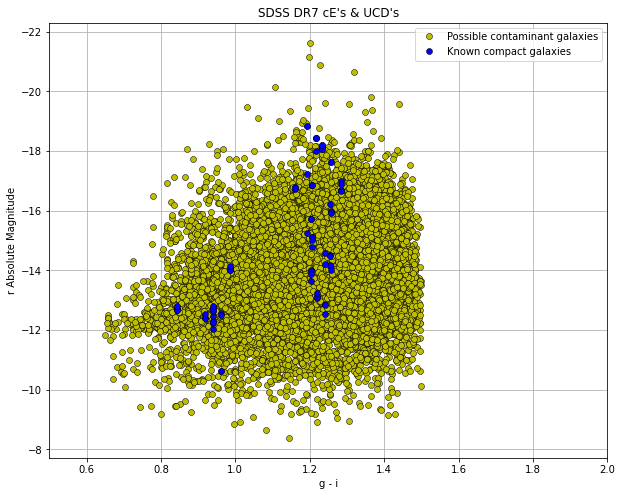

In [43]:
fig1 = plt.figure(figsize=(10,8))

plt.plot(g_i_mag_dr7,mv_r_dr7, 'yo', label = 'Possible contaminant galaxies', markeredgecolor= 'black', markeredgewidth =0.5 , markersize=6)

plt.xlabel('g - i')
plt.ylabel('r Absolute Magnitude')
plt.xlim(0.5,2)
# plt.ylim(-19,-12)
plt.title("SDSS DR7 cE's & UCD's")

plt.plot(g_i_mag_dr7[index_known_dr7],mv_r_dr7[index_known_dr7], 'bo', label = 'Known compact galaxies', markeredgecolor = 'black', markeredgewidth = 0.5, markersize=6)
# plt.plot(g_i_mag_dr7[index_unknown_dr7],mv_r_dr7[index_unknown_dr7], 'ro', label = 'Knsown compact galaxies', markeredgecolor = 'black', markeredgewidth = 0.5, markersize=6)
plt.gca().invert_yaxis()
plt.grid()
plt.legend(loc="upper right")
# plt.savefig('SDSS DR7 cE & UCD.pdf')

In [44]:
print('Total objects (including duplicates):',len(objid_dr7))
objid_filtered_dr7 = []
[objid_filtered_dr7.append(x) for x in objid_dr7 if x not in objid_filtered_dr7]
print('Unique objects:',len(objid_filtered_dr7))
objid_unique_dr7 = np.unique(objid_dr7)

Total objects (including duplicates): 23123
Unique objects: 18787


In [45]:
# finding index of each unique object
index_unique = []
index_b = []
for i in range(len(objid_filtered_dr7)):
    index_c = []
    index_e = []
    
    index_b = np.where(objid_filtered_dr7[i] == objid_dr7)[0]

    index_b = np.array(index_b)

    index_c.extend(index_b)

    index_e.append(index_c[0])

    
    if len(index_c) > 1:
        index_unique += index_e
    else:
        index_unique += index_c
        
index_unique = np.array(index_unique)

In [46]:
# make a link to sdss for each object
link_dr7 = []
for i in range(len(index_unique)):
    url = 'http://cas.sdss.org/dr7/en/tools/explore/obj.asp?id=' + str(objid_dr7[index_unique][i])
    link_dr7.append(url)

In [48]:
# dictionary of lists  
dict = {'objid': objid_dr7[index_unique], 'ra': ra_dr7[index_unique], 'dec': dec_dr7[index_unique], 'g-i': g_mag_dr7[index_unique] - i_mag_dr7[index_unique], 'u-g': u_mag_dr7[index_unique] - g_mag_dr7[index_unique], 'u-z': u_mag_dr7[index_unique] - z_mag_dr7[index_unique], 'g-z': g_mag_dr7[index_unique] - z_mag_dr7[index_unique], 'g-r': g_mag_dr7[index_unique] - r_mag_dr7[index_unique], 'concentration_index': concentration_index_dr7[index_unique], 'photo_z': z_dr7[index_unique], 'frac_dev': fracdev_dr7[index_unique], 'host_galaxy': host_galaxy_list_dr7[index_unique], 'distance': distance_dr7[index_unique], 'axis_ratio': axis_ratio_dr7[index_unique], 'category': category_dr7[index_unique], 'radius': r_pc_dr7[index_unique], 'magnitude': mv_r_dr7[index_unique], 'u_mag': u_mag_dr7[index_unique], 'g_mag': g_mag_dr7[index_unique], 'i_mag': i_mag_dr7[index_unique], 'r_mag': r_mag_dr7[index_unique], 'z_mag': z_mag_dr7[index_unique],  'link': link_dr7}  
df = pd.DataFrame(dict) 
    
# saving the dataframe 
df.to_csv('atlas3d_search_dr7.csv') 

In [ ]:
# df_dr7 = pd.read_csv("dr7_all_search.csv")

In [ ]:
# # %matplotlib qt
# fig1 = plt.figure(figsize=(10,8))
# # sns.set_context("paper", font_scale=3)
# sns.pairplot(df_dr7, 
#              vars = ['photo_z', 'frac_dev', 'concentration_index', 'g-i', 'u-g','u-z','g-z'],
#              corner=True,
#              diag_kind = 'kde', 
#              plot_kws = {'alpha': 0.5, 's': 80, 'edgecolor': 'k'},
#              height = 3);
# # plt.savefig('pairplot_dr7.pdf')
# # Title 
# plt.suptitle('SDSS DR7 pairplots', 
#              size = 30);